In [1]:
import numpy as np
import tifffile
import os
import pickle
import joblib
import pandas as pd
from matplotlib import pyplot as plt
import concurrent.futures
import gc
import json

from scipy.interpolate import griddata 

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import joblib, json, sys, os
from IPython.display import Image, display_png

sys.path.append("../script/")
#from MergeBrain import WholeBrainCells
import matplotlib.pyplot as plt
import pandas as pd

import sys, os, os.path, re, csv, math
import linecache
import numpy as  np
import pandas as pd
from matplotlib import pyplot as plt
from statistics import mean,stdev
import seaborn as sns

import csv
import pprint

#import SimpleITK as sitk
#import ants
import tifffile

In [2]:
base_path =  "/export3/Imaging/ds4_Data5/STARmap_atlas/" 

In [3]:
import pandas as pd

# CSVファイルのパス
color_annotation_csv_path = "/export3/Imaging/ds4_Data5/STARmap_atlas/STARmap_atlas_color_annotation.csv"

# CSVファイルの読み込み
color_annotation_csv = pd.read_csv(color_annotation_csv_path, encoding='ISO-8859-1')

color_annotation_csv


,Nomenclature,Subcluster Symbol,Cell number (total),Cell number (sagittal),Cell number (coronal),Subcluster color code,Main cluster description,Main cluster color code,Marker gene,"Cell type description (maturation, common name etc)",Cell states OR cell types,Allen Mouse Brain Atlas Neuron Nomenclature (Mouse - Whole Cortex & Hippocampus),Subcluster cell count % in its main cluster,Spatial distribution of small excitatory cell clusters in the STARmap PLUS datasets
0,VLM_1-[Ptgds_Slc6a13_Igf2],VLM_1,"24,830","8,854","15,976",1f76b3,Vascular and leptomeningeal cells,#1F77B4,Ptgds_Slc6a13_Igf2,Vascular leptomeningeal cells,Cell type,NaN,82.10%,NaN
1,VLM_2-[Ptgds_Slc47a1_Mgp],VLM_2,"5,398","1,648","3,750",246693,Vascular and leptomeningeal cells,#1F77B4,Ptgds_Slc47a1_Mgp,Vascular leptomeningeal cells,Cell type,NaN,17.90%,NaN
2,PER_1-[Pltp_Pglyrp1],PER_1,"31,128","11,380","19,748",d3a59c,Pericytes,#C49C94,Pltp_Pglyrp1,"Pericytes, possibly mixed with vascular endoth...",Cell type,NaN,67.90%,NaN
3,PER_2-[Pltp_Pglyrp1_Notum],PER_2,"6,772","2,324","4,448",c49c94,Pericytes,#C49C94,Pltp_Pglyrp1_Notum,"Pericytes, Notum high",Cell type,NaN,14.80%,NaN
4,PER_3-[Pltp_Vwf],PER_3,"5,740","1,981","3,759",b2847b,Pericytes,#C49C94,Pltp_Vwf,"Pericytes, Vwf high",Cell type,NaN,12.50%,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,NA_9-[Sfrp2],NA_9,"1,138",429,709,61615b,Unannotated,#D9D9D9,Sfrp2,Sfrp2(+) neuron-like cells,NaN,NaN,N.A.,NaN
227,NA_10-[Irx2],NA_10,"1,030",340,690,575751,Unannotated,#D9D9D9,Irx2,Irx2(+) neuron-like cells,NaN,NaN,N.A.,NaN
228,NA_11-[Hcrtr2_Vamp1_Nefm],NA_11,647,195,452,44443f,Unannotated,#D9D9D9,Hcrtr2_Vamp1_Nefm,Hcrtr2(+) neuron-like cells,NaN,NaN,N.A.,NaN
229,NA_12-[Oprm1_Glra1_Resp18],NA_12,513,162,351,3C3C3C,Unannotated,#D9D9D9,Oprm1_Glra1_Resp18,Oprm1(+) neuron-like cells,NaN,NaN,N.A.,NaN


In [4]:
QC_passed_sample_list = [
"sagittal3",
#"sagittal2",
#"sagittal1",
"well01OB",
"well1_5",
"well01brain",
"well2_5",
"well03",
"well3_5",
"well04",
"well05",
"well11",
"well06",
#"well07",
#"well7_5",
"well08",
"well09",
"well10",
#"well10_5",
#spinalcord
]


In [5]:
# 修正版4
# 25 um Nuclear → Neuronよりも明らかにregister性能よいね。
# sample listに対応するsliceを選択
QC_checked_atlas_list = [
"sagittal_Neuron_atlas/slice_0020.tif",#"sagittal3", → OKとします。
    
#"sagittal_Neuron_atlas/slice_0093.tif",#"sagittal2",  →　ずれ。# あきらめた。
#"sagittal_Neuron_atlas/slice_0135.tif",#"sagittal1",  →　あともう少しでいけそう。おしいかったのに悪化した。# あきらめた。
    
"coronal_Neuron_atlas/slice_0017.tif",#"well01OB",→ OKになった！嗅球
"coronal_Neuron_atlas/slice_0063.tif",#"well1_5", → OKになった！
"coronal_Neuron_atlas/slice_0131.tif",#"well01brain", →　OKになった！
"coronal_Neuron_atlas/slice_0151.tif",#"well2_5", → Okになった！
"coronal_Neuron_atlas/slice_0161.tif",#"well03", →　OKになった！
"coronal_Neuron_atlas/slice_0208.tif",#"well3_5", →　OKになった！
    
"coronal_Neuron_atlas/slice_0233.tif",#"well04",　→ OKとします。
"coronal_Neuron_atlas/slice_0255.tif",#"well05", →　OKになった！
"coronal_Neuron_atlas/slice_0287.tif",#"well11", → OK 
"coronal_Neuron_atlas/slice_0306.tif",#"well06", →　OKになった!
    
#"coronal_Neuron_atlas/slice_0361.tif",#"well07",→　あともう少しかな。おしい。# あきらめた。
#"coronal_Neuron_atlas/slice_0361.tif",#"well7_5", →　ずれ。厳しいか。。消しゴム使ってみた。→無理。あきらめた。


"coronal_Neuron_atlas/slice_0407.tif",#"well08", → OK！
"coronal_Neuron_atlas/slice_0439.tif",#"well09", →　OKとしましょう。
"coronal_Neuron_atlas/slice_0451.tif",#"well10", → OKになった！
    
#"coronal_Neuron_atlas/slice_0511.tif",#"well10_5", →ずれ。まあ無理でしょう。あきらめた。
    
#spinalcord

]

# 及第点だね。angleはかえなかったけど、まあまあうまくいった。
# 左脳もする。docking部位は、真ん中を境にどちらかで、切ればいい。Zの向きには注意。
    

In [6]:
# 修正版4 左脳 version → sagittalは書き換え。232 - slice_num 変換する
# registrationの結果は右脳とほぼ同じでした。

# 25 um Nuclear → Neuronよりも明らかにregister性能よいね。
# sample listに対応するsliceを選択
QC_checked_atlas_list_left = [
"sagittal_Neuron_atlas/slice_0212.tif",#"sagittal3", → OKとします。
    
#"sagittal_Neuron_atlas/slice_0139.tif",#"sagittal2",  →　ずれ。# あきらめた。
#"sagittal_Neuron_atlas/slice_0097.tif",#"sagittal1",  →　あともう少しでいけそう。おしいかったのに悪化した。# あきらめた。
    
"coronal_Neuron_atlas/slice_0017.tif",#"well01OB",→ OKになった！嗅球
"coronal_Neuron_atlas/slice_0063.tif",#"well1_5", → OKになった！
"coronal_Neuron_atlas/slice_0131.tif",#"well01brain", →　OKになった！
"coronal_Neuron_atlas/slice_0151.tif",#"well2_5", → Okになった！
"coronal_Neuron_atlas/slice_0161.tif",#"well03", →　OKになった！
"coronal_Neuron_atlas/slice_0208.tif",#"well3_5", →　OKになった！
    
"coronal_Neuron_atlas/slice_0233.tif",#"well04",　→ OKとします。
"coronal_Neuron_atlas/slice_0255.tif",#"well05", →　OKになった！
"coronal_Neuron_atlas/slice_0287.tif",#"well11", → OK 
"coronal_Neuron_atlas/slice_0306.tif",#"well06", →　OKになった!
    
#"coronal_Neuron_atlas/slice_0361.tif",#"well07",→　あともう少しかな。おしい。# あきらめた。
#"coronal_Neuron_atlas/slice_0361.tif",#"well7_5", →　ずれ。厳しいか。。消しゴム使ってみた。→無理。あきらめた。


"coronal_Neuron_atlas/slice_0407.tif",#"well08", → OK！
"coronal_Neuron_atlas/slice_0439.tif",#"well09", →　OKとしましょう。
"coronal_Neuron_atlas/slice_0451.tif",#"well10", → OKになった！
    
#"coronal_Neuron_atlas/slice_0511.tif",#"well10_5", →ずれ。まあ無理でしょう。あきらめた。
    
#spinalcord

]

# 及第点だね。angleはかえなかったけど、まあまあうまくいった。
# 左脳・右脳のdocking部位は、真ん中を境にどちらかで、切ればいい。Zの向きには注意。

In [7]:
# registerできました。
# 一旦全部読み出して、SCAへmapしてみる
cell_joined_list = []
scale = 1/25

for i in range(len(QC_passed_sample_list)):
    QC_passed_sample = QC_passed_sample_list[i]
    print(QC_passed_sample)

    output_csv_path = base_path + "cluster/" + QC_passed_sample + "_spatial_direction_corrected_um_registered.csv" 
    cell_joined1 = pd.read_csv(output_csv_path)
    
    output_csv_path = base_path + "cluster/" + QC_passed_sample + "_spatial_direction_corrected_um_left_registered.csv"
    cell_joined2 = pd.read_csv(output_csv_path)
    
    cell_joined_list.append(cell_joined1)
    cell_joined_list.append(cell_joined2)

# すべてのデータフレームを連結
all_cell_joined = pd.concat(cell_joined_list, ignore_index=True)
depth_ori = 456 #228#int(np.max(cell_joined['x_section']*scale))+10#int(1140 * (scale /100)) #int(np.max(cell_joined['x_ccf']*scale))+1
height_ori = 320 #160#int(np.max(cell_joined['y_section']*scale))+10 #int( 800 * (scale /100)) #int(np.max(cell_joined['y_ccf']*scale))+1
width_ori = 528 #264 #int(np.max(cell_joined['z_section']*scale))+10 # int(1320 * (scale /100)) #int(np.max(cell_joined['z_ccf']*scale))+1

img_N_ori,_ = np.histogramdd(
np.vstack([
    all_cell_joined["z_SCA"]*scale,
    all_cell_joined["y_SCA"]*scale,
    all_cell_joined["x_SCA"]*scale
    ]).T,
    bins=(height_ori, width_ori,  depth_ori,),
    range=[(0,height_ori),(0,width_ori),(0,depth_ori)]
)   

# 2Dスライスを保存
#tifffile.imsave(
#    "/export3/Imaging/ds4_Data5/STARmap_atlas_analysis/STARmap_to_Atlas_registered_point_density_ver/" + "right_left_all_3D.tif",
#    img_N_ori.astype(np.float32)
#)

sagittal3
well01OB
well1_5
well01brain
well2_5
well03
well3_5
well04
well05
well11
well06
well08
well09
well10


In [9]:
# impute geneをつなげる
import anndata as ad

#del adata_list
#gc.collect()

adata_list = []
adata_combined=[]
for i in range(len(QC_passed_sample_list)):
    QC_passed_sample = QC_passed_sample_list[i]
    print(QC_passed_sample)

    # 右脳
    output_path = base_path + "anndata/" + "imputation_" + QC_passed_sample + ".h5ad"
    adata = ad.read_h5ad(output_path)
    adata.obs = adata.obs.replace([np.inf, -np.inf], np.nan).dropna()
    adata.var = adata.var.replace([np.inf, -np.inf], np.nan).dropna()    
    adata_list.append(adata)

    # 左脳
    output_path = base_path + "anndata/" + "imputation_" + QC_passed_sample + ".h5ad"
    adata = ad.read_h5ad(output_path)
    adata.obs = adata.obs.replace([np.inf, -np.inf], np.nan).dropna()
    adata.var = adata.var.replace([np.inf, -np.inf], np.nan).dropna()    
    adata_list.append(adata)

    del adata
    gc.collect()
adata_combined = ad.concat(adata_list)
del adata_list
gc.collect()

sagittal3
well01OB
well1_5
well01brain
well2_5
well03
well3_5
well04
well05
well11
well06
well08
well09
well10


/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


1342

In [10]:
# Geneを読み込むため
output_path = base_path + "anndata/" + "/imputation_" + QC_passed_sample + ".h5ad"
adata = ad.read_h5ad(output_path)
adata.obs = adata.obs.replace([np.inf, -np.inf], np.nan).dropna()
adata.var = adata.var.replace([np.inf, -np.inf], np.nan).dropna()    

In [11]:
import scanpy as sc
adata_combined.var_names = adata.var['Gene']
# Sub_molecular_cell_typeに基づいて対象の細胞をフィルタリング
sub_types = ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = adata_combined[cell_joined[mask].index, :]

# Gene列をインデックスとして設定
#filtered_adata.var.set_index('Gene', inplace=True)

# DAM genes のリストを取得
file_path_dam = '/export3/Imaging/ds4_Data5/abc_download_root/DAM_list.csv'
DAM_df = pd.read_csv(file_path_dam, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一
#DAM_genes = ["APOE"]

# HC genes のリストを取得
file_path_hc = '/export3/Imaging/ds4_Data5/abc_download_root/HC_list.csv'
HC_df = pd.read_csv(file_path_hc, header=None)
HC_genes = HC_df[0].str.upper().tolist()  # 大文字に統一
#HC_genes = ["P2RY12"]

# 有効なDAM genesとHC genesをフィルタリング
valid_DAM_genes = [gene for gene in DAM_genes if gene in filtered_adata.var_names]
valid_HC_genes = [gene for gene in HC_genes if gene in filtered_adata.var_names]

NameError: name 'cell_joined' is not defined

In [22]:
len(valid_HC_genes)

63

In [11]:
# 神経脱落情報を読み込み
# ここでは、APP Agingを読み込み

dt_final = np.dtype([
    ('X(um)', 'f4'), ('Y(um)', 'f4'), ('Z(um)', 'f4'),
    ('NeuN_positive', 'f4'), ('Iba1_positive', 'f4'), ('atlasID', 'u2'),
    ('id', 'u4'), ('coef', 'f8'), ('adjusted_pvalue', 'f8'),
    ('-log10(adjusted_pvalue)', 'f8'), ('mean_age1', 'f8'), ('mean_age3', 'f8'),
    ('mean_age5', 'f8'), ('mean_age7', 'f8'), ('mean_age9', 'f8'), ('change_point', 'f8')
])

Neuron_data = np.fromfile("/export3/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_APPAge3.bin", dtype=dt_final )
Microglia_data = np.fromfile("/export3/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_APPAge_Iba13.bin", dtype=dt_final )
#Neuron_data = np.fromfile("/export2/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_AgeWithout12m3.bin", dtype=dt_final )
#Microglia_data = np.fromfile("/export2/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_AgeWithout12m_Iba13.bin", dtype=dt_final )

In [12]:
# 神経脱落情報を読み込み
# ここでは、APP Agingを読み込み

dt_final = np.dtype([
    ('X(um)', 'f4'), ('Y(um)', 'f4'), ('Z(um)', 'f4'),
    ('NeuN_positive', 'f4'), ('Iba1_positive', 'f4'), ('atlasID', 'u2'),
    ('id', 'u4'), ('coef', 'f8'), ('adjusted_pvalue', 'f8'),
    ('-log10(adjusted_pvalue)', 'f8'), ('mean_age1', 'f8'), ('mean_age3', 'f8'),
    ('mean_age5', 'f8'), ('mean_age7', 'f8'), ('mean_age9', 'f8'), ('change_point', 'f8')
])

#Neuron_data = np.fromfile("/data4/Cellome/grid_points_with_all_including_onsets_APPAge3.bin", dtype=dt_final )
#Microglia_data = np.fromfile("/data4/Cellome/grid_points_with_all_including_onsets_APPAge_Iba13.bin", dtype=dt_final )
Neuron_data_wt = np.fromfile("/export3/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_AgeWithout12m3.bin", dtype=dt_final )
Microglia_data_wt = np.fromfile("/export3/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_AgeWithout12m_Iba13.bin", dtype=dt_final )

In [14]:
len(Neuron_data_wt)

51614573

In [59]:
Microglia_data

array([(3597.0078, 13127.428  , 4136.108 , 1., 1., 1025,        0, -0.00655663, 0.83308723, 0.07930952, 13.75,  3.5 , 10.  , 14.25      , 5.        , nan),
       (3622.3083, 13137.601  , 4115.5107, 1., 1., 1025,        1,  0.00101399, 0.97794591, 0.00968516, 12.5 ,  3.5 , 10.75, 16.25      , 5.33333333, nan),
       (3587.4238, 13136.515  , 4117.1387, 1., 1., 1025,        2, -0.00677506, 0.82941908, 0.08122598, 12.75,  4.  , 10.  , 14.5       , 4.        , nan),
       ...,
       (7443.6777,   748.061  , 4487.8125, 1., 1., 1016, 51614570, -0.01981605, 0.62985252, 0.20076113, 15.  , 11.25, 25.  , 11.33333333, 5.33333333, nan),
       (7430.819 ,   744.54266, 4494.7197, 1., 1., 1016, 51614571, -0.0172702 , 0.65350879, 0.18474857, 16.5 , 16.75, 28.  , 14.33333333, 7.33333333, nan),
       (7447.537 ,   744.50305, 4503.6787, 1., 1., 1016, 51614572, -0.02615152, 0.56768742, 0.24589073, 19.  ,  9.75, 25.5 , 12.33333333, 5.        , nan)],
      dtype=[('X(um)', '<f4'), ('Y(um)', '<f4'), ('

In [60]:
import pandas as pd
import numpy as np

# データフレームを作成する関数
def create_dataframe(data):
    return pd.DataFrame(data, columns=dt_final.names)

# データフレームの作成
df_neuron = create_dataframe(Neuron_data)
df_microglia = create_dataframe(Microglia_data)
df_neuron_wt = create_dataframe(Neuron_data_wt)
df_microglia_wt = create_dataframe(Microglia_data_wt)

# 減少状態を示す列を追加
df_neuron['APP_Neuron_decrease'] = ((df_neuron['coef'] < 0) & (df_neuron['adjusted_pvalue'] < 0.05)).astype(int)
df_microglia['APP_Microglia_decrease'] = ((df_microglia['coef'] < 0) & (df_microglia['adjusted_pvalue'] < 0.05)).astype(int)
df_microglia['APP_Microglia_increase'] = ((df_microglia['coef'] > 0) & (df_microglia['adjusted_pvalue'] < 0.05)).astype(int)

df_neuron_wt['WT_Neuron_decrease'] = ((df_neuron_wt['coef'] < 0) & (df_neuron_wt['adjusted_pvalue'] < 0.05)).astype(int)
df_microglia_wt['WT_Microglia_decrease'] = ((df_microglia_wt['coef'] < 0) & (df_microglia_wt['adjusted_pvalue'] < 0.05)).astype(int)
df_microglia_wt['WT_Microglia_increase'] = ((df_microglia_wt['coef'] > 0) & (df_microglia_wt['adjusted_pvalue'] < 0.05)).astype(int)

# すべての減少状態を含む1つのデータフレームに統合
df_neuron['APP_Microglia_decrease'] = df_microglia['APP_Microglia_decrease']
df_neuron['APP_Microglia_increase'] = df_microglia['APP_Microglia_increase']
df_neuron['WT_Neuron_decrease'] = df_neuron_wt['WT_Neuron_decrease']
df_neuron['WT_Microglia_decrease'] = df_microglia_wt['WT_Microglia_decrease']
df_neuron['WT_Microglia_increase'] = df_microglia_wt['WT_Microglia_increase']
# 結果の確認
print(df_neuron.head())


         X(um)         Y(um)        Z(um)  NeuN_positive  Iba1_positive  \
0  3597.007812  13127.427734  4136.107910            1.0            1.0   
1  3622.308350  13137.600586  4115.510742            1.0            1.0   
2  3587.423828  13136.514648  4117.138672            1.0            1.0   
3  3596.068604  13148.958008  4097.547363            1.0            1.0   
4  3605.068848  13148.184570  4095.741699            1.0            1.0   

   atlasID  id      coef  adjusted_pvalue  -log10(adjusted_pvalue)  ...  \
0     1025   0 -0.008125         0.780507                 0.107623  ...   
1     1025   1 -0.005040         0.879477                 0.055775  ...   
2     1025   2 -0.010444         0.698963                 0.155546  ...   
3     1025   3 -0.011008         0.705489                 0.151510  ...   
4     1025   4 -0.007670         0.811319                 0.090808  ...   

   mean_age5  mean_age7  mean_age9  change_point  APP_Neuron_decrease  \
0     144.00     143.00  

In [ ]:
# Star mapを可視化

In [61]:
df_neuron

,X(um),Y(um),Z(um),NeuN_positive,Iba1_positive,atlasID,id,coef,adjusted_pvalue,-log10(adjusted_pvalue),...,mean_age5,mean_age7,mean_age9,change_point,APP_Neuron_decrease,APP_Microglia_decrease,APP_Microglia_increase,WT_Neuron_decrease,WT_Microglia_decrease,WT_Microglia_increase
0,3597.007812,13127.427734,4136.107910,1.0,1.0,1025,0,-0.008125,0.780507,0.107623,...,144.00,143.000000,33.250000,NaN,0,0,0,0,0,0
1,3622.308350,13137.600586,4115.510742,1.0,1.0,1025,1,-0.005040,0.879477,0.055775,...,158.25,150.500000,34.250000,NaN,0,0,0,0,0,0
2,3587.423828,13136.514648,4117.138672,1.0,1.0,1025,2,-0.010444,0.698963,0.155546,...,148.25,139.250000,30.750000,NaN,0,0,0,0,0,0
3,3596.068604,13148.958008,4097.547363,1.0,1.0,1025,3,-0.011008,0.705489,0.151510,...,149.00,135.250000,26.500000,NaN,0,0,0,0,0,0
4,3605.068848,13148.184570,4095.741699,1.0,1.0,1025,4,-0.007670,0.811319,0.090808,...,156.25,142.000000,29.000000,NaN,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51614568,7428.811523,748.121277,4478.739258,1.0,1.0,1016,51614568,0.012418,0.665970,0.176545,...,199.75,202.000000,113.000000,NaN,0,0,0,0,0,0
51614569,7466.353516,742.775085,4489.860840,1.0,1.0,1016,51614569,0.007927,0.896213,0.047589,...,146.75,102.666667,28.666667,NaN,0,0,0,0,0,0
51614570,7443.677734,748.060974,4487.812500,1.0,1.0,1016,51614570,0.013400,0.717764,0.144018,...,176.00,160.333333,68.666667,NaN,0,0,0,0,0,0
51614571,7430.818848,744.542664,4494.719727,1.0,1.0,1016,51614571,0.013770,0.690334,0.160940,...,202.75,187.333333,93.333333,NaN,0,0,0,0,0,0


In [63]:
df_neuron['APP_Microglia_decrease'].sum()

4227979

In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats
import datetime
from concurrent.futures import ThreadPoolExecutor, as_completed

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_atlasID'] = ((df['atlasID'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_atlasID'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# 並列処理の対象となる関数
def process_neurotransmitter(neurotransmitter_type):
    odds_ratio_app = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'APP_Microglia_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'WT_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        return log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt
    return None

# 並列処理の実行
results = []
with ThreadPoolExecutor() as executor:
    futures = {executor.submit(process_neurotransmitter, neurotransmitter_type): neurotransmitter_type for neurotransmitter_type in neurotransmitter_types}
    for future in as_completed(futures):
        result = future.result()
        if result is not None:
            results.append(result)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

results_microglia_decrease_atlasID = results.copy()

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


KDtree Start time: 2024-12-28 19:59:00.090844


KeyboardInterrupt: 

Cross tab for CBINH_1 (APP_Microglia_decrease):Cross tab for CHO_6 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979

APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for CBPC (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for CHO_3 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for DEGLU_3 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for GLU_4 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0      

Cross tab for DGGRC (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for GLU_1 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for CHO_6 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for DEGLU_4 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for HABGLU_1 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for DEGLU_1 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      496

Cross tab for INH_2 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for INH_3 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for INH_1 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for MSN_4 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for INH_4 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for INH_5 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      496818

Cross tab for PEP_14 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for PEP_17 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for PEP_18 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for PEP_2 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for PEP_19 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for PEP_16 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0    

Cross tab for SER_4 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for PEP_21 (WT_Microglia_decrease):Cross tab for SER_6 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979

WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for PEP_4 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for PEP_20 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for SER_3 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                   

Cross tab for TEGLU_33 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEGLU_34 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEGLU_4 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEGLU_41 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEGLU_40 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEGLU_35 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                         

Cross tab for TEGLU_9 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEINH_11 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEINH_14 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEINH_12 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEINH_17 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386594  4227979
Cross tab for TEINH_13 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                         

Cross tab for TEINH_29 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for TEINH_3 (WT_Microglia_decrease):Cross tab for TEINH_25 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674

WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for TEINH_30 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for TEINH_31 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681899  1932674
Cross tab for TEINH_4 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0             

KDtree Start time: 2024-09-02 16:18:46.549322
Cross tab for 7 (APP_Microglia_increase):
Cross tab for 35 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351019  2262163
1                           1388        3
APP_Microglia_increase         0        1
is_atlasID                               
0                       49301938  2250265
1                          50469    11901
Cross tab for 66 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351461  2261966
1                            946      200
Cross tab for 17 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49199761  2256514
1                         152646     5652
Cross tab for 59 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                

Cross tab for 10 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51211537  202072
1                        200905      59
Cross tab for 36 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51407310  202131
1                          5132       0
Cross tab for 27 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51407357  202131
1                          5085       0
Cross tab for 50 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51399476  202095
1                         12966      36
Cross tab for 42 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51386827  202065
1                         2561

Cross tab for 102 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49348389  2261615
1                           4018      551
Cross tab for 105 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349772  2262051
1                           2635      115
Cross tab for 100 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351999  2262147
1                            408       19
Cross tab for 115 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352086  2262166
1                            321        0
Cross tab for 106 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       

Cross tab for 131 (APP_Microglia_increase):Cross tab for 133 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49342902  2257420
1                           9505     4746

APP_Microglia_increase         0        1
is_atlasID                               
0                       49269653  2262115
1                          82754       51
Cross tab for 128 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49168608  2254167
1                         183799     7999
Cross tab for 132 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350224  2262166
1                           2183        0
Cross tab for 136 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       

Cross tab for 143 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411494  202118
1                           948      13
Cross tab for 177 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352047  2261347
1                            360      819
Cross tab for 180 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49318233  2262126
1                          34174       40
Cross tab for 173 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49347749  2261511
1                           4658      655
Cross tab for 178 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49327639 

Cross tab for 186 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51386651  201935
1                         25791     196
Cross tab for 181 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51380819  202130
1                         31623       1
Cross tab for 187 (WT_Microglia_increase):Cross tab for 209 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350495  2262081
1                           1912       85

WT_Microglia_increase         0       1
is_atlasID                             
0                      51376816  202131
1                         35626       0
Cross tab for 188 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51405689  202124
1               

Cross tab for 251 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49303807  2262166
1                          48600        0
Cross tab for 249 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49343817  2262166
1                           8590        0
Cross tab for 211 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51342865  202131
1                         69577       0
Cross tab for 252 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49323161  2262166
1                          29246        0
Cross tab for 250 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49319948 

Cross tab for 281 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49345429  2262135
1                           6978       31
Cross tab for 258 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51282435  201747
1                        130007     384
Cross tab for 262 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51348056  202115
1                         64386      16
Cross tab for 288 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49301319  2262072
1                          51088       94
Cross tab for 260 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51410382  202111
1      

Cross tab for 298 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51388765  201805
1                         23677     326
Cross tab for 296 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51357924  202131
1                         54518       0
Cross tab for 330 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350331  2262166
1                           2076        0
Cross tab for 332 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351633  2262129
1                            774       37
Cross tab for 333 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49348731  2262119


Cross tab for 363 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49283131  2262166
1                          69276        0
Cross tab for 335 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51408168  202131
1                          4274       0
Cross tab for 368 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351530  2262166
1                            877        0
Cross tab for 366 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49336230  2260507
1                          16177     1659
Cross tab for 364 (APP_Microglia_increase):Cross tab for 374 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                      

Cross tab for 364 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51405094  202011
1                          7348     120
Cross tab for 423 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49337332  2261369
1                          15075      797
Cross tab for 377 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51400591  202131
1                         11851       0
Cross tab for 427 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317572  2262150
1                          34835       16
Cross tab for 429 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49271202  2229399


Cross tab for 460 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351913  2262150
1                            494       16
Cross tab for 466 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49324075  2260939
1                          28332     1227
Cross tab for 469 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349351  2262166
1                           3056        0
Cross tab for 430 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51168115  202131
1                        244327       0
Cross tab for 477 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49172345 

Cross tab for 512 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317101  2260566
1                          35306     1600
Cross tab for 484 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409483  202130
1                          2959       1
Cross tab for 478 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51351692  202131
1                         60750       0
Cross tab for 515 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49325654  2244866
1                          26753    17300
Cross tab for 526 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49321416  2261952


Cross tab for 575 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49330064  2261947
1                          22343      219
Cross tab for 523 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51369361  201870
1                         43081     261
Cross tab for 525 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51396503  202129
1                         15939       2
Cross tab for 534 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51405071  202095
1                          7371      36
Cross tab for 531 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409539  202128
1               

Cross tab for 599 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49333734  2261449
1                          18673      717
Cross tab for 601 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49340117  2262166
1                          12290        0
Cross tab for 603 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49332132  2259253
1                          20275     2913
Cross tab for 579 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51364414  202130
1                         48028       1
Cross tab for 608 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49327701 

Cross tab for 628 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49344439  2262096
1                           7968       70
Cross tab for 620 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51371282  202131
1                         41160       0
Cross tab for 603 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51389426  201959
1                         23016     172
Cross tab for 614 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51382239  201598
1                         30203     533
Cross tab for 605 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51382498  202076
1               

Cross tab for 634 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51392930  202111
1                         19512      20
Cross tab for 672 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       46978579  2248624
1                        2373828    13542
Cross tab for 629 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51376969  202086
1                         35473      45
Cross tab for 639 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51353518  202127
1                         58924       4
Cross tab for 673 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351567  2262130
1        

Cross tab for 692 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49346221  2261703
1                           6186      463
Cross tab for 696 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49344677  2262166
1                           7730        0
Cross tab for 693 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317684  2243593
1                          34723    18573
Cross tab for 699 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352165  2262166
1                            242        0
Cross tab for 697 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       

Cross tab for 749 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49337659  2261339
1                          14748      827
Cross tab for 697 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51396470  201622
1                         15972     509
Cross tab for 721 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51269544  202131
1                        142898       0
Cross tab for 698 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      50917145  201667
1                        495297     464
Cross tab for 725 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51408349  202131
1               

Cross tab for 783 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49290318  2262166
1                          62089        0
Cross tab for 755 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51375008  202131
1                         37434       0
Cross tab for 795 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49062465  2259450
1                         289942     2716
Cross tab for 794 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49329898  2261675
1                          22509      491
Cross tab for 800 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49319320 

Cross tab for 821 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49079281  2262166
1                         273126        0
Cross tab for 797 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51327383  202062
1                         85059      69
Cross tab for 827 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49318546  2262166
1                          33861        0
Cross tab for 798 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411927  202131
1                           515       0
Cross tab for 831 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49348732  2262166


Cross tab for 820 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51263291  201170
1                        149151     961
Cross tab for 842 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51293373  201860
1                        119069     271
Cross tab for 834 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51390048  202067
1                         22394      64
Cross tab for 854 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49249013  2262166
1                         103394        0
Cross tab for 828 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51273900  202117
1               

Cross tab for 872 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51400743  202064
1                         11699      67
Cross tab for 893 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49340109  2262166
1                          12298        0
Cross tab for 873 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51346630  202131
1                         65812       0
Cross tab for 902 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49333792  2261953
1                          18615      213
Cross tab for 859 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409393  202131
1      

Cross tab for 898 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51385114  201913
1                         27328     218
Cross tab for 945 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49255182  2262166
1                          97225        0
Cross tab for 912 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51368733  202131
1                         43709       0
Cross tab for 946 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49295930  2261700
1                          56477      466
Cross tab for 903 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51405749  202119
1      

Cross tab for 963 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350508  2262083
1                           1899       83
Cross tab for 965 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49240920  2262148
1                         111487       18
Cross tab for 950 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51272442  202131
1                        140000       0
Cross tab for 951 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      50959588  202097
1                        452854      34
Cross tab for 968 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       48919055  2261564


Cross tab for 975 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51410800  202129
1                          1642       2
Cross tab for 966 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51376905  202131
1                         35537       0
Cross tab for 969 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51405108  202130
1                          7334       1
Cross tab for 977 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51384060  202127
1                         28382       4
Cross tab for 1004 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49332042  2260160
1                

Cross tab for 1033 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       48451818  2239414
1                         900589    22752
Cross tab for 1006 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51393794  202131
1                         18648       0
Cross tab for 1038 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49207810  2262166
1                         144597        0
Cross tab for 1037 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49195684  2261526
1                         156723      640
Cross tab for 1009 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51371300  

Cross tab for 1043 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51404203  201979
1                          8239     152
Cross tab for 1044 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51407035  202131
1                          5407       0
Cross tab for 1049 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      50969608  202118
1                        442834      13
Cross tab for 1047 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51234403  202131
1                        178039       0
Cross tab for 1048 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51363526  200653
1                   

Cross tab for 1105 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317943  2262165
1                          34464        1
Cross tab for 1104 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49340996  2261569
1                          11411      597
Cross tab for 1069 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409757  202129
1                          2685       2
Cross tab for 1077 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51402409  202131
1                         10033       0
Cross tab for 1081 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411507  202131
1 

Cross tab for 10671 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350191  2261986
1                           2216      180
Cross tab for 1108 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51396044  202124
1                         16398       7
Cross tab for 10703 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49248374  2252726
1                         104033     9440
Cross tab for 1111 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51381025  202131
1                         31417       0
Cross tab for 1106 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51365002  202131


Cross tab for 31594 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49343393  2262166
1                           9014        0
Cross tab for 31604 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49335350  2262166
1                          17057        0
Cross tab for 18705 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51395679  202131
1                         16763       0
Cross tab for 18697 (WT_Microglia_increase):
Cross tab for 18693 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51401618  202131
1                         10824       0
WT_Microglia_increase         0       1
is_atlasID                             
0                      51378618  2021

Cross tab for 49664 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49341969  2260309
1                          10438     1857
Cross tab for 31608 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51371300  202131
1                         41142       0
Cross tab for 49672 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49345632  2261711
1                           6775      455
Cross tab for 52192 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49331902  2262165
1                          20505        1
Cross tab for 52196 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                      

Cross tab for 52196 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51403992  202131
1                          8450       0
Cross tab for 52264 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51412370  202131
1                            72       0
Cross tab for 54203 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409489  202111
1                          2953      20
Cross tab for 58451 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349903  2261101
1                           2504     1065
Cross tab for 57704 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49340593  2259010

Cross tab for 60659 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51406019  202131
1                          6423       0
Cross tab for 58455 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51410449  202114
1                          1993      17
Cross tab for 58447 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51365686  202131
1                         46756       0
Cross tab for 60842 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51410438  202095
1                          2004      36
Cross tab for 60651 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51393179  202131
1              

/tmp/ipykernel_12671/4223402717.py:90: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


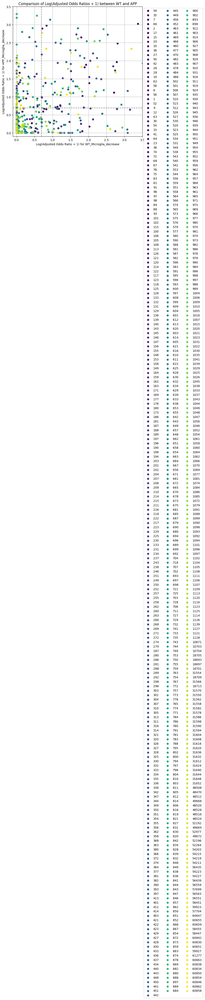

In [178]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats
import datetime
from concurrent.futures import ThreadPoolExecutor, as_completed

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_atlasID'] = ((df['atlasID'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_atlasID'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# 並列処理の対象となる関数
def process_neurotransmitter(neurotransmitter_type):
    odds_ratio_app = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'APP_Microglia_increase')
    odds_ratio_wt = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'WT_Microglia_increase')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        return log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt
    return None

# 並列処理の実行
results = []
with ThreadPoolExecutor() as executor:
    futures = {executor.submit(process_neurotransmitter, neurotransmitter_type): neurotransmitter_type for neurotransmitter_type in neurotransmitter_types}
    for future in as_completed(futures):
        result = future.result()
        if result is not None:
            results.append(result)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

results_microglia_increase_atlasID = results.copy()

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


In [222]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease_atlasID])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease_atlasID])
all_cell_types = set(df_neuron['atlasID'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             549  53
1              53  15
Fisher's Exact Test Results:
Odds Ratio: 2.9316482734069065
P-value: 0.0016587880076071643


In [237]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease_atlasID])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_increase_atlasID])
all_cell_types = set(df_neuron['atlasID'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             537  65
1              65   3
Fisher's Exact Test Results:
Odds Ratio: 0.381301775147929
P-value: 0.9790581316481757


In [158]:
df_neuron["atlasID"].max()

61277

Cross tab for 1 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47378043  4227948
1                           8551       31
Cross tab for 1 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49673317  1932674
1                          8582        0
Cross tab for 2 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47378376  4227403
1                           8218      576
Cross tab for 2 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49675953  1929826
1                          5946     2848
Cross tab for 6 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47369715  4225426
1 

Cross tab for 41 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47350823  4221478
1                          35771     6501
Cross tab for 41 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49644172  1928129
1                         37727     4545
Cross tab for 42 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47360970  4227922
1                          25624       57
Cross tab for 42 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49656219  1932673
1                         25680        1
Cross tab for 50 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47373633  42279

Cross tab for 84 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47344632  4219659
1                          41962     8320
Cross tab for 84 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49633163  1931128
1                         48736     1546
Cross tab for 88 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47314097  4227979
1                          72497        0
Cross tab for 88 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49609433  1932643
1                         72466       31
Cross tab for 91 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47364727  42279

Cross tab for 122 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47380817  4227962
1                           5777       17
Cross tab for 122 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49676106  1932673
1                          5793        1
Cross tab for 123 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47377848  4227979
1                           8746        0
Cross tab for 123 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49673153  1932674
1                          8746        0
Cross tab for 125 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47379560  

Cross tab for 156 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47375534  4221026
1                          11060     6953
Cross tab for 156 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49664454  1932106
1                         17445      568
Cross tab for 158 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47384007  4227978
1                           2587        1
Cross tab for 158 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49679393  1932592
1                          2506       82
Cross tab for 159 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47057634  

Cross tab for 197 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47383619  4227968
1                           2975       11
Cross tab for 197 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49678913  1932674
1                          2986        0
Cross tab for 198 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47385540  4227979
1                           1054        0
Cross tab for 198 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49680848  1932671
1                          1051        3
Cross tab for 201 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47328025  

Cross tab for 230 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47383571  4227979
1                           3023        0
Cross tab for 230 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49678876  1932674
1                          3023        0
Cross tab for 231 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47384911  4227979
1                           1683        0
Cross tab for 231 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49680216  1932674
1                          1683        0
Cross tab for 233 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47371308  

Cross tab for 269 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47371113  4225440
1                          15481     2539
Cross tab for 269 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49665559  1930994
1                         16340     1680
Cross tab for 271 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47382307  4227970
1                           4287        9
Cross tab for 271 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49677609  1932668
1                          4290        6
Cross tab for 272 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47371929  

Cross tab for 311 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47369310  4200360
1                          17284    27619
Cross tab for 311 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49637101  1932569
1                         44798      105
Cross tab for 313 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47079430  4226037
1                         307164     1942
Cross tab for 313 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49374939  1930528
1                        306960     2146
Cross tab for 314 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47366363  

Cross tab for 349 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386221  4227975
1                            373        4
Cross tab for 349 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681522  1932674
1                           377        0
Cross tab for 350 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47385800  4227979
1                            794        0
Cross tab for 350 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49681105  1932674
1                           794        0
Cross tab for 351 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47272831  

Cross tab for 397 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47385536  4227979
1                           1058        0
Cross tab for 397 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49680841  1932674
1                          1058        0
Cross tab for 401 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47376499  4227692
1                          10095      287
Cross tab for 401 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49673215  1930976
1                          8684     1698
Cross tab for 403 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47185211  

Cross tab for 443 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47377752  4226116
1                           8842     1863
Cross tab for 443 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49671542  1932326
1                         10357      348
Cross tab for 445 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47355632  4227979
1                          30962        0
Cross tab for 445 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49650937  1932674
1                         30962        0
Cross tab for 448 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47381783  

Cross tab for 501 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47371309  4226412
1                          15285     1567
Cross tab for 501 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49667224  1930497
1                         14675     2177
Cross tab for 502 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47210887  4203747
1                         175707    24232
Cross tab for 502 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49485769  1928865
1                        196130     3809
Cross tab for 506 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47386380  

Cross tab for 549 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47338710  4227886
1                          47884       93
Cross tab for 549 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49634143  1932453
1                         47756      221
Cross tab for 551 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47366869  4221704
1                          19725     6275
Cross tab for 551 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49655902  1932671
1                         25997        3
Cross tab for 553 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47380679  

Cross tab for 588 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47380122  4226864
1                           6472     1115
Cross tab for 588 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49675704  1931282
1                          6195     1392
Cross tab for 590 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47349754  4199387
1                          36840    28592
Cross tab for 590 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49620576  1928565
1                         61323     4109
Cross tab for 591 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47382350  

Cross tab for 614 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47355858  4227979
1                          30736        0
Cross tab for 614 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49651173  1932664
1                         30726       10
Cross tab for 616 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47359139  4227957
1                          27455       22
Cross tab for 616 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49654458  1932638
1                         27441       36
Cross tab for 620 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47367576  

Cross tab for 654 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47345610  4183770
1                          40984    44209
Cross tab for 654 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49604330  1925050
1                         77569     7624
Cross tab for 655 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47325278  4211111
1                          61316    16868
Cross tab for 655 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49603771  1932618
1                         78128       56
Cross tab for 656 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47323061  

Cross tab for 685 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47350339  4227928
1                          36255       51
Cross tab for 685 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49645645  1932622
1                         36254       52
Cross tab for 687 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47308465  4151449
1                          78129    76530
Cross tab for 687 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49545110  1914804
1                        136789    17870
Cross tab for 689 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47382708  

Cross tab for 727 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47321619  4227831
1                          64975      148
Cross tab for 727 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49620491  1928959
1                         61408     3715
Cross tab for 728 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       46006343  4222444
1                        1380251     5535
Cross tab for 728 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      48307292  1921495
1                       1374607    11179
Cross tab for 729 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47343910  

Cross tab for 772 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47361028  4152112
1                          25566    75867
Cross tab for 772 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49593354  1919786
1                         88545    12888
Cross tab for 773 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47380539  4227979
1                           6055        0
Cross tab for 773 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49675866  1932652
1                          6033       22
Cross tab for 774 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47313799  

Cross tab for 806 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47221349  4196353
1                         165245    31626
Cross tab for 806 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49516191  1901511
1                        165708    31163
Cross tab for 810 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47365500  4204579
1                          21094    23400
Cross tab for 810 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49639301  1930778
1                         42598     1896
Cross tab for 811 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47255314  

Cross tab for 843 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47326799  4227965
1                          59795       14
Cross tab for 843 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49626703  1928061
1                         55196     4613
Cross tab for 844 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47189309  4160952
1                         197285    67027
Cross tab for 844 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49434949  1915312
1                        246950    17362
Cross tab for 846 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47379319  

Cross tab for 878 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47349943  4226663
1                          36651     1316
Cross tab for 878 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49646474  1930132
1                         35425     2542
Cross tab for 880 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47379453  4227938
1                           7141       41
Cross tab for 880 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49674717  1932674
1                          7182        0
Cross tab for 882 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47375519  

Cross tab for 916 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47382979  4227954
1                           3615       25
Cross tab for 916 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49678359  1932574
1                          3540      100
Cross tab for 919 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47331198  4203363
1                          55396    24616
Cross tab for 919 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49605472  1929089
1                         76427     3585
Cross tab for 924 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47375007  

Cross tab for 955 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47360986  4227979
1                          25608        0
Cross tab for 955 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49656291  1932674
1                         25608        0
Cross tab for 956 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47362269  4227090
1                          24325      889
Cross tab for 956 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49657137  1932222
1                         24762      452
Cross tab for 957 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       46502581  

Cross tab for 980 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47372565  4227979
1                          14029        0
Cross tab for 980 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49667870  1932674
1                         14029        0
Cross tab for 981 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47342526  4210102
1                          44068    17877
Cross tab for 981 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49629419  1923209
1                         52480     9465
Cross tab for 982 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47381105  

Cross tab for 1021 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47213565  4189736
1                         173029    38243
Cross tab for 1021 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49483913  1919388
1                        197986    13286
Cross tab for 1022 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47365011  4214422
1                          21583    13557
Cross tab for 1022 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49647119  1932314
1                         34780      360
Cross tab for 1023 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47356

Cross tab for 1048 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49631505  1932674
1                         50394        0
Cross tab for 1049 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       46944096  4227630
1                         442498      349
Cross tab for 1049 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49244379  1927347
1                        437520     5327
Cross tab for 1052 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47355468  4227979
1                          31126        0
Cross tab for 1052 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49650773 

Cross tab for 1086 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47371451  4227485
1                          15143      494
Cross tab for 1086 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49667135  1931801
1                         14764      873
Cross tab for 1088 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47374359  4227979
1                          12235        0
Cross tab for 1088 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49669754  1932584
1                         12145       90
Cross tab for 1089 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47359

Cross tab for 1111 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49651974  1931182
1                         29925     1492
Cross tab for 1113 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47375908  4227918
1                          10686       61
Cross tab for 1113 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49671180  1932646
1                         10719       28
Cross tab for 1114 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47375935  4227649
1                          10659      330
Cross tab for 1114 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49671126 

Cross tab for 18713 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47385453  4227848
1                           1141      131
Cross tab for 18713 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49680720  1932581
1                          1179       93
Cross tab for 31550 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47368324  4225745
1                          18270     2234
Cross tab for 31550 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49667983  1926086
1                         13916     6588
Cross tab for 31554 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       

Cross tab for 31632 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49666770  1932668
1                         15129        6
Cross tab for 31636 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47356955  4225278
1                          29639     2701
Cross tab for 31636 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49651357  1930876
1                         30542     1798
Cross tab for 31640 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47382590  4226991
1                           4004      988
Cross tab for 31640 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      4967

Cross tab for 54203 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47383621  4227979
1                           2973        0
Cross tab for 54203 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49678926  1932674
1                          2973        0
Cross tab for 54211 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47385504  4227979
1                           1090        0
Cross tab for 54211 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49680809  1932674
1                          1090        0
Cross tab for 54215 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       

Cross tab for 60651 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49664865  1930445
1                         17034     2229
Cross tab for 60655 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47383479  4227650
1                           3115      329
Cross tab for 60655 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      49678888  1932241
1                          3011      433
Cross tab for 60659 (APP_Microglia_decrease):
APP_Microglia_decrease         0        1
is_atlasID                               
0                       47380173  4227977
1                           6421        2
Cross tab for 60659 (WT_Microglia_decrease):
WT_Microglia_decrease         0        1
is_atlasID                              
0                      4967

/tmp/ipykernel_47572/3541036411.py:74: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


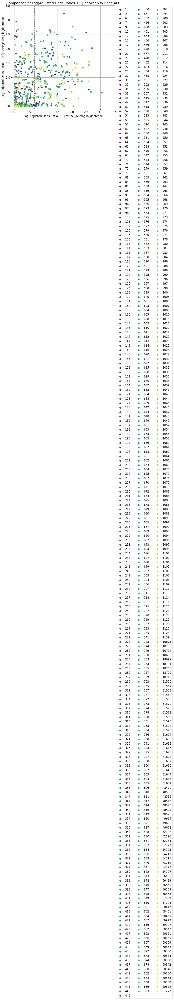

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_atlasID'] = ((df['atlasID'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_atlasID'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(df_neuron['atlasID'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'APP_Microglia_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'WT_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))


results_microglia_decrease_atlasID = results.copy()

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for 1 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49344565  2261426
1                           7842      740
Cross tab for 1 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51404308  201683
1                          8134     448
Cross tab for 2 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49343613  2262166
1                           8794        0
Cross tab for 2 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51403648  202131
1                          8794       0
Cross tab for 6 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49333030  2262111
1         

Cross tab for 41 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49310135  2262166
1                          42272        0
Cross tab for 41 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51370170  202131
1                         42272       0
Cross tab for 42 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49326784  2262108
1                          25623       58
Cross tab for 42 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51386827  202065
1                         25615      66
Cross tab for 50 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49339489  2262082
1    

Cross tab for 84 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49302125  2262166
1                          50282        0
Cross tab for 84 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51362160  202131
1                         50282       0
Cross tab for 88 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49295220  2246856
1                          57187    15310
Cross tab for 88 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51340021  202055
1                         72421      76
Cross tab for 91 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49330689  2261976
1    

Cross tab for 122 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49346700  2262079
1                           5707       87
Cross tab for 122 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51406671  202108
1                          5771      23
Cross tab for 123 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49345638  2260189
1                           6769     1977
Cross tab for 123 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51403922  201905
1                          8520     226
Cross tab for 125 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49344830  2262111


Cross tab for 156 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49334394  2262166
1                          18013        0
Cross tab for 156 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51394429  202131
1                         18013       0
Cross tab for 158 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349823  2262162
1                           2584        4
Cross tab for 158 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409857  202128
1                          2585       3
Cross tab for 159 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       48963967  2260346


Cross tab for 197 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349427  2262160
1                           2980        6
Cross tab for 197 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409464  202123
1                          2978       8
Cross tab for 198 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352186  2261333
1                            221      833
Cross tab for 198 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411388  202131
1                          1054       0
Cross tab for 201 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49170444  2262166


Cross tab for 230 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350429  2261121
1                           1978     1045
Cross tab for 230 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51409427  202123
1                          3015       8
Cross tab for 231 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350728  2262162
1                           1679        4
Cross tab for 231 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51410850  202040
1                          1592      91
Cross tab for 233 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49336201  2262166


Cross tab for 269 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49334421  2262132
1                          17986       34
Cross tab for 269 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51394422  202131
1                         18020       0
Cross tab for 271 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49348139  2262138
1                           4268       28
Cross tab for 271 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51408146  202131
1                          4296       0
Cross tab for 272 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49343546  2256352


Cross tab for 311 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49307506  2262164
1                          44901        2
Cross tab for 311 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51367683  201987
1                         44759     144
Cross tab for 313 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49057361  2248106
1                         295046    14060
Cross tab for 313 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51104068  201399
1                        308374     732
Cross tab for 314 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317388  2262166


Cross tab for 349 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352049  2262147
1                            358       19
Cross tab for 349 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51412065  202131
1                           377       0
Cross tab for 350 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351613  2262166
1                            794        0
Cross tab for 350 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411648  202131
1                           794       0
Cross tab for 351 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49246031  2250757


Cross tab for 397 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351349  2262166
1                           1058        0
Cross tab for 397 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411384  202131
1                          1058       0
Cross tab for 401 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49342025  2262166
1                          10382        0
Cross tab for 401 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51402060  202131
1                         10382       0
Cross tab for 403 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49169109  2243793


Cross tab for 443 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49341858  2262010
1                          10549      156
Cross tab for 443 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51401737  202131
1                         10705       0
Cross tab for 445 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49334576  2249035
1                          17831    13131
Cross tab for 445 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51385667  197944
1                         26775    4187
Cross tab for 448 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49347387  2262145


Cross tab for 501 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49335555  2262166
1                          16852        0
Cross tab for 501 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51395590  202131
1                         16852       0
Cross tab for 502 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49154247  2260387
1                         198160     1779
Cross tab for 502 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51212503  202131
1                        199939       0
Cross tab for 506 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352196  2262163


Cross tab for 549 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49305996  2260600
1                          46411     1566
Cross tab for 549 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51364478  202118
1                         47964      13
Cross tab for 551 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49326429  2262144
1                          25978       22
Cross tab for 551 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51386928  201645
1                         25514     486
Cross tab for 553 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49347921  2260733


Cross tab for 588 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49344863  2262123
1                           7544       43
Cross tab for 588 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51404855  202131
1                          7587       0
Cross tab for 590 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49286975  2262166
1                          65432        0
Cross tab for 590 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51347010  202131
1                         65432       0
Cross tab for 591 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49348185  2262144


Cross tab for 614 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49335159  2248678
1                          17248    13488
Cross tab for 614 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51382239  201598
1                         30203     533
Cross tab for 616 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49326418  2260678
1                          25989     1488
Cross tab for 616 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51385107  201989
1                         27335     142
Cross tab for 620 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49311248  2262165


Cross tab for 654 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49267214  2262166
1                          85193        0
Cross tab for 654 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51327249  202131
1                         85193       0
Cross tab for 655 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49274306  2262083
1                          78101       83
Cross tab for 655 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51334697  201692
1                         77745     439
Cross tab for 656 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49287610  2262042


Cross tab for 685 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317903  2260364
1                          34504     1802
Cross tab for 685 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51376136  202131
1                         36306       0
Cross tab for 687 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49197748  2262166
1                         154659        0
Cross tab for 687 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51257783  202131
1                        154659       0
Cross tab for 689 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349283  2261404


Cross tab for 727 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49288014  2261436
1                          64393      730
Cross tab for 727 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51347320  202130
1                         65122       1
Cross tab for 728 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       48001065  2227722
1                        1351342    34444
Cross tab for 728 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      50030716  198071
1                       1381726    4060
Cross tab for 729 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49302688  2262163


Cross tab for 772 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49250975  2262165
1                         101432        1
Cross tab for 772 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51311012  202128
1                        101430       3
Cross tab for 773 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349484  2259034
1                           2923     3132
Cross tab for 773 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51406387  202131
1                          6055       0
Cross tab for 774 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49273100  2262165


Cross tab for 806 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49155571  2262131
1                         196836       35
Cross tab for 806 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51215571  202131
1                        196871       0
Cross tab for 810 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49307915  2262164
1                          44492        2
Cross tab for 810 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51367948  202131
1                         44494       0
Cross tab for 811 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49235392  2247901


Cross tab for 843 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49294164  2260600
1                          58243     1566
Cross tab for 843 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51352633  202131
1                         59809       0
Cross tab for 844 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49088095  2262166
1                         264312        0
Cross tab for 844 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51148130  202131
1                        264312       0
Cross tab for 846 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49345300  2261998


Cross tab for 878 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49314445  2262161
1                          37962        5
Cross tab for 878 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51374477  202129
1                         37965       2
Cross tab for 880 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49345225  2262166
1                           7182        0
Cross tab for 880 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51405330  202061
1                          7112      70
Cross tab for 882 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49339775  2262166


Cross tab for 916 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49348791  2262142
1                           3616       24
Cross tab for 916 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51408803  202130
1                          3639       1
Cross tab for 919 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49272395  2262166
1                          80012        0
Cross tab for 919 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51332430  202131
1                         80012       0
Cross tab for 924 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49339937  2262063


Cross tab for 955 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49344508  2244457
1                           7899    17709
Cross tab for 955 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51387797  201168
1                         24645     963
Cross tab for 956 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49327270  2262089
1                          25137       77
Cross tab for 956 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51387232  202127
1                         25210       4
Cross tab for 957 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       48482334  2246673


Cross tab for 980 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49339355  2261189
1                          13052      977
Cross tab for 980 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51398413  202131
1                         14029       0
Cross tab for 981 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49290465  2262163
1                          61942        3
Cross tab for 981 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51350497  202131
1                         61945       0
Cross tab for 982 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49346997  2262078


Cross tab for 1021 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49141135  2262166
1                         211272        0
Cross tab for 1021 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51201170  202131
1                        211272       0
Cross tab for 1022 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49317267  2262166
1                          35140        0
Cross tab for 1022 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51377325  202108
1                         35117      23
Cross tab for 1023 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49305913  226

Cross tab for 1049 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       48939359  2232367
1                         413048    29799
Cross tab for 1049 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      50969608  202118
1                        442834      13
Cross tab for 1052 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49322020  2261427
1                          30387      739
Cross tab for 1052 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51381434  202013
1                         31008     118
Cross tab for 1054 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49328379  226

Cross tab for 1088 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49341121  2261217
1                          11286      949
Cross tab for 1088 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51400207  202131
1                         12235       0
Cross tab for 1089 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49324997  2261837
1                          27410      329
Cross tab for 1089 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51384728  202106
1                         27714      25
Cross tab for 1090 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49209950  226

Cross tab for 1114 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49341418  2262166
1                          10989        0
Cross tab for 1114 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51401453  202131
1                         10989       0
Cross tab for 1116 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351873  2262153
1                            534       13
Cross tab for 1116 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411895  202131
1                           547       0
Cross tab for 1120 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349198  226

Cross tab for 31554 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49291575  2262161
1                          60832        5
Cross tab for 31554 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51351605  202131
1                         60837       0
Cross tab for 31558 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49334576  2262165
1                          17831        1
Cross tab for 31558 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51394610  202131
1                         17832       0
Cross tab for 31562 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49320676

Cross tab for 31644 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49329487  2261761
1                          22920      405
Cross tab for 31644 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51389117  202131
1                         23325       0
Cross tab for 31648 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49333488  2261877
1                          18919      289
Cross tab for 31648 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51393234  202131
1                         19208       0
Cross tab for 31652 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350255

Cross tab for 54219 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49352251  2262158
1                            156        8
Cross tab for 54219 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51412278  202131
1                           164       0
Cross tab for 54223 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49350922  2261533
1                           1485      633
Cross tab for 54223 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51410502  201953
1                          1940     178
Cross tab for 54227 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351316

Cross tab for 60830 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49351212  2262136
1                           1195       30
Cross tab for 60830 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51411217  202131
1                          1225       0
Cross tab for 60834 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49346171  2261259
1                           6236      907
Cross tab for 60834 (WT_Microglia_increase):
WT_Microglia_increase         0       1
is_atlasID                             
0                      51406654  200776
1                          5788    1355
Cross tab for 60838 (APP_Microglia_increase):
APP_Microglia_increase         0        1
is_atlasID                               
0                       49349348

/tmp/ipykernel_47572/4101771361.py:74: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


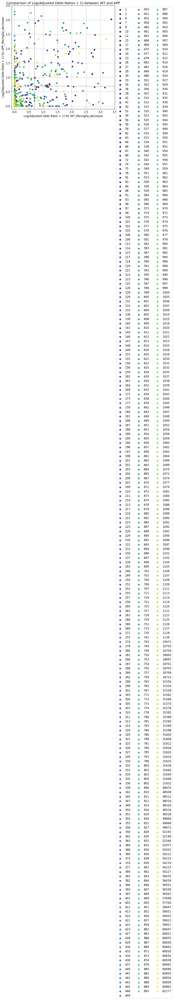

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_atlasID'] = ((df['atlasID'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_atlasID'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(df_neuron['atlasID'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'APP_Microglia_increase')
    odds_ratio_wt = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'WT_Microglia_increase')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))


results_microglia_increase_atlasID = results.copy()

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for 1 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48525647  3080344
1                        8318      264
Cross tab for 1 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50412975  1193016
1                       8353      229
Cross tab for 2 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48525482  3080297
1                        8483      311
Cross tab for 2 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50412690  1193089
1                       8638      156
Cross tab for 6 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48517828  3077313
1                       16137     3295
Cross tab for 6 (WT_Neuron_decrease

Cross tab for 42 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50396699  1192193
1                      24629     1052
Cross tab for 50 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48521188  3080383
1                       12777      225
Cross tab for 50 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50408386  1193185
1                      12942       60
Cross tab for 52 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48472114  3076752
1                       61851     3856
Cross tab for 52 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50357797  1191069
1                      63531     2176
Cross tab for 54 (APP_Neuron_decrea

Cross tab for 93 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533395  3080387
1                         570      221
Cross tab for 93 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50420542  1193240
1                        786        5
Cross tab for 96 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48473520  3079992
1                       60445      616
Cross tab for 96 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50361027  1192485
1                      60301      760
Cross tab for 97 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48514184  3077620
1                       19781     2988
Cross tab for 97 (WT_Neuron_de

Cross tab for 128 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50234015  1188760
1                     187313     4485
Cross tab for 129 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48509020  3077002
1                       24945     3606
Cross tab for 129 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50395843  1190179
1                      25485     3066
Cross tab for 131 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48455374  3076394
1                       78591     4214
Cross tab for 131 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50338770  1192998
1                      82558      247
Cross tab for 132 (APP_Neuron_

Cross tab for 169 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48523682  3080597
1                       10283       11
Cross tab for 169 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50411034  1193245
1                      10294        0
Cross tab for 171 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48525372  3079635
1                        8593      973
Cross tab for 171 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50413925  1191082
1                       7403     2163
Cross tab for 173 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48529636  3079624
1                        4329      984
Cross tab for 173 (WT_Neu

Cross tab for 207 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50418200  1193244
1                       3128        1
Cross tab for 209 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48532082  3080494
1                        1883      114
Cross tab for 209 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50419331  1193245
1                       1997        0
Cross tab for 210 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48528737  3079518
1                        5228     1090
Cross tab for 210 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50415687  1192568
1                       5641      677
Cross tab for 211 (APP_Neuron_

Cross tab for 250 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48505546  3075970
1                       28419     4638
Cross tab for 250 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50389053  1192463
1                      32275      782
Cross tab for 251 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48485737  3080236
1                       48228      372
Cross tab for 251 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50372844  1193129
1                      48484      116
Cross tab for 252 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48506489  3078838
1                       27476     1770
Cross tab for 252 (WT_Neu

Cross tab for 289 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50368326  1173446
1                      53002    19799
Cross tab for 292 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48532513  3080472
1                        1452      136
Cross tab for 292 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50419740  1193245
1                       1588        0
Cross tab for 296 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48493273  3066782
1                       40692    13826
Cross tab for 296 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50367245  1192810
1                      54083      435
Cross tab for 298 (APP_Neuron_

Cross tab for 333 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48530319  3080531
1                        3646       77
Cross tab for 333 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50417621  1193229
1                       3707       16
Cross tab for 334 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48489070  3071662
1                       44895     8946
Cross tab for 334 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50367707  1193025
1                      53621      220
Cross tab for 335 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48530624  3079675
1                        3341      933
Cross tab for 335 (WT_Neu

Cross tab for 374 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50413949  1193156
1                       7379       89
Cross tab for 377 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48522789  3079933
1                       11176      675
Cross tab for 377 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50409491  1193231
1                      11837       14
Cross tab for 380 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533575  3080608
1                         390        0
Cross tab for 380 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50420938  1193245
1                        390        0
Cross tab for 381 (APP_Neuron_

Cross tab for 436 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48526110  3080112
1                        7855      496
Cross tab for 436 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50413255  1192967
1                       8073      278
Cross tab for 437 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48442542  3073006
1                       91423     7602
Cross tab for 437 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50323072  1192476
1                      98256      769
Cross tab for 440 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48505515  3071893
1                       28450     8715
Cross tab for 440 (WT_Neu

Cross tab for 482 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50415606  1193011
1                       5722      234
Cross tab for 483 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48491611  3078039
1                       42354     2569
Cross tab for 483 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50383082  1186568
1                      38246     6677
Cross tab for 484 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48531022  3080591
1                        2943       17
Cross tab for 484 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50418556  1193057
1                       2772      188
Cross tab for 488 (APP_Neuron_

Cross tab for 543 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48483568  3065593
1                       50397    15015
Cross tab for 543 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50358567  1190594
1                      62761     2651
Cross tab for 544 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48510514  3077798
1                       23451     2810
Cross tab for 544 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50395208  1193104
1                      26120      141
Cross tab for 549 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48500639  3065957
1                       33326    14651
Cross tab for 549 (WT_Neu

Cross tab for 587 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50415747  1193093
1                       5581      152
Cross tab for 588 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48526837  3080149
1                        7128      459
Cross tab for 588 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50413847  1193139
1                       7481      106
Cross tab for 590 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48485074  3064067
1                       48891    16541
Cross tab for 590 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50357443  1191698
1                      63885     1547
Cross tab for 591 (APP_Neuron_

Cross tab for 616 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48509947  3077149
1                       24018     3459
Cross tab for 616 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50394378  1192718
1                      26950      527
Cross tab for 620 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48508681  3064732
1                       25284    15876
Cross tab for 620 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50381960  1191453
1                      39368     1792
Cross tab for 621 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48529382  3080040
1                        4583      568
Cross tab for 621 (WT_Neu

Cross tab for 656 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50358747  1190905
1                      62581     2340
Cross tab for 657 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48402676  3080163
1                      131289      445
Cross tab for 657 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50293002  1189837
1                     128326     3408
Cross tab for 658 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48514599  3076849
1                       19366     3759
Cross tab for 658 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50398581  1192867
1                      22747      378
Cross tab for 661 (APP_Neuron_

Cross tab for 692 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48527858  3080066
1                        6107      542
Cross tab for 692 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50414694  1193230
1                       6634       15
Cross tab for 693 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48481344  3079933
1                       52621      675
Cross tab for 693 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50368755  1192522
1                      52573      723
Cross tab for 694 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48512797  3079894
1                       21168      714
Cross tab for 694 (WT_Neu

Cross tab for 735 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50394285  1193232
1                      27043       13
Cross tab for 741 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48529211  3072183
1                        4754     8425
Cross tab for 741 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50412641  1188753
1                       8687     4492
Cross tab for 743 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48462104  3079868
1                       71861      740
Cross tab for 743 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50350591  1191381
1                      70737     1864
Cross tab for 744 (APP_Neuron_

Cross tab for 784 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533183  3080600
1                         782        8
Cross tab for 784 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50420538  1193245
1                        790        0
Cross tab for 786 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48528548  3080444
1                        5417      164
Cross tab for 786 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50416622  1192370
1                       4706      875
Cross tab for 788 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48482254  3079154
1                       51711     1454
Cross tab for 788 (WT_Neu

Cross tab for 821 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50149018  1192429
1                     272310      816
Cross tab for 827 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48530013  3050699
1                        3952    29909
Cross tab for 827 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50387599  1193113
1                      33729      132
Cross tab for 828 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48422723  3053294
1                      111242    27314
Cross tab for 828 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50303423  1172594
1                     117905    20651
Cross tab for 830 (APP_Neuron_

Cross tab for 857 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48505110  3068515
1                       28855    12093
Cross tab for 857 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50399177  1174448
1                      22151    18797
Cross tab for 859 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48531697  3079827
1                        2268      781
Cross tab for 859 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50418282  1193242
1                       3046        3
Cross tab for 862 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48371059  3063605
1                      162906    17003
Cross tab for 862 (WT_Neu

Cross tab for 903 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50414628  1193240
1                       6700        5
Cross tab for 905 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48511472  3080589
1                       22493       19
Cross tab for 905 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50398816  1193245
1                      22512        0
Cross tab for 906 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48490218  3076627
1                       43747     3981
Cross tab for 906 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50373650  1193195
1                      47678       50
Cross tab for 907 (APP_Neuron_

Cross tab for 945 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48438420  3078928
1                       95545     1680
Cross tab for 945 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50324162  1193186
1                      97166       59
Cross tab for 946 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48482738  3074892
1                       51227     5716
Cross tab for 946 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50364421  1193209
1                      56907       36
Cross tab for 949 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533940  3080608
1                          25        0
Cross tab for 949 (WT_Neu

Cross tab for 973 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50389030  1193242
1                      32298        3
Cross tab for 974 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48469022  3063714
1                       64943    16894
Cross tab for 974 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50355597  1177139
1                      65731    16106
Cross tab for 975 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533145  3079784
1                         820      824
Cross tab for 975 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50419708  1193221
1                       1620       24
Cross tab for 976 (APP_Neuron_

Cross tab for 1010 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48521646  3080600
1                       12319        8
Cross tab for 1010 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50410316  1191930
1                      11012     1315
Cross tab for 1015 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48453104  3059478
1                       80861    21130
Cross tab for 1015 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50328828  1183754
1                      92500     9491
Cross tab for 1016 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48429183  3078981
1                      104782     1627
Cross tab for 1016 (

Cross tab for 1046 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48515859  3080537
1                       18106       71
Cross tab for 1046 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50403157  1193239
1                      18171        6
Cross tab for 1047 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48358384  3078150
1                      175581     2458
Cross tab for 1047 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50244162  1192372
1                     177166      873
Cross tab for 1048 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48483781  3080398
1                       50184      210
Cross tab for 1048 (

Cross tab for 1085 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48527898  3080207
1                        6067      401
Cross tab for 1085 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50414861  1193244
1                       6467        1
Cross tab for 1086 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48518827  3080109
1                       15138      499
Cross tab for 1086 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50405833  1193103
1                      15495      142
Cross tab for 1088 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48531546  3070792
1                        2419     9816
Cross tab for 1088 (

Cross tab for 1113 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48524704  3079122
1                        9261     1486
Cross tab for 1113 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50410625  1193201
1                      10703       44
Cross tab for 1114 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48522976  3080608
1                       10989        0
Cross tab for 1114 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50410339  1193245
1                      10989        0
Cross tab for 1116 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533418  3080608
1                         547        0
Cross tab for 1116 (

Cross tab for 31554 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48474508  3079228
1                       59457     1380
Cross tab for 31554 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50361519  1192217
1                      59809     1028
Cross tab for 31558 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48516149  3080592
1                       17816       16
Cross tab for 31558 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50403560  1193181
1                      17768       64
Cross tab for 31562 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48504832  3078010
1                       29133     2598
Cross tab for 3

Cross tab for 31648 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48516713  3078652
1                       17252     1956
Cross tab for 31648 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50402415  1192950
1                      18913      295
Cross tab for 31652 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48531893  3080528
1                        2072       80
Cross tab for 31652 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50419289  1193132
1                       2039      113
Cross tab for 48470 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48457868  3078132
1                       76097     2476
Cross tab for 4

Cross tab for 54227 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48532790  3080512
1                        1175       96
Cross tab for 54227 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50420073  1193229
1                       1255       16
Cross tab for 56435 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48529435  3071113
1                        4530     9495
Cross tab for 56435 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50409151  1191397
1                      12177     1848
Cross tab for 56439 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48532963  3080207
1                        1002      401
Cross tab for 5

Cross tab for 60842 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48532810  3079723
1                        1155      885
Cross tab for 60842 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50419731  1192802
1                       1597      443
Cross tab for 60846 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48531134  3080221
1                        2831      387
Cross tab for 60846 (WT_Neuron_decrease):
WT_Neuron_decrease         0        1
is_atlasID                           
0                   50418146  1193209
1                       3182       36
Cross tab for 60850 (APP_Neuron_decrease):
APP_Neuron_decrease         0        1
is_atlasID                            
0                    48533120  3080343
1                         845      265
Cross tab for 6

/tmp/ipykernel_47572/2972022241.py:74: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


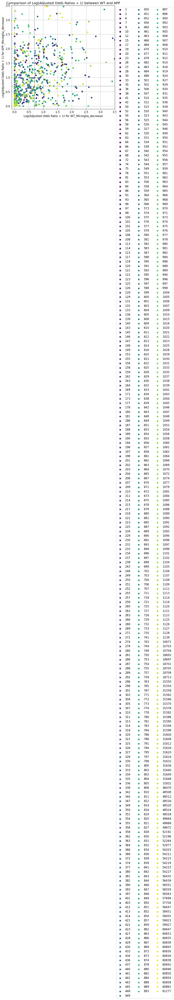

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_atlasID'] = ((df['atlasID'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_atlasID'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(df_neuron['atlasID'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(df_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))


results_neuron_decrease_atlasID = results.copy()

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


In [150]:
sorted(df_neuron['atlasID'].dropna().unique())

[1,
 2,
 6,
 7,
 9,
 10,
 12,
 15,
 17,
 19,
 20,
 23,
 26,
 27,
 28,
 30,
 33,
 35,
 36,
 38,
 41,
 42,
 50,
 52,
 54,
 56,
 58,
 59,
 62,
 63,
 64,
 66,
 67,
 68,
 72,
 74,
 75,
 78,
 81,
 83,
 84,
 88,
 91,
 93,
 96,
 97,
 98,
 100,
 101,
 102,
 105,
 106,
 108,
 113,
 114,
 115,
 117,
 118,
 120,
 121,
 122,
 123,
 125,
 126,
 128,
 129,
 131,
 132,
 133,
 136,
 139,
 140,
 143,
 145,
 146,
 147,
 148,
 149,
 153,
 155,
 156,
 158,
 159,
 162,
 163,
 164,
 169,
 171,
 173,
 177,
 178,
 180,
 181,
 186,
 187,
 188,
 189,
 190,
 194,
 196,
 197,
 198,
 201,
 202,
 203,
 204,
 206,
 207,
 209,
 210,
 211,
 214,
 215,
 217,
 218,
 222,
 223,
 225,
 226,
 229,
 230,
 231,
 233,
 234,
 237,
 238,
 243,
 246,
 249,
 250,
 251,
 252,
 255,
 257,
 258,
 260,
 262,
 263,
 266,
 268,
 269,
 271,
 272,
 274,
 279,
 280,
 281,
 286,
 287,
 288,
 289,
 292,
 296,
 298,
 301,
 303,
 304,
 305,
 307,
 310,
 311,
 313,
 314,
 318,
 320,
 321,
 325,
 326,
 327,
 328,
 330,
 332,
 333,
 334,
 335,
 3

In [148]:
neurotransmitter_types

['CBGRC_1',
 'CBGRC_2',
 'CBINH_1',
 'CBINH_2',
 'CBPC',
 'CHO_1',
 'CHO_2',
 'CHO_3',
 'CHO_4',
 'CHO_5',
 'CHO_6',
 'DEGLU_1',
 'DEGLU_2',
 'DEGLU_3',
 'DEGLU_4',
 'DEGLU_5',
 'DEGLU_6',
 'DEINH_1',
 'DGGRC',
 'DOP_1',
 'DOP_2',
 'GLU_1',
 'GLU_2',
 'GLU_3',
 'GLU_4',
 'HABCHO_1',
 'HABCHO_2',
 'HABCHO_3',
 'HABGLU_1',
 'HA_1',
 'HBGLU_1',
 'HBGLU_2',
 'HBINH_1',
 'INH_1',
 'INH_10',
 'INH_11',
 'INH_12',
 'INH_2',
 'INH_3',
 'INH_4',
 'INH_5',
 'INH_6',
 'INH_7',
 'INH_8',
 'INH_9',
 'MEGLU_1',
 'MEGLU_2',
 'MEGLU_3',
 'MEGLU_4',
 'MEGLU_5',
 'MEGLU_6',
 'MEINH_1',
 'MEINH_2',
 'MEINH_3',
 'MSN_1',
 'MSN_10',
 'MSN_11',
 'MSN_12',
 'MSN_13',
 'MSN_14',
 'MSN_2',
 'MSN_3',
 'MSN_4',
 'MSN_5',
 'MSN_6',
 'MSN_7',
 'MSN_8',
 'MSN_9',
 'OBINH_1',
 'OBINH_2',
 'OBINH_3',
 'OBINH_4',
 'OBINH_5',
 'OBINH_6',
 'OBINH_7',
 'PEP_1',
 'PEP_10',
 'PEP_11',
 'PEP_12',
 'PEP_13',
 'PEP_14',
 'PEP_15',
 'PEP_16',
 'PEP_17',
 'PEP_18',
 'PEP_19',
 'PEP_2',
 'PEP_20',
 'PEP_21',
 'PEP_22',
 'PEP_23'

In [14]:
# 新しいカラムを追加し、初期値を0に設定

new_columns = ['APP_Neuron_decrease', 'APP_Microglia_decrease', 'APP_Microglia_increase',  'WT_Neuron_decrease', 'WT_Microglia_decrease','WT_Microglia_increase',]
for col in new_columns:
    all_cell_joined[col] = 0

cell_joined = all_cell_joined.copy()

In [15]:
cell_joined.shape

(1482658, 21)

In [35]:

import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime

#cell_joined = all_cell_joined.copy()

# 対象となるNeuron_dataのフィルタリング
target_data = Neuron_data[(Neuron_data['coef'] < 0) & (Neuron_data['adjusted_pvalue'] < 0.05)].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1

# 最終的にデータフレームに代入
cell_joined_cleaned['APP_Neuron_decrease'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['APP_Neuron_decrease'] = 0
cell_joined.loc[cell_joined_cleaned.index, 'APP_Neuron_decrease'] = cell_joined_cleaned['APP_Neuron_decrease']

# 結果を表示（必要に応じて）
print(cell_joined['APP_Neuron_decrease'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)



KDtree Start time: 2024-12-28 19:30:25.660298
KDtree End time: 2024-12-28 19:30:37.219958
Duration: 0:00:11.559660
0    960958
1    521700
Name: APP_Neuron_decrease, dtype: int64
KDtree End time2: 2024-12-28 19:30:37.797145
Duration: 0:00:12.136847


In [36]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime


# 対象となるNeuron_dataのフィルタリング
target_data = Microglia_data[(Microglia_data['coef'] < 0) & (Microglia_data['adjusted_pvalue'] < 0.05)].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1

# 最終的にデータフレームに代入
cell_joined_cleaned['APP_Microglia_decrease'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['APP_Microglia_decrease'] = 0
cell_joined.loc[cell_joined_cleaned.index, 'APP_Microglia_decrease'] = cell_joined_cleaned['APP_Microglia_decrease']

# 結果を表示（必要に応じて）
print(cell_joined['APP_Microglia_decrease'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)


KDtree Start time: 2024-12-28 19:30:42.819941
KDtree End time: 2024-12-28 19:30:57.677454
Duration: 0:00:14.857513
0    1006458
1     476200
Name: APP_Microglia_decrease, dtype: int64
KDtree End time2: 2024-12-28 19:30:58.110348
Duration: 0:00:15.290407


In [37]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime


# 対象となるNeuron_dataのフィルタリング
target_data = Microglia_data[(Microglia_data['coef'] > 0) & (Microglia_data['adjusted_pvalue'] < 0.05)].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1

# 最終的にデータフレームに代入
cell_joined_cleaned['APP_Microglia_increase'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['APP_Microglia_increase'] = 0
cell_joined.loc[cell_joined_cleaned.index, 'APP_Microglia_increase'] = cell_joined_cleaned['APP_Microglia_increase']

# 結果を表示（必要に応じて）
print(cell_joined['APP_Microglia_increase'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)


KDtree Start time: 2024-12-28 19:31:00.229547
KDtree End time: 2024-12-28 19:31:14.635393
Duration: 0:00:14.405846
0    1101987
1     380671
Name: APP_Microglia_increase, dtype: int64
KDtree End time2: 2024-12-28 19:31:15.030372
Duration: 0:00:14.800825


In [38]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime


# 対象となるNeuron_dataのフィルタリング
target_data = Neuron_data_wt[(Neuron_data_wt['coef'] < 0) & (Neuron_data_wt['adjusted_pvalue'] < 0.05)].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1

# 最終的にデータフレームに代入
cell_joined_cleaned['WT_Neuron_decrease'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['WT_Neuron_decrease'] = 0
cell_joined.loc[cell_joined_cleaned.index, 'WT_Neuron_decrease'] = cell_joined_cleaned['WT_Neuron_decrease']

# 結果を表示（必要に応じて）
print(cell_joined['WT_Neuron_decrease'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)


KDtree Start time: 2024-12-28 19:31:18.256392
KDtree End time: 2024-12-28 19:31:28.605167
Duration: 0:00:10.348775
0    1199146
1     283512
Name: WT_Neuron_decrease, dtype: int64
KDtree End time2: 2024-12-28 19:31:28.988970
Duration: 0:00:10.732578


In [154]:
cell_joined

,NAME,X,Y,Z,Main_molecular_cell_type,Sub_molecular_cell_type,Main_molecular_tissue_region,Sub_molecular_tissue_region,Molecular_spatial_cell_type,x_SyNed,...,z_SyNed,x_SCA,y_SCA,z_SCA,APP_Neuron_decrease,APP_Microglia_decrease,WT_Neuron_decrease,WT_Microglia_decrease,APP_Microglia_increase,WT_Microglia_increase
0,sagittal3_0,6217.877833,14959.905111,0.651667,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_7,INH_9-MB_P_MY_7,0.651667,...,5846.4326,6075.651667,14247.450000,5846.4326,0,0,0,0,0,0
1,sagittal3_1,6048.941219,14891.373938,1.633359,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_12,INH_9-MB_P_MY_12,1.633359,...,5681.3920,6076.633359,14163.698000,5681.3920,0,0,0,0,0,0
2,sagittal3_2,6058.951956,14839.952756,1.410667,Perivascular macrophages,PVM,MYdp,MB_P_MY_12,PVM-MB_P_MY_12,1.410667,...,5694.6494,6076.410667,14114.591000,5694.6494,0,0,0,0,0,0
3,sagittal3_3,6059.608476,14876.100190,1.519643,Cholinergic and monoaminergic neurons,SER_2,MYdp,MB_P_MY_12,SER_2-MB_P_MY_12,1.519643,...,5693.0420,6076.519643,14149.886000,5693.0420,0,0,0,0,0,0
4,sagittal3_4,6099.589060,14867.274916,1.666807,Hindbrain neurons/Spinal cord neurons,INH_10,MYdp,MB_P_MY_12,INH_10-MB_P_MY_12,1.666807,...,5733.6704,6076.666807,14145.299000,5733.6704,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482653,well10_63338,3098.593971,228.793766,5.033634,Vascular and leptomeningeal cells,VLM_1,CB_2,MNG_1,VLM_1-MNG_1,1556.978400,...,4766.4190,1556.978400,11280.033634,4766.4190,0,0,0,0,0,0
1482654,well10_63339,3140.120060,187.790950,5.584186,Vascular and leptomeningeal cells,VLM_1,CB_2,MNG_1,VLM_1-MNG_1,1524.832000,...,4823.2197,1524.832000,11280.584186,4823.2197,0,0,0,0,1,0
1482655,well10_63340,3146.401227,178.098318,5.104432,Vascular and leptomeningeal cells,VLM_2,CB_2,MNG_1,VLM_2-MNG_1,1517.331000,...,4833.1387,1517.331000,11280.104432,4833.1387,0,0,0,0,1,0
1482656,well10_63341,3093.307627,236.847661,5.262712,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1564.062700,...,4758.4820,1564.062700,11280.262712,4758.4820,0,0,0,0,0,0


In [39]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime


# 対象となるNeuron_dataのフィルタリング
target_data = Microglia_data_wt[(Microglia_data_wt['coef'] < 0) & (Microglia_data_wt['adjusted_pvalue'] < 0.05)].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1

# 最終的にデータフレームに代入
cell_joined_cleaned['WT_Microglia_decrease'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['WT_Microglia_decrease'] = 0
cell_joined.loc[cell_joined_cleaned.index, 'WT_Microglia_decrease'] = cell_joined_cleaned['WT_Microglia_decrease']

# 結果を表示（必要に応じて）
print(cell_joined['WT_Microglia_decrease'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)


KDtree Start time: 2024-12-28 19:31:32.792456
KDtree End time: 2024-12-28 19:31:43.945185
Duration: 0:00:11.152729
0    1068452
1     414206
Name: WT_Microglia_decrease, dtype: int64
KDtree End time2: 2024-12-28 19:31:44.383919
Duration: 0:00:11.591463


In [40]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime


# 対象となるNeuron_dataのフィルタリング
target_data = Microglia_data_wt[(Microglia_data_wt['coef'] > 0) & (Microglia_data_wt['adjusted_pvalue'] < 0.05)].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1

# 最終的にデータフレームに代入
cell_joined_cleaned['WT_Microglia_increase'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['WT_Microglia_increase'] = 0
cell_joined.loc[cell_joined_cleaned.index, 'WT_Microglia_increase'] = cell_joined_cleaned['WT_Microglia_increase']

# 結果を表示（必要に応じて）
print(cell_joined['WT_Microglia_increase'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)


KDtree Start time: 2024-12-28 19:31:45.639084
KDtree End time: 2024-12-28 19:31:51.513919
Duration: 0:00:05.874835
0    1361692
1     120966
Name: WT_Microglia_increase, dtype: int64
KDtree End time2: 2024-12-28 19:31:51.911553
Duration: 0:00:06.272469


In [41]:
exclude_list = [
"VLM_1",
"VLM_2",
"PER_1",
"PER_2",
"PER_3",
"PER_4",
"VEN_1",
"VEN_2",
"VSM_1",
"OEC",
"OPC",
"AC_1",
"AC_2",
"AC_3",
"AC_4",
"AC_5",
"AC_6",
"EPEN_1",
"EPEN_2",
"CHOR",
"HYPEN",
"OLG_1",
"OLG_2",
"OLG_3",
"MGL_1",
"MGL_2",
"MGL_3",
"PVM",

# 未熟neruronは外す
"NGNBL_1",
"NGNBL_2",
"NGNBL_3",
"NGNBL_4",
"GNBL_1",
"GNBL_2",
"GNBL_3",
"GNBL_4",
"GNBL_5",

"NA_1",
"NA_2",
"NA_3",
"NA_4",
"NA_5",
"NA_6",
"NA_7",
"NA_8",
"NA_9",
"NA_10",
"NA_11",
"NA_12",

]
cell_joined_neuron = cell_joined[~cell_joined['Sub_molecular_cell_type'].isin(exclude_list )].copy() # #神経だけにする
cell_joined_neuron= cell_joined_neuron[ 
                 (cell_joined_neuron['x_SyNed'] != 0.0) &  
                 (cell_joined_neuron['y_SyNed'] != 0.0) &  
                 (cell_joined_neuron['z_SyNed'] != 0.0)]

In [17]:
# 3D plot of STARmap atlas

In [18]:
dt_SCA2 = np.dtype([
  ('X(um)', 'f4'), ('Y(um)', 'f4'), ('Z(um)', 'f4'),
  ('NeuN_positive','f4'),('Iba1_positive','f4'),('atlasID', 'u2')
])
grid_points_ori = np.fromfile('/export3/Imaging/Axial/Neurorology/8w_B6JWT_atlas_1_2022_0924_1847/intensities_/SCA_Cellome_data_original.bin', dtype=dt_SCA2)

grid_points_ori  = pd.DataFrame(grid_points_ori)

In [19]:
grid_points_ori_Neuron = grid_points_ori [(grid_points_ori['NeuN_positive'] > 0) & (grid_points_ori['atlasID'] > 0)].copy()
len(grid_points_ori_Neuron )

51614573

In [20]:
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()
color_dict

{'VLM_1': '1f76b3',
 'VLM_2': '246693',
 'PER_1': 'd3a59c',
 'PER_2': 'c49c94',
 'PER_3': 'b2847b',
 'PER_4': '9f6e64',
 'VEN_1': '8e6d61',
 'VEN_2': '795f55',
 'VSM_1': '774d44',
 'OEC': '31423e',
 'OPC': '667872',
 'AC_1': 'a6a64d',
 'AC_2': 'eaeaa2',
 'AC_3': 'dada8d',
 'AC_4': 'A4A46A',
 'AC_5': 'bcbc5e',
 'AC_6': '6E6E47',
 'EPEN_1': 'c4b0d4',
 'EPEN_2': 'a98ebe',
 'CHOR': '7f52a9',
 'HYPEN': '8a4071',
 'OLG_1': 'a8e1eb',
 'OLG_2': '61b2c1',
 'OLG_3': '9ed9e4',
 'MGL_1': 'a2b1d8',
 'MGL_2': '8597c6',
 'MGL_3': 'D1D9EC',
 'PVM': '697fb7',
 'CHO_1': 'f7bac3',
 'CHO_2': 'f4b0ba',
 'CHO_3': 'f0a7b1',
 'CHO_4': 'ed9ea9',
 'SER_6': 'e995a1',
 'CHO_5': 'e48d9a',
 'CHO_6': 'df8692',
 'DOP_1': 'da7f8c',
 'MEGLU_6': 'd1707e',
 'SER_1': 'c86371',
 'SER_2': 'be5665',
 'SER_3': 'b34a59',
 'SER_4': '9f4854',
 'SER_5': '8c444f',
 'DOP_2': '7a4048',
 'HA_1': '683b42',
 'INH_1': 'fbb1b2',
 'INH_2': 'f9a5a6',
 'INH_3': 'f7999a',
 'INH_4': 'f68e8e',
 'PEP_1': 'f48283',
 'PEP_2': 'ef6c6d',
 'PEP_3': 

In [21]:
# 細胞を選定する
# Overlap region: TEa4 → Neuron decrease onset WT: 7m, APP: 3m
# APP specific region: FRP6a→ Neuron decrease onset WT: NA, APP: 3m
# TEa4は、APPでは3m, WTでは、7m

#atlas_id = 52196

dt_final = np.dtype([
    ('X(um)', 'f4'), ('Y(um)', 'f4'), ('Z(um)', 'f4'),
    ('NeuN_positive', 'f4'), ('Iba1_positive', 'f4'), ('atlasID', 'u2'),
    ('id', 'u4'), ('coef', 'f8'), ('adjusted_pvalue', 'f8'),
    ('-log10(adjusted_pvalue)', 'f8'), ('mean_age1', 'f8'), ('mean_age3', 'f8'),
    ('mean_age5', 'f8'), ('mean_age7', 'f8'), ('mean_age9', 'f8'), ('change_point', 'f8')
])

Neuron_data_app = np.fromfile("/export3/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_APPAge3.bin", dtype=dt_final )
Neuron_data_wt = np.fromfile("/export3/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_AgeWithout12m3.bin", dtype=dt_final )

In [22]:
Microglia_data_app = np.fromfile("/export2/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_APPAge_Iba13.bin", dtype=dt_final )
Microglia_data_wt = np.fromfile("/export2/Imaging/ds4_Data4/Cellome/grid_points_with_all_including_onsets_AgeWithout12m_Iba13.bin", dtype=dt_final )

In [22]:
adata_combined

AnnData object with n_obs × n_vars = 1482658 × 11844

In [22]:
cell_joined

,NAME,X,Y,Z,Main_molecular_cell_type,Sub_molecular_cell_type,Main_molecular_tissue_region,Sub_molecular_tissue_region,Molecular_spatial_cell_type,x_SyNed,...,z_SyNed,x_SCA,y_SCA,z_SCA,APP_Neuron_decrease,APP_Microglia_decrease,WT_Neuron_decrease,WT_Microglia_decrease,APP_Microglia_increase,WT_Microglia_increase
0,sagittal3_0,6217.877833,14959.905111,0.651667,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_7,INH_9-MB_P_MY_7,0.651667,...,5846.4326,6075.651667,14247.450000,5846.4326,0,0,0,0,0,0
1,sagittal3_1,6048.941219,14891.373938,1.633359,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_12,INH_9-MB_P_MY_12,1.633359,...,5681.3920,6076.633359,14163.698000,5681.3920,0,0,0,0,0,0
2,sagittal3_2,6058.951956,14839.952756,1.410667,Perivascular macrophages,PVM,MYdp,MB_P_MY_12,PVM-MB_P_MY_12,1.410667,...,5694.6494,6076.410667,14114.591000,5694.6494,0,0,0,0,0,0
3,sagittal3_3,6059.608476,14876.100190,1.519643,Cholinergic and monoaminergic neurons,SER_2,MYdp,MB_P_MY_12,SER_2-MB_P_MY_12,1.519643,...,5693.0420,6076.519643,14149.886000,5693.0420,0,0,0,0,0,0
4,sagittal3_4,6099.589060,14867.274916,1.666807,Hindbrain neurons/Spinal cord neurons,INH_10,MYdp,MB_P_MY_12,INH_10-MB_P_MY_12,1.666807,...,5733.6704,6076.666807,14145.299000,5733.6704,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482653,well10_63338,3098.593971,228.793766,5.033634,Vascular and leptomeningeal cells,VLM_1,CB_2,MNG_1,VLM_1-MNG_1,1556.978400,...,4766.4190,1556.978400,11280.033634,4766.4190,0,0,0,0,0,0
1482654,well10_63339,3140.120060,187.790950,5.584186,Vascular and leptomeningeal cells,VLM_1,CB_2,MNG_1,VLM_1-MNG_1,1524.832000,...,4823.2197,1524.832000,11280.584186,4823.2197,0,0,0,0,1,0
1482655,well10_63340,3146.401227,178.098318,5.104432,Vascular and leptomeningeal cells,VLM_2,CB_2,MNG_1,VLM_2-MNG_1,1517.331000,...,4833.1387,1517.331000,11280.104432,4833.1387,0,0,0,0,1,0
1482656,well10_63341,3093.307627,236.847661,5.262712,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1564.062700,...,4758.4820,1564.062700,11280.262712,4758.4820,0,0,0,0,0,0


In [43]:
#del filtered_adata
#gc.collect()

9929

In [20]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import zscore
from scipy.stats import norm
import datetime

start_time = datetime.datetime.now()
print("Start time:", start_time)

# ファイルパスを指定
file_path = '/export3/Imaging/ds4_Data5/abc_download_root/DAM_list.csv'

p_value = 0.05

# Zスコアの計算
z_score = norm.ppf(1 - p_value)

# 閾値を超えるジーンのZスコアの数をカウント
threshold = z_score 

# データを読み込み
DAM_df = pd.read_csv(file_path, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一
#DAM_genes =['APOE',]

# adata.var の Gene カラムを adata_combined.var にコピー
adata_combined.var['Gene'] = adata.var['Gene']

# 特定の Sub_molecular_cell_type を持つ細胞をフィルタリング
sub_types =  ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
#mask[:] = True
filtered_adata = adata_combined[mask]

# 有効なジーンのリストを作成
valid_genes = [gene for gene in DAM_genes if gene in adata_combined.var['Gene'].values]
#valid_genes = ["TREM2",]


# 有効なジーンの発現データの抽出と処理
for gene in valid_genes:
    print(gene)
    gene_expression = filtered_adata[:, adata_combined.var['Gene'] == gene].X
    log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
    z_scores = zscore(log_expression, nan_policy='omit')  # Zスコアの計算
    filtered_adata.obs[f'{gene}_z'] = z_scores
    
    # 使用済みのデータを解放
    del gene_expression, log_expression, z_scores
    gc.collect()

filtered_adata.obs['above_threshold_count'] = np.sum([filtered_adata.obs[f'{gene}_z'] > threshold for gene in valid_genes], axis=0)

# 合計有効ジーン数の設定
filtered_adata.obs['DAM_total_count'] = len(valid_genes)

# DAM_positive_ratio の計算
filtered_adata.obs['DAM_positive_ratio'] = filtered_adata.obs['above_threshold_count'] / filtered_adata.obs['DAM_total_count']
filtered_adata.obs['Microglia_positive'] = 1
# 新しいカラムをcell_joinedに追加し、初期化
new_columns = ['DAM_positive_ratio', 'Microglia_positive']
for col in new_columns:
    cell_joined[col] = 0

# filtered_adata の行数と cell_joined の対応する行数が一致していることを前提に位置ベースで代入
cell_joined.loc[mask, 'DAM_positive_ratio'] = filtered_adata.obs['DAM_positive_ratio'].values
cell_joined.loc[mask, 'Microglia_positive'] = filtered_adata.obs['Microglia_positive'].values
#cell_joined.loc[mask, 'above_threshold_count'] = filtered_adata.obs['above_threshold_count'].values
#cell_joined.loc[mask, 'DAM_total_count'] = filtered_adata.obs['DAM_total_count'].values

del filtered_adata
gc.collect()
# 結果の表示
print(cell_joined.head())

end_time = datetime.datetime.now()
print("End:", end_time)
print("Duration:", end_time - start_time)

Start time: 2024-08-13 15:34:37.057892
APOE


/tmp/ipykernel_14126/296286702.py:47: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_adata.obs[f'{gene}_z'] = z_scores
/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


AXL
CSF2RA
CXCL16
CYBB
FAM20C
FTL1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


FXYD5
ILDR2
RAP2B


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


SLC44A1
0610012G03RIK
9130401M01RIK


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


ACACA
ACHE
ADARB1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


ADCK5
ANK
ANKRD16


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


APBB2
APLP2
APRT


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


ARAP2
ARRDC4
ATF3


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


ATP11C
BAIAP2L2
BIRC5
BOLA2
CADM1
CAPG


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


CCDC88A
CCL3
CCL4


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


CCL6
CD34
CD52
CD63
CD74
CD83


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


CD9
CDC42EP3
CDCA8


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


CHST1
COX6A2
COX6C


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


CPD
CRIP1
CRLF2


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


CSF1
CTSB
CTSZ


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


DHCR7
DHX32
DNAJC15


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


DPCD
DPP7
DUSP3


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


ECHS1
ELL2
ENPP2


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


ERO1LB
ETL4
FTH1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


FXYD6
GNAS
GNG12


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


GOT1
GUSB
H2-D1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


H2-K1
HIF1A
IFI27L2A


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


IFIT1
IGF1
IL1B


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


LGALS3BP
LGI2
LMBRD2


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


LPL
LYZ2
MBLAC2


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


MIF
MRPL27
MT1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


MYEOV2
MYO1E
NAGLU
NAT8L
NCEH1
NDUFV3


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


NPC2
PKIB
PLD3


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


POGK
PSAT1
PYCRL


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


RAMP1
RPL23
RPS18


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換


RRAS
S1PR1
SCD2


/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calli

SDC3
SERPINE2
SLC1A2


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.

SLC23A2
SPEG
SPP1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.

SREBF2
SSH1
SSR4


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.

STIM2
SULF2
SYNGR1


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.

TBCD
THBS1
TPD52


/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expres

TRIM32
TSPO
TSTA3


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.

TTF1
TTR
TUBA1C
TYROBP


/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calli

UPP2
ZDHHC21
ZFP692


/tmp/ipykernel_14126/296286702.py:45: RuntimeWarning: invalid value encountered in log2
  log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
/tmp/ipykernel_14126/296286702.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs[f'{gene}_z'] = z_scores
/tmp/ipykernel_14126/296286702.py:53: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_adata.obs['above_threshold_count'] = np.sum([filtered_adata.obs[f'{gene}_z'] > threshold for gene in valid_genes], axis=0)
/tmp/ipykernel_14126/296286702.py:56:

          NAME            X             Y         Z  \
0  sagittal3_0  6217.877833  14959.905111  0.651667   
1  sagittal3_1  6048.941219  14891.373938  1.633359   
2  sagittal3_2  6058.951956  14839.952756  1.410667   
3  sagittal3_3  6059.608476  14876.100190  1.519643   
4  sagittal3_4  6099.589060  14867.274916  1.666807   

                Main_molecular_cell_type Sub_molecular_cell_type  \
0  Hindbrain neurons/Spinal cord neurons                   INH_9   
1  Hindbrain neurons/Spinal cord neurons                   INH_9   
2               Perivascular macrophages                     PVM   
3  Cholinergic and monoaminergic neurons                   SER_2   
4  Hindbrain neurons/Spinal cord neurons                  INH_10   

  Main_molecular_tissue_region Sub_molecular_tissue_region  \
0                         MYdp                   MB_P_MY_7   
1                         MYdp                  MB_P_MY_12   
2                         MYdp                  MB_P_MY_12   
3           

In [21]:
cell_joined ['DAM_positive_ratio'].max()

0.4140625

In [150]:
# すべてのデータフレームを連結
#all_cell_joined = pd.concat(cell_joined_list, ignore_index=True)
depth_ori = 456 #228#int(np.max(cell_joined['x_section']*scale))+10#int(1140 * (scale /100)) #int(np.max(cell_joined['x_ccf']*scale))+1
height_ori = 320 #160#int(np.max(cell_joined['y_section']*scale))+10 #int( 800 * (scale /100)) #int(np.max(cell_joined['y_ccf']*scale))+1
width_ori = 528 #264 #int(np.max(cell_joined['z_section']*scale))+10 # int(1320 * (scale /100)) #int(np.max(cell_joined['z_ccf']*scale))+1

scale = 1/25
# 空の3D配列（画像）を作成
image_3d = np.zeros((height_ori, width_ori, depth_ori), dtype=np.float32)

# NaNおよび無限大の値を削除
filtered_df = cell_joined#[cell_joined ['DAM_positive_ratio'] > 0]

# x, y, z 列を整数のNumPy配列に変換し、インデックス用に使用
z_indices = np.clip((filtered_df['z_SCA'] * scale).astype(int), 0, height_ori - 1)
y_indices = np.clip((filtered_df['y_SCA'] * scale).astype(int), 0, width_ori - 1)
x_indices = np.clip((filtered_df['x_SCA'] * scale).astype(int), 0, depth_ori - 1)
# IDsをnp.int32型に変換してオーバーフローを防ぐ
ids = filtered_df['DAM_positive_ratio'].astype(np.float32).to_numpy().flatten()


# 高度なインデクシングを使用して3D画像にIDを割り当て
image_3d[z_indices, y_indices, x_indices] = ids

# 2Dスライスを保存
tifffile.imsave(
    "/export3/Imaging/ds4_Data5/STARmap_atlas_analysis/HC_ratio.tif",
    image_3d.astype(np.float32)
)

/tmp/ipykernel_48069/1444313629.py:26: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tifffile.imsave(


In [89]:
# すべてのデータフレームを連結
#all_cell_joined = pd.concat(cell_joined_list, ignore_index=True)
depth_ori = 456 #228#int(np.max(cell_joined['x_section']*scale))+10#int(1140 * (scale /100)) #int(np.max(cell_joined['x_ccf']*scale))+1
height_ori = 320 #160#int(np.max(cell_joined['y_section']*scale))+10 #int( 800 * (scale /100)) #int(np.max(cell_joined['y_ccf']*scale))+1
width_ori = 528 #264 #int(np.max(cell_joined['z_section']*scale))+10 # int(1320 * (scale /100)) #int(np.max(cell_joined['z_ccf']*scale))+1

scale = 1/25
# 空の3D配列（画像）を作成
image_3d = np.zeros((height_ori, width_ori, depth_ori), dtype=np.float32)

# NaNおよび無限大の値を削除
filtered_df = cell_joined#[cell_joined ['DAM_positive_ratio'] > 0]

# x, y, z 列を整数のNumPy配列に変換し、インデックス用に使用
z_indices = np.clip((filtered_df['z_SCA'] * scale).astype(int), 0, height_ori - 1)
y_indices = np.clip((filtered_df['y_SCA'] * scale).astype(int), 0, width_ori - 1)
x_indices = np.clip((filtered_df['x_SCA'] * scale).astype(int), 0, depth_ori - 1)
# IDsをnp.int32型に変換してオーバーフローを防ぐ
ids =adata_combined[:, adata_combined.var['Gene'] == 'APP'].X.astype(np.float32).flatten() #filtered_df['DAM_positive_cell_near'].astype(np.float32).to_numpy().flatten()
ids = np.log2(ids.toarray() + 1)  # 対数変換
ids = zscore(ids, nan_policy='omit')  # Zスコアの計算

# 高度なインデクシングを使用して3D画像にIDを割り当て
image_3d[z_indices, y_indices, x_indices] = ids

# 2Dスライスを保存
tifffile.imsave(
    "/export3/Imaging/ds4_Data5/STARmap_atlas_analysis/APP_exp.tif",
    image_3d.astype(np.float32)
)

/tmp/ipykernel_48069/1537074205.py:20: RuntimeWarning: invalid value encountered in log2
  ids = np.log2(ids.toarray() + 1)  # 対数変換
/tmp/ipykernel_48069/1537074205.py:27: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tifffile.imsave(


In [86]:
adata_combined.var

,Gene
0,CBLN2
1,PTCHD2
2,FAM19A1
3,ADGRG6
4,DGKG
...,...
11839,SELO
11840,SH3GLB2
11841,MMADHC
11842,MED27


In [ ]:
ids 

In [22]:
# 新しいカラムを追加し、初期値を0に設定
new_columns = ['DAM_positive_cell', ]
for col in new_columns:
    cell_joined[col] = 0
    
cell_joined['DAM_positive_cell'] = cell_joined['DAM_positive_ratio'] > 0.2

# 新しいカラムを追加し、初期値を0に設定
new_columns = ['DAM_positive_cell_near', 'Microglia_positive_near']
for col in new_columns:
    cell_joined[col] = 0

In [23]:
cell_joined['DAM_positive_cell'] = cell_joined['DAM_positive_ratio'] > 0.2

In [24]:
cell_joined['DAM_positive_cell'].sum()

550

In [26]:
# star mapの近傍に、DAM positive cellが多いかを見る

import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime


# 対象となるNeuron_dataのフィルタリング
target_data = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[cell_joined['Microglia_positive'] > 0].copy()

# 欠損値を含む行を削除
cell_joined_cleaned = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
#target_data_cleaned = target_data[~np.isnan(target_data['X(um)']) & ~np.isnan(target_data['Y(um)']) & ~np.isnan(target_data['Z(um)'])]

# 50umスケールに変換
cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values #* 50
target_data_scaled = target_data_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values  #np.vstack((target_data_cleaned['X(um)'], target_data_cleaned['Y(um)'], target_data_cleaned['Z(um)'])).T

start_time = datetime.datetime.now()
print("KDtree Start time:", start_time)

# BallTreeを使用して近傍検索
tree = BallTree(target_data_scaled)  # target_dataを木構造に
indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)

end_time = datetime.datetime.now()
print("KDtree End time:", end_time)
print("Duration:", end_time - start_time)

# 結果を一時的な配列に格納
app_neuron_decrease = np.zeros(len(cell_joined_cleaned), dtype=int)
for idx, indices in enumerate(indices_lst):
    if len(indices) > 0:  # 100um近傍に一つでも条件を満たすデータが存在する場合
        app_neuron_decrease[idx] = 1 #len(indices)

# 最終的にデータフレームに代入
cell_joined_cleaned['Microglia_positive_near'] = app_neuron_decrease

# 結果を元のデータフレームに戻す
cell_joined['Microglia_positive_near'] = 0
cell_joined['Microglia_positive_near'] = cell_joined_cleaned['Microglia_positive_near']

# 結果を表示（必要に応じて）
print(cell_joined['Microglia_positive_near'].value_counts())

end_time = datetime.datetime.now()
print("KDtree End time2:", end_time)
print("Duration:", end_time - start_time)


KDtree Start time: 2024-08-13 15:34:54.086224
KDtree End time: 2024-08-13 15:34:57.907927
Duration: 0:00:03.821703
Microglia_positive_near
1    1198644
0     284014
Name: count, dtype: int64
KDtree End time2: 2024-08-13 15:34:58.303368
Duration: 0:00:04.217144


In [ ]:
exclude_list = [
"VLM_1",
"VLM_2",
"PER_1",
"PER_2",
"PER_3",
"PER_4",
"VEN_1",
"VEN_2",
"VSM_1",
"OEC",
"OPC",
"AC_1",
"AC_2",
"AC_3",
"AC_4",
"AC_5",
"AC_6",
"EPEN_1",
"EPEN_2",
"CHOR",
"HYPEN",
"OLG_1",
"OLG_2",
"OLG_3",
"MGL_1",
"MGL_2",
"MGL_3",
"PVM",

# 未熟neruronは外す
"NGNBL_1",
"NGNBL_2",
"NGNBL_3",
"NGNBL_4",
"GNBL_1",
"GNBL_2",
"GNBL_3",
"GNBL_4",
"GNBL_5",

"NA_1",
"NA_2",
"NA_3",
"NA_4",
"NA_5",
"NA_6",
"NA_7",
"NA_8",
"NA_9",
"NA_10",
"NA_11",
"NA_12",

]
cell_joined_neuron = cell_joined[~cell_joined['Sub_molecular_cell_type'].isin(exclude_list )].copy() # #神経だけにする
# 追加の条件: ミクログリア近傍のみにする
#cell_joined_neuron  = cell_joined_neuron[cell_joined_neuron['Microglia_positive_near']>0]

cell_joined_neuron= cell_joined_neuron[ 
                 (cell_joined_neuron['x_SyNed'] != 0.0) &  
                 (cell_joined_neuron['y_SyNed'] != 0.0) &  
                 (cell_joined_neuron['z_SyNed'] != 0.0)]

In [ ]:
# neuron cell typeのodds比を2軸(WTとAPP)でplot


In [30]:
exclude_list = [
"VLM_1",
"VLM_2",
"PER_1",
"PER_2",
"PER_3",
"PER_4",
"VEN_1",
"VEN_2",
"VSM_1",
"OEC",
"OPC",
"AC_1",
"AC_2",
"AC_3",
"AC_4",
"AC_5",
"AC_6",
"EPEN_1",
"EPEN_2",
"CHOR",
"HYPEN",
"OLG_1",
"OLG_2",
"OLG_3",
"MGL_1",
"MGL_2",
"MGL_3",
"PVM",

# 未熟neruronは外す
"NGNBL_1",
"NGNBL_2",
"NGNBL_3",
"NGNBL_4",
"GNBL_1",
"GNBL_2",
"GNBL_3",
"GNBL_4",
"GNBL_5",

"NA_1",
"NA_2",
"NA_3",
"NA_4",
"NA_5",
"NA_6",
"NA_7",
"NA_8",
"NA_9",
"NA_10",
"NA_11",
"NA_12",

]
cell_joined_neuron = cell_joined[~cell_joined['Sub_molecular_cell_type'].isin(exclude_list )].copy() # #神経だけにする
# 追加の条件: ミクログリア近傍のみにする
#cell_joined_neuron  = cell_joined_neuron[cell_joined_neuron['Microglia_positive_near']>0]

cell_joined_neuron= cell_joined_neuron[ 
                 (cell_joined_neuron['x_SyNed'] != 0.0) &  
                 (cell_joined_neuron['y_SyNed'] != 0.0) &  
                 (cell_joined_neuron['z_SyNed'] != 0.0)]

In [31]:
cell_joined_neuron

,NAME,X,Y,Z,Main_molecular_cell_type,Sub_molecular_cell_type,Main_molecular_tissue_region,Sub_molecular_tissue_region,Molecular_spatial_cell_type,x_SyNed,...,z_SyNed,x_SCA,y_SCA,z_SCA,APP_Neuron_decrease,APP_Microglia_decrease,WT_Neuron_decrease,WT_Microglia_decrease,APP_Microglia_increase,WT_Microglia_increase
0,sagittal3_0,6217.877833,14959.905111,0.651667,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_7,INH_9-MB_P_MY_7,0.651667,...,5846.4326,6075.651667,14247.450000,5846.4326,0,0,0,0,0,0
1,sagittal3_1,6048.941219,14891.373938,1.633359,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_12,INH_9-MB_P_MY_12,1.633359,...,5681.3920,6076.633359,14163.698000,5681.3920,0,0,0,0,0,0
3,sagittal3_3,6059.608476,14876.100190,1.519643,Cholinergic and monoaminergic neurons,SER_2,MYdp,MB_P_MY_12,SER_2-MB_P_MY_12,1.519643,...,5693.0420,6076.519643,14149.886000,5693.0420,0,0,0,0,0,0
4,sagittal3_4,6099.589060,14867.274916,1.666807,Hindbrain neurons/Spinal cord neurons,INH_10,MYdp,MB_P_MY_12,INH_10-MB_P_MY_12,1.666807,...,5733.6704,6076.666807,14145.299000,5733.6704,0,0,0,0,0,0
5,sagittal3_5,6220.140316,14855.193895,2.651053,Hindbrain neurons/Spinal cord neurons,INH_8,MYdp,MB_P_MY_7,INH_8-MB_P_MY_7,2.651053,...,5855.2637,6077.651053,14145.633000,5855.2637,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482646,well10_63331,3069.829133,262.416450,4.436125,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1587.008800,...,4726.0120,1587.008800,11279.436125,4726.0120,0,0,0,0,0,0
1482649,well10_63334,3165.455429,201.542714,6.489286,Cerebellum neurons,CBINH_1,CB_2,MNG_1,CBINH_1-MNG_1,1541.560200,...,4846.8813,1541.560200,11281.489286,4846.8813,0,0,0,0,1,0
1482650,well10_63335,3078.784105,252.302158,4.194474,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1577.732400,...,4738.5140,1577.732400,11279.194474,4738.5140,0,0,0,0,0,0
1482651,well10_63336,3084.357744,256.290154,6.174615,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1581.926500,...,4743.3960,1581.926500,11281.174615,4743.3960,0,0,0,0,0,0


In [ ]:
#Fig.7f作製　Main cell type

In [32]:
np.unique(cell_joined_neuron["Main_molecular_cell_type"])

array(['Cerebellum neurons', 'Cholinergic and monoaminergic neurons',
       'Dentate gyrus granule neurons',
       'Di- and mesencephalon excitatory neurons',
       'Di- and mesencephalon inhibitory neurons',
       'Hindbrain neurons/Spinal cord neurons',
       'Olfactory inhibitory neurons', 'Peptidergic neurons',
       'Telencephalon inhibitory interneurons',
       'Telencephalon projecting excitatory neurons',
       'Telencephalon projecting inhibitory neurons'], dtype=object)

In [40]:
neurotransmitter_types

['Cerebellum neurons',
 'Cholinergic and monoaminergic neurons',
 'Dentate gyrus granule neurons',
 'Di- and mesencephalon excitatory neurons',
 'Di- and mesencephalon inhibitory neurons',
 'Hindbrain neurons/Spinal cord neurons',
 'Olfactory inhibitory neurons',
 'Peptidergic neurons',
 'Telencephalon inhibitory interneurons',
 'Telencephalon projecting excitatory neurons',
 'Telencephalon projecting inhibitory neurons']

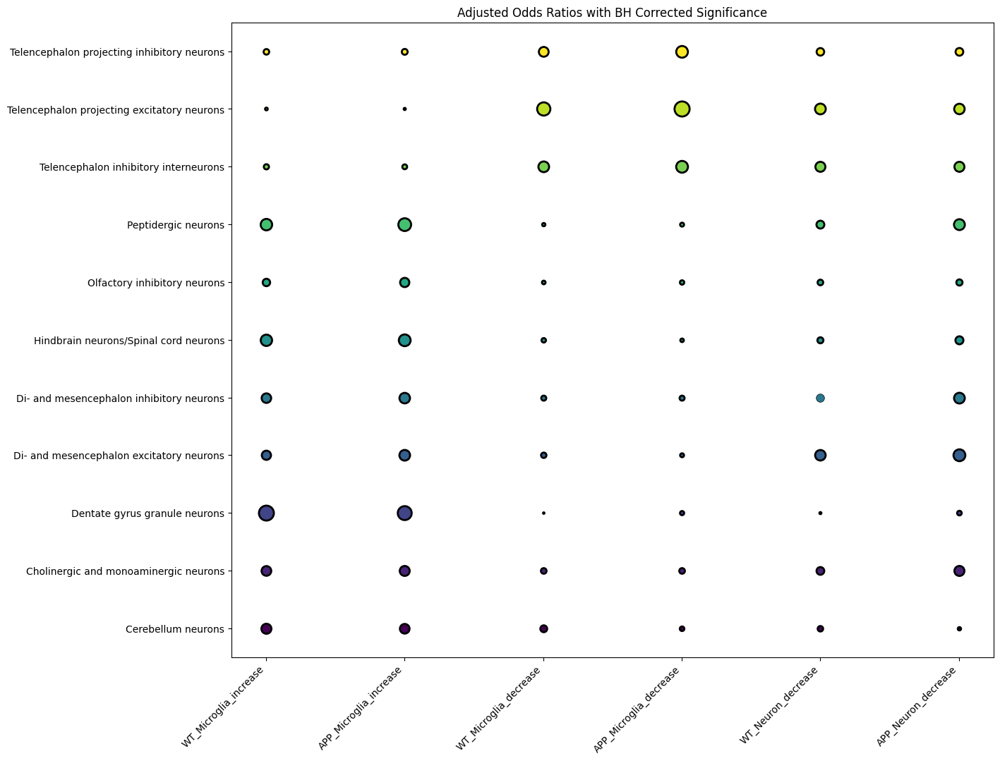

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.stats.multitest as smm
import matplotlib.cm as cm
import scipy.stats as stats

# オッズ比とp値の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Main_molecular_cell_type'] = ((df['Main_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Main_molecular_cell_type'], df[outcome])
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio, p_value

    return None, None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Main_molecular_cell_type'].dropna().unique())
results = []
p_values = []
for neurotransmitter_type in neurotransmitter_types:
    for outcome in ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease']:
        odds_ratio, p_value = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, outcome)
        if odds_ratio is not None:
            log_odds = np.log(odds_ratio + 1)
            results.append((log_odds, neurotransmitter_type, outcome))
            p_values.append(p_value)

# BH補正を適用
_, p_values_corrected, _, _ = smm.multipletests(p_values, alpha=0.05, method='fdr_bh')

# 結果のプロット
fig, ax = plt.subplots(figsize=(12, 10))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(neurotransmitter_types)))

Main_cell_type_list = []
# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    Main_cell_type_list.append(neurotransmitter_type)
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    
    # p値に基づく淵の太さ設定
    edge_width = 2 if p_values_corrected[i] < 0.05 else 0.5
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=colors[neurotransmitter_types.index(neurotransmitter_type)], edgecolor='black', linewidth=edge_width)

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')

#ax.set_xlabel('Outcomes')
#ax.set_ylabel('Main Molecular Cell Types')
ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
#plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTandAPP_Main_cell_type_draft.pdf', 
#            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [34]:
np.unique(Main_cell_type_list)[::-1]

array(['Telencephalon projecting inhibitory neurons',
       'Telencephalon projecting excitatory neurons',
       'Telencephalon inhibitory interneurons', 'Peptidergic neurons',
       'Olfactory inhibitory neurons',
       'Hindbrain neurons/Spinal cord neurons',
       'Di- and mesencephalon inhibitory neurons',
       'Di- and mesencephalon excitatory neurons',
       'Dentate gyrus granule neurons',
       'Cholinergic and monoaminergic neurons', 'Cerebellum neurons'],
      dtype='<U43')

In [35]:
color_annotation_csv

,Nomenclature,Subcluster Symbol,Cell number (total),Cell number (sagittal),Cell number (coronal),Subcluster color code,Main cluster description,Main cluster color code,Marker gene,"Cell type description (maturation, common name etc)",Cell states OR cell types,Allen Mouse Brain Atlas Neuron Nomenclature (Mouse - Whole Cortex & Hippocampus),Subcluster cell count % in its main cluster,Spatial distribution of small excitatory cell clusters in the STARmap PLUS datasets
0,VLM_1-[Ptgds_Slc6a13_Igf2],VLM_1,"24,830","8,854","15,976",1f76b3,Vascular and leptomeningeal cells,#1F77B4,Ptgds_Slc6a13_Igf2,Vascular leptomeningeal cells,Cell type,NaN,82.10%,NaN
1,VLM_2-[Ptgds_Slc47a1_Mgp],VLM_2,"5,398","1,648","3,750",246693,Vascular and leptomeningeal cells,#1F77B4,Ptgds_Slc47a1_Mgp,Vascular leptomeningeal cells,Cell type,NaN,17.90%,NaN
2,PER_1-[Pltp_Pglyrp1],PER_1,"31,128","11,380","19,748",d3a59c,Pericytes,#C49C94,Pltp_Pglyrp1,"Pericytes, possibly mixed with vascular endoth...",Cell type,NaN,67.90%,NaN
3,PER_2-[Pltp_Pglyrp1_Notum],PER_2,"6,772","2,324","4,448",c49c94,Pericytes,#C49C94,Pltp_Pglyrp1_Notum,"Pericytes, Notum high",Cell type,NaN,14.80%,NaN
4,PER_3-[Pltp_Vwf],PER_3,"5,740","1,981","3,759",b2847b,Pericytes,#C49C94,Pltp_Vwf,"Pericytes, Vwf high",Cell type,NaN,12.50%,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,NA_9-[Sfrp2],NA_9,"1,138",429,709,61615b,Unannotated,#D9D9D9,Sfrp2,Sfrp2(+) neuron-like cells,NaN,NaN,N.A.,NaN
227,NA_10-[Irx2],NA_10,"1,030",340,690,575751,Unannotated,#D9D9D9,Irx2,Irx2(+) neuron-like cells,NaN,NaN,N.A.,NaN
228,NA_11-[Hcrtr2_Vamp1_Nefm],NA_11,647,195,452,44443f,Unannotated,#D9D9D9,Hcrtr2_Vamp1_Nefm,Hcrtr2(+) neuron-like cells,NaN,NaN,N.A.,NaN
229,NA_12-[Oprm1_Glra1_Resp18],NA_12,513,162,351,3C3C3C,Unannotated,#D9D9D9,Oprm1_Glra1_Resp18,Oprm1(+) neuron-like cells,NaN,NaN,N.A.,NaN


In [36]:
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()
color_dict

{'VLM_1': '1f76b3',
 'VLM_2': '246693',
 'PER_1': 'd3a59c',
 'PER_2': 'c49c94',
 'PER_3': 'b2847b',
 'PER_4': '9f6e64',
 'VEN_1': '8e6d61',
 'VEN_2': '795f55',
 'VSM_1': '774d44',
 'OEC': '31423e',
 'OPC': '667872',
 'AC_1': 'a6a64d',
 'AC_2': 'eaeaa2',
 'AC_3': 'dada8d',
 'AC_4': 'A4A46A',
 'AC_5': 'bcbc5e',
 'AC_6': '6E6E47',
 'EPEN_1': 'c4b0d4',
 'EPEN_2': 'a98ebe',
 'CHOR': '7f52a9',
 'HYPEN': '8a4071',
 'OLG_1': 'a8e1eb',
 'OLG_2': '61b2c1',
 'OLG_3': '9ed9e4',
 'MGL_1': 'a2b1d8',
 'MGL_2': '8597c6',
 'MGL_3': 'D1D9EC',
 'PVM': '697fb7',
 'CHO_1': 'f7bac3',
 'CHO_2': 'f4b0ba',
 'CHO_3': 'f0a7b1',
 'CHO_4': 'ed9ea9',
 'SER_6': 'e995a1',
 'CHO_5': 'e48d9a',
 'CHO_6': 'df8692',
 'DOP_1': 'da7f8c',
 'MEGLU_6': 'd1707e',
 'SER_1': 'c86371',
 'SER_2': 'be5665',
 'SER_3': 'b34a59',
 'SER_4': '9f4854',
 'SER_5': '8c444f',
 'DOP_2': '7a4048',
 'HA_1': '683b42',
 'INH_1': 'fbb1b2',
 'INH_2': 'f9a5a6',
 'INH_3': 'f7999a',
 'INH_4': 'f68e8e',
 'PEP_1': 'f48283',
 'PEP_2': 'ef6c6d',
 'PEP_3': 

In [39]:
results

[(1.0482882101645754, 'Cerebellum neurons', 'WT_Microglia_increase'),
 (0.9707784373586408, 'Cerebellum neurons', 'APP_Microglia_increase'),
 (0.4924478729308357, 'Cerebellum neurons', 'WT_Microglia_decrease'),
 (0.2190631216244114, 'Cerebellum neurons', 'APP_Microglia_decrease'),
 (0.31514707360913646, 'Cerebellum neurons', 'WT_Neuron_decrease'),
 (0.11426467918525486, 'Cerebellum neurons', 'APP_Neuron_decrease'),
 (0.9810438289739328,
  'Cholinergic and monoaminergic neurons',
  'WT_Microglia_increase'),
 (1.0335035946987725,
  'Cholinergic and monoaminergic neurons',
  'APP_Microglia_increase'),
 (0.330618633751303,
  'Cholinergic and monoaminergic neurons',
  'WT_Microglia_decrease'),
 (0.3334632349850075,
  'Cholinergic and monoaminergic neurons',
  'APP_Microglia_decrease'),
 (0.6259228084835061,
  'Cholinergic and monoaminergic neurons',
  'WT_Neuron_decrease'),
 (1.0458899305007912,
  'Cholinergic and monoaminergic neurons',
  'APP_Neuron_decrease'),
 (2.3247965745813506,
  'De

Cerebellum neurons
1.0482882101645754
Cerebellum neurons
0.9707784373586408
Cerebellum neurons
0.4924478729308357
Cerebellum neurons
0.2190631216244114
Cerebellum neurons
0.31514707360913646
Cerebellum neurons
0.11426467918525486
Cholinergic and monoaminergic neurons
0.9810438289739328
Cholinergic and monoaminergic neurons
1.0335035946987725
Cholinergic and monoaminergic neurons
0.330618633751303
Cholinergic and monoaminergic neurons
0.3334632349850075
Cholinergic and monoaminergic neurons
0.6259228084835061
Cholinergic and monoaminergic neurons
1.0458899305007912
Dentate gyrus granule neurons
2.3247965745813506
Dentate gyrus granule neurons
2.023907315327271
Dentate gyrus granule neurons
0.021885340503403548
Dentate gyrus granule neurons
0.18116377959273536
Dentate gyrus granule neurons
0.044508474043039425
Dentate gyrus granule neurons
0.22460501605350594
Di- and mesencephalon excitatory neurons
0.8800795346032543
Di- and mesencephalon excitatory neurons
1.186311591156557
Di- and mes

/tmp/ipykernel_12920/4108061103.py:48: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


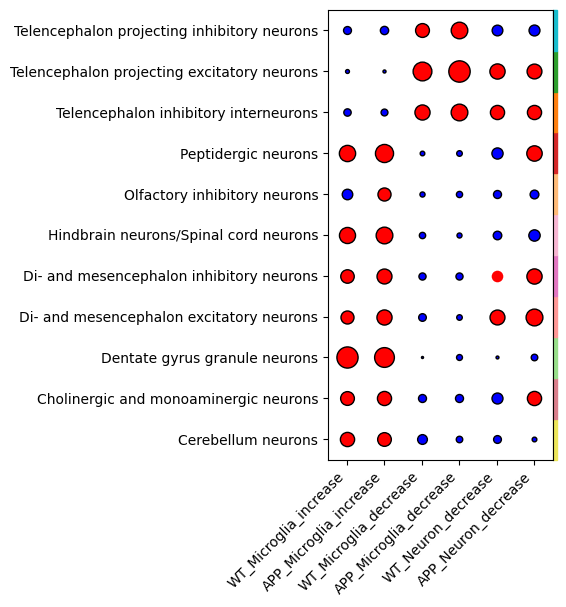

In [37]:
import matplotlib.pyplot as plt
import pandas as pd

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# データフレームを使用して、Main cluster descriptionとMain cluster color codeの辞書を作成します
color_dict = color_annotation_csv.set_index('Main cluster description')['Main cluster color code'].to_dict()

# サイドカラー用のデータフレームを作成
row_colors = pd.Series([color_dict.get(neurotransmitter_type.replace("Hindbrain neurons/Spinal cord neurons","Hindbrain/spinal cord neurons"), '#FFFFFF') for neurotransmitter_type in neurotransmitter_types])

# プロットを作成
fig, ax = plt.subplots(figsize=(3, 5))

# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    print(neurotransmitter_type)
    print(log_odds)
    # p値に基づく淵の太さ設定
    edge_width = 1 if p_values_corrected[i] < 0.05 else 0.0
    
    # 色の設定: log_oddsがnp.log(1 + 1)以下なら青、より大きいなら赤
    color = 'blue' if log_odds <= np.log(1 + 1) else 'red'
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=color, edgecolor='black', linewidth=edge_width)

# 右側にサイドカラーアノテーションを追加
for i, color in enumerate(row_colors):
    ax.add_patch(plt.Rectangle((5.5, i - 0.5), 0.1, 1, color=color, transform=ax.transData, clip_on=False))

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')
ax.set_xlim(-0.5, 5.5)  # x軸の範囲を調整してスペースを確保
ax.set_ylim(-0.5, 10.5)  # x軸の範囲を調整してスペースを確保
#ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

# レイアウトの調整
plt.tight_layout()
plt.subplots_adjust(left=0.2, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
#plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTandAPP_Main_cell_type.pdf',
#            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


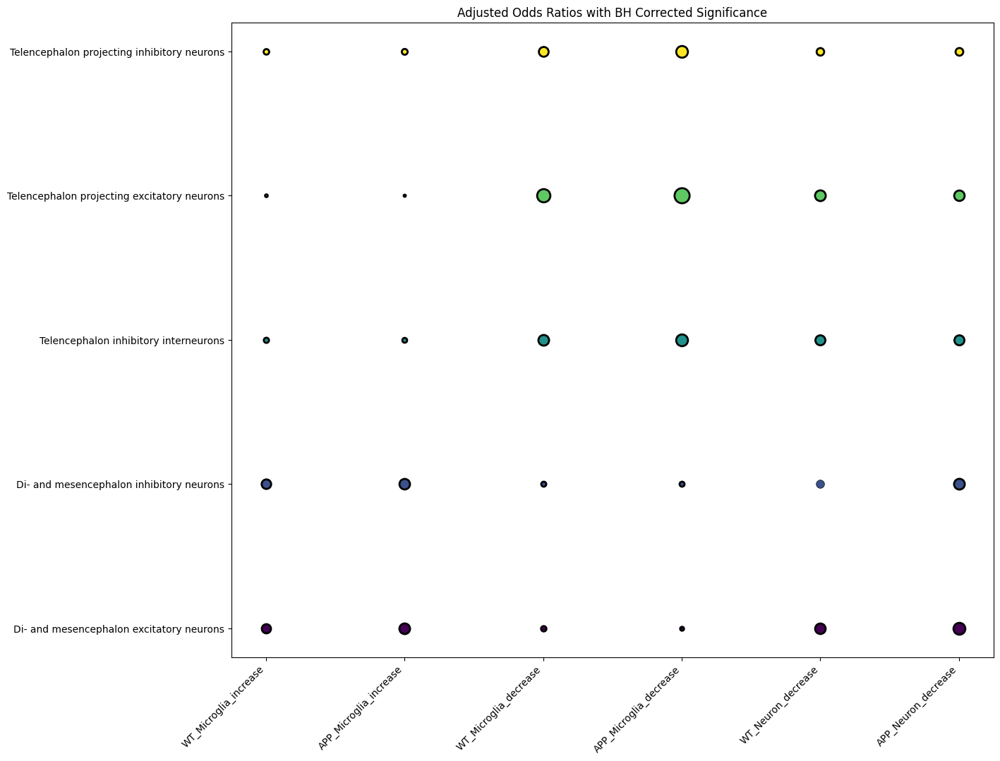

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.stats.multitest as smm
import matplotlib.cm as cm
import scipy.stats as stats

# オッズ比とp値の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Main_molecular_cell_type'] = ((df['Main_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Main_molecular_cell_type'], df[outcome])
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio, p_value

    return None, None

# プロットデータ
interested_neurotransmitter_types = [
    'Di- and mesencephalon excitatory neurons',
    'Di- and mesencephalon inhibitory neurons',
    'Telencephalon inhibitory interneurons',
    'Telencephalon projecting excitatory neurons',
    'Telencephalon projecting inhibitory neurons'
]
neurotransmitter_types = interested_neurotransmitter_types #sorted(cell_joined_neuron['Main_molecular_cell_type'].dropna().unique())

results = []
p_values = []
for neurotransmitter_type in neurotransmitter_types:
    for outcome in ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease']:
        odds_ratio, p_value = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, outcome)
        if odds_ratio is not None:
            log_odds = np.log(odds_ratio + 1)
            results.append((log_odds, neurotransmitter_type, outcome))
            p_values.append(p_value)

# BH補正を適用
_, p_values_corrected, _, _ = smm.multipletests(p_values, alpha=0.05, method='fdr_bh')

# 結果のプロット
fig, ax = plt.subplots(figsize=(12, 10))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(neurotransmitter_types)))

Main_cell_type_list = []
# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    Main_cell_type_list.append(neurotransmitter_type)
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    
    # p値に基づく淵の太さ設定
    edge_width = 2 if p_values_corrected[i] < 0.05 else 0.5
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=colors[neurotransmitter_types.index(neurotransmitter_type)], edgecolor='black', linewidth=edge_width)

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')

#ax.set_xlabel('Outcomes')
#ax.set_ylabel('Main Molecular Cell Types')
ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
#plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTandAPP_Main_cell_type_draft.pdf', 
#            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [45]:
neurotransmitter_types

['Di- and mesencephalon excitatory neurons',
 'Di- and mesencephalon inhibitory neurons',
 'Telencephalon inhibitory interneurons',
 'Telencephalon projecting excitatory neurons',
 'Telencephalon projecting inhibitory neurons']

In [47]:
row_colors 

0    #FF9896
1    #E377C2
2    #FF7F0E
3    #2CA02C
4    #17BECF
dtype: object

In [50]:
results

[(0.8800795346032543,
  'Di- and mesencephalon excitatory neurons',
  'WT_Microglia_increase'),
 (1.186311591156557,
  'Di- and mesencephalon excitatory neurons',
  'APP_Microglia_increase'),
 (0.30309319722015515,
  'Di- and mesencephalon excitatory neurons',
  'WT_Microglia_decrease'),
 (0.16147581035734607,
  'Di- and mesencephalon excitatory neurons',
  'APP_Microglia_decrease'),
 (1.1536050479348254,
  'Di- and mesencephalon excitatory neurons',
  'WT_Neuron_decrease'),
 (1.4642534929585562,
  'Di- and mesencephalon excitatory neurons',
  'APP_Neuron_decrease'),
 (0.9432981498271739,
  'Di- and mesencephalon inhibitory neurons',
  'WT_Microglia_increase'),
 (1.158149960338853,
  'Di- and mesencephalon inhibitory neurons',
  'APP_Microglia_increase'),
 (0.2646622847878768,
  'Di- and mesencephalon inhibitory neurons',
  'WT_Microglia_decrease'),
 (0.2616175690169242,
  'Di- and mesencephalon inhibitory neurons',
  'APP_Microglia_decrease'),
 (0.6994942727183845,
  'Di- and mesencep

Di- and mesencephalon excitatory neurons
0.8800795346032543
Di- and mesencephalon excitatory neurons
1.186311591156557
Di- and mesencephalon excitatory neurons
0.30309319722015515
Di- and mesencephalon excitatory neurons
0.16147581035734607
Di- and mesencephalon excitatory neurons
1.1536050479348254
Di- and mesencephalon excitatory neurons
1.4642534929585562
Di- and mesencephalon inhibitory neurons
0.9432981498271739
Di- and mesencephalon inhibitory neurons
1.158149960338853
Di- and mesencephalon inhibitory neurons
0.2646622847878768
Di- and mesencephalon inhibitory neurons
0.2616175690169242
Di- and mesencephalon inhibitory neurons
0.6994942727183845
Di- and mesencephalon inhibitory neurons
1.2032302810901674
Telencephalon inhibitory interneurons
0.28124666108875956
Telencephalon inhibitory interneurons
0.2454118300994027
Telencephalon inhibitory interneurons
1.1880803372870128
Telencephalon inhibitory interneurons
1.4464235609827172
Telencephalon inhibitory interneurons
1.04072744787

/tmp/ipykernel_12920/1833659952.py:48: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


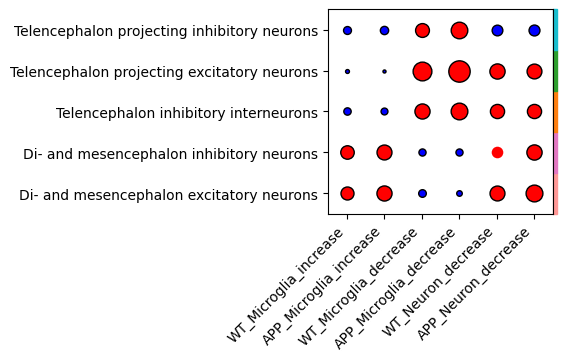

In [55]:
import matplotlib.pyplot as plt
import pandas as pd

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# データフレームを使用して、Main cluster descriptionとMain cluster color codeの辞書を作成します
color_dict = color_annotation_csv.set_index('Main cluster description')['Main cluster color code'].to_dict()

# サイドカラー用のデータフレームを作成
row_colors = pd.Series([color_dict.get(neurotransmitter_type.replace("Hindbrain neurons/Spinal cord neurons","Hindbrain/spinal cord neurons"), '#FFFFFF') for neurotransmitter_type in neurotransmitter_types])

# プロットを作成
fig, ax = plt.subplots(figsize=(3, 25/11))

# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    print(neurotransmitter_type)
    print(log_odds)
    # p値に基づく淵の太さ設定
    edge_width = 1 if p_values_corrected[i] < 0.05 else 0.0
    
    # 色の設定: log_oddsがnp.log(1 + 1)以下なら青、より大きいなら赤
    color = 'blue' if log_odds <= np.log(1 + 1) else 'red'
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=color, edgecolor='black', linewidth=edge_width)

# 右側にサイドカラーアノテーションを追加
for i, color in enumerate(row_colors):
    ax.add_patch(plt.Rectangle((5.5, i - 0.5), 0.1, 1, color=color, transform=ax.transData, clip_on=False))

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')
ax.set_xlim(-0.5, 5.5)  # x軸の範囲を調整してスペースを確保
ax.set_ylim(-0.5, 4.5)  # x軸の範囲を調整してスペースを確保
#ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

# レイアウトの調整
plt.tight_layout()
plt.subplots_adjust(left=0.2, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTandAPP_Main_cell_type_short.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


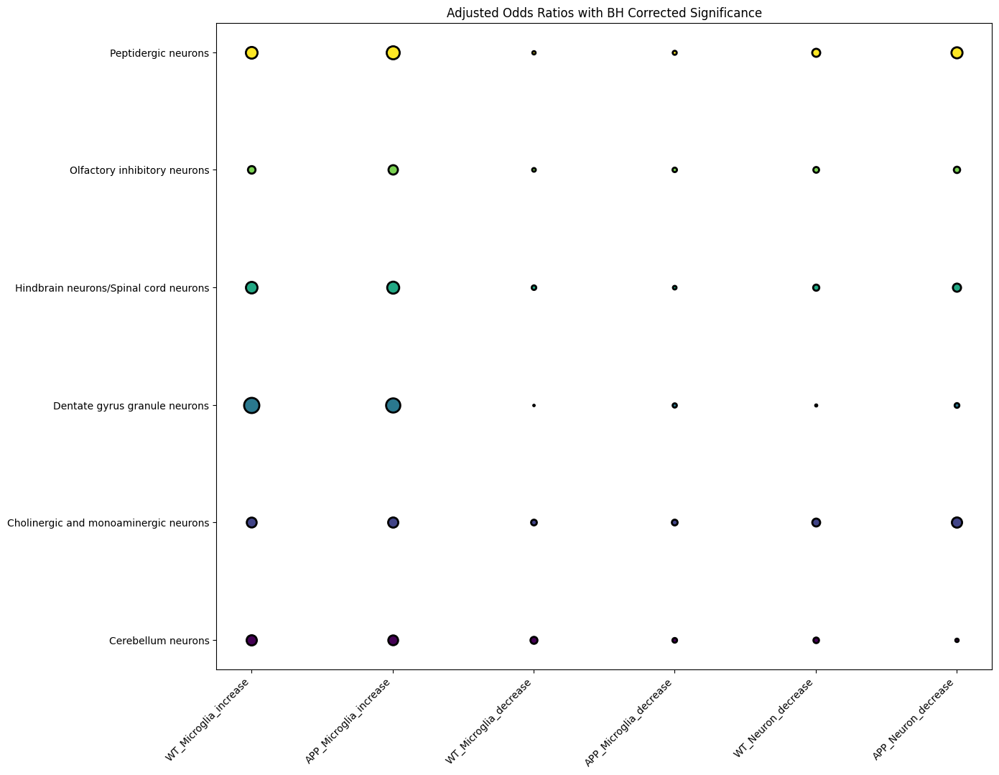

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.stats.multitest as smm
import matplotlib.cm as cm
import scipy.stats as stats

# オッズ比とp値の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Main_molecular_cell_type'] = ((df['Main_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Main_molecular_cell_type'], df[outcome])
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio, p_value

    return None, None

# プロットデータ
interested_neurotransmitter_types = [
  #  'Di- and mesencephalon excitatory neurons',
  #  'Di- and mesencephalon inhibitory neurons',
  #  'Telencephalon inhibitory interneurons',
  #  'Telencephalon projecting excitatory neurons',
  #  'Telencephalon projecting inhibitory neurons'
'Cerebellum neurons',
 'Cholinergic and monoaminergic neurons',
 'Dentate gyrus granule neurons',
# 'Di- and mesencephalon excitatory neurons',
# 'Di- and mesencephalon inhibitory neurons',
 'Hindbrain neurons/Spinal cord neurons',
 'Olfactory inhibitory neurons',
 'Peptidergic neurons',
# 'Telencephalon inhibitory interneurons',
# 'Telencephalon projecting excitatory neurons',
# 'Telencephalon projecting inhibitory neurons'
]
neurotransmitter_types = interested_neurotransmitter_types #sorted(cell_joined_neuron['Main_molecular_cell_type'].dropna().unique())

results = []
p_values = []
for neurotransmitter_type in neurotransmitter_types:
    for outcome in ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease']:
        odds_ratio, p_value = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, outcome)
        if odds_ratio is not None:
            log_odds = np.log(odds_ratio + 1)
            results.append((log_odds, neurotransmitter_type, outcome))
            p_values.append(p_value)

# BH補正を適用
_, p_values_corrected, _, _ = smm.multipletests(p_values, alpha=0.05, method='fdr_bh')

# 結果のプロット
fig, ax = plt.subplots(figsize=(12, 10))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(neurotransmitter_types)))

Main_cell_type_list = []
# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    Main_cell_type_list.append(neurotransmitter_type)
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    
    # p値に基づく淵の太さ設定
    edge_width = 2 if p_values_corrected[i] < 0.05 else 0.5
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=colors[neurotransmitter_types.index(neurotransmitter_type)], edgecolor='black', linewidth=edge_width)

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')

#ax.set_xlabel('Outcomes')
#ax.set_ylabel('Main Molecular Cell Types')
ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
#plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTandAPP_Main_cell_type_draft.pdf', 
#            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


Cerebellum neurons
1.0482882101645754
Cerebellum neurons
0.9707784373586408
Cerebellum neurons
0.4924478729308357
Cerebellum neurons
0.2190631216244114
Cerebellum neurons
0.31514707360913646
Cerebellum neurons
0.11426467918525486
Cholinergic and monoaminergic neurons
0.9810438289739328
Cholinergic and monoaminergic neurons
1.0335035946987725
Cholinergic and monoaminergic neurons
0.330618633751303
Cholinergic and monoaminergic neurons
0.3334632349850075
Cholinergic and monoaminergic neurons
0.6259228084835061
Cholinergic and monoaminergic neurons
1.0458899305007912
Dentate gyrus granule neurons
2.3247965745813506
Dentate gyrus granule neurons
2.023907315327271
Dentate gyrus granule neurons
0.021885340503403548
Dentate gyrus granule neurons
0.18116377959273536
Dentate gyrus granule neurons
0.044508474043039425
Dentate gyrus granule neurons
0.22460501605350594
Hindbrain neurons/Spinal cord neurons
1.34188761106158
Hindbrain neurons/Spinal cord neurons
1.4460666563153879
Hindbrain neurons/

/tmp/ipykernel_12920/1083870626.py:48: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


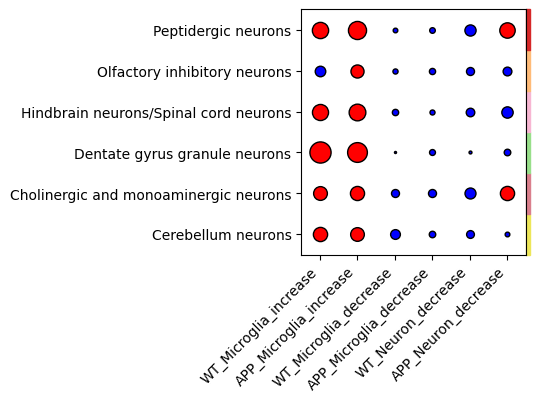

In [60]:
import matplotlib.pyplot as plt
import pandas as pd

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# データフレームを使用して、Main cluster descriptionとMain cluster color codeの辞書を作成します
color_dict = color_annotation_csv.set_index('Main cluster description')['Main cluster color code'].to_dict()

# サイドカラー用のデータフレームを作成
row_colors = pd.Series([color_dict.get(neurotransmitter_type.replace("Hindbrain neurons/Spinal cord neurons","Hindbrain/spinal cord neurons"), '#FFFFFF') for neurotransmitter_type in neurotransmitter_types])

# プロットを作成
fig, ax = plt.subplots(figsize=(3, 30/11))

# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    print(neurotransmitter_type)
    print(log_odds)
    # p値に基づく淵の太さ設定
    edge_width = 1 if p_values_corrected[i] < 0.05 else 0.0
    
    # 色の設定: log_oddsがnp.log(1 + 1)以下なら青、より大きいなら赤
    color = 'blue' if log_odds <= np.log(1 + 1) else 'red'
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=color, edgecolor='black', linewidth=edge_width)

# 右側にサイドカラーアノテーションを追加
for i, color in enumerate(row_colors):
    ax.add_patch(plt.Rectangle((5.5, i - 0.5), 0.1, 1, color=color, transform=ax.transData, clip_on=False))

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')
ax.set_xlim(-0.5, 5.5)  # x軸の範囲を調整してスペースを確保
ax.set_ylim(-0.5, 5.5)  # x軸の範囲を調整してスペースを確保
#ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

# レイアウトの調整
plt.tight_layout()
plt.subplots_adjust(left=0.2, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Extended Data Fig.7/WTandAPP_Main_cell_type_remained.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [497]:
color_annotation_csv.set_index('Main cluster description')['Main cluster color code'].to_dict()

{'Vascular and leptomeningeal cells': '#1F77B4',
 'Pericytes': '#C49C94',
 'Vascular endothelial cells': '#8E6D61',
 'Vascular smooth muscle cells': '#8C564B',
 'Olfactory ensheathing cells': '#374A46',
 'Oligodendrocyte precursor cells': '#778A84',
 'Astrocytes': '#DBDB8D',
 'Ependymal cells': '#C5B0D5',
 'Choroid plexus epithelial cells': '#9467BD',
 'Subcommissural organ hypendymal cells': '#A54485',
 'Oligodendrocytes': '#9EDAE5',
 'Microglia': '#A2B1D8',
 'Perivascular macrophages': '#8599CB',
 'Cholinergic and monoaminergic neurons': '#DA7F8C',
 'Peptidergic neurons': '#D62728',
 'Di- and mesencephalon inhibitory neurons': '#E377C2',
 'Di- and mesencephalon excitatory neurons': '#FF9896',
 'Non-glutamatergic neuroblasts': '#BCBD22',
 'Glutamatergic neuroblasts': '#AEC7E8',
 'Hindbrain/spinal cord neurons': '#F7B6D2',
 'Telencephalon inhibitory interneurons': '#FF7F0E',
 'Olfactory inhibitory neurons': '#FFBB78',
 'Telencephalon projecting excitatory neurons': '#2CA02C',
 'Telence

In [168]:
results

[(1.0482882101645754, 'Cerebellum neurons', 'WT_Microglia_increase'),
 (0.9707784373586408, 'Cerebellum neurons', 'APP_Microglia_increase'),
 (0.4924478729308357, 'Cerebellum neurons', 'WT_Microglia_decrease'),
 (0.2190631216244114, 'Cerebellum neurons', 'APP_Microglia_decrease'),
 (0.31514707360913646, 'Cerebellum neurons', 'WT_Neuron_decrease'),
 (0.11426467918525486, 'Cerebellum neurons', 'APP_Neuron_decrease'),
 (0.9810438289739328,
  'Cholinergic and monoaminergic neurons',
  'WT_Microglia_increase'),
 (1.0335035946987725,
  'Cholinergic and monoaminergic neurons',
  'APP_Microglia_increase'),
 (0.330618633751303,
  'Cholinergic and monoaminergic neurons',
  'WT_Microglia_decrease'),
 (0.3334632349850075,
  'Cholinergic and monoaminergic neurons',
  'APP_Microglia_decrease'),
 (0.6259228084835061,
  'Cholinergic and monoaminergic neurons',
  'WT_Neuron_decrease'),
 (1.0458899305007912,
  'Cholinergic and monoaminergic neurons',
  'APP_Neuron_decrease'),
 (2.3247965745813506,
  'De

In [170]:
log_odds_values = [1.0482882101645754, 0.9707784373586408, 0.4924478729308357, 0.2190631216244114, 0.31514707360913646]
diameters = [2.533, 2.438,1.736 , 1.158, 1.389]
a = [(2*size)**2 for size in diameters]
np.array(log_odds_values)/np.array(a)

array([0.04084608, 0.04083125, 0.04085083, 0.0408406 , 0.04083653])

In [171]:
np.median(np.array(log_odds_values)/np.array(a))

0.04084060452488125

In [172]:
# これで変換できる。つまり、0.31514707360913646 がlog ORで、0.04084060452488125は定数
# 計算した値が、直径になります。
(0.31514707360913646 /0.04084060452488125)**(1/2)/2

1.3889306531854895

In [177]:
# これで変換できる。つまり、0.31514707360913646 がlog ORで、0.04084060452488125は定数
# 計算した値が、直径になります。
(np.log(9+1) /0.04084060452488125)**(1/2)/2

3.7543241556028746

In [181]:
np.log(0.5+1)

0.4054651081081644

In [158]:
np.array(log_odds_values)/np.array(a)

array([0.03988015, 0.03987072, 0.03991174, 0.03991272])

In [100]:
color_dict

{'Vascular and leptomeningeal cells': '#1F77B4',
 'Pericytes': '#C49C94',
 'Vascular endothelial cells': '#8E6D61',
 'Vascular smooth muscle cells': '#8C564B',
 'Olfactory ensheathing cells': '#374A46',
 'Oligodendrocyte precursor cells': '#778A84',
 'Astrocytes': '#DBDB8D',
 'Ependymal cells': '#C5B0D5',
 'Choroid plexus epithelial cells': '#9467BD',
 'Subcommissural organ hypendymal cells': '#A54485',
 'Oligodendrocytes': '#9EDAE5',
 'Microglia': '#A2B1D8',
 'Perivascular macrophages': '#8599CB',
 'Cholinergic and monoaminergic neurons': '#DA7F8C',
 'Peptidergic neurons': '#D62728',
 'Di- and mesencephalon inhibitory neurons': '#E377C2',
 'Di- and mesencephalon excitatory neurons': '#FF9896',
 'Non-glutamatergic neuroblasts': '#BCBD22',
 'Glutamatergic neuroblasts': '#AEC7E8',
 'Hindbrain/spinal cord neurons': '#F7B6D2',
 'Telencephalon inhibitory interneurons': '#FF7F0E',
 'Olfactory inhibitory neurons': '#FFBB78',
 'Telencephalon projecting excitatory neurons': '#2CA02C',
 'Telence

In [99]:
row_colors

0     #EDE659
1     #DA7F8C
2     #98DF8A
3     #FF9896
4     #E377C2
5     #FFFFFF
6     #FFBB78
7     #D62728
8     #FF7F0E
9     #2CA02C
10    #17BECF
dtype: object

In [101]:
neurotransmitter_types[5]

'Hindbrain neurons/Spinal cord neurons'

In [88]:
color_dict

{'Vascular and leptomeningeal cells': '#1F77B4',
 'Pericytes': '#C49C94',
 'Vascular endothelial cells': '#8E6D61',
 'Vascular smooth muscle cells': '#8C564B',
 'Olfactory ensheathing cells': '#374A46',
 'Oligodendrocyte precursor cells': '#778A84',
 'Astrocytes': '#DBDB8D',
 'Ependymal cells': '#C5B0D5',
 'Choroid plexus epithelial cells': '#9467BD',
 'Subcommissural organ hypendymal cells': '#A54485',
 'Oligodendrocytes': '#9EDAE5',
 'Microglia': '#A2B1D8',
 'Perivascular macrophages': '#8599CB',
 'Cholinergic and monoaminergic neurons': '#DA7F8C',
 'Peptidergic neurons': '#D62728',
 'Di- and mesencephalon inhibitory neurons': '#E377C2',
 'Di- and mesencephalon excitatory neurons': '#FF9896',
 'Non-glutamatergic neuroblasts': '#BCBD22',
 'Glutamatergic neuroblasts': '#AEC7E8',
 'Hindbrain/spinal cord neurons': '#F7B6D2',
 'Telencephalon inhibitory interneurons': '#FF7F0E',
 'Olfactory inhibitory neurons': '#FFBB78',
 'Telencephalon projecting excitatory neurons': '#2CA02C',
 'Telence

In [82]:
color_dict

{'VLM_1': '#1F77B4',
 'VLM_2': '#1F77B4',
 'PER_1': '#C49C94',
 'PER_2': '#C49C94',
 'PER_3': '#C49C94',
 'PER_4': '#C49C94',
 'VEN_1': '#8E6D61',
 'VEN_2': '#8E6D61',
 'VSM_1': '#8C564B',
 'OEC': '#374A46',
 'OPC': '#778A84',
 'AC_1': '#DBDB8D',
 'AC_2': '#DBDB8D',
 'AC_3': '#DBDB8D',
 'AC_4': '#DBDB8D',
 'AC_5': '#DBDB8D',
 'AC_6': '#DBDB8D',
 'EPEN_1': '#C5B0D5',
 'EPEN_2': '#C5B0D5',
 'CHOR': '#9467BD',
 'HYPEN': '#A54485',
 'OLG_1': '#9EDAE5',
 'OLG_2': '#9EDAE5',
 'OLG_3': '#9EDAE5',
 'MGL_1': '#A2B1D8',
 'MGL_2': '#A2B1D8',
 'MGL_3': '#A2B1D8',
 'PVM': '#8599CB',
 'CHO_1': '#DA7F8C',
 'CHO_2': '#DA7F8C',
 'CHO_3': '#DA7F8C',
 'CHO_4': '#DA7F8C',
 'SER_6': '#DA7F8C',
 'CHO_5': '#DA7F8C',
 'CHO_6': '#DA7F8C',
 'DOP_1': '#DA7F8C',
 'MEGLU_6': '#DA7F8C',
 'SER_1': '#DA7F8C',
 'SER_2': '#DA7F8C',
 'SER_3': '#DA7F8C',
 'SER_4': '#DA7F8C',
 'SER_5': '#DA7F8C',
 'DOP_2': '#DA7F8C',
 'HA_1': '#DA7F8C',
 'INH_1': '#D62728',
 'INH_2': '#D62728',
 'INH_3': '#D62728',
 'INH_4': '#D62728',
 '

Cross tab for Cerebellum neurons (APP_Microglia_decrease):
APP_Microglia_decrease            0       1
is_Main_molecular_cell_type                
0                            361701  267579
1                            186263   33747
Cross tab for Cerebellum neurons (WT_Microglia_decrease):
WT_Microglia_decrease             0       1
is_Main_molecular_cell_type                
0                            420242  209038
1                            167115   52895
Cross tab for Cholinergic and monoaminergic neurons (APP_Microglia_decrease):
APP_Microglia_decrease            0       1
is_Main_molecular_cell_type                
0                            533754  298184
1                             14210    3142
Cross tab for Cholinergic and monoaminergic neurons (WT_Microglia_decrease):
WT_Microglia_decrease             0       1
is_Main_molecular_cell_type                
0                            572620  259318
1                             14737    2615
Cross tab for Dentate gy

/tmp/ipykernel_12671/848320785.py:70: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


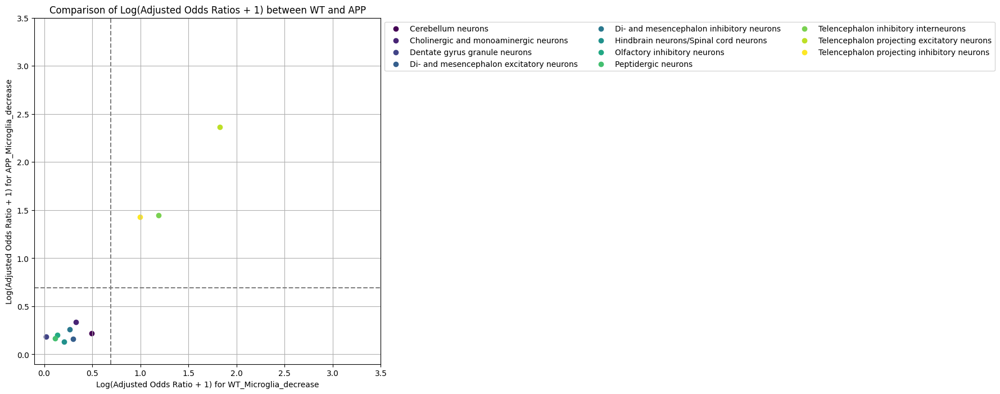

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Main_molecular_cell_type'] = ((df['Main_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Main_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Main_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for Cerebellum neurons (APP_Neuron_decrease):
APP_Neuron_decrease               0       1
is_Main_molecular_cell_type                
0                            372001  257279
1                            203014   16996
Cross tab for Cerebellum neurons (WT_Neuron_decrease):
WT_Neuron_decrease                0       1
is_Main_molecular_cell_type                
0                            497408  131872
1                            200334   19676
Cross tab for Cholinergic and monoaminergic neurons (APP_Neuron_decrease):
APP_Neuron_decrease               0       1
is_Main_molecular_cell_type                
0                            565729  266209
1                              9286    8066
Cross tab for Cholinergic and monoaminergic neurons (WT_Neuron_decrease):
WT_Neuron_decrease                0       1
is_Main_molecular_cell_type                
0                            683154  148784
1                             14588    2764
Cross tab for Dentate gyrus granule 

/tmp/ipykernel_47422/3197019460.py:70: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


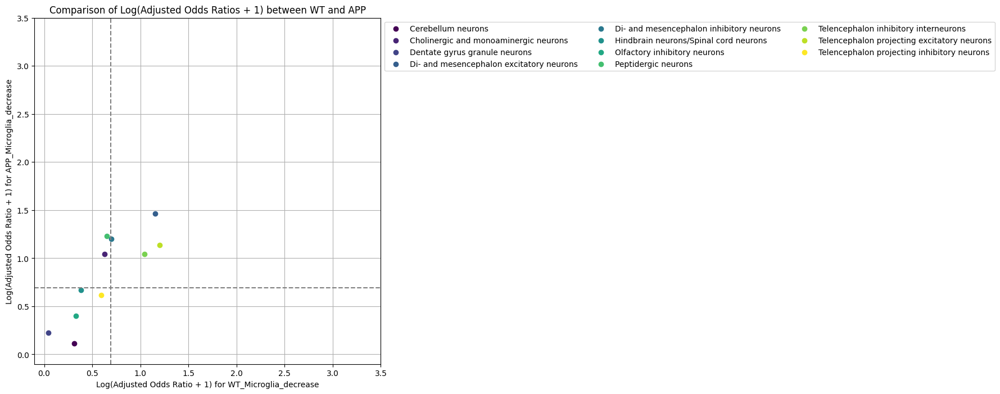

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Main_molecular_cell_type'] = ((df['Main_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Main_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Main_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           470263  267023
1                           104752    7252
Cross tab for CBGRC_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           595131  142155
1                           102611    9393
Cross tab for CBGRC_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           521470  271012
1                            53545    3263
Cross tab for CBGRC_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           644930  147552
1                            52812    3996
Cross tab for CBINH_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0  

Cross tab for DOP_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697225  151345
1                              517     203
Cross tab for DOP_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574778  274114
1                              237     161
Cross tab for DOP_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697353  151539
1                              389       9
Cross tab for GLU_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571398  272458
1                             3617    1817
Cross tab for GLU_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0             

Cross tab for INH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574482  273638
1                              533     637
Cross tab for INH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696763  151357
1                              979     191
Cross tab for INH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570850  270076
1                             4165    4199
Cross tab for INH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           690725  150201
1                             7017    1347
Cross tab for INH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0            

Cross tab for MSN_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696644  151336
1                             1098     212
Cross tab for MSN_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574793  274179
1                              222      96
Cross tab for MSN_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697466  151506
1                              276      42
Cross tab for MSN_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           568065  271435
1                             6950    2840
Cross tab for MSN_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0          

Cross tab for PEP_12 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574086  273496
1                              929     779
Cross tab for PEP_12 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696455  151127
1                             1287     421
Cross tab for PEP_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574484  273614
1                              531     661
Cross tab for PEP_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696765  151333
1                              977     215
Cross tab for PEP_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0       

Cross tab for PEP_8 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695629  151267
1                             2113     281
Cross tab for PEP_9 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574225  273151
1                              790    1124
Cross tab for PEP_9 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696091  151285
1                             1651     263
Cross tab for SER_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573884  273180
1                             1131    1095
Cross tab for SER_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0             

Cross tab for TEGLU_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571331  270051
1                             3684    4224
Cross tab for TEGLU_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692299  149083
1                             5443    2465
Cross tab for TEGLU_21 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570878  273364
1                             4137     911
Cross tab for TEGLU_21 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           693712  150530
1                             4030    1018
Cross tab for TEGLU_22 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type               

Cross tab for TEGLU_38 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697144  151286
1                              598     262
Cross tab for TEGLU_39 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574613  273959
1                              402     316
Cross tab for TEGLU_39 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697249  151323
1                              493     225
Cross tab for TEGLU_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573050  272000
1                             1965    2275
Cross tab for TEGLU_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0

Cross tab for TEINH_19 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574518  273448
1                              497     827
Cross tab for TEINH_19 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696904  151062
1                              838     486
Cross tab for TEINH_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573299  273103
1                             1716    1172
Cross tab for TEINH_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695683  150719
1                             2059     829
Cross tab for TEINH_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                


Cross tab for TEINH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696199  150885
1                             1543     663
Cross tab for TEINH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573751  273325
1                             1264     950
Cross tab for TEINH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696341  150735
1                             1401     813
Cross tab for TEINH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574145  273459
1                              870     816
Cross tab for TEINH_6 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0   

/tmp/ipykernel_14126/1405240580.py:56: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


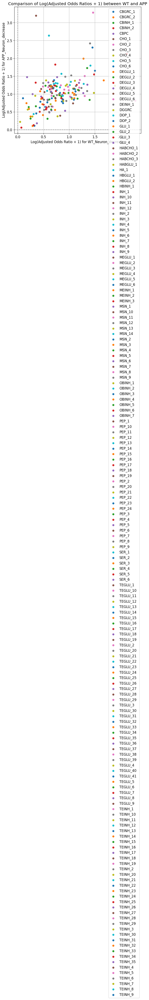

In [105]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        # 0.5を追加して補正
        table = np.array([
            [cross_tab.loc[1, 1] , cross_tab.loc[1, 0] ],
            [cross_tab.loc[0, 1] , cross_tab.loc[0, 0] ]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

for log_odds_app, log_odds_wt, neurotransmitter_type in results:
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type)

ax.axhline(0, color='grey', linestyle='--')
ax.axvline(0, color='grey', linestyle='--')
ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Neuron_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           455267  282019
1                            92697   19307
Cross tab for CBGRC_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           505106  232180
1                            82251   29753
Cross tab for CBGRC_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           500081  292401
1                            47883    8925
Cross tab for CBGRC_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           543674  248808
1                            43683   13125
Cross tab for CBINH_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type     

Cross tab for DOP_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586678  261892
1                              679      41
Cross tab for DOP_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547577  301315
1                              387      11
Cross tab for DOP_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587012  261880
1                              345      53
Cross tab for GLU_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           542723  301133
1                             5241     193
Cross tab for GLU_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                

Cross tab for INH_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546907  301213
1                             1057     113
Cross tab for INH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586256  261864
1                             1101      69
Cross tab for INH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           540595  300331
1                             7369     995
Cross tab for INH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           579746  261180
1                             7611     753
Cross tab for INH_6 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type               

Cross tab for MSN_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586426  261554
1                              931     379
Cross tab for MSN_14 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547896  301076
1                               68     250
Cross tab for MSN_14 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587204  261768
1                              153     165
Cross tab for MSN_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           542441  297059
1                             5523    4267
Cross tab for MSN_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type             

Cross tab for PEP_12 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546353  301229
1                             1611      97
Cross tab for PEP_12 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585764  261818
1                             1593     115
Cross tab for PEP_13 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546898  301200
1                             1066     126
Cross tab for PEP_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586239  261859
1                             1118      74
Cross tab for PEP_14 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type          

Cross tab for PEP_8 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585012  261884
1                             2345      49
Cross tab for PEP_9 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546113  301263
1                             1851      63
Cross tab for PEP_9 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585492  261884
1                             1865      49
Cross tab for SER_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546065  300999
1                             1899     327
Cross tab for SER_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                

Cross tab for TEGLU_20 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546477  294905
1                             1487    6421
Cross tab for TEGLU_20 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           583686  257696
1                             3671    4237
Cross tab for TEGLU_21 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546925  297317
1                             1039    4009
Cross tab for TEGLU_21 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586084  258158
1                             1273    3775
Cross tab for TEGLU_22 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type

Cross tab for TEGLU_38 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587000  261430
1                              357     503
Cross tab for TEGLU_39 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547776  300796
1                              188     530
Cross tab for TEGLU_39 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587093  261479
1                              264     454
Cross tab for TEGLU_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           544426  300624
1                             3538     702
Cross tab for TEGLU_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type   

Cross tab for TEINH_19 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547684  300282
1                              280    1044
Cross tab for TEINH_19 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586894  261072
1                              463     861
Cross tab for TEINH_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547097  299305
1                              867    2021
Cross tab for TEINH_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586093  260309
1                             1264    1624
Cross tab for TEINH_20 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type  

Cross tab for TEINH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586333  260751
1                             1024    1182
Cross tab for TEINH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547380  299696
1                              584    1630
Cross tab for TEINH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586659  260417
1                              698    1516
Cross tab for TEINH_6 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547456  300148
1                              508    1178
Cross tab for TEINH_6 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type      

/tmp/ipykernel_14126/879818628.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


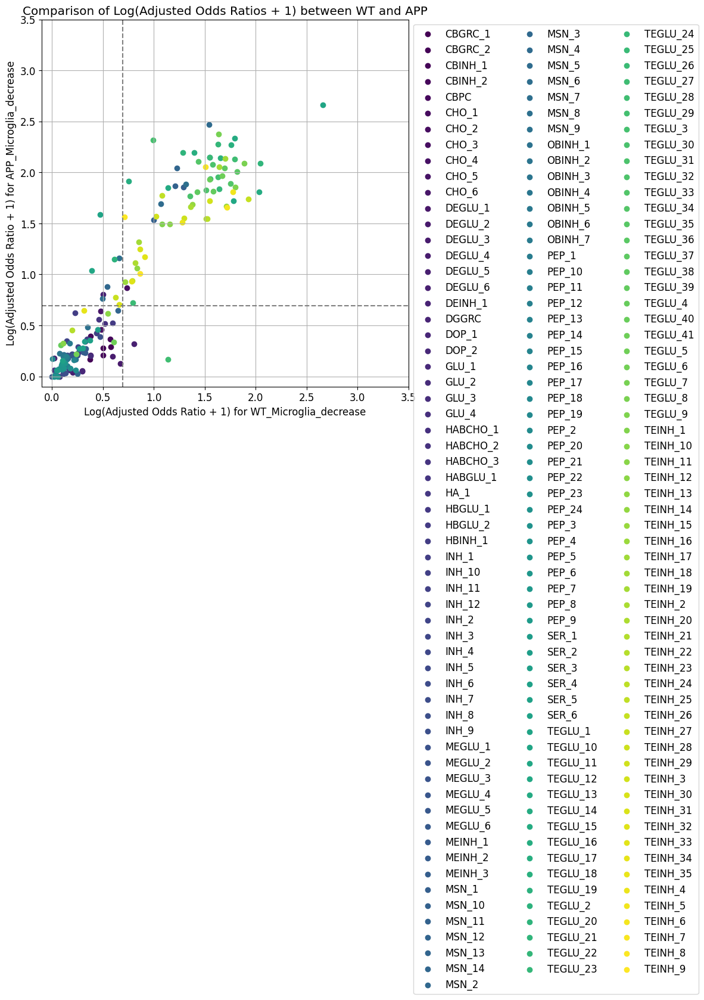

In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           470263  267023
1                           104752    7252
Cross tab for CBGRC_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           595131  142155
1                           102611    9393
Cross tab for CBGRC_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           521470  271012
1                            53545    3263
Cross tab for CBGRC_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           644930  147552
1                            52812    3996
Cross tab for CBINH_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0  

Cross tab for DOP_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574709  273861
1                              306     414
Cross tab for DOP_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697225  151345
1                              517     203
Cross tab for DOP_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574778  274114
1                              237     161
Cross tab for DOP_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697353  151539
1                              389       9
Cross tab for GLU_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0            

Cross tab for INH_3 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           693819  150779
1                             3923     769
Cross tab for INH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574482  273638
1                              533     637
Cross tab for INH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696763  151357
1                              979     191
Cross tab for INH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570850  270076
1                             4165    4199
Cross tab for INH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0             

Cross tab for MSN_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574142  273838
1                              873     437
Cross tab for MSN_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696644  151336
1                             1098     212
Cross tab for MSN_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574793  274179
1                              222      96
Cross tab for MSN_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697466  151506
1                              276      42
Cross tab for MSN_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0        

Cross tab for PEP_11 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696301  151349
1                             1441     199
Cross tab for PEP_12 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574086  273496
1                              929     779
Cross tab for PEP_12 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696455  151127
1                             1287     421
Cross tab for PEP_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574484  273614
1                              531     661
Cross tab for PEP_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0        

Cross tab for PEP_8 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573583  273313
1                             1432     962
Cross tab for PEP_8 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695629  151267
1                             2113     281
Cross tab for PEP_9 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574225  273151
1                              790    1124
Cross tab for PEP_9 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696091  151285
1                             1651     263
Cross tab for SER_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0            

Cross tab for TEGLU_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697362  151496
1                              380      52
Cross tab for TEGLU_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571331  270051
1                             3684    4224
Cross tab for TEGLU_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692299  149083
1                             5443    2465
Cross tab for TEGLU_21 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570878  273364
1                             4137     911
Cross tab for TEGLU_21 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                


Cross tab for TEGLU_38 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574543  273887
1                              472     388
Cross tab for TEGLU_38 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697144  151286
1                              598     262
Cross tab for TEGLU_39 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574613  273959
1                              402     316
Cross tab for TEGLU_39 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697249  151323
1                              493     225
Cross tab for TEGLU_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                

Cross tab for TEINH_18 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696843  151307
1                              899     241
Cross tab for TEINH_19 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574518  273448
1                              497     827
Cross tab for TEINH_19 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696904  151062
1                              838     486
Cross tab for TEINH_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573299  273103
1                             1716    1172
Cross tab for TEINH_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0

Cross tab for TEINH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573932  273152
1                             1083    1123
Cross tab for TEINH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696199  150885
1                             1543     663
Cross tab for TEINH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573751  273325
1                             1264     950
Cross tab for TEINH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696341  150735
1                             1401     813
Cross tab for TEINH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0  

/tmp/ipykernel_14126/145467019.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


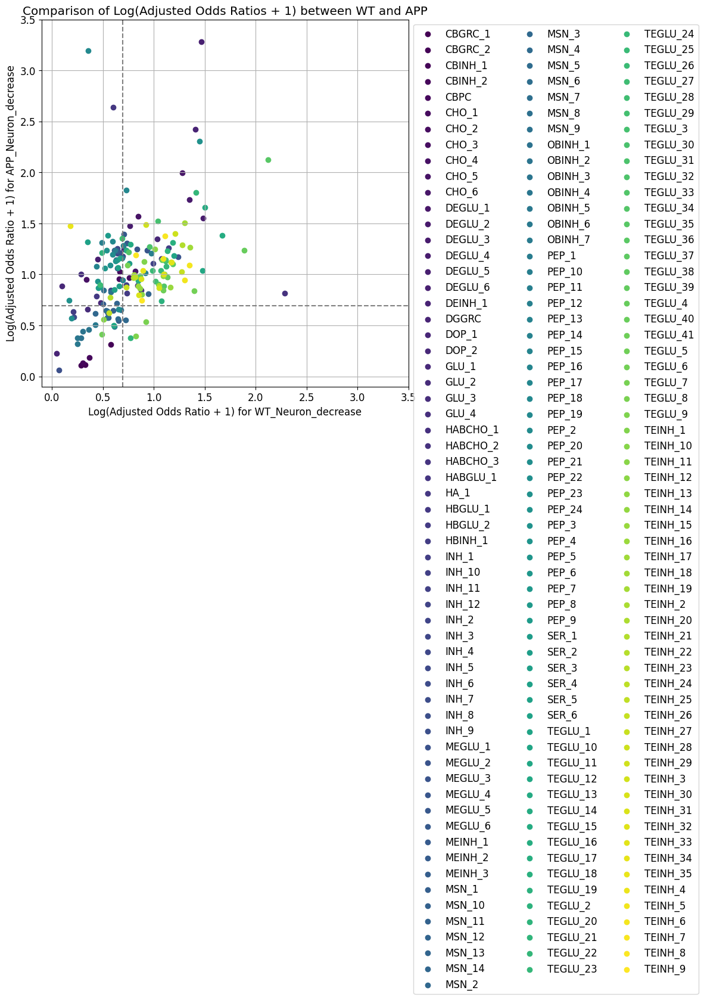

In [109]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Neuron_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           470263  267023
1                           104752    7252
Cross tab for CBGRC_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           455267  282019
1                            92697   19307
Cross tab for CBGRC_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           521470  271012
1                            53545    3263
Cross tab for CBGRC_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           500081  292401
1                            47883    8925
Cross tab for CBINH_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type            

Cross tab for DOP_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547290  301280
1                              674      46
Cross tab for DOP_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574778  274114
1                              237     161
Cross tab for DOP_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547577  301315
1                              387      11
Cross tab for GLU_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571398  272458
1                             3617    1817
Cross tab for GLU_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0 

Cross tab for INH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574482  273638
1                              533     637
Cross tab for INH_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546907  301213
1                             1057     113
Cross tab for INH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570850  270076
1                             4165    4199
Cross tab for INH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           540595  300331
1                             7369     995
Cross tab for INH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0    

Cross tab for MSN_13 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547091  300889
1                              873     437
Cross tab for MSN_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574793  274179
1                              222      96
Cross tab for MSN_14 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547896  301076
1                               68     250
Cross tab for MSN_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           568065  271435
1                             6950    2840
Cross tab for MSN_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                

Cross tab for PEP_12 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574086  273496
1                              929     779
Cross tab for PEP_12 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546353  301229
1                             1611      97
Cross tab for PEP_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574484  273614
1                              531     661
Cross tab for PEP_13 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546898  301200
1                             1066     126
Cross tab for PEP_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                


Cross tab for PEP_8 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           545650  301246
1                             2314      80
Cross tab for PEP_9 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574225  273151
1                              790    1124
Cross tab for PEP_9 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546113  301263
1                             1851      63
Cross tab for SER_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573884  273180
1                             1131    1095
Cross tab for SER_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0 

Cross tab for TEGLU_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571331  270051
1                             3684    4224
Cross tab for TEGLU_20 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546477  294905
1                             1487    6421
Cross tab for TEGLU_21 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570878  273364
1                             4137     911
Cross tab for TEGLU_21 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546925  297317
1                             1039    4009
Cross tab for TEGLU_22 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type       

Cross tab for TEGLU_38 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547738  300692
1                              226     634
Cross tab for TEGLU_39 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574613  273959
1                              402     316
Cross tab for TEGLU_39 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547776  300796
1                              188     530
Cross tab for TEGLU_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573050  272000
1                             1965    2275
Cross tab for TEGLU_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type      

Cross tab for TEINH_19 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574518  273448
1                              497     827
Cross tab for TEINH_19 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547684  300282
1                              280    1044
Cross tab for TEINH_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573299  273103
1                             1716    1172
Cross tab for TEINH_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547097  299305
1                              867    2021
Cross tab for TEINH_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type         

Cross tab for TEINH_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547214  299870
1                              750    1456
Cross tab for TEINH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573751  273325
1                             1264     950
Cross tab for TEINH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547380  299696
1                              584    1630
Cross tab for TEINH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574145  273459
1                              870     816
Cross tab for TEINH_6 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type         

/tmp/ipykernel_14126/885327065.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


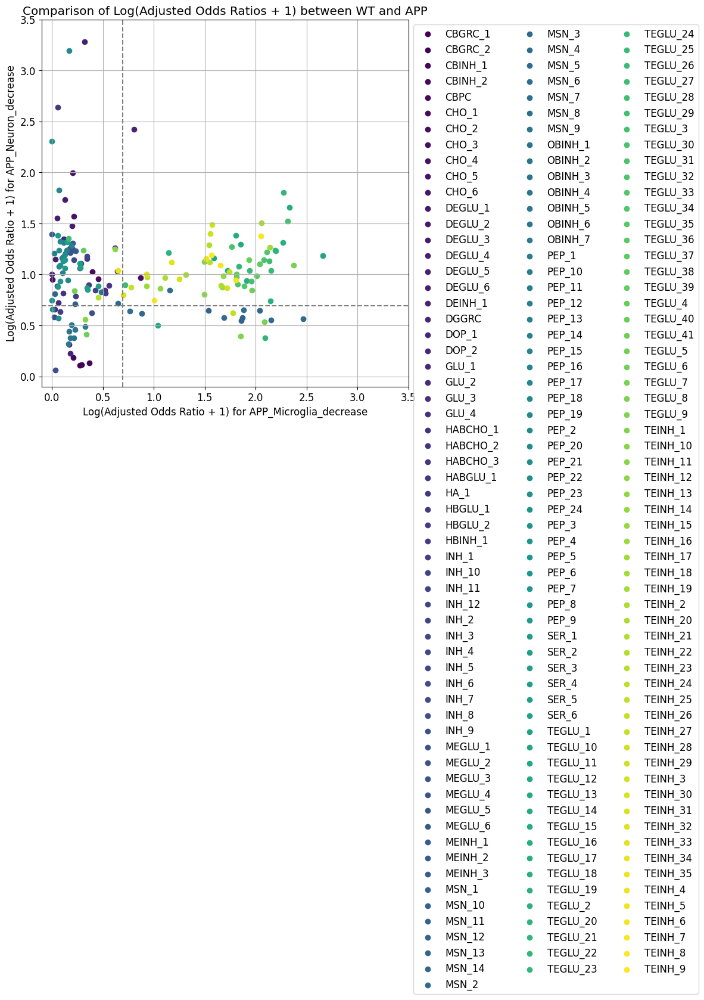

In [111]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           595131  142155
1                           102611    9393
Cross tab for CBGRC_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           505106  232180
1                            82251   29753
Cross tab for CBGRC_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           644930  147552
1                            52812    3996
Cross tab for CBGRC_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           543674  248808
1                            43683   13125
Cross tab for CBINH_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                


Cross tab for DOP_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586678  261892
1                              679      41
Cross tab for DOP_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697353  151539
1                              389       9
Cross tab for DOP_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587012  261880
1                              345      53
Cross tab for GLU_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692949  150907
1                             4793     641
Cross tab for GLU_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0      

Cross tab for INH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696763  151357
1                              979     191
Cross tab for INH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586256  261864
1                             1101      69
Cross tab for INH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           690725  150201
1                             7017    1347
Cross tab for INH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           579746  261180
1                             7611     753
Cross tab for INH_6 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0         

Cross tab for MSN_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586426  261554
1                              931     379
Cross tab for MSN_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697466  151506
1                              276      42
Cross tab for MSN_14 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587204  261768
1                              153     165
Cross tab for MSN_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           688972  150528
1                             8770    1020
Cross tab for MSN_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0   

Cross tab for PEP_12 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696455  151127
1                             1287     421
Cross tab for PEP_12 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585764  261818
1                             1593     115
Cross tab for PEP_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696765  151333
1                              977     215
Cross tab for PEP_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586239  261859
1                             1118      74
Cross tab for PEP_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0    

Cross tab for PEP_8 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585012  261884
1                             2345      49
Cross tab for PEP_9 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696091  151285
1                             1651     263
Cross tab for PEP_9 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585492  261884
1                             1865      49
Cross tab for SER_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695955  151109
1                             1787     439
Cross tab for SER_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0      

Cross tab for TEGLU_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692299  149083
1                             5443    2465
Cross tab for TEGLU_20 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           583686  257696
1                             3671    4237
Cross tab for TEGLU_21 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           693712  150530
1                             4030    1018
Cross tab for TEGLU_21 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586084  258158
1                             1273    3775
Cross tab for TEGLU_22 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type            

Cross tab for TEGLU_38 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587000  261430
1                              357     503
Cross tab for TEGLU_39 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697249  151323
1                              493     225
Cross tab for TEGLU_39 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587093  261479
1                              264     454
Cross tab for TEGLU_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695819  149231
1                             1923    2317
Cross tab for TEGLU_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type           

Cross tab for TEINH_19 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696904  151062
1                              838     486
Cross tab for TEINH_19 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586894  261072
1                              463     861
Cross tab for TEINH_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695683  150719
1                             2059     829
Cross tab for TEINH_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586093  260309
1                             1264    1624
Cross tab for TEINH_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type              

Cross tab for TEINH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586333  260751
1                             1024    1182
Cross tab for TEINH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696341  150735
1                             1401     813
Cross tab for TEINH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586659  260417
1                              698    1516
Cross tab for TEINH_6 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696700  150904
1                             1042     644
Cross tab for TEINH_6 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type              

/tmp/ipykernel_14126/3030419406.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


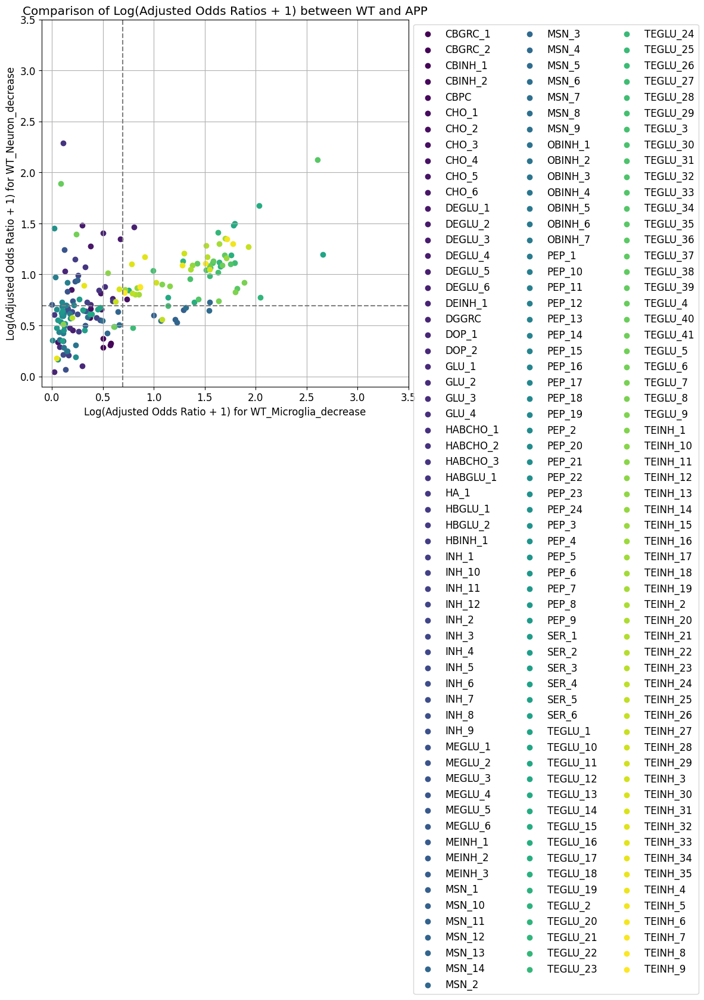

In [112]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for WT_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           470263  267023
1                           104752    7252
Cross tab for CBGRC_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           563495  173791
1                            79579   32425
Cross tab for CBGRC_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           521470  271012
1                            53545    3263
Cross tab for CBGRC_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           605551  186931
1                            37523   19285
Cross tab for CBINH_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type            

Cross tab for DOP_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642489  206081
1                              585     135
Cross tab for DOP_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574778  274114
1                              237     161
Cross tab for DOP_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642827  206065
1                              247     151
Cross tab for GLU_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571398  272458
1                             3617    1817
Cross tab for GLU_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0 

Cross tab for INH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574482  273638
1                              533     637
Cross tab for INH_4 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642581  205539
1                              493     677
Cross tab for INH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570850  270076
1                             4165    4199
Cross tab for INH_5 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           638905  202021
1                             4169    4195
Cross tab for INH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0    

Cross tab for MSN_13 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642111  205869
1                              963     347
Cross tab for MSN_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574793  274179
1                              222      96
Cross tab for MSN_14 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642775  206197
1                              299      19
Cross tab for MSN_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           568065  271435
1                             6950    2840
Cross tab for MSN_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                

Cross tab for PEP_12 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574086  273496
1                              929     779
Cross tab for PEP_12 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642448  205134
1                              626    1082
Cross tab for PEP_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574484  273614
1                              531     661
Cross tab for PEP_13 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642486  205612
1                              588     604
Cross tab for PEP_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                


Cross tab for PEP_8 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573583  273313
1                             1432     962
Cross tab for PEP_8 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642242  204654
1                              832    1562
Cross tab for PEP_9 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574225  273151
1                              790    1124
Cross tab for PEP_9 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642408  204968
1                              666    1248
Cross tab for SER_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0    

Cross tab for TEGLU_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642709  206149
1                              365      67
Cross tab for TEGLU_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571331  270051
1                             3684    4224
Cross tab for TEGLU_20 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           635218  206164
1                             7856      52
Cross tab for TEGLU_21 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570878  273364
1                             4137     911
Cross tab for TEGLU_21 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type     

Cross tab for TEGLU_38 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574543  273887
1                              472     388
Cross tab for TEGLU_38 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642237  206193
1                              837      23
Cross tab for TEGLU_39 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574613  273959
1                              402     316
Cross tab for TEGLU_39 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642373  206199
1                              701      17
Cross tab for TEGLU_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type        

Cross tab for TEINH_18 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642109  206041
1                              965     175
Cross tab for TEINH_19 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574518  273448
1                              497     827
Cross tab for TEINH_19 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           641786  206180
1                             1288      36
Cross tab for TEINH_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573299  273103
1                             1716    1172
Cross tab for TEINH_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type      

Cross tab for TEINH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573932  273152
1                             1083    1123
Cross tab for TEINH_4 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           641011  206073
1                             2063     143
Cross tab for TEINH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573751  273325
1                             1264     950
Cross tab for TEINH_5 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           640929  206147
1                             2145      69
Cross tab for TEINH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type            

/tmp/ipykernel_14126/3217998128.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


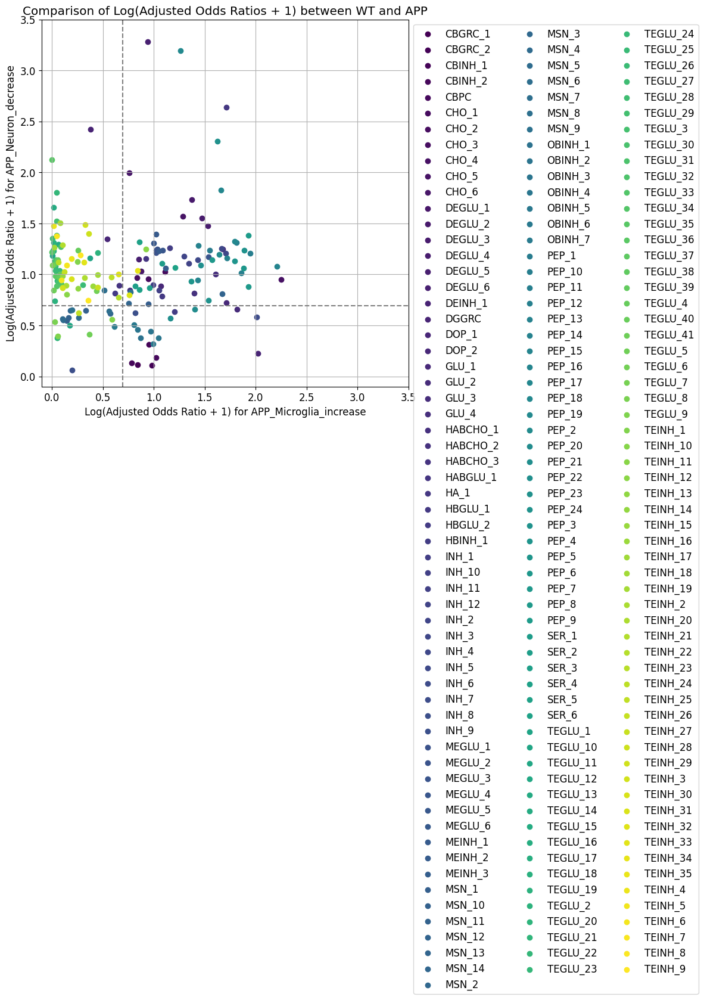

In [116]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_increase')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_increase')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           595131  142155
1                           102611    9393
Cross tab for CBGRC_1 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           683313  53973
1                            99758  12246
Cross tab for CBGRC_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           644930  147552
1                            52812    3996
Cross tab for CBGRC_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           733969  58513
1                            49102   7706
Cross tab for CBINH_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0       

Cross tab for DOP_1 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782473  66097
1                              598    122
Cross tab for DOP_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697353  151539
1                              389       9
Cross tab for DOP_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782743  66149
1                              328     70
Cross tab for GLU_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692949  150907
1                             4793     641
Cross tab for GLU_1 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                

Cross tab for INH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696763  151357
1                              979     191
Cross tab for INH_4 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782092  66028
1                              979    191
Cross tab for INH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           690725  150201
1                             7017    1347
Cross tab for INH_5 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           775627  65299
1                             7444    920
Cross tab for INH_6 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                 

Cross tab for MSN_13 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781830  66150
1                             1241     69
Cross tab for MSN_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697466  151506
1                              276      42
Cross tab for MSN_14 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782763  66209
1                              308     10
Cross tab for MSN_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           688972  150528
1                             8770    1020
Cross tab for MSN_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0             

Cross tab for PEP_12 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696455  151127
1                             1287     421
Cross tab for PEP_12 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781595  65987
1                             1476    232
Cross tab for PEP_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696765  151333
1                              977     215
Cross tab for PEP_13 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782066  66032
1                             1005    187
Cross tab for PEP_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0            

Cross tab for PEP_8 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781450  65446
1                             1621    773
Cross tab for PEP_9 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696091  151285
1                             1651     263
Cross tab for PEP_9 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781626  65750
1                             1445    469
Cross tab for SER_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695955  151109
1                             1787     439
Cross tab for SER_1 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                

Cross tab for TEGLU_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692299  149083
1                             5443    2465
Cross tab for TEGLU_20 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           775183  66199
1                             7888     20
Cross tab for TEGLU_21 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           693712  150530
1                             4030    1018
Cross tab for TEGLU_21 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           778026  66216
1                             5045      3
Cross tab for TEGLU_22 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0  

Cross tab for TEGLU_38 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782215  66215
1                              856      4
Cross tab for TEGLU_39 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697249  151323
1                              493     225
Cross tab for TEGLU_39 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782355  66217
1                              716      2
Cross tab for TEGLU_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695819  149231
1                             1923    2317
Cross tab for TEGLU_4 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0   

Cross tab for TEINH_19 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696904  151062
1                              838     486
Cross tab for TEINH_19 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781763  66203
1                             1308     16
Cross tab for TEINH_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695683  150719
1                             2059     829
Cross tab for TEINH_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           780213  66189
1                             2858     30
Cross tab for TEINH_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0    

Cross tab for TEINH_4 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           780909  66175
1                             2162     44
Cross tab for TEINH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696341  150735
1                             1401     813
Cross tab for TEINH_5 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           780869  66207
1                             2202     12
Cross tab for TEINH_6 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696700  150904
1                             1042     644
Cross tab for TEINH_6 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0      

/tmp/ipykernel_14126/1222442478.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


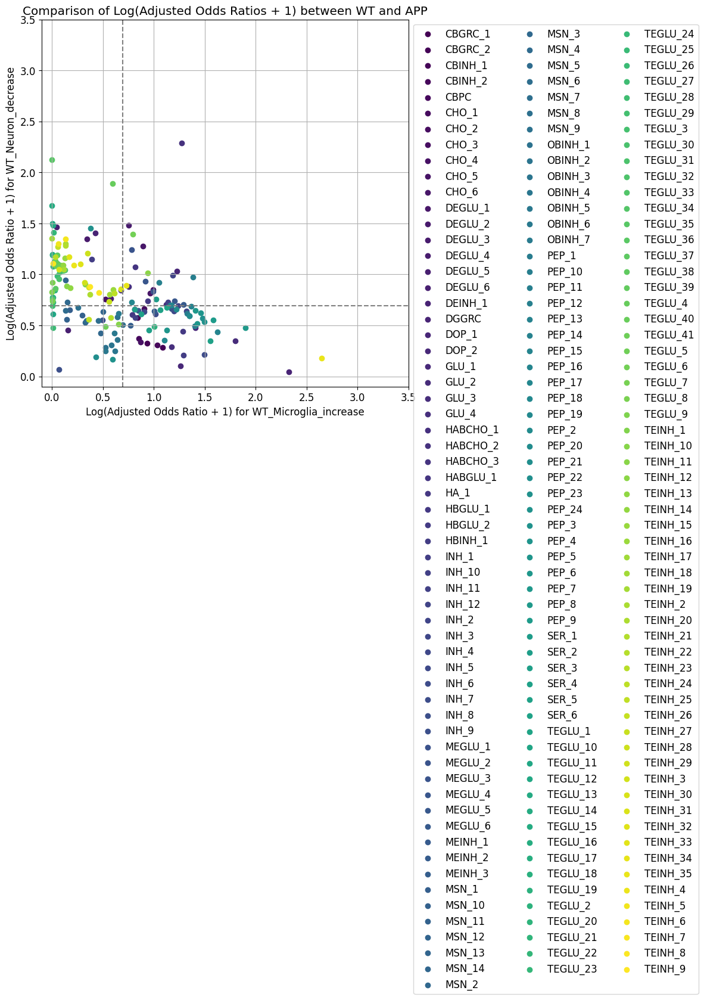

In [115]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_increase')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type))

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_increase')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for WT_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# APPでodds比が1.5倍あがったcell typeを抽出

Cross tab for CBGRC_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           470263  267023
1                           104752    7252
Cross tab for CBGRC_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           595131  142155
1                           102611    9393
Cross tab for CBGRC_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           521470  271012
1                            53545    3263
Cross tab for CBGRC_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           644930  147552
1                            52812    3996
Cross tab for CBINH_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0  

Cross tab for DOP_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697225  151345
1                              517     203
Cross tab for DOP_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574778  274114
1                              237     161
Cross tab for DOP_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697353  151539
1                              389       9
Cross tab for GLU_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571398  272458
1                             3617    1817
Cross tab for GLU_1 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0             

Cross tab for INH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574482  273638
1                              533     637
Cross tab for INH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696763  151357
1                              979     191
Cross tab for INH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570850  270076
1                             4165    4199
Cross tab for INH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           690725  150201
1                             7017    1347
Cross tab for INH_6 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0            

Cross tab for MSN_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574142  273838
1                              873     437
Cross tab for MSN_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696644  151336
1                             1098     212
Cross tab for MSN_14 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574793  274179
1                              222      96
Cross tab for MSN_14 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697466  151506
1                              276      42
Cross tab for MSN_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0        

Cross tab for PEP_11 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696301  151349
1                             1441     199
Cross tab for PEP_12 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574086  273496
1                              929     779
Cross tab for PEP_12 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696455  151127
1                             1287     421
Cross tab for PEP_13 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574484  273614
1                              531     661
Cross tab for PEP_13 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0        

Cross tab for PEP_8 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573583  273313
1                             1432     962
Cross tab for PEP_8 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           695629  151267
1                             2113     281
Cross tab for PEP_9 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574225  273151
1                              790    1124
Cross tab for PEP_9 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696091  151285
1                             1651     263
Cross tab for SER_1 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0            

Cross tab for TEGLU_2 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697362  151496
1                              380      52
Cross tab for TEGLU_20 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           571331  270051
1                             3684    4224
Cross tab for TEGLU_20 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           692299  149083
1                             5443    2465
Cross tab for TEGLU_21 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           570878  273364
1                             4137     911
Cross tab for TEGLU_21 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                


Cross tab for TEGLU_38 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574543  273887
1                              472     388
Cross tab for TEGLU_38 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697144  151286
1                              598     262
Cross tab for TEGLU_39 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574613  273959
1                              402     316
Cross tab for TEGLU_39 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697249  151323
1                              493     225
Cross tab for TEGLU_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                

Cross tab for TEINH_18 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574388  273762
1                              627     513
Cross tab for TEINH_18 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696843  151307
1                              899     241
Cross tab for TEINH_19 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           574518  273448
1                              497     827
Cross tab for TEINH_19 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696904  151062
1                              838     486
Cross tab for TEINH_2 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                

Cross tab for TEINH_35 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           697554  151540
1                              188       8
Cross tab for TEINH_4 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573932  273152
1                             1083    1123
Cross tab for TEINH_4 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0                           696199  150885
1                             1543     663
Cross tab for TEINH_5 (APP_Neuron_decrease):
APP_Neuron_decrease              0       1
is_Sub_molecular_cell_type                
0                           573751  273325
1                             1264     950
Cross tab for TEINH_5 (WT_Neuron_decrease):
WT_Neuron_decrease               0       1
is_Sub_molecular_cell_type                
0  

/tmp/ipykernel_47572/1604899451.py:84: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


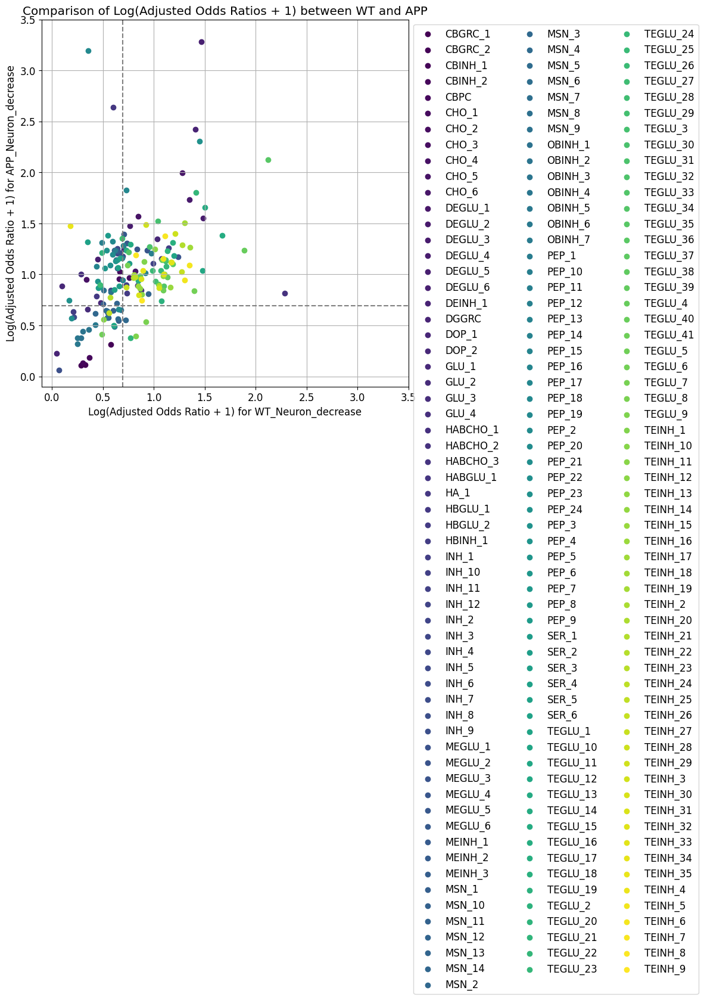

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))

# APPのオッズ比がWTの1.5倍以上になったcell typeを抽出
significant_results = [(log_odds_app, log_odds_wt, neurotransmitter_type) 
                       for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results 
                       #if odds_ratio_app > 3 * odds_ratio_wt]
                        if log_odds_app > 2.5 * log_odds_wt]

results_neuron_decrease = results.copy()

# 抽出されたcell typeの表示
print("Cell types where APP odds ratio is 1.5 times greater than WT odds ratio:")
for _, _, neurotransmitter_type in significant_results:
    print(neurotransmitter_type)

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Neuron_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Neuron_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           455267  282019
1                            92697   19307
Cross tab for CBGRC_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           505106  232180
1                            82251   29753
Cross tab for CBGRC_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           500081  292401
1                            47883    8925
Cross tab for CBGRC_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           543674  248808
1                            43683   13125
Cross tab for CBINH_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type     

Cross tab for DOP_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586678  261892
1                              679      41
Cross tab for DOP_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547577  301315
1                              387      11
Cross tab for DOP_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587012  261880
1                              345      53
Cross tab for GLU_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           542723  301133
1                             5241     193
Cross tab for GLU_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                

Cross tab for INH_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546907  301213
1                             1057     113
Cross tab for INH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586256  261864
1                             1101      69
Cross tab for INH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           540595  300331
1                             7369     995
Cross tab for INH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           579746  261180
1                             7611     753
Cross tab for INH_6 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type               

Cross tab for MSN_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586426  261554
1                              931     379
Cross tab for MSN_14 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547896  301076
1                               68     250
Cross tab for MSN_14 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587204  261768
1                              153     165
Cross tab for MSN_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           542441  297059
1                             5523    4267
Cross tab for MSN_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type             

Cross tab for PEP_12 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546353  301229
1                             1611      97
Cross tab for PEP_12 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585764  261818
1                             1593     115
Cross tab for PEP_13 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546898  301200
1                             1066     126
Cross tab for PEP_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586239  261859
1                             1118      74
Cross tab for PEP_14 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type          

Cross tab for PEP_8 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585012  261884
1                             2345      49
Cross tab for PEP_9 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546113  301263
1                             1851      63
Cross tab for PEP_9 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           585492  261884
1                             1865      49
Cross tab for SER_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546065  300999
1                             1899     327
Cross tab for SER_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                

Cross tab for TEGLU_20 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546477  294905
1                             1487    6421
Cross tab for TEGLU_20 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           583686  257696
1                             3671    4237
Cross tab for TEGLU_21 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           546925  297317
1                             1039    4009
Cross tab for TEGLU_21 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586084  258158
1                             1273    3775
Cross tab for TEGLU_22 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type

Cross tab for TEGLU_38 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587000  261430
1                              357     503
Cross tab for TEGLU_39 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547776  300796
1                              188     530
Cross tab for TEGLU_39 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           587093  261479
1                              264     454
Cross tab for TEGLU_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           544426  300624
1                             3538     702
Cross tab for TEGLU_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type   

Cross tab for TEINH_19 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547684  300282
1                              280    1044
Cross tab for TEINH_19 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586894  261072
1                              463     861
Cross tab for TEINH_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547097  299305
1                              867    2021
Cross tab for TEINH_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586093  260309
1                             1264    1624
Cross tab for TEINH_20 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type  

Cross tab for TEINH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586333  260751
1                             1024    1182
Cross tab for TEINH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547380  299696
1                              584    1630
Cross tab for TEINH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type                
0                           586659  260417
1                              698    1516
Cross tab for TEINH_6 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           547456  300148
1                              508    1178
Cross tab for TEINH_6 (WT_Microglia_decrease):
WT_Microglia_decrease            0       1
is_Sub_molecular_cell_type      

/tmp/ipykernel_47572/2289389597.py:84: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


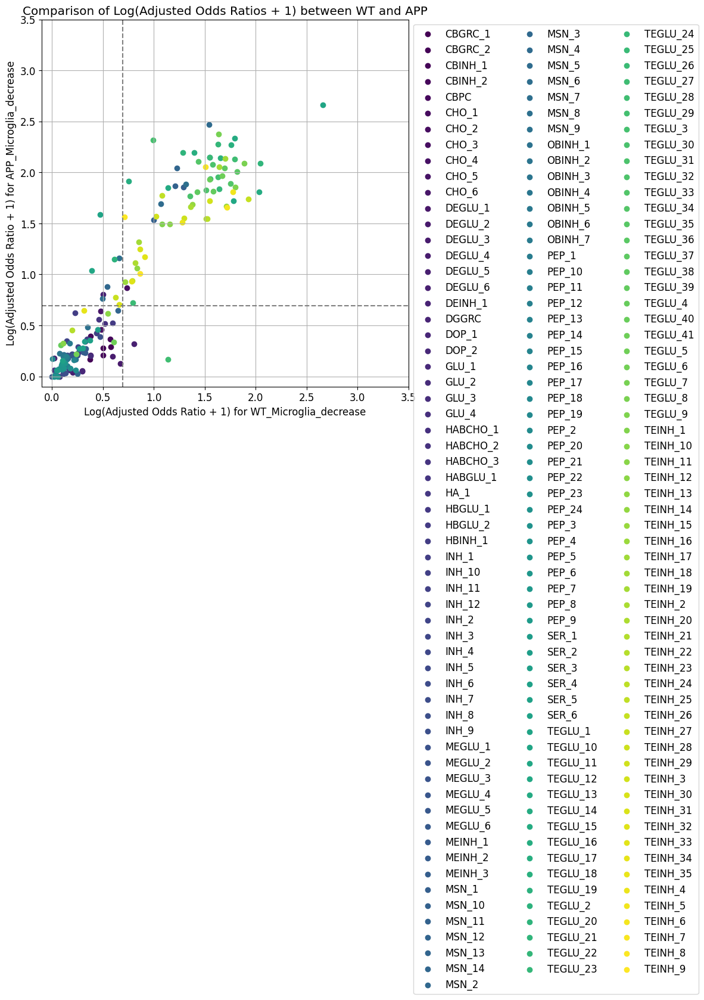

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))

# APPのオッズ比がWTの1.5倍以上になったcell typeを抽出
significant_results_Microglia = [(log_odds_app, log_odds_wt, neurotransmitter_type) 
                       for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results 
                       #if odds_ratio_app > 3 * odds_ratio_wt]
                        if log_odds_app > 2.5 * log_odds_wt]

results_microglia_decrease = results.copy()

# 抽出されたcell typeの表示
print("Cell types where APP odds ratio is 1.5 times greater than WT odds ratio:")
for _, _, neurotransmitter_type in significant_results_Microglia:
    print(neurotransmitter_type)

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


In [44]:
cell_joined_neuron

,NAME,X,Y,Z,Main_molecular_cell_type,Sub_molecular_cell_type,Main_molecular_tissue_region,Sub_molecular_tissue_region,Molecular_spatial_cell_type,x_SyNed,...,x_SCA,y_SCA,z_SCA,APP_Neuron_decrease,APP_Microglia_decrease,APP_Microglia_increase,WT_Neuron_decrease,WT_Microglia_decrease,WT_Microglia_increase,is_Sub_molecular_cell_type
0,sagittal3_0,6217.877833,14959.905111,0.651667,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_7,INH_9-MB_P_MY_7,0.651667,...,6075.651667,14247.450000,5846.4326,0,0,0,0,0,0,0
1,sagittal3_1,6048.941219,14891.373938,1.633359,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_12,INH_9-MB_P_MY_12,1.633359,...,6076.633359,14163.698000,5681.3920,0,0,0,0,0,0,0
3,sagittal3_3,6059.608476,14876.100190,1.519643,Cholinergic and monoaminergic neurons,SER_2,MYdp,MB_P_MY_12,SER_2-MB_P_MY_12,1.519643,...,6076.519643,14149.886000,5693.0420,0,0,0,0,0,0,0
4,sagittal3_4,6099.589060,14867.274916,1.666807,Hindbrain neurons/Spinal cord neurons,INH_10,MYdp,MB_P_MY_12,INH_10-MB_P_MY_12,1.666807,...,6076.666807,14145.299000,5733.6704,0,0,0,0,0,0,0
5,sagittal3_5,6220.140316,14855.193895,2.651053,Hindbrain neurons/Spinal cord neurons,INH_8,MYdp,MB_P_MY_7,INH_8-MB_P_MY_7,2.651053,...,6077.651053,14145.633000,5855.2637,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482646,well10_63331,3069.829133,262.416450,4.436125,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1587.008800,...,1587.008800,11279.436125,4726.0120,0,0,0,0,0,0,0
1482649,well10_63334,3165.455429,201.542714,6.489286,Cerebellum neurons,CBINH_1,CB_2,MNG_1,CBINH_1-MNG_1,1541.560200,...,1541.560200,11281.489286,4846.8813,0,0,1,0,0,0,0
1482650,well10_63335,3078.784105,252.302158,4.194474,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1577.732400,...,1577.732400,11279.194474,4738.5140,0,0,0,0,0,0,0
1482651,well10_63336,3084.357744,256.290154,6.174615,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1581.926500,...,1581.926500,11281.174615,4743.3960,0,0,0,0,0,0,0


Cross tab for CBGRC_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           563495  173791
1                            79579   32425
Cross tab for CBGRC_1 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           683313  53973
1                            99758  12246
Cross tab for CBGRC_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           605551  186931
1                            37523   19285
Cross tab for CBGRC_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           733969  58513
1                            49102   7706
Cross tab for CBINH_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type             

Cross tab for DOP_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642489  206081
1                              585     135
Cross tab for DOP_1 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782473  66097
1                              598    122
Cross tab for DOP_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642827  206065
1                              247     151
Cross tab for DOP_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782743  66149
1                              328     70
Cross tab for GLU_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0     

Cross tab for INH_4 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642581  205539
1                              493     677
Cross tab for INH_4 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782092  66028
1                              979    191
Cross tab for INH_5 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           638905  202021
1                             4169    4195
Cross tab for INH_5 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           775627  65299
1                             7444    920
Cross tab for INH_6 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0     

Cross tab for MSN_13 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642111  205869
1                              963     347
Cross tab for MSN_13 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781830  66150
1                             1241     69
Cross tab for MSN_14 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642775  206197
1                              299      19
Cross tab for MSN_14 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782763  66209
1                              308     10
Cross tab for MSN_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0 

Cross tab for PEP_11 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781768  65882
1                             1303    337
Cross tab for PEP_12 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642448  205134
1                              626    1082
Cross tab for PEP_12 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781595  65987
1                             1476    232
Cross tab for PEP_13 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642486  205612
1                              588     604
Cross tab for PEP_13 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0   

Cross tab for PEP_8 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642242  204654
1                              832    1562
Cross tab for PEP_8 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781450  65446
1                             1621    773
Cross tab for PEP_9 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642408  204968
1                              666    1248
Cross tab for PEP_9 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781626  65750
1                             1445    469
Cross tab for SER_1 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0     

Cross tab for TEGLU_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782694  66164
1                              377     55
Cross tab for TEGLU_20 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           635218  206164
1                             7856      52
Cross tab for TEGLU_20 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           775183  66199
1                             7888     20
Cross tab for TEGLU_21 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           638110  206132
1                             4964      84
Cross tab for TEGLU_21 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type           

Cross tab for TEGLU_38 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642237  206193
1                              837      23
Cross tab for TEGLU_38 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782215  66215
1                              856      4
Cross tab for TEGLU_39 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           642373  206199
1                              701      17
Cross tab for TEGLU_39 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782355  66217
1                              716      2
Cross tab for TEGLU_4 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type         

Cross tab for TEINH_18 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           782000  66150
1                             1071     69
Cross tab for TEINH_19 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           641786  206180
1                             1288      36
Cross tab for TEINH_19 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           781763  66203
1                             1308     16
Cross tab for TEINH_2 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           640322  206080
1                             2752     136
Cross tab for TEINH_2 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type            

Cross tab for TEINH_4 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           641011  206073
1                             2063     143
Cross tab for TEINH_4 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           780909  66175
1                             2162     44
Cross tab for TEINH_5 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type                
0                           640929  206147
1                             2145      69
Cross tab for TEINH_5 (WT_Microglia_increase):
WT_Microglia_increase            0      1
is_Sub_molecular_cell_type               
0                           780869  66207
1                             2202     12
Cross tab for TEINH_6 (APP_Microglia_increase):
APP_Microglia_increase           0       1
is_Sub_molecular_cell_type             

/tmp/ipykernel_47572/3011441400.py:84: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


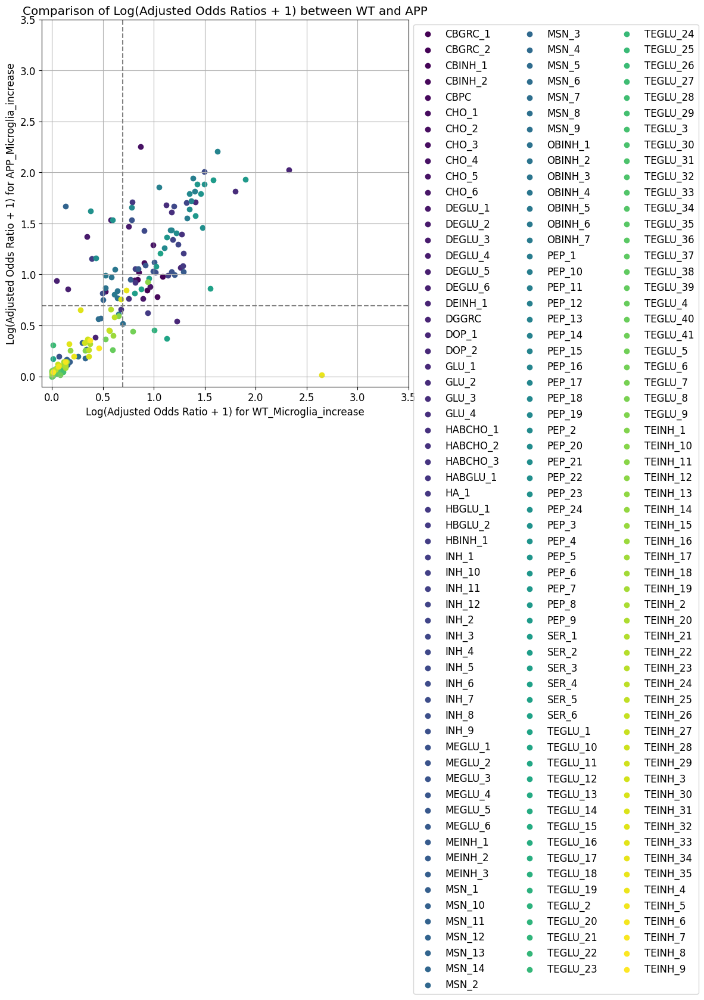

In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_increase')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_increase')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))

# APPのオッズ比がWTの1.5倍以上になったcell typeを抽出
significant_results_Microglia = [(log_odds_app, log_odds_wt, neurotransmitter_type) 
                       for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results 
                       #if odds_ratio_app > 3 * odds_ratio_wt]
                        if log_odds_app > 2.5 * log_odds_wt]

results_microglia_increase = results.copy()

# 抽出されたcell typeの表示
print("Cell types where APP odds ratio is 1.5 times greater than WT odds ratio:")
for _, _, neurotransmitter_type in significant_results_Microglia:
    print(neurotransmitter_type)

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_increase')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_increase')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


In [46]:
cell_joined_neuron

,NAME,X,Y,Z,Main_molecular_cell_type,Sub_molecular_cell_type,Main_molecular_tissue_region,Sub_molecular_tissue_region,Molecular_spatial_cell_type,x_SyNed,...,x_SCA,y_SCA,z_SCA,APP_Neuron_decrease,APP_Microglia_decrease,APP_Microglia_increase,WT_Neuron_decrease,WT_Microglia_decrease,WT_Microglia_increase,is_Sub_molecular_cell_type
0,sagittal3_0,6217.877833,14959.905111,0.651667,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_7,INH_9-MB_P_MY_7,0.651667,...,6075.651667,14247.450000,5846.4326,0,0,0,0,0,0,0
1,sagittal3_1,6048.941219,14891.373938,1.633359,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_12,INH_9-MB_P_MY_12,1.633359,...,6076.633359,14163.698000,5681.3920,0,0,0,0,0,0,0
3,sagittal3_3,6059.608476,14876.100190,1.519643,Cholinergic and monoaminergic neurons,SER_2,MYdp,MB_P_MY_12,SER_2-MB_P_MY_12,1.519643,...,6076.519643,14149.886000,5693.0420,0,0,0,0,0,0,0
4,sagittal3_4,6099.589060,14867.274916,1.666807,Hindbrain neurons/Spinal cord neurons,INH_10,MYdp,MB_P_MY_12,INH_10-MB_P_MY_12,1.666807,...,6076.666807,14145.299000,5733.6704,0,0,0,0,0,0,0
5,sagittal3_5,6220.140316,14855.193895,2.651053,Hindbrain neurons/Spinal cord neurons,INH_8,MYdp,MB_P_MY_7,INH_8-MB_P_MY_7,2.651053,...,6077.651053,14145.633000,5855.2637,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482646,well10_63331,3069.829133,262.416450,4.436125,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1587.008800,...,1587.008800,11279.436125,4726.0120,0,0,0,0,0,0,0
1482649,well10_63334,3165.455429,201.542714,6.489286,Cerebellum neurons,CBINH_1,CB_2,MNG_1,CBINH_1-MNG_1,1541.560200,...,1541.560200,11281.489286,4846.8813,0,0,1,0,0,0,0
1482650,well10_63335,3078.784105,252.302158,4.194474,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1577.732400,...,1577.732400,11279.194474,4738.5140,0,0,0,0,0,0,0
1482651,well10_63336,3084.357744,256.290154,6.174615,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1581.926500,...,1581.926500,11281.174615,4743.3960,0,0,0,0,0,0,0


In [47]:
#cell_joined_neuron[]
#new_columns = ['DAM_positive_cell', ]
#for col in new_columns:
#    cell_joined[col] = 0

Cross tab for CBGRC_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           603608  133678
1                           111147     857
Cross tab for CBGRC_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           662869  74417
1                           106040   5964
Cross tab for CBGRC_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           658465  134017
1                            56290     518
Cross tab for CBGRC_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           714529  77953
1                            54380   2428
Cross tab for CBINH_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type             

Cross tab for DOP_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714059  134511
1                              696      24
Cross tab for DOP_1 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768206  80364
1                              703     17
Cross tab for DOP_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714358  134534
1                              397       1
Cross tab for DOP_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768512  80380
1                              397      1
Cross tab for GLU_1 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0     

Cross tab for INH_3 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           764305  80293
1                             4604     88
Cross tab for INH_4 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           713669  134451
1                             1086      84
Cross tab for INH_4 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767758  80362
1                             1151     19
Cross tab for INH_5 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           707017  133909
1                             7738     626
Cross tab for INH_5 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0        

Cross tab for MSN_12 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767210  80332
1                             1699     49
Cross tab for MSN_13 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           713623  134357
1                             1132     178
Cross tab for MSN_13 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767737  80243
1                             1172    138
Cross tab for MSN_14 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714521  134451
1                              234      84
Cross tab for MSN_14 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0   

Cross tab for PEP_11 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           713188  134462
1                             1567      73
Cross tab for PEP_11 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767294  80356
1                             1615     25
Cross tab for PEP_12 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           713080  134502
1                             1675      33
Cross tab for PEP_12 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767277  80305
1                             1632     76
Cross tab for PEP_13 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0

Cross tab for PEP_7 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           712570  134440
1                             2185      95
Cross tab for PEP_7 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           766670  80340
1                             2239     41
Cross tab for PEP_8 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           712409  134487
1                             2346      48
Cross tab for PEP_8 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           766529  80367
1                             2380     14
Cross tab for PEP_9 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0     

Cross tab for TEGLU_19 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           709764  132236
1                             4991    2299
Cross tab for TEGLU_19 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           763181  78819
1                             5728   1562
Cross tab for TEGLU_2 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714485  134373
1                              270     162
Cross tab for TEGLU_2 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768505  80353
1                              404     28
Cross tab for TEGLU_20 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type          

Cross tab for TEGLU_36 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714017  134035
1                              738     500
Cross tab for TEGLU_36 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767896  80156
1                             1013    225
Cross tab for TEGLU_37 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714225  134135
1                              530     400
Cross tab for TEGLU_37 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768222  80138
1                              687    243
Cross tab for TEGLU_38 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type        

Cross tab for TEINH_16 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           713785  134237
1                              970     298
Cross tab for TEINH_16 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           767764  80258
1                             1145    123
Cross tab for TEINH_17 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714104  133926
1                              651     609
Cross tab for TEINH_17 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768039  79991
1                              870    390
Cross tab for TEINH_18 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type        

Cross tab for TEINH_33 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768750  80344
1                              159     37
Cross tab for TEINH_34 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714689  134517
1                               66      18
Cross tab for TEINH_34 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type               
0                           768829  80377
1                               80      4
Cross tab for TEINH_35 (APP_Microglia_decrease):
APP_Microglia_decrease           0       1
is_Sub_molecular_cell_type                
0                           714675  134419
1                               80     116
Cross tab for TEINH_35 (WT_Microglia_decrease):
WT_Microglia_decrease            0      1
is_Sub_molecular_cell_type          

/tmp/ipykernel_47572/1052171454.py:87: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


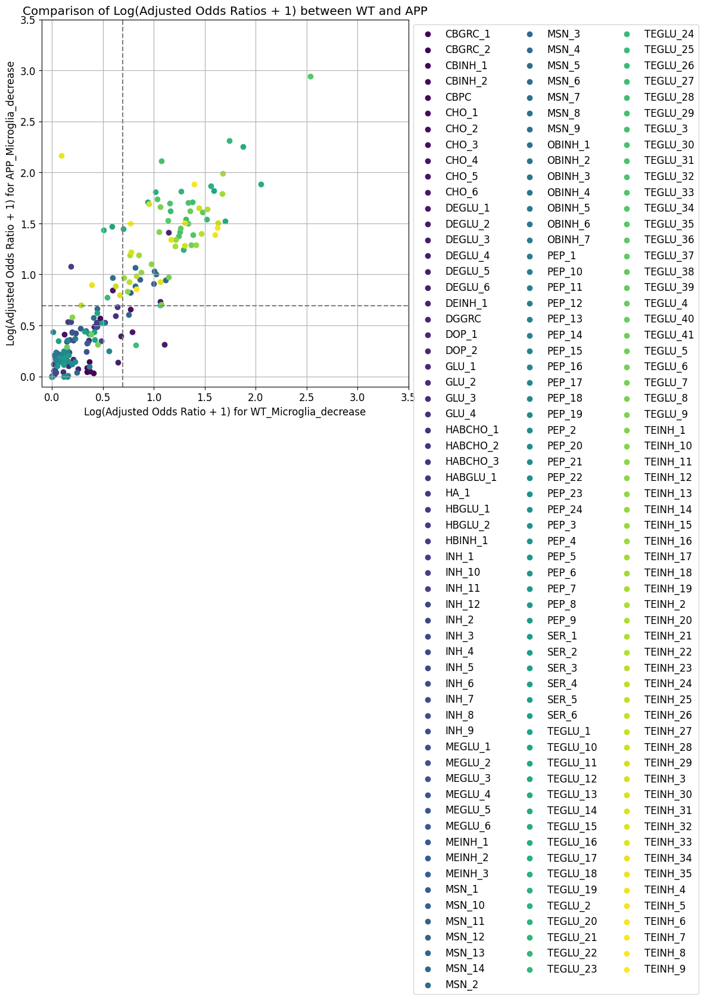

In [48]:
# microlia decrease かつ　neuron decrease
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome,outcome2):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    df3 = df.copy()
    df3[outcome] =(df[outcome].astype(bool) & df[outcome2].astype(bool)).astype(int)
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df3[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_decrease', 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_decrease', 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))

# APPのオッズ比がWTの1.5倍以上になったcell typeを抽出
significant_results_Microglia = [(log_odds_app, log_odds_wt, neurotransmitter_type) 
                       for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results 
                       #if odds_ratio_app > 3 * odds_ratio_wt]
                        if log_odds_app > 2.5 * log_odds_wt]

results_microglia_decrease_and_neuron_decrease = results.copy()

# 抽出されたcell typeの表示
print("Cell types where APP odds ratio is 1.5 times greater than WT odds ratio:")
for _, _, neurotransmitter_type in significant_results_Microglia:
    print(neurotransmitter_type)

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Cross tab for CBGRC_1 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           690120  47166
1                           110366   1638
Cross tab for CBGRC_1 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           734050  3236
1                           111587   417
Cross tab for CBGRC_2 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           744475  48007
1                            56011    797
Cross tab for CBGRC_2 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           789019  3463
1                            56618   190
Cross tab for CBINH_1 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0             

Cross tab for DOP_1 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844922  3648
1                              715     5
Cross tab for DOP_2 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           800113  48779
1                              373     25
Cross tab for DOP_2 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           845240  3652
1                              397     1
Cross tab for GLU_1 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           795882  47974
1                             4604    830
Cross tab for GLU_1 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                          

Cross tab for INH_4 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844482  3638
1                             1155    15
Cross tab for INH_5 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           794019  46907
1                             6467   1897
Cross tab for INH_5 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           837331  3595
1                             8306    58
Cross tab for INH_6 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           796060  48004
1                             4426    800
Cross tab for INH_6 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                          

Cross tab for MSN_14 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           845319  3653
1                              318     0
Cross tab for MSN_2 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           791224  48276
1                             9262    528
Cross tab for MSN_2 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           835874  3626
1                             9763    27
Cross tab for MSN_3 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           792667  48743
1                             7819     61
Cross tab for MSN_3 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                         

Cross tab for PEP_13 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844459  3639
1                             1178    14
Cross tab for PEP_14 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           799518  48450
1                              968    354
Cross tab for PEP_14 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844332  3636
1                             1305    17
Cross tab for PEP_15 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           799562  48408
1                              924    396
Cross tab for PEP_15 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                     

Cross tab for SER_1 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           843435  3629
1                             2202    24
Cross tab for SER_2 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           798899  48597
1                             1587    207
Cross tab for SER_2 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           843852  3644
1                             1785     9
Cross tab for SER_3 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           798994  48618
1                             1492    186
Cross tab for SER_3 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                          

Cross tab for TEGLU_22 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           840789  3653
1                             4848     0
Cross tab for TEGLU_23 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           795462  48786
1                             5024     18
Cross tab for TEGLU_23 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           840596  3652
1                             5041     1
Cross tab for TEGLU_24 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           796208  48774
1                             4278     30
Cross tab for TEGLU_24 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0           

Cross tab for TEGLU_40 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           799768  48800
1                              718      4
Cross tab for TEGLU_40 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844915  3653
1                              722     0
Cross tab for TEGLU_41 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           799915  48803
1                              571      1
Cross tab for TEGLU_41 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           845065  3653
1                              572     0
Cross tab for TEGLU_5 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0         

Cross tab for TEINH_21 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           799430  48792
1                             1056     12
Cross tab for TEINH_21 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844570  3652
1                             1067     1
Cross tab for TEINH_22 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           799344  48730
1                             1142     74
Cross tab for TEINH_22 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           844424  3650
1                             1213     3
Cross tab for TEINH_23 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0        

Cross tab for TEINH_8 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           798806  48740
1                             1680     64
Cross tab for TEINH_8 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           843896  3650
1                             1741     3
Cross tab for TEINH_9 (APP_Microglia_increase):
APP_Microglia_increase           0      1
is_Sub_molecular_cell_type               
0                           798884  48742
1                             1602     62
Cross tab for TEINH_9 (WT_Microglia_increase):
WT_Microglia_increase            0     1
is_Sub_molecular_cell_type              
0                           843979  3647
1                             1658     6
Cell types where APP odds ratio is 1.5 times greater than WT odds ratio:
CHO_4
CHO_5
DEGLU_1
DEGLU_4
DEGLU_6
DEINH_1
DGGRC
GLU_1
GLU_3
GLU_4
HBGLU

/tmp/ipykernel_47572/2100910031.py:87: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


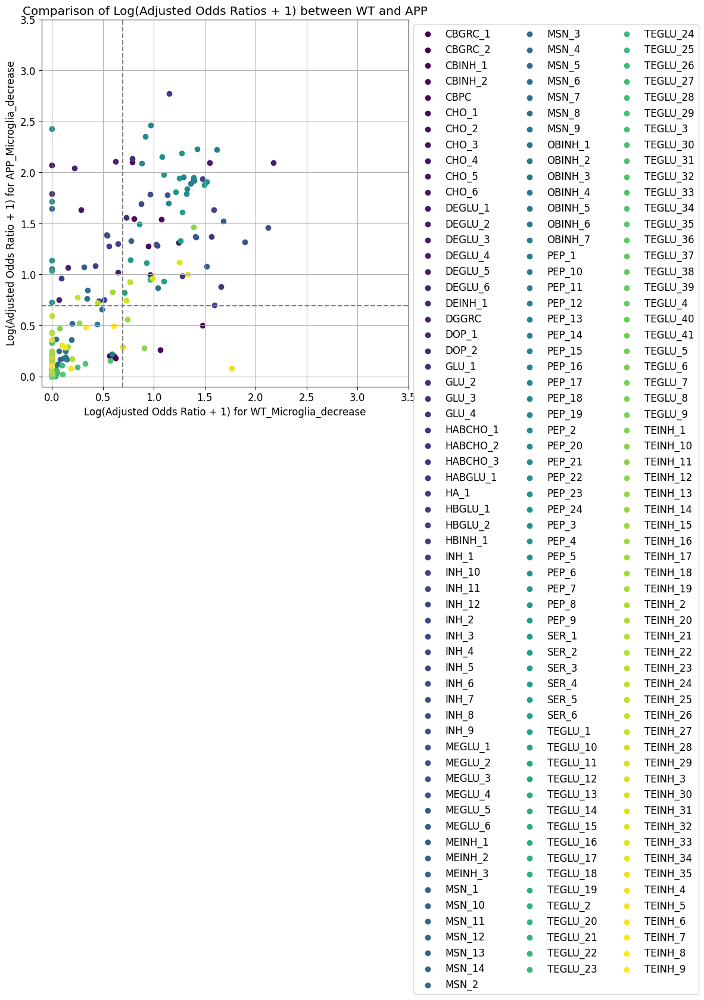

In [49]:
# microlia increase かつ　neuron decrease
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats

# オッズ比と信頼区間の計算関数（補正付き）
def calculate_adjusted_odds_ratio(df, neurotransmitter_type, outcome,outcome2):
    df['is_Sub_molecular_cell_type'] = ((df['Sub_molecular_cell_type'] == neurotransmitter_type)).astype(int)
    
    df3 = df.copy()
    df3[outcome] =(df[outcome].astype(bool) & df[outcome2].astype(bool)).astype(int)
    # クロス集計表の作成
    cross_tab = pd.crosstab(df['is_Sub_molecular_cell_type'], df3[outcome])
    
    # クロス集計表の確認
    print(f"Cross tab for {neurotransmitter_type} ({outcome}):")
    print(cross_tab)
    
    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        table = np.array([
            [cross_tab.loc[1, 1], cross_tab.loc[1, 0]],
            [cross_tab.loc[0, 1], cross_tab.loc[0, 0]]
        ])
        
        odds_ratio, p_value = stats.fisher_exact(table)
        
        return odds_ratio

    return None

# プロットデータの準備
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())
results = []
for neurotransmitter_type in neurotransmitter_types:
    odds_ratio_app = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'APP_Microglia_increase', 'APP_Neuron_decrease')
    odds_ratio_wt = calculate_adjusted_odds_ratio(cell_joined_neuron, neurotransmitter_type, 'WT_Microglia_increase', 'WT_Neuron_decrease')
    
    if odds_ratio_app is not None and odds_ratio_wt is not None:
        log_odds_app = np.log(odds_ratio_app + 1)
        log_odds_wt = np.log(odds_ratio_wt + 1)
        results.append((log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt))

# APPのオッズ比がWTの1.5倍以上になったcell typeを抽出
significant_results_Microglia = [(log_odds_app, log_odds_wt, neurotransmitter_type) 
                       for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results 
                       #if odds_ratio_app > 3 * odds_ratio_wt]
                        if log_odds_app > 2.5 * log_odds_wt]

results_microglia_increase_and_neuron_decrease = results.copy()

# 抽出されたcell typeの表示
print("Cell types where APP odds ratio is 1.5 times greater than WT odds ratio:")
for _, _, neurotransmitter_type in significant_results_Microglia:
    print(neurotransmitter_type)

# プロットの作成
fig, ax = plt.subplots(figsize=(8, 8))

# カラーマップの設定
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(results)))

for i, (log_odds_app, log_odds_wt, neurotransmitter_type, _, _) in enumerate(results):
    ax.scatter(log_odds_wt, log_odds_app, label=neurotransmitter_type, color=colors[i])

# オッズ比が1の場所に点線を引く
ax.axhline(np.log(1 + 1), color='grey', linestyle='--')
ax.axvline(np.log(1 + 1), color='grey', linestyle='--')

# グラフのスケールを等方的に設定
ax.set_aspect('equal', adjustable='box')

# 軸の範囲を設定
ax.set_xlim([-0.1, 3.5])
ax.set_ylim([-0.1, 3.5])

ax.set_xlabel('Log(Adjusted Odds Ratio + 1) for WT_Microglia_decrease')
ax.set_ylabel('Log(Adjusted Odds Ratio + 1) for APP_Microglia_decrease')
ax.set_title('Comparison of Log(Adjusted Odds Ratios + 1) between WT and APP')

# 凡例を3段に分けて表示
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


In [31]:
# Region scaleではどうか



In [223]:
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_increase = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_increase))
print(len(significant_results_Microglia_increase))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Microglia_increase

10
10
0.005991320098621487
4.543070668723421


[(0.8536533074393491, 0.15728933478582896, 'DEGLU_5'),
 (0.93808454727986, 0.049349126324420844, 'DEGLU_6'),
 (1.6684766275990748, 0.13411467636261595, 'MSN_12'),
 (0.1737865292546021, 0.01070287460646216, 'TEGLU_11'),
 (0.04815657055788946, 0.009987804765195034, 'TEGLU_12'),
 (0.0621002196082843, 0.009774053615343966, 'TEGLU_13'),
 (0.05105795085952691, 0.0069627121549181645, 'TEGLU_21'),
 (0.3065263127493248, 0.011679592674044975, 'TEGLU_26'),
 (0.028232456326484426, 0.006214399551574134, 'TEGLU_8'),
 (0.05611279585924302, 0.0023990804099677946, 'TEGLU_9')]

In [ ]:

a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_increase)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_decrease))
print(len(significant_results_Microglia_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Microglia_decrease

In [228]:

a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_decrease)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_decrease))
print(len(significant_results_Microglia_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Microglia_decrease

19
19
0.06023876949836626
2.645777063655272


[(0.18116377959273536, 0.021885340503403548, 'DGGRC'),
 (0.05910363414938108, 0.020733055229118894, 'HA_1'),
 (0.6221602359362807, 0.22684770302723797, 'INH_1'),
 (0.3470735786290064, 0.14820467736373383, 'INH_2'),
 (0.21492460858299417, 0.11604427768202967, 'OBINH_1'),
 (0.22797791689205849, 0.07378998227286275, 'OBINH_3'),
 (0.32489994950528656, 0.17674861716856452, 'OBINH_7'),
 (0.1699641149792169, 0.002878011806191322, 'PEP_19'),
 (1.5895906485424707, 0.47339380710919887, 'TEGLU_1'),
 (1.0385231314650558, 0.39252102746339657, 'TEGLU_11'),
 (1.912763434791417, 0.756001491874228, 'TEGLU_16'),
 (1.147415124285613, 0.6111842445134322, 'TEGLU_2'),
 (2.3150666271844327, 0.9926595014412071, 'TEGLU_3'),
 (0.30699254884646315, 0.08690478603554003, 'TEGLU_4'),
 (0.32432596686925425, 0.11291839304382152, 'TEINH_10'),
 (0.45543659294252514, 0.1992371856313618, 'TEINH_22'),
 (0.646708397446869, 0.31751048535161575, 'TEINH_34'),
 (3.5508964176882083, 0.045644254085725075, 'TEINH_35'),
 (1.563585

In [229]:
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_decrease)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Neuron_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Neuron_decrease))
print(len(significant_results_Neuron_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Neuron_decrease

19
19
0.35461405437483273
2.9926785234573066


[(0.952531834352598, 0.33740767763483975, 'CHO_4'),
 (1.1461481259179962, 0.45238073276957314, 'DEGLU_5'),
 (0.22460501605350594, 0.044508474043039425, 'DGGRC'),
 (0.885603666696573, 0.10117341842530328, 'DOP_2'),
 (1.0013985401433294, 0.2875029791058814, 'GLU_4'),
 (2.639513281897721, 0.6044309297228896, 'HA_1'),
 (0.6362705723593047, 0.2104639122769816, 'HBINH_1'),
 (0.5840356320503859, 0.2149081296405602, 'INH_6'),
 (1.3131959495867378, 0.49185105583477656, 'PEP_11'),
 (1.0783229617335803, 0.4355606433129, 'PEP_15'),
 (1.8258345938696368, 0.7298705578764823, 'PEP_17'),
 (3.196524304771254, 0.3552482260656592, 'PEP_19'),
 (0.5707834846250859, 0.19072662838696267, 'PEP_21'),
 (0.7466489359267514, 0.1690233689412472, 'PEP_24'),
 (1.2363146532315756, 0.5364026356211611, 'PEP_3'),
 (1.3840454646517282, 0.5498295168322317, 'PEP_9'),
 (1.319192533818274, 0.347958874866659, 'SER_5'),
 (1.2137688975827026, 0.4885233359806464, 'TEGLU_2'),
 (1.4778223681766207, 0.1788795224567399, 'TEINH_35')]

In [230]:
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease_and_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_decrease)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_decrease_and_Neuron_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease_and_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Neuron_decrease))
print(len(significant_results_Neuron_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Neuron_decrease

19
19
0.06549572910437912
3.7622522783455166


[(0.952531834352598, 0.33740767763483975, 'CHO_4'),
 (1.1461481259179962, 0.45238073276957314, 'DEGLU_5'),
 (0.22460501605350594, 0.044508474043039425, 'DGGRC'),
 (0.885603666696573, 0.10117341842530328, 'DOP_2'),
 (1.0013985401433294, 0.2875029791058814, 'GLU_4'),
 (2.639513281897721, 0.6044309297228896, 'HA_1'),
 (0.6362705723593047, 0.2104639122769816, 'HBINH_1'),
 (0.5840356320503859, 0.2149081296405602, 'INH_6'),
 (1.3131959495867378, 0.49185105583477656, 'PEP_11'),
 (1.0783229617335803, 0.4355606433129, 'PEP_15'),
 (1.8258345938696368, 0.7298705578764823, 'PEP_17'),
 (3.196524304771254, 0.3552482260656592, 'PEP_19'),
 (0.5707834846250859, 0.19072662838696267, 'PEP_21'),
 (0.7466489359267514, 0.1690233689412472, 'PEP_24'),
 (1.2363146532315756, 0.5364026356211611, 'PEP_3'),
 (1.3840454646517282, 0.5498295168322317, 'PEP_9'),
 (1.319192533818274, 0.347958874866659, 'SER_5'),
 (1.2137688975827026, 0.4885233359806464, 'TEGLU_2'),
 (1.4778223681766207, 0.1788795224567399, 'TEINH_35')]

In [231]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             148  14
1              14   5
Fisher's Exact Test Results:
Odds Ratio: 3.7755102040816326
P-value: 0.03323459588180673


In [232]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_increase])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             153  9
1              18  1
Fisher's Exact Test Results:
Odds Ratio: 0.9444444444444444
P-value: 0.6799548202159414


In [227]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             165  6
1               6  4
Fisher's Exact Test Results:
Odds Ratio: 18.333333333333332
P-value: 0.0008632561630979431


In [173]:
neuron_cell_types

{'DGGRC',
 'DOP_2',
 'GLU_4',
 'HA_1',
 'HBINH_1',
 'PEP_19',
 'PEP_21',
 'PEP_24',
 'SER_5',
 'TEINH_35'}

In [174]:
microglia_cell_types

{'DGGRC',
 'HA_1',
 'INH_1',
 'OBINH_3',
 'PEP_19',
 'TEGLU_1',
 'TEGLU_11',
 'TEGLU_4',
 'TEINH_10',
 'TEINH_35'}

In [175]:
# 両方に含まれるタイプを抽出するために、set の intersection を使用
filtered_type = neuron_cell_types.intersection(microglia_cell_types)

# 抽出した結果を表示
print(filtered_type)

{'PEP_19', 'HA_1', 'TEINH_35', 'DGGRC'}


In [164]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_increase])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             161  10
1              10   0
Fisher's Exact Test Results:
Odds Ratio: 0.0
P-value: 1.0


In [121]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease_and_Neuron_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             166  5
1               5  5
Fisher's Exact Test Results:
Odds Ratio: 33.2
P-value: 3.675491443030637e-05


In [119]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             165  6
1               6  4
Fisher's Exact Test Results:
Odds Ratio: 18.333333333333332
P-value: 0.0008632561630979431


In [37]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_increase])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             161  10
1              10   0
Fisher's Exact Test Results:
Odds Ratio: 0.0
P-value: 1.0


In [314]:
thresh = np.log(0.1+1)
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > thresh
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_increase = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > thresh and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_increase))
print(len(significant_results_Microglia_increase))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Microglia_increase

10
10
0.3317731472829628
2.68878582887449


[(1.3735187881687367, 0.34453443017097857, 'DEGLU_2'),
 (0.8536533074393491, 0.15728933478582896, 'DEGLU_5'),
 (0.93808454727986, 0.049349126324420844, 'DEGLU_6'),
 (1.156273010202842, 0.3933156590333004, 'INH_1'),
 (0.19652457010998317, 0.07009824145995401, 'INH_8'),
 (1.6684766275990748, 0.13411467636261595, 'MSN_12'),
 (1.1606857587161898, 0.4316765382544604, 'PEP_21'),
 (1.6230319843133576, 0.380975433300861, 'PEP_23'),
 (0.1737865292546021, 0.01070287460646216, 'TEGLU_11'),
 (0.3065263127493248, 0.011679592674044975, 'TEGLU_26')]

In [315]:
thresh = np.log(0.1+1)
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > thresh
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt >0 and log_odds_app > thresh and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_decrease))
print(len(significant_results_Microglia_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Microglia_decrease

10
10
0.14580907060162335
2.5301053706248946


[(0.18116377959273536, 0.021885340503403548, 'DGGRC'),
 (0.6221602359362807, 0.22684770302723797, 'INH_1'),
 (0.22797791689205849, 0.07378998227286275, 'OBINH_3'),
 (0.1699641149792169, 0.002878011806191322, 'PEP_19'),
 (1.5895906485424707, 0.47339380710919887, 'TEGLU_1'),
 (1.0385231314650558, 0.39252102746339657, 'TEGLU_11'),
 (1.912763434791417, 0.756001491874228, 'TEGLU_16'),
 (0.30699254884646315, 0.08690478603554003, 'TEGLU_4'),
 (0.32432596686925425, 0.11291839304382152, 'TEINH_10'),
 (3.5508964176882083, 0.045644254085725075, 'TEINH_35')]

In [316]:
thresh = np.log(0.1+1)
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > thresh
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Neuron_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > thresh and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Neuron_decrease))
print(len(significant_results_Neuron_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Neuron_decrease

10
10
0.35461405437483273
2.9926785234573066


[(0.22460501605350594, 0.044508474043039425, 'DGGRC'),
 (0.885603666696573, 0.10117341842530328, 'DOP_2'),
 (1.0013985401433294, 0.2875029791058814, 'GLU_4'),
 (2.639513281897721, 0.6044309297228896, 'HA_1'),
 (0.6362705723593047, 0.2104639122769816, 'HBINH_1'),
 (3.196524304771254, 0.3552482260656592, 'PEP_19'),
 (0.5707834846250859, 0.19072662838696267, 'PEP_21'),
 (0.7466489359267514, 0.1690233689412472, 'PEP_24'),
 (1.319192533818274, 0.347958874866659, 'SER_5'),
 (1.4778223681766207, 0.1788795224567399, 'TEINH_35')]

In [317]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             164  7
1               7  3
Fisher's Exact Test Results:
Odds Ratio: 10.040816326530612
P-value: 0.011995721961478363


In [318]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_increase])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             162  9
1               9  1
Fisher's Exact Test Results:
Odds Ratio: 2.0
P-value: 0.44201298302067726


In [128]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# もとのodds比の3.0倍ver

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results])
microglia_cell_types = set([result[2] for result in significant_results_Microglia])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             148  11
1              19   3
Fisher's Exact Test Results:
Odds Ratio: 2.124401913875598
P-value: 0.23260629575889397


In [142]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results])
microglia_cell_types = set([result[2] for result in significant_results_Microglia])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0  1
in_neuron           
0             158  7
1              12  4
Fisher's Exact Test Results:
Odds Ratio: 7.523809523809524
P-value: 0.009373396038226857


In [136]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_microglia'],df['in_neuron'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results])  # Neuron decreaseのcell types
microglia_cell_types = set([result[2] for result in significant_results_Microglia])  # Microglia decreaseのcell types
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_neuron       0  1
in_microglia        
0             169  6
1               3  3
Fisher's Exact Test Results:
Odds Ratio: 28.166666666666668
P-value: 0.0016003020081281568


In [25]:
results_neuron_decrease

[(0.11504467044356106,
  0.3244221965380904,
  'CBGRC_1',
  0.12192355327535112,
  0.3832311792716731),
 (0.11087661762223544,
  0.28572008302213925,
  'CBGRC_2',
  0.11725704851876803,
  0.3307199120179849),
 (0.3118784078549928,
  0.5757404283634171,
  'CBINH_1',
  0.3659885894485928,
  0.7784468520237453),
 (0.13149369999468813,
  0.3052733957176927,
  'CBINH_2',
  0.14053072235012812,
  0.35699594917779753),
 (0.18460701134331,
  0.3685728304200685,
  'CBPC',
  0.2027456818296137,
  0.4456699255426644),
 (1.0265054406885112,
  0.6650952177202998,
  'CHO_1',
  1.7912944273296314,
  0.9446756801064753),
 (0.9546547260208127,
  0.6576424345144143,
  'CHO_2',
  1.5977734844680485,
  0.9302363074488609),
 (0.9696405626380279,
  0.759932635435623,
  'CHO_3',
  1.6369964539411423,
  1.1381321813023302),
 (0.952531834352598,
  0.33740767763483975,
  'CHO_4',
  1.5922645422945974,
  0.401310230145042),
 (1.568995273188573,
  0.8491351920450062,
  'CHO_5',
  3.8018212507473903,
  1.337624381

In [ ]:
# log Odds比が高くなったものについて、DAM riskが高いかを見る

In [ ]:
# 例としてAPOEを見てみる
# APPとWTのlog ORの比率との関係を見る

In [ ]:
# まずは、microgliaの発現を抽出し、Z化する。

In [99]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import zscore
from scipy.stats import norm
import datetime
import gc

start_time = datetime.datetime.now()
print("Start time:", start_time)

# ファイルパスを指定
file_path = '/export3/Imaging/ds4_Data5/abc_download_root/DAM_list.csv'

p_value = 0.05

# Zスコアの計算
z_score = norm.ppf(1 - p_value)

# 閾値を超えるジーンのZスコアの数をカウント
threshold = z_score 

# データを読み込み
DAM_df = pd.read_csv(file_path, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一

# adata.var の Gene カラムを adata_combined.var にコピー
adata_combined.var['Gene'] = adata.var['Gene'].values

# 特定の Sub_molecular_cell_type を持つ細胞をフィルタリング
sub_types =  ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = adata_combined[mask]

# 有効なジーンのリストを作成
valid_genes = [gene for gene in DAM_genes if gene in adata_combined.var['Gene'].values]

# 有効なジーンの発現データの抽出と処理
for gene in valid_genes:
    print(gene)
    gene_expression = filtered_adata[:, adata_combined.var['Gene'] == gene].X
    #log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
    #z_scores = zscore(log_expression, nan_policy='omit')  # Zスコアの計算
    z_scores = zscore(gene_expression, nan_policy='omit')  # Zスコアの計算
    
    # Zスコアをcell_joinedに追加。maskされた部分にのみ値を追加し、その他は0にする。
    z_column_name = f'{gene}_microglia'
    cell_joined[z_column_name] = np.nan  # 初期値はnanに設定
    cell_joined.loc[mask, z_column_name] = z_scores.flatten()  # maskされた部分にZスコアを代入
    
    # 使用済みのデータを解放
    del gene_expression,  z_scores
    gc.collect()

# 結果の表示
print(cell_joined.head())

end_time = datetime.datetime.now()
print("End:", end_time)
print("Duration:", end_time - start_time)


Start time: 2024-08-16 14:57:58.635329
APOE
AXL
CSF2RA
CXCL16
CYBB
FAM20C
FTL1
FXYD5
ILDR2
RAP2B
SLC44A1
0610012G03RIK
9130401M01RIK
ACACA
ACHE
ADARB1
ADCK5
ANK
ANKRD16
APBB2
APLP2
APRT
ARAP2
ARRDC4
ATF3
ATP11C
BAIAP2L2
BIRC5
BOLA2
CADM1
CAPG
CCDC88A
CCL3
CCL4
CCL6
CD34
CD52
CD63
CD74
CD83
CD9
CDC42EP3
CDCA8
CHST1
COX6A2
COX6C
CPD
CRIP1
CRLF2
CSF1
CTSB
CTSZ
DHCR7
DHX32
DNAJC15
DPCD
DPP7
DUSP3
ECHS1
ELL2
ENPP2
ERO1LB
ETL4
FTH1
FXYD6
GNAS
GNG12
GOT1
GUSB
H2-D1
H2-K1
HIF1A
IFI27L2A
IFIT1
IGF1
IL1B
LGALS3BP
LGI2
LMBRD2
LPL
LYZ2
MBLAC2
MIF
MRPL27
MT1
MYEOV2
MYO1E
NAGLU
NAT8L
NCEH1
NDUFV3
NPC2
PKIB
PLD3
POGK
PSAT1
PYCRL
RAMP1
RPL23
RPS18
RRAS
S1PR1
SCD2
SDC3
SERPINE2
SLC1A2
SLC23A2
SPEG
SPP1
SREBF2
SSH1
SSR4
STIM2
SULF2
SYNGR1
TBCD
THBS1
TPD52
TRIM32
TSPO
TSTA3
TTF1
TTR
TUBA1C
TYROBP
UPP2
ZDHHC21
ZFP692
          NAME            X             Y         Z  \
0  sagittal3_0  6217.877833  14959.905111  0.651667   
1  sagittal3_1  6048.941219  14891.373938  1.633359   
2  sagittal3_2  6058.95195

In [100]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import zscore
from scipy.stats import norm
import datetime
import gc

start_time = datetime.datetime.now()
print("Start time:", start_time)

# ファイルパスを指定
file_path = '/export3/Imaging/ds4_Data5/abc_download_root/HC_list.csv'

p_value = 0.05

# Zスコアの計算
z_score = norm.ppf(1 - p_value)

# 閾値を超えるジーンのZスコアの数をカウント
threshold = z_score 

# データを読み込み
DAM_df = pd.read_csv(file_path, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一

# adata.var の Gene カラムを adata_combined.var にコピー
adata_combined.var['Gene'] = adata.var['Gene'].values

# 特定の Sub_molecular_cell_type を持つ細胞をフィルタリング
sub_types =  ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = adata_combined[mask]

# 有効なジーンのリストを作成
valid_genes = [gene for gene in DAM_genes if gene in adata_combined.var['Gene'].values]

# 有効なジーンの発現データの抽出と処理
for gene in valid_genes:
    print(gene)
    gene_expression = filtered_adata[:, adata_combined.var['Gene'] == gene].X
    #log_expression = np.log2(gene_expression.toarray() + 1)  # 対数変換
    #z_scores = zscore(log_expression, nan_policy='omit')  # Zスコアの計算
    z_scores = zscore(gene_expression, nan_policy='omit')  # Zスコアの計算
    
    # Zスコアをcell_joinedに追加。maskされた部分にのみ値を追加し、その他は0にする。
    z_column_name = f'{gene}_microglia'
    cell_joined[z_column_name] = np.nan  # 初期値はnanに設定
    cell_joined.loc[mask, z_column_name] = z_scores.flatten()  # maskされた部分にZスコアを代入
    
    # 使用済みのデータを解放
    del gene_expression,  z_scores
    gc.collect()

# 結果の表示
print(cell_joined.head())

end_time = datetime.datetime.now()
print("End:", end_time)
print("Duration:", end_time - start_time)


Start time: 2024-08-16 14:58:46.914498
CRYBB1
P2RY12
ADGRG1
SLC2A5
SIGLECH
TMEM119
CKB
ST3GAL6
FSCN1
FGD2
P2RY13
CST3
CCR5
GTF2H2
LTC4S
BIN1
GPR34
JUN
RHOB
SALL1
CXXC5
RAB3IL1
F11R
SCAMP5
USP2
BASP1
OLFML3
ABI3
OPHN1
FCRLS
ATP8A2
CX3CR1
TGFBR2
TJP1
PMEPA1
CSF1R
SLCO2B1
PDE3B
IL10RA
CTTNBP2NL
ITGA6
GOLM1
EGR1
IL10RB
NUAK1
PLA2G15
KCTD12
INPP4B
NR3C1
TGFBR1
HEXB
RAP1GDS1
NFKB1
PALD1
HPGDS
LAIR1
ARHGAP5
MAFB
MEF2A
NRIP1
PLXDC2
RGMB
TGFB1
          NAME            X             Y         Z  \
0  sagittal3_0  6217.877833  14959.905111  0.651667   
1  sagittal3_1  6048.941219  14891.373938  1.633359   
2  sagittal3_2  6058.951956  14839.952756  1.410667   
3  sagittal3_3  6059.608476  14876.100190  1.519643   
4  sagittal3_4  6099.589060  14867.274916  1.666807   

                Main_molecular_cell_type Sub_molecular_cell_type  \
0  Hindbrain neurons/Spinal cord neurons                   INH_9   
1  Hindbrain neurons/Spinal cord neurons                   INH_9   
2               Perivascul

In [101]:
exclude_list = [
"VLM_1",
"VLM_2",
"PER_1",
"PER_2",
"PER_3",
"PER_4",
"VEN_1",
"VEN_2",
"VSM_1",
"OEC",
"OPC",
"AC_1",
"AC_2",
"AC_3",
"AC_4",
"AC_5",
"AC_6",
"EPEN_1",
"EPEN_2",
"CHOR",
"HYPEN",
"OLG_1",
"OLG_2",
"OLG_3",
"MGL_1",
"MGL_2",
"MGL_3",
"PVM",

# 未熟neruronは外す
"NGNBL_1",
"NGNBL_2",
"NGNBL_3",
"NGNBL_4",
"GNBL_1",
"GNBL_2",
"GNBL_3",
"GNBL_4",
"GNBL_5",

"NA_1",
"NA_2",
"NA_3",
"NA_4",
"NA_5",
"NA_6",
"NA_7",
"NA_8",
"NA_9",
"NA_10",
"NA_11",
"NA_12",

]
cell_joined_neuron = cell_joined[~cell_joined['Sub_molecular_cell_type'].isin(exclude_list )].copy() # #神経だけにする
# 追加の条件: ミクログリア近傍のみにする
#cell_joined_neuron  = cell_joined_neuron[cell_joined_neuron['Microglia_positive_near']>0]

cell_joined_neuron= cell_joined_neuron[ 
                 (cell_joined_neuron['x_SyNed'] != 0.0) &  
                 (cell_joined_neuron['y_SyNed'] != 0.0) &  
                 (cell_joined_neuron['z_SyNed'] != 0.0)]

In [48]:
np.unique(cell_joined['Sub_molecular_cell_type'])

array(['AC_1', 'AC_2', 'AC_3', 'AC_4', 'AC_5', 'AC_6', 'CBGRC_1',
       'CBGRC_2', 'CBINH_1', 'CBINH_2', 'CBPC', 'CHOR', 'CHO_1', 'CHO_2',
       'CHO_3', 'CHO_4', 'CHO_5', 'CHO_6', 'DEGLU_1', 'DEGLU_2',
       'DEGLU_3', 'DEGLU_4', 'DEGLU_5', 'DEGLU_6', 'DEINH_1', 'DGGRC',
       'DOP_1', 'DOP_2', 'EPEN_1', 'EPEN_2', 'GLU_1', 'GLU_2', 'GLU_3',
       'GLU_4', 'GNBL_1', 'GNBL_2', 'GNBL_3', 'GNBL_4', 'GNBL_5',
       'HABCHO_1', 'HABCHO_2', 'HABCHO_3', 'HABGLU_1', 'HA_1', 'HBGLU_1',
       'HBGLU_2', 'HBINH_1', 'HYPEN', 'INH_1', 'INH_10', 'INH_11',
       'INH_12', 'INH_2', 'INH_3', 'INH_4', 'INH_5', 'INH_6', 'INH_7',
       'INH_8', 'INH_9', 'MEGLU_1', 'MEGLU_2', 'MEGLU_3', 'MEGLU_4',
       'MEGLU_5', 'MEGLU_6', 'MEINH_1', 'MEINH_2', 'MEINH_3', 'MGL_1',
       'MGL_2', 'MGL_3', 'MSN_1', 'MSN_10', 'MSN_11', 'MSN_12', 'MSN_13',
       'MSN_14', 'MSN_2', 'MSN_3', 'MSN_4', 'MSN_5', 'MSN_6', 'MSN_7',
       'MSN_8', 'MSN_9', 'NA_1', 'NA_10', 'NA_11', 'NA_12', 'NA_2',
       'NA_3', 'NA_4'

In [49]:
len(np.unique(cell_joined['Sub_molecular_cell_type']))

230

In [50]:
cell_joined

,NAME,X,Y,Z,Main_molecular_cell_type,Sub_molecular_cell_type,Main_molecular_tissue_region,Sub_molecular_tissue_region,Molecular_spatial_cell_type,x_SyNed,...,z_SyNed,x_SCA,y_SCA,z_SCA,APP_Neuron_decrease,APP_Microglia_decrease,WT_Neuron_decrease,WT_Microglia_decrease,APP_Microglia_increase,WT_Microglia_increase
0,sagittal3_0,6217.877833,14959.905111,0.651667,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_7,INH_9-MB_P_MY_7,0.651667,...,5846.4326,6075.651667,14247.450000,5846.4326,0,0,0,0,0,0
1,sagittal3_1,6048.941219,14891.373938,1.633359,Hindbrain neurons/Spinal cord neurons,INH_9,MYdp,MB_P_MY_12,INH_9-MB_P_MY_12,1.633359,...,5681.3920,6076.633359,14163.698000,5681.3920,0,0,0,0,0,0
2,sagittal3_2,6058.951956,14839.952756,1.410667,Perivascular macrophages,PVM,MYdp,MB_P_MY_12,PVM-MB_P_MY_12,1.410667,...,5694.6494,6076.410667,14114.591000,5694.6494,0,0,0,0,0,0
3,sagittal3_3,6059.608476,14876.100190,1.519643,Cholinergic and monoaminergic neurons,SER_2,MYdp,MB_P_MY_12,SER_2-MB_P_MY_12,1.519643,...,5693.0420,6076.519643,14149.886000,5693.0420,0,0,0,0,0,0
4,sagittal3_4,6099.589060,14867.274916,1.666807,Hindbrain neurons/Spinal cord neurons,INH_10,MYdp,MB_P_MY_12,INH_10-MB_P_MY_12,1.666807,...,5733.6704,6076.666807,14145.299000,5733.6704,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482653,well10_63338,3098.593971,228.793766,5.033634,Vascular and leptomeningeal cells,VLM_1,CB_2,MNG_1,VLM_1-MNG_1,1556.978400,...,4766.4190,1556.978400,11280.033634,4766.4190,0,0,0,0,0,0
1482654,well10_63339,3140.120060,187.790950,5.584186,Vascular and leptomeningeal cells,VLM_1,CB_2,MNG_1,VLM_1-MNG_1,1524.832000,...,4823.2197,1524.832000,11280.584186,4823.2197,0,0,0,0,1,0
1482655,well10_63340,3146.401227,178.098318,5.104432,Vascular and leptomeningeal cells,VLM_2,CB_2,MNG_1,VLM_2-MNG_1,1517.331000,...,4833.1387,1517.331000,11280.104432,4833.1387,0,0,0,0,1,0
1482656,well10_63341,3093.307627,236.847661,5.262712,Cerebellum neurons,CBGRC_1,CB_2,MNG_1,CBGRC_1-MNG_1,1564.062700,...,4758.4820,1564.062700,11280.262712,4758.4820,0,0,0,0,0,0


In [102]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime

# 対象となるNeuron_dataのフィルタリング
sub_types = ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = cell_joined[mask]

# 欠損値を含む行を削除してターゲットデータを作成
target_data = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[mask].copy()

# Cell typesのリストを取得
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# DAM genes のリストを取得
file_path = '/export3/Imaging/ds4_Data5/abc_download_root/DAM_list.csv'
DAM_df = pd.read_csv(file_path, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一

# 有効なジーンのリストを作成
valid_genes = [gene for gene in DAM_genes if gene in adata_combined.var['Gene'].values]

# BallTreeをtarget_data_cleanedに対して構築
target_data_scaled = target_data_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values
tree = BallTree(target_data_scaled)

# 各cell typeに対して処理を行う
for neurotransmitter_type in neurotransmitter_types:
    print(f"Processing cell type: {neurotransmitter_type}")
    
    # 特定のcell typeにフィルタリング
    cell_joined_cleaned = cell_joined_neuron[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type].dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
    
    # 50umスケールに変換
    cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values
    
    start_time = datetime.datetime.now()
    print("BallTree Search Start time:", start_time)
    
    # BallTreeを使用して、target_data_cleaned内の近傍のミクログリアを検索
    indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)
    
    end_time = datetime.datetime.now()
    print("BallTree Search End time:", end_time)
    print("Duration:", end_time - start_time)
    
    # 全インデックスを一つの配列として扱う
    all_indices = np.concatenate(indices_lst)
    
    # 各有効なジーンの発現データの抽出と処理
    for gene in valid_genes:
        print(f"Processing gene: {gene}")
        
        # target_data_cleaned からすべてのインデックスに基づくデータを抽出し、NaNを除外して平均を計算
        valid_values = target_data_cleaned[gene + '_microglia'].iloc[all_indices].dropna()
        
        # 近傍にNaNでない値がある場合、その平均値を計算
        mean_expression = valid_values.mean() if len(valid_values) > 0 else np.nan
        
        # 同じ 'Sub_molecular_cell_type' のセルに同じ平均値を割り当て
        cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
        print(mean_expression)

Processing cell type: CBGRC_1
BallTree Search Start time: 2024-08-16 14:59:43.835187
BallTree Search End time: 2024-08-16 14:59:44.033816
Duration: 0:00:00.198629
Processing gene: APOE
1.015090192018684
Processing gene: AXL
0.8728324055652086
Processing gene: CSF2RA
0.45936854373538644
Processing gene: CXCL16
0.6732160576814634
Processing gene: CYBB
0.4778075245323351
Processing gene: FAM20C
0.9380494360516197
Processing gene: FTL1
0.8972941524496099
Processing gene: FXYD5
0.939587359616626
Processing gene: ILDR2
0.97804458062385
Processing gene: RAP2B
0.36589949867055116
Processing gene: SLC44A1
0.5551218214992043
Processing gene: 0610012G03RIK
-0.046397871648448594
Processing gene: 9130401M01RIK
0.08497449388618702
Processing gene: ACACA
0.15054035903093452
Processing gene: ACHE
0.12268139993042515
Processing gene: ADARB1
-0.3931723331131767
Processing gene: ADCK5
-0.20584060627923054
Processing gene: ANK
1.0206307896269537
Processing gene: ANKRD16
0.07029742135268018
Processing gene

/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

0.5282161170324818
Processing gene: RPS18
0.5793532885321839
Processing gene: RRAS
0.6126262483007845
Processing gene: S1PR1
0.8417780381835005
Processing gene: SCD2
0.7447220225132519
Processing gene: SDC3


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

1.1437494363829404
Processing gene: SERPINE2
-0.029208222000068756
Processing gene: SLC1A2
0.6856006975374116
Processing gene: SLC23A2
0.46360631019562515
Processing gene: SPEG


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

0.4683283157271417
Processing gene: SPP1
0.5695696490367355
Processing gene: SREBF2
0.6892143273800951
Processing gene: SSH1
0.006207249599750338
Processing gene: SSR4


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

0.5835390565293893
Processing gene: STIM2
0.2724556138332195
Processing gene: SULF2
0.7964450380980397
Processing gene: SYNGR1
0.5918847767357833
Processing gene: TBCD


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

0.16770822638985663
Processing gene: THBS1
0.10046762856343126
Processing gene: TPD52
0.6075037082076117
Processing gene: TRIM32
-0.1696415326873324
Processing gene: TSPO


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

0.6700102455598386
Processing gene: TSTA3
0.10877814158914978
Processing gene: TTF1
-0.02565976733314066
Processing gene: TTR
0.10504367013741267
Processing gene: TUBA1C


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression
/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented

0.4461452124824142
Processing gene: TYROBP
1.26681138594922
Processing gene: UPP2
0.8788731759276905
Processing gene: ZDHHC21
0.29001171077889787
Processing gene: ZFP692


/tmp/ipykernel_2642/2709109557.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"{gene}_microglia_near"] = mean_expression


0.03116291574612602
Processing cell type: CBGRC_2
BallTree Search Start time: 2024-08-16 14:59:50.906856
BallTree Search End time: 2024-08-16 14:59:51.022427
Duration: 0:00:00.115571
Processing gene: APOE
1.054411057897187
Processing gene: AXL
0.8590730763258434
Processing gene: CSF2RA
0.6503447800199701
Processing gene: CXCL16
0.59557423666735
Processing gene: CYBB
0.43156173471944853
Processing gene: FAM20C
1.0414610008423535
Processing gene: FTL1
0.8960800307321887
Processing gene: FXYD5
0.9224205095579955
Processing gene: ILDR2
1.274185583550526
Processing gene: RAP2B
0.5661486443722793
Processing gene: SLC44A1
0.5234959056569998
Processing gene: 0610012G03RIK
-0.0026143162063058645
Processing gene: 9130401M01RIK
0.13074347925332902
Processing gene: ACACA
0.20510010363681547
Processing gene: ACHE
0.26057196293210366
Processing gene: ADARB1
-0.38941819951699697
Processing gene: ADCK5
-0.17200493890745588
Processing gene: ANK
1.0726694448691596
Processing gene: ANKRD16
0.132634950837

0.7031847899086763
Processing gene: ECHS1
0.16992593834733427
Processing gene: ELL2
1.1911734942129686
Processing gene: ENPP2
1.07088203488661
Processing gene: ERO1LB
0.15856714068731356
Processing gene: ETL4
0.7381673395721569
Processing gene: FTH1
0.40011426273836703
Processing gene: FXYD6
-0.6112705783764603
Processing gene: GNAS
-0.3105695148331344
Processing gene: GNG12
0.5603432685784097
Processing gene: GOT1
0.4063291809130089
Processing gene: GUSB
1.0676243935328142
Processing gene: H2-D1
0.4871767886982
Processing gene: H2-K1
0.3499649634809639
Processing gene: HIF1A
-0.38708979156347223
Processing gene: IFI27L2A
0.4245860528348547
Processing gene: IFIT1
0.2116224086427749
Processing gene: IGF1
0.1753733859316577
Processing gene: IL1B
0.4645404704839275
Processing gene: LGALS3BP
0.12204410122423105
Processing gene: LGI2
0.9892020178077783
Processing gene: LMBRD2
0.19850759380203895
Processing gene: LPL
1.0143488307031294
Processing gene: LYZ2
-0.01919429542362653
Processing ge

0.4663377514971571
Processing gene: TYROBP
1.3391481559036642
Processing gene: UPP2
0.8864389004819709
Processing gene: ZDHHC21
0.34075647245183577
Processing gene: ZFP692
0.034332959584328394
Processing cell type: CBPC
BallTree Search Start time: 2024-08-16 15:00:08.724792
BallTree Search End time: 2024-08-16 15:00:08.754047
Duration: 0:00:00.029255
Processing gene: APOE
1.1181052340235877
Processing gene: AXL
0.7489905564154263
Processing gene: CSF2RA
0.6959053489532243
Processing gene: CXCL16
0.5079501616879682
Processing gene: CYBB
0.3875933845959662
Processing gene: FAM20C
0.9477954559419568
Processing gene: FTL1
0.6296113367672166
Processing gene: FXYD5
0.6860796619889125
Processing gene: ILDR2
1.2972746090337914
Processing gene: RAP2B
0.4557317514662556
Processing gene: SLC44A1
0.44991648185611616
Processing gene: 0610012G03RIK
-0.0944117113929857
Processing gene: 9130401M01RIK
0.10335666024420445
Processing gene: ACACA
0.10848549508157994
Processing gene: ACHE
0.295740187780257

0.12517185119147736
Processing gene: DPCD
0.23241687789191137
Processing gene: DPP7
0.05026797359967136
Processing gene: DUSP3
0.16546850416251127
Processing gene: ECHS1
-0.04730925625240121
Processing gene: ELL2
0.21393210299008586
Processing gene: ENPP2
0.19270905920400527
Processing gene: ERO1LB
-0.01442295306092984
Processing gene: ETL4
0.1430701168972645
Processing gene: FTH1
0.23840252937025228
Processing gene: FXYD6
-0.09534266529025247
Processing gene: GNAS
0.039459267791168276
Processing gene: GNG12
0.08042002669583662
Processing gene: GOT1
0.09642063457233156
Processing gene: GUSB
0.1753222192760333
Processing gene: H2-D1
0.15182757574969044
Processing gene: H2-K1
0.1479355368757957
Processing gene: HIF1A
-0.019096122820737155
Processing gene: IFI27L2A
0.03498196932221459
Processing gene: IFIT1
0.018819992010342148
Processing gene: IGF1
0.10261754543434463
Processing gene: IL1B
0.14227365061290861
Processing gene: LGALS3BP
-0.004962370261267136
Processing gene: LGI2
0.1300103

0.14440191209956807
Processing gene: TBCD
0.003758903878164367
Processing gene: THBS1
0.07730228723323067
Processing gene: TPD52
0.12231544321898076
Processing gene: TRIM32
0.0021504324562218206
Processing gene: TSPO
0.1646806400256669
Processing gene: TSTA3
0.07076348796714049
Processing gene: TTF1
-0.031030815962869458
Processing gene: TTR
0.010926596069773243
Processing gene: TUBA1C
0.08587661634702817
Processing gene: TYROBP
0.2689667995411245
Processing gene: UPP2
0.24276028754346202
Processing gene: ZDHHC21
0.0682139372711949
Processing gene: ZFP692
0.011588287015531266
Processing cell type: CHO_3
BallTree Search Start time: 2024-08-16 15:00:25.073565
BallTree Search End time: 2024-08-16 15:00:25.078172
Duration: 0:00:00.004607
Processing gene: APOE
0.03779345156535144
Processing gene: AXL
-0.07700523595809174
Processing gene: CSF2RA
-0.13691505948249744
Processing gene: CXCL16
0.09774285405489955
Processing gene: CYBB
0.018377921741531446
Processing gene: FAM20C
-0.1629878569427

-0.6935973168692616
Processing gene: CDCA8
0.0853814333768736
Processing gene: CHST1
1.6191619265363115
Processing gene: COX6A2
1.6467320158419247
Processing gene: COX6C
0.7595988234056278
Processing gene: CPD
0.8111911145741615
Processing gene: CRIP1
0.5370744543453942
Processing gene: CRLF2
0.5688209123730102
Processing gene: CSF1
0.1542870329933528
Processing gene: CTSB
0.7239699146444445
Processing gene: CTSZ
1.912838313177093
Processing gene: DHCR7
0.4797450883139566
Processing gene: DHX32
0.004465492071550103
Processing gene: DNAJC15
0.7443219975904587
Processing gene: DPCD
1.2676429906617315
Processing gene: DPP7
-0.10971217425722977
Processing gene: DUSP3
0.9525001499034448
Processing gene: ECHS1
-0.30146286367745423
Processing gene: ELL2
0.9093803821890925
Processing gene: ENPP2
1.2726995452587475
Processing gene: ERO1LB
0.08709379455035628
Processing gene: ETL4
0.8664762111042353
Processing gene: FTH1
0.5378073260365364
Processing gene: FXYD6
-0.13642489162394691
Processing g

0.37003571888359477
Processing gene: SERPINE2
0.0006302720878906202
Processing gene: SLC1A2
0.34138036688548823
Processing gene: SLC23A2
0.31421629711050725
Processing gene: SPEG
0.3719883516336581
Processing gene: SPP1
-0.0756192069866709
Processing gene: SREBF2
0.24513602390686964
Processing gene: SSH1
-0.4418345644950216
Processing gene: SSR4
-0.08536718410478365
Processing gene: STIM2
0.1571161871214475
Processing gene: SULF2
-0.16033839625548016
Processing gene: SYNGR1
0.31896814620492325
Processing gene: TBCD
-0.049645747473419724
Processing gene: THBS1
-0.15266998636438434
Processing gene: TPD52
-0.01934536669752856
Processing gene: TRIM32
0.42106006489728126
Processing gene: TSPO
-0.19304563793154855
Processing gene: TSTA3
0.19479160483364436
Processing gene: TTF1
-0.15645893774407074
Processing gene: TTR
0.03753347779976067
Processing gene: TUBA1C
-0.08652393811398885
Processing gene: TYROBP
0.6978986687196178
Processing gene: UPP2
0.31704710326287405
Processing gene: ZDHHC21


-0.27779218136542844
Processing gene: CCL3
-0.0989116476714691
Processing gene: CCL4
-0.09871895674038168
Processing gene: CCL6
-0.36607676769441555
Processing gene: CD34
-0.24062304872363185
Processing gene: CD52
-0.3021182542190218
Processing gene: CD63
-0.36520777210945826
Processing gene: CD74
0.009836944980793594
Processing gene: CD83
-0.11735077103965103
Processing gene: CD9
-0.49736440255417647
Processing gene: CDC42EP3
0.6321744919436354
Processing gene: CDCA8
-0.09540490789440434
Processing gene: CHST1
0.005780357107165195
Processing gene: COX6A2
-0.32092531668431457
Processing gene: COX6C
0.06341700087416043
Processing gene: CPD
-0.4412762306761936
Processing gene: CRIP1
-0.27484935983169
Processing gene: CRLF2
0.06525699251856235
Processing gene: CSF1
-0.3170112769078655
Processing gene: CTSB
-0.4023390971476806
Processing gene: CTSZ
-0.48074878122959097
Processing gene: DHCR7
-0.3441482229808536
Processing gene: DHX32
0.0919724892300092
Processing gene: DNAJC15
0.1202401856

0.007560615921466389
Processing gene: PKIB
-0.18844526175959958
Processing gene: PLD3
-0.05850777056082631
Processing gene: POGK
-0.11029984241241203
Processing gene: PSAT1
0.14425762243785983
Processing gene: PYCRL
-0.12053293928467694
Processing gene: RAMP1
0.23616271500792368
Processing gene: RPL23
-0.17077686497747957
Processing gene: RPS18
-0.05529862381340988
Processing gene: RRAS
0.04258507164599982
Processing gene: S1PR1
-0.10108744641769193
Processing gene: SCD2
-0.07778013246102938
Processing gene: SDC3
0.25568814277038554
Processing gene: SERPINE2
-0.017179192423850596
Processing gene: SLC1A2
0.09906345882825097
Processing gene: SLC23A2
-0.04233878899905942
Processing gene: SPEG
0.03639244985331134
Processing gene: SPP1
-0.1476084706827934
Processing gene: SREBF2
0.01018911488706187
Processing gene: SSH1
-0.07449323529848553
Processing gene: SSR4
-0.05722494980546779
Processing gene: STIM2
0.10930292337304735
Processing gene: SULF2
0.029865799963529036
Processing gene: SYNGR

0.02416282816871197
Processing gene: ANK
0.2771004298960717
Processing gene: ANKRD16
-0.18520245366006186
Processing gene: APBB2
0.22475386806634895
Processing gene: APLP2
0.13897525481899436
Processing gene: APRT
-0.09802989425062927
Processing gene: ARAP2
0.47038609283798494
Processing gene: ARRDC4
-0.06750546752139562
Processing gene: ATF3
0.04050789689010764
Processing gene: ATP11C
-0.01819427669091623
Processing gene: BAIAP2L2
0.01166990278147027
Processing gene: BIRC5
0.007316721019265532
Processing gene: BOLA2
0.08388818903198372
Processing gene: CADM1
-0.020326284902422453
Processing gene: CAPG
0.057417685116408074
Processing gene: CCDC88A
0.2933182069002219
Processing gene: CCL3
0.08061410449189231
Processing gene: CCL4
0.09885220939324418
Processing gene: CCL6
0.13609632420035422
Processing gene: CD34
0.09587296794966008
Processing gene: CD52
0.13245812394547715
Processing gene: CD63
0.05360456848392111
Processing gene: CD74
0.0397855193047613
Processing gene: CD83
0.06738630

0.21853222591755578
Processing gene: LMBRD2
-0.06456262015585316
Processing gene: LPL
0.005897492541835166
Processing gene: LYZ2
0.17918560673495165
Processing gene: MBLAC2
-0.04302598081585882
Processing gene: MIF
0.29938658329585544
Processing gene: MRPL27
0.10117658727649191
Processing gene: MT1
-0.046953629837888165
Processing gene: MYEOV2
0.10081221221665075
Processing gene: MYO1E
-0.25220789476467154
Processing gene: NAGLU
-0.1818557341904708
Processing gene: NAT8L
0.05895970010870004
Processing gene: NCEH1
0.05227700163138973
Processing gene: NDUFV3
0.0769636961953546
Processing gene: NPC2
-0.3076076976807871
Processing gene: PKIB
0.05521472691571908
Processing gene: PLD3
-0.18412046041368585
Processing gene: POGK
-0.11119749889740033
Processing gene: PSAT1
-0.09255313681591132
Processing gene: PYCRL
-0.17926241494815093
Processing gene: RAMP1
-0.06504330901272148
Processing gene: RPL23
-0.21160278358300733
Processing gene: RPS18
-0.19208601994754357
Processing gene: RRAS
-0.317

0.3171920730155921
Processing gene: FAM20C
0.3972631651096826
Processing gene: FTL1
0.005786618511927755
Processing gene: FXYD5
-0.12488190069556718
Processing gene: ILDR2
0.3643369306728505
Processing gene: RAP2B
-0.02540462287377746
Processing gene: SLC44A1
-0.4932625946515289
Processing gene: 0610012G03RIK
0.22332718321852377
Processing gene: 9130401M01RIK
0.2166572127229812
Processing gene: ACACA
-0.030497094284854892
Processing gene: ACHE
0.30481231332899034
Processing gene: ADARB1
0.9760224081697392
Processing gene: ADCK5
0.0719168490153
Processing gene: ANK
0.16862377691997385
Processing gene: ANKRD16
-0.11398060797721866
Processing gene: APBB2
-0.46681881641658646
Processing gene: APLP2
0.5766924755165898
Processing gene: APRT
0.3567145639812735
Processing gene: ARAP2
-0.2845156203798149
Processing gene: ARRDC4
0.06503054618211504
Processing gene: ATF3
0.34165098896048957
Processing gene: ATP11C
0.013672953122040142
Processing gene: BAIAP2L2
0.07633261261364903
Processing gene:

0.3862302211299251
Processing gene: GNAS
-0.30643125089793266
Processing gene: GNG12
-0.5454400915410623
Processing gene: GOT1
0.490933423283984
Processing gene: GUSB
-0.3157830536793221
Processing gene: H2-D1
-0.5968594698655677
Processing gene: H2-K1
-0.5252319391546696
Processing gene: HIF1A
-0.04874196328087653
Processing gene: IFI27L2A
0.03286093176855334
Processing gene: IFIT1
-0.0953653010937249
Processing gene: IGF1
-0.12863964950773538
Processing gene: IL1B
-0.05509147983448457
Processing gene: LGALS3BP
-0.32374269441717335
Processing gene: LGI2
0.38061637981925733
Processing gene: LMBRD2
-0.08906207006947174
Processing gene: LPL
0.0014079250496393473
Processing gene: LYZ2
0.13484879905957065
Processing gene: MBLAC2
0.1346201199930285
Processing gene: MIF
0.4339825451762027
Processing gene: MRPL27
0.12745804887015105
Processing gene: MT1
-0.33849461357175037
Processing gene: MYEOV2
0.12869006841727984
Processing gene: MYO1E
-0.34062328984483314
Processing gene: NAGLU
-0.116347

BallTree Search Start time: 2024-08-16 15:01:39.705639
BallTree Search End time: 2024-08-16 15:01:39.709168
Duration: 0:00:00.003529
Processing gene: APOE
0.5394557609215826
Processing gene: AXL
0.009164799799568447
Processing gene: CSF2RA
1.0854282792888694
Processing gene: CXCL16
-0.2242454928591063
Processing gene: CYBB
-0.07988670124861419
Processing gene: FAM20C
0.42653151830882396
Processing gene: FTL1
0.7340715345296365
Processing gene: FXYD5
0.5986137725644801
Processing gene: ILDR2
1.57696987984744
Processing gene: RAP2B
0.8058258905285564
Processing gene: SLC44A1
0.07259425384349617
Processing gene: 0610012G03RIK
0.0899784788839463
Processing gene: 9130401M01RIK
0.24882195415491715
Processing gene: ACACA
-0.3121458475190894
Processing gene: ACHE
0.11597149144802102
Processing gene: ADARB1
-0.5029214450431273
Processing gene: ADCK5
0.03796021422525322
Processing gene: ANK
0.5192187950575262
Processing gene: ANKRD16
0.16631148049355785
Processing gene: APBB2
-0.1683859574797570

0.5293097589412128
Processing gene: ENPP2
0.5321754843189455
Processing gene: ERO1LB
0.030956572837854805
Processing gene: ETL4
0.43040199131562223
Processing gene: FTH1
0.36846989090134896
Processing gene: FXYD6
-0.3054329701094193
Processing gene: GNAS
-0.14952974875944045
Processing gene: GNG12
0.1726968841183501
Processing gene: GOT1
0.24756093839587
Processing gene: GUSB
0.7531872542606759
Processing gene: H2-D1
0.38498516405807653
Processing gene: H2-K1
0.38316980286632946
Processing gene: HIF1A
-0.2078686338857583
Processing gene: IFI27L2A
0.05921178982450477
Processing gene: IFIT1
0.08349173907071221
Processing gene: IGF1
0.030387964292263914
Processing gene: IL1B
0.11779978887697852
Processing gene: LGALS3BP
0.07624703121189674
Processing gene: LGI2
0.5395376693625856
Processing gene: LMBRD2
0.10656533322956802
Processing gene: LPL
0.46106133385846826
Processing gene: LYZ2
-0.10669310134204055
Processing gene: MBLAC2
-0.01769139898165542
Processing gene: MIF
0.1114380504138442

0.09830251840398813
Processing gene: TSTA3
0.01753551500228544
Processing gene: TTF1
-0.007081734683300122
Processing gene: TTR
0.034681213358679214
Processing gene: TUBA1C
0.049452033158557326
Processing gene: TYROBP
1.5060283913886683
Processing gene: UPP2
0.6784990485353614
Processing gene: ZDHHC21
0.45163204275190555
Processing gene: ZFP692
0.034478613532640166
Processing cell type: GLU_3
BallTree Search Start time: 2024-08-16 15:01:56.196032
BallTree Search End time: 2024-08-16 15:01:56.201176
Duration: 0:00:00.005144
Processing gene: APOE
0.05059041953549881
Processing gene: AXL
0.06440418635328186
Processing gene: CSF2RA
0.044225376045992824
Processing gene: CXCL16
0.06778651124394519
Processing gene: CYBB
0.10856899499703025
Processing gene: FAM20C
0.16335227986860187
Processing gene: FTL1
0.24807362051939252
Processing gene: FXYD5
0.21701693228049887
Processing gene: ILDR2
0.34970886028825615
Processing gene: RAP2B
0.137354855774175
Processing gene: SLC44A1
0.08526334633979415

0.4216863396407515
Processing gene: CSF1
0.04908362110833481
Processing gene: CTSB
0.5722717590781274
Processing gene: CTSZ
1.65233679053044
Processing gene: DHCR7
0.38091234880006675
Processing gene: DHX32
0.12606439956374263
Processing gene: DNAJC15
0.700335541118378
Processing gene: DPCD
0.9384114727433098
Processing gene: DPP7
-0.034512193339854426
Processing gene: DUSP3
0.8368253647941852
Processing gene: ECHS1
-0.3837351415936813
Processing gene: ELL2
0.802830776705365
Processing gene: ENPP2
0.6210568351383062
Processing gene: ERO1LB
0.007877481634059722
Processing gene: ETL4
0.6758979965414199
Processing gene: FTH1
0.36698043259993657
Processing gene: FXYD6
0.12438109748087875
Processing gene: GNAS
-0.12467127920642122
Processing gene: GNG12
-0.023261572840812383
Processing gene: GOT1
0.20922740593424974
Processing gene: GUSB
1.0193280626658057
Processing gene: H2-D1
0.4195674063839479
Processing gene: H2-K1
0.39328186913582264
Processing gene: HIF1A
-0.4467638148830186
Processi

0.01745589529587617
Processing gene: SSR4
0.10243557677412309
Processing gene: STIM2
-0.058702058400926994
Processing gene: SULF2
0.2047777954226783
Processing gene: SYNGR1
0.024645753118924033
Processing gene: TBCD
0.0025105872952332483
Processing gene: THBS1
0.1337934858092459
Processing gene: TPD52
0.18185666243051518
Processing gene: TRIM32
-0.04031745601608385
Processing gene: TSPO
0.17843370179658033
Processing gene: TSTA3
-0.0030292255789709024
Processing gene: TTF1
0.02362921710454889
Processing gene: TTR
0.09746777246903392
Processing gene: TUBA1C
0.13809270350837258
Processing gene: TYROBP
0.09050916396896193
Processing gene: UPP2
0.18804804071946102
Processing gene: ZDHHC21
0.034910984293667346
Processing gene: ZFP692
-0.07724943826917217
Processing cell type: HABCHO_2
BallTree Search Start time: 2024-08-16 15:02:12.684384
BallTree Search End time: 2024-08-16 15:02:12.691024
Duration: 0:00:00.006640
Processing gene: APOE
-0.09800689992437484
Processing gene: AXL
0.0419821009

0.15124712817720665
Processing gene: CD83
0.17692318282959457
Processing gene: CD9
0.0978865468403981
Processing gene: CDC42EP3
0.05393877354733725
Processing gene: CDCA8
-0.09596657921361446
Processing gene: CHST1
0.1691700078902059
Processing gene: COX6A2
0.030322022911135824
Processing gene: COX6C
0.20503836343453777
Processing gene: CPD
0.071262623050987
Processing gene: CRIP1
0.06413264454866557
Processing gene: CRLF2
0.07938476824927258
Processing gene: CSF1
0.20539422842720453
Processing gene: CTSB
0.1318849049139248
Processing gene: CTSZ
0.0185092132082054
Processing gene: DHCR7
-0.09933590128103414
Processing gene: DHX32
0.07062106499081737
Processing gene: DNAJC15
0.022988794821648437
Processing gene: DPCD
0.01348263951719058
Processing gene: DPP7
0.09389532828399187
Processing gene: DUSP3
0.16497807685812757
Processing gene: ECHS1
-0.02958500653849816
Processing gene: ELL2
0.17774134239114245
Processing gene: ENPP2
0.034269795796387295
Processing gene: ERO1LB
0.0082501719245

-0.08114421227970114
Processing gene: SCD2
-0.15064385616333928
Processing gene: SDC3
0.2518510258916446
Processing gene: SERPINE2
-0.2291529065189965
Processing gene: SLC1A2
0.18197325145186272
Processing gene: SLC23A2
0.1326347954882385
Processing gene: SPEG
0.22800662464659965
Processing gene: SPP1
0.2627250015811842
Processing gene: SREBF2
0.06981216431480364
Processing gene: SSH1
-0.07339279591514843
Processing gene: SSR4
0.04025129242725819
Processing gene: STIM2
0.09219696192557823
Processing gene: SULF2
0.07640820612818162
Processing gene: SYNGR1
0.07026362670269495
Processing gene: TBCD
-0.053759775523927265
Processing gene: THBS1
-0.0034490977397686738
Processing gene: TPD52
0.08837414934614045
Processing gene: TRIM32
0.12026113362469573
Processing gene: TSPO
0.07012146220836665
Processing gene: TSTA3
-0.04699647735233629
Processing gene: TTF1
0.14824602632819836
Processing gene: TTR
0.049681605600859755
Processing gene: TUBA1C
0.07414757258453018
Processing gene: TYROBP
0.02

0.27327740370916825
Processing gene: CCDC88A
1.0846810713245645
Processing gene: CCL3
0.2239432333178127
Processing gene: CCL4
0.23394581826118288
Processing gene: CCL6
0.8843882769195317
Processing gene: CD34
0.4297637710096264
Processing gene: CD52
1.0596989427429506
Processing gene: CD63
-0.03291791880672384
Processing gene: CD74
0.06171479800888892
Processing gene: CD83
0.47447153991348406
Processing gene: CD9
-0.17646651172515784
Processing gene: CDC42EP3
-0.3813990223545365
Processing gene: CDCA8
0.1604395781247092
Processing gene: CHST1
1.0774368270301833
Processing gene: COX6A2
0.8716620009909866
Processing gene: COX6C
0.6082831429997516
Processing gene: CPD
0.6372240182317708
Processing gene: CRIP1
0.24574136512442107
Processing gene: CRLF2
0.3770249257184077
Processing gene: CSF1
0.07253000403165101
Processing gene: CTSB
0.5764448340150098
Processing gene: CTSZ
1.0961190402585554
Processing gene: DHCR7
0.17665451708317362
Processing gene: DHX32
0.1280330457179747
Processing g

0.058284440991196215
Processing gene: PKIB
-0.14616976008178528
Processing gene: PLD3
0.0051523917040209675
Processing gene: POGK
0.11269627017690725
Processing gene: PSAT1
-0.03816644846794114
Processing gene: PYCRL
0.03514406378186305
Processing gene: RAMP1
-0.06558559129727327
Processing gene: RPL23
0.017065921350654777
Processing gene: RPS18
0.04973451407783301
Processing gene: RRAS
-0.0018453357997509482
Processing gene: S1PR1
0.14438983634222072
Processing gene: SCD2
0.05249567503720474
Processing gene: SDC3
0.06666659952479735
Processing gene: SERPINE2
-0.20124693867717525
Processing gene: SLC1A2
0.24389277088345054
Processing gene: SLC23A2
0.11848807043824165
Processing gene: SPEG
0.09157814447718622
Processing gene: SPP1
0.002808115977181535
Processing gene: SREBF2
-0.09992225910162619
Processing gene: SSH1
0.04652782770059404
Processing gene: SSR4
0.14748494684624328
Processing gene: STIM2
-0.04225776952742284
Processing gene: SULF2
0.06482121096235188
Processing gene: SYNGR1

0.11823775184476915
Processing gene: APLP2
-0.18442753797344122
Processing gene: APRT
-0.18630603736727358
Processing gene: ARAP2
0.13646238166729827
Processing gene: ARRDC4
-0.13549172500934062
Processing gene: ATF3
-0.10669278597675261
Processing gene: ATP11C
0.05408264830432537
Processing gene: BAIAP2L2
0.12140745747994186
Processing gene: BIRC5
-0.15458101551731526
Processing gene: BOLA2
-0.12031180246530336
Processing gene: CADM1
-0.11375367715519845
Processing gene: CAPG
-0.02276293911149705
Processing gene: CCDC88A
-0.04185947340384101
Processing gene: CCL3
-0.08291138737116409
Processing gene: CCL4
-0.08901590550966827
Processing gene: CCL6
-0.046983320792773384
Processing gene: CD34
0.08860142264915202
Processing gene: CD52
-0.05370271618999008
Processing gene: CD63
0.059060249898562726
Processing gene: CD74
-0.0947156387911325
Processing gene: CD83
-0.05011653285001786
Processing gene: CD9
0.25876123155704295
Processing gene: CDC42EP3
-0.24127630982143636
Processing gene: CDC

-0.044489084350405134
Processing gene: MIF
0.0071159855826367375
Processing gene: MRPL27
0.10254791361720109
Processing gene: MT1
0.17570937256881927
Processing gene: MYEOV2
0.023904132448902177
Processing gene: MYO1E
0.04459766489570946
Processing gene: NAGLU
0.1215682399966068
Processing gene: NAT8L
0.06986156245311559
Processing gene: NCEH1
0.18844913819116518
Processing gene: NDUFV3
0.016965353307736346
Processing gene: NPC2
0.29124905816779256
Processing gene: PKIB
-0.3440658311600934
Processing gene: PLD3
0.2785405355223374
Processing gene: POGK
0.06353660951456812
Processing gene: PSAT1
0.20975539181167102
Processing gene: PYCRL
-0.020953098864946704
Processing gene: RAMP1
0.16880984487293393
Processing gene: RPL23
0.27937050415563924
Processing gene: RPS18
0.25625246063665624
Processing gene: RRAS
0.15554017212984433
Processing gene: S1PR1
0.177573562271245
Processing gene: SCD2
0.21671249018227146
Processing gene: SDC3
0.36416866396839986
Processing gene: SERPINE2
-0.032981834

0.19419757211918928
Processing gene: SLC44A1
-0.29066120295205433
Processing gene: 0610012G03RIK
0.20821880150233074
Processing gene: 9130401M01RIK
0.2189975792265941
Processing gene: ACACA
-0.154671487617135
Processing gene: ACHE
0.13240431817915055
Processing gene: ADARB1
0.2880376094956719
Processing gene: ADCK5
0.1430781221008671
Processing gene: ANK
0.07737855874401935
Processing gene: ANKRD16
-0.03596014093135337
Processing gene: APBB2
-0.19655205730981135
Processing gene: APLP2
-0.00666675875701414
Processing gene: APRT
0.27292362369581724
Processing gene: ARAP2
0.06724182655497389
Processing gene: ARRDC4
0.06401609556481874
Processing gene: ATF3
0.20832246177280342
Processing gene: ATP11C
-0.09580411929356274
Processing gene: BAIAP2L2
0.09188881119457144
Processing gene: BIRC5
0.05424000092940157
Processing gene: BOLA2
0.2108907544306443
Processing gene: CADM1
0.08855346118086656
Processing gene: CAPG
0.011064456235274581
Processing gene: CCDC88A
0.2286529198978363
Processing g

-0.012910628466275722
Processing gene: HIF1A
0.08296888714000228
Processing gene: IFI27L2A
0.012869465096773496
Processing gene: IFIT1
-0.009807261094730605
Processing gene: IGF1
0.05351083747581325
Processing gene: IL1B
0.022359367426937463
Processing gene: LGALS3BP
-0.11186886801948959
Processing gene: LGI2
0.027689350799195846
Processing gene: LMBRD2
-0.05904024611989954
Processing gene: LPL
-0.050490172976221055
Processing gene: LYZ2
0.07889024924470776
Processing gene: MBLAC2
0.030939856850868662
Processing gene: MIF
0.11592325005881078
Processing gene: MRPL27
0.07669923313247437
Processing gene: MT1
-0.001235042916961249
Processing gene: MYEOV2
0.04468142016940622
Processing gene: MYO1E
-0.036560385545076055
Processing gene: NAGLU
-0.08678818359682475
Processing gene: NAT8L
0.014406924714580478
Processing gene: NCEH1
3.5586248367290426e-05
Processing gene: NDUFV3
0.15014556789135647
Processing gene: NPC2
-0.08359683317125541
Processing gene: PKIB
0.13510147470120673
Processing ge

0.010172656499968555
Processing gene: AXL
0.09129467945638677
Processing gene: CSF2RA
-0.07713462584922026
Processing gene: CXCL16
0.102698963847417
Processing gene: CYBB
0.07754032063178558
Processing gene: FAM20C
0.1129296946931005
Processing gene: FTL1
0.1437081893028603
Processing gene: FXYD5
0.06959228246199556
Processing gene: ILDR2
0.11815976399470698
Processing gene: RAP2B
0.09323787480858127
Processing gene: SLC44A1
0.0486994246720295
Processing gene: 0610012G03RIK
0.09017684694099172
Processing gene: 9130401M01RIK
0.0893651811302553
Processing gene: ACACA
0.07347152718487243
Processing gene: ACHE
0.0056124458912747595
Processing gene: ADARB1
0.018103585956453377
Processing gene: ADCK5
0.026954025654855416
Processing gene: ANK
0.1800565277297656
Processing gene: ANKRD16
-0.11338141200277202
Processing gene: APBB2
0.05934213030243254
Processing gene: APLP2
0.14089525055416469
Processing gene: APRT
0.04340480940749757
Processing gene: ARAP2
0.1745580176648029
Processing gene: AR

0.14884530839224203
Processing gene: ERO1LB
-0.005008619254156706
Processing gene: ETL4
0.09638734546958963
Processing gene: FTH1
0.1585042094830903
Processing gene: FXYD6
0.020540377110099813
Processing gene: GNAS
0.1353422477188783
Processing gene: GNG12
0.007823718285451904
Processing gene: GOT1
0.009956453237794385
Processing gene: GUSB
0.09877405039565058
Processing gene: H2-D1
0.11656128385617863
Processing gene: H2-K1
0.11246135112697747
Processing gene: HIF1A
0.05032871762286373
Processing gene: IFI27L2A
0.028408633563793168
Processing gene: IFIT1
0.013979908751459904
Processing gene: IGF1
0.0819445651257478
Processing gene: IL1B
0.0634551367481829
Processing gene: LGALS3BP
-0.03987292103132618
Processing gene: LGI2
0.014882346777071467
Processing gene: LMBRD2
-0.017638744179467872
Processing gene: LPL
0.03650210413764786
Processing gene: LYZ2
0.047975811348227926
Processing gene: MBLAC2
-0.022542977369502865
Processing gene: MIF
0.08637265999192333
Processing gene: MRPL27
0.10

1.7126477258636994
Processing gene: UPP2
0.6941375828228931
Processing gene: ZDHHC21
0.431101028445422
Processing gene: ZFP692
0.1165455960361719
Processing cell type: INH_7
BallTree Search Start time: 2024-08-16 15:03:41.133015
BallTree Search End time: 2024-08-16 15:03:41.148088
Duration: 0:00:00.015073
Processing gene: APOE
0.05931672013633392
Processing gene: AXL
0.1550860748668254
Processing gene: CSF2RA
0.2196230153171077
Processing gene: CXCL16
0.04932241809353039
Processing gene: CYBB
0.060657043408338586
Processing gene: FAM20C
0.13276702267163407
Processing gene: FTL1
0.33050319531347416
Processing gene: FXYD5
0.31486458376136517
Processing gene: ILDR2
0.5410761840048819
Processing gene: RAP2B
0.3661325587689646
Processing gene: SLC44A1
0.15325864109081977
Processing gene: 0610012G03RIK
0.16997793945335318
Processing gene: 9130401M01RIK
0.13089867877570224
Processing gene: ACACA
-0.010175624463054811
Processing gene: ACHE
-0.18813857596064593
Processing gene: ADARB1
-0.202315

0.007742583520396586
Processing gene: DNAJC15
0.25875377416554274
Processing gene: DPCD
0.32164848384890343
Processing gene: DPP7
-0.047915881684122925
Processing gene: DUSP3
0.43445671155101623
Processing gene: ECHS1
0.0865984649864815
Processing gene: ELL2
0.5084577058751689
Processing gene: ENPP2
0.7605246458607344
Processing gene: ERO1LB
-0.18115709306698372
Processing gene: ETL4
-0.02487500704596396
Processing gene: FTH1
0.6157929189205487
Processing gene: FXYD6
-0.6688134813111128
Processing gene: GNAS
-0.13455738683030868
Processing gene: GNG12
0.7227444066683275
Processing gene: GOT1
-0.22409262389794035
Processing gene: GUSB
0.44411952312173925
Processing gene: H2-D1
0.7799435462609914
Processing gene: H2-K1
0.7208375844957151
Processing gene: HIF1A
-0.1057228758196014
Processing gene: IFI27L2A
0.08674111634462588
Processing gene: IFIT1
0.02551823079445608
Processing gene: IGF1
-0.17141894331781493
Processing gene: IL1B
0.06512065799499009
Processing gene: LGALS3BP
0.290484627

0.08891043767198187
Processing gene: TBCD
3.4900289098135894e-05
Processing gene: THBS1
0.14147098185271054
Processing gene: TPD52
0.21339588119760797
Processing gene: TRIM32
0.003417522254151396
Processing gene: TSPO
0.1711623574587167
Processing gene: TSTA3
-0.02430532706217494
Processing gene: TTF1
0.023686743926561702
Processing gene: TTR
0.031251441123356816
Processing gene: TUBA1C
0.08847040549436379
Processing gene: TYROBP
0.21901778065935484
Processing gene: UPP2
0.26417526359136784
Processing gene: ZDHHC21
0.11302523180855734
Processing gene: ZFP692
-0.022520932987421364
Processing cell type: MEGLU_1
BallTree Search Start time: 2024-08-16 15:03:57.789135
BallTree Search End time: 2024-08-16 15:03:57.817191
Duration: 0:00:00.028056
Processing gene: APOE
-0.03614264524840829
Processing gene: AXL
0.05248060486293063
Processing gene: CSF2RA
0.13678129874088443
Processing gene: CXCL16
-0.01073103554422871
Processing gene: CYBB
0.05459603358453257
Processing gene: FAM20C
0.130088759

0.43606442399757334
Processing gene: COX6A2
0.0843397096437321
Processing gene: COX6C
0.36459680446854564
Processing gene: CPD
0.2641109856879506
Processing gene: CRIP1
0.04222542014575959
Processing gene: CRLF2
0.13245404142328152
Processing gene: CSF1
0.07988079093736533
Processing gene: CTSB
0.13171102482505756
Processing gene: CTSZ
0.21505294354882631
Processing gene: DHCR7
-0.04577954776244196
Processing gene: DHX32
0.021728360999819514
Processing gene: DNAJC15
0.24512793593077678
Processing gene: DPCD
0.26511241462134344
Processing gene: DPP7
0.007322502124570954
Processing gene: DUSP3
0.17431254066587895
Processing gene: ECHS1
-0.13659924037408952
Processing gene: ELL2
0.2994807550032471
Processing gene: ENPP2
0.21847610260169395
Processing gene: ERO1LB
0.006142683089778099
Processing gene: ETL4
0.18421499026430574
Processing gene: FTH1
0.21208867493918618
Processing gene: FXYD6
-0.2238246100367444
Processing gene: GNAS
-0.10603674870094712
Processing gene: GNG12
0.0795212475374

-0.2608833073201652
Processing gene: SLC1A2
0.6281054015522544
Processing gene: SLC23A2
0.27604430455931217
Processing gene: SPEG
0.5144781816743315
Processing gene: SPP1
0.11213609753301397
Processing gene: SREBF2
0.4293469494988519
Processing gene: SSH1
-0.42402511506380497
Processing gene: SSR4
-0.14270025260929833
Processing gene: STIM2
-0.018510461678034495
Processing gene: SULF2
0.10037137641221038
Processing gene: SYNGR1
0.0361506859256894
Processing gene: TBCD
-0.18517623442262482
Processing gene: THBS1
-1.928968577308935e-05
Processing gene: TPD52
0.10364939769656067
Processing gene: TRIM32
0.40300237835373354
Processing gene: TSPO
-0.09728698783935891
Processing gene: TSTA3
0.16221225809561512
Processing gene: TTF1
-0.1323394760740853
Processing gene: TTR
0.18464170934380453
Processing gene: TUBA1C
-0.00031719002278952186
Processing gene: TYROBP
0.5275540280470136
Processing gene: UPP2
0.574089374949716
Processing gene: ZDHHC21
0.5179771795027451
Processing gene: ZFP692
0.191

0.1745605672215018
Processing gene: CCDC88A
0.6035453283204127
Processing gene: CCL3
0.14527440547311138
Processing gene: CCL4
0.1625810312622932
Processing gene: CCL6
0.4043264788187168
Processing gene: CD34
0.2834061211030883
Processing gene: CD52
0.47431135746959574
Processing gene: CD63
-0.06931341360717626
Processing gene: CD74
0.027936141376422002
Processing gene: CD83
0.1588788341582799
Processing gene: CD9
-0.014002768301069233
Processing gene: CDC42EP3
0.022133230375214603
Processing gene: CDCA8
0.08838662569195675
Processing gene: CHST1
0.6081153429038624
Processing gene: COX6A2
0.31605134402221075
Processing gene: COX6C
0.4690400826281564
Processing gene: CPD
0.40257340292437144
Processing gene: CRIP1
0.09127607116346736
Processing gene: CRLF2
0.15497545030969595
Processing gene: CSF1
0.11838369507531568
Processing gene: CTSB
0.2823497134809096
Processing gene: CTSZ
0.4692717105891506
Processing gene: DHCR7
0.03387853241045381
Processing gene: DHX32
0.03941850967261214
Proce

0.6473310213440504
Processing gene: PKIB
-0.8925228523902404
Processing gene: PLD3
0.3111860515215458
Processing gene: POGK
0.12430670781013294
Processing gene: PSAT1
0.7096230296943432
Processing gene: PYCRL
-0.2038953802190148
Processing gene: RAMP1
0.5337834614687241
Processing gene: RPL23
-0.01880670625429887
Processing gene: RPS18
0.1591436247795056
Processing gene: RRAS
0.575421617867855
Processing gene: S1PR1
0.44283485126036864
Processing gene: SCD2
0.3809777870774269
Processing gene: SDC3
0.6896384366047688
Processing gene: SERPINE2
-0.2840878161100241
Processing gene: SLC1A2
1.0411710379979549
Processing gene: SLC23A2
0.04027813830627845
Processing gene: SPEG
-0.01313129256073481
Processing gene: SPP1
0.13364452467514917
Processing gene: SREBF2
0.2748790043286788
Processing gene: SSH1
0.07968835870568187
Processing gene: SSR4
0.6551721143798951
Processing gene: STIM2
-0.3736307343038229
Processing gene: SULF2
0.39927414250679505
Processing gene: SYNGR1
0.1729907128864374
Proc

0.3419660416837747
Processing gene: APLP2
0.037429095511167056
Processing gene: APRT
0.1981421170524771
Processing gene: ARAP2
0.5042284756162829
Processing gene: ARRDC4
0.054573171432871784
Processing gene: ATF3
0.2855758207424178
Processing gene: ATP11C
0.0061008628133255045
Processing gene: BAIAP2L2
0.053151554934452686
Processing gene: BIRC5
0.02047970626335882
Processing gene: BOLA2
0.2204048225630686
Processing gene: CADM1
0.16755604552572886
Processing gene: CAPG
0.3125187481591975
Processing gene: CCDC88A
0.4928593284703816
Processing gene: CCL3
0.3146773501973544
Processing gene: CCL4
0.32333298376149994
Processing gene: CCL6
0.36865981110289187
Processing gene: CD34
0.31772956848194384
Processing gene: CD52
0.4719498807639866
Processing gene: CD63
0.12091722953091785
Processing gene: CD74
0.21864886577140993
Processing gene: CD83
0.31916789211187213
Processing gene: CD9
0.1266829503238619
Processing gene: CDC42EP3
-0.06587049094600338
Processing gene: CDCA8
-0.018887551316462

0.24922356543355037
Processing gene: MBLAC2
-0.009874724802328583
Processing gene: MIF
0.2905748299581826
Processing gene: MRPL27
-0.0011769921239341793
Processing gene: MT1
0.46283432979035904
Processing gene: MYEOV2
0.4676064252123672
Processing gene: MYO1E
0.1611111740222087
Processing gene: NAGLU
0.08884659817765107
Processing gene: NAT8L
0.0860273387712262
Processing gene: NCEH1
0.41283095047832685
Processing gene: NDUFV3
-0.17675704568263345
Processing gene: NPC2
0.5729235504586299
Processing gene: PKIB
-0.5050276436136137
Processing gene: PLD3
0.35342488361450936
Processing gene: POGK
0.2294029611033594
Processing gene: PSAT1
0.3736502359149536
Processing gene: PYCRL
-0.01656073061202048
Processing gene: RAMP1
0.39421739039638365
Processing gene: RPL23
0.5079443555023486
Processing gene: RPS18
0.3706139748287418
Processing gene: RRAS
0.30243275900448807
Processing gene: S1PR1
0.38234049200907766
Processing gene: SCD2
0.2212629371887298
Processing gene: SDC3
0.5171392590393761
Pr

-0.23785011308588974
Processing gene: SLC44A1
-0.0745857883815624
Processing gene: 0610012G03RIK
-0.11473051448431133
Processing gene: 9130401M01RIK
0.01819609541610236
Processing gene: ACACA
0.08243049420300061
Processing gene: ACHE
0.28493247538459515
Processing gene: ADARB1
-0.04925255253197505
Processing gene: ADCK5
0.011917620158679667
Processing gene: ANK
-0.15714038233882063
Processing gene: ANKRD16
0.011609179321162861
Processing gene: APBB2
-0.22169607618560047
Processing gene: APLP2
-0.2277719937990789
Processing gene: APRT
0.011469931126466559
Processing gene: ARAP2
-0.3077532410330423
Processing gene: ARRDC4
0.0032519516582468974
Processing gene: ATF3
-0.11480074609934113
Processing gene: ATP11C
-0.03545671460902198
Processing gene: BAIAP2L2
-0.03639867331553541
Processing gene: BIRC5
-0.06873162706262886
Processing gene: BOLA2
-0.11524603842170357
Processing gene: CADM1
-0.035804579914575065
Processing gene: CAPG
-0.10035620403978063
Processing gene: CCDC88A
-0.42493253773

-0.0866323553538499
Processing gene: GUSB
-0.23984841138544125
Processing gene: H2-D1
-0.14093150869168436
Processing gene: H2-K1
-0.17706292298182588
Processing gene: HIF1A
-0.061317009156814095
Processing gene: IFI27L2A
-0.051607395598274305
Processing gene: IFIT1
-0.048108446136813844
Processing gene: IGF1
0.07582482349568559
Processing gene: IL1B
-0.1560854644051185
Processing gene: LGALS3BP
-0.03195578355137069
Processing gene: LGI2
-0.37164209471278575
Processing gene: LMBRD2
-0.008308563625504998
Processing gene: LPL
-0.5029723345416423
Processing gene: LYZ2
-0.021338692173709616
Processing gene: MBLAC2
0.006206502752417759
Processing gene: MIF
-0.19153933933597128
Processing gene: MRPL27
-0.008411686361896159
Processing gene: MT1
-0.32544037360603606
Processing gene: MYEOV2
-0.19133026316958446
Processing gene: MYO1E
-0.07481914124497914
Processing gene: NAGLU
-0.055981333136996
Processing gene: NAT8L
-0.11352996306540326
Processing gene: NCEH1
-0.30762103464011603
Processing g

-0.028021512197303356
Processing cell type: MSN_13
BallTree Search Start time: 2024-08-16 15:05:11.938879
BallTree Search End time: 2024-08-16 15:05:11.943095
Duration: 0:00:00.004216
Processing gene: APOE
0.020863874088680026
Processing gene: AXL
-0.06041523502405684
Processing gene: CSF2RA
-0.12268041941818203
Processing gene: CXCL16
-0.007317945761353502
Processing gene: CYBB
-0.09589905754656293
Processing gene: FAM20C
-0.16047535982037403
Processing gene: FTL1
-0.20734140677969704
Processing gene: FXYD5
-0.14521743531406775
Processing gene: ILDR2
-0.37516609371212345
Processing gene: RAP2B
-0.2484705203828745
Processing gene: SLC44A1
-0.06327568109802277
Processing gene: 0610012G03RIK
-0.18720975304849108
Processing gene: 9130401M01RIK
-0.0392941166521301
Processing gene: ACACA
-0.015042219035532545
Processing gene: ACHE
0.15031792886147433
Processing gene: ADARB1
-0.12888851465781026
Processing gene: ADCK5
0.09976746498283318
Processing gene: ANK
-0.18909440216721193
Processing g

-0.13082742104907671
Processing gene: ECHS1
0.017109280790112192
Processing gene: ELL2
-0.18533131153653226
Processing gene: ENPP2
-0.3409708192998228
Processing gene: ERO1LB
0.08927186075954759
Processing gene: ETL4
0.07001246684512515
Processing gene: FTH1
-0.29195840813880486
Processing gene: FXYD6
0.6346092284912423
Processing gene: GNAS
0.7309283532660394
Processing gene: GNG12
-0.24382758607727387
Processing gene: GOT1
-0.11033977990098778
Processing gene: GUSB
-0.20386249949674934
Processing gene: H2-D1
-0.13324707029086927
Processing gene: H2-K1
-0.14604608749430026
Processing gene: HIF1A
-0.001287080860516477
Processing gene: IFI27L2A
-0.07264098689380673
Processing gene: IFIT1
-0.011230990702977344
Processing gene: IGF1
0.019722581941694503
Processing gene: IL1B
-0.14377599770368468
Processing gene: LGALS3BP
-0.12859466927982266
Processing gene: LGI2
-0.3909647773235901
Processing gene: LMBRD2
-0.09364124403575495
Processing gene: LPL
-0.5147355011469054
Processing gene: LYZ2

-0.14526207687200382
Processing gene: TRIM32
0.014682360576790019
Processing gene: TSPO
-0.10615132660234736
Processing gene: TSTA3
0.05697406925680896
Processing gene: TTF1
-0.011956998462848416
Processing gene: TTR
-0.148305606570222
Processing gene: TUBA1C
-0.013578457401872936
Processing gene: TYROBP
-0.4182225154436231
Processing gene: UPP2
-0.1755387662332516
Processing gene: ZDHHC21
0.06693388203174866
Processing gene: ZFP692
0.012015457165223968
Processing cell type: MSN_3
BallTree Search Start time: 2024-08-16 15:05:28.120679
BallTree Search End time: 2024-08-16 15:05:28.144196
Duration: 0:00:00.023517
Processing gene: APOE
0.08135578388221218
Processing gene: AXL
-0.15940524605281345
Processing gene: CSF2RA
-0.25869964176770516
Processing gene: CXCL16
-0.0243820426570867
Processing gene: CYBB
-0.0669248889688236
Processing gene: FAM20C
-0.3272701497796634
Processing gene: FTL1
-0.17306000266770913
Processing gene: FXYD5
-0.26839903484030947
Processing gene: ILDR2
-0.454640794

-0.5274491937706152
Processing gene: COX6A2
-0.2529227807775398
Processing gene: COX6C
-0.2248216971871542
Processing gene: CPD
-0.19578091496414718
Processing gene: CRIP1
-0.1083144167784291
Processing gene: CRLF2
-0.18157490226364767
Processing gene: CSF1
-0.187990162659624
Processing gene: CTSB
-0.22056768729514092
Processing gene: CTSZ
-0.41770854784762906
Processing gene: DHCR7
-0.0628992087448349
Processing gene: DHX32
-0.18419225555051646
Processing gene: DNAJC15
-0.22843941711042406
Processing gene: DPCD
-0.21251301786084129
Processing gene: DPP7
-0.08330286704169025
Processing gene: DUSP3
-0.16160176007699786
Processing gene: ECHS1
0.07783424833549538
Processing gene: ELL2
-0.1655536842439374
Processing gene: ENPP2
-0.3183006932924676
Processing gene: ERO1LB
0.11432589252762364
Processing gene: ETL4
0.1230846355783564
Processing gene: FTH1
-0.2960128322035696
Processing gene: FXYD6
0.7243795675027442
Processing gene: GNAS
0.8178622115695454
Processing gene: GNG12
-0.3009194951

0.05847141680197733
Processing gene: SLC1A2
-0.18822806098380093
Processing gene: SLC23A2
-0.15398747008547944
Processing gene: SPEG
-0.23251730292220232
Processing gene: SPP1
-0.0771415366508958
Processing gene: SREBF2
-0.38640340856160577
Processing gene: SSH1
0.265952091890917
Processing gene: SSR4
-0.09609588928462902
Processing gene: STIM2
-0.2775384754804731
Processing gene: SULF2
-0.11685541745458995
Processing gene: SYNGR1
0.08009814500483337
Processing gene: TBCD
0.08337023664072472
Processing gene: THBS1
0.0047072241502654905
Processing gene: TPD52
-0.24835824447099092
Processing gene: TRIM32
0.015225625148584481
Processing gene: TSPO
-0.10587780448166827
Processing gene: TSTA3
-0.036592150788025225
Processing gene: TTF1
-0.06101449056610974
Processing gene: TTR
-0.13685216845746545
Processing gene: TUBA1C
-0.05268237263737463
Processing gene: TYROBP
-0.4921627073060546
Processing gene: UPP2
-0.2977235811192599
Processing gene: ZDHHC21
0.03813263972908528
Processing gene: ZFP

0.06376355287822272
Processing gene: CAPG
-0.1802992137041517
Processing gene: CCDC88A
-0.41840023978570756
Processing gene: CCL3
-0.08229641388446121
Processing gene: CCL4
-0.08737340714210266
Processing gene: CCL6
-0.2753150980537263
Processing gene: CD34
-0.12112644924704108
Processing gene: CD52
-0.31004469068151647
Processing gene: CD63
0.14279135772371876
Processing gene: CD74
0.0075632693501556545
Processing gene: CD83
-0.1363205526845409
Processing gene: CD9
0.07668393183118687
Processing gene: CDC42EP3
-0.011990729876995164
Processing gene: CDCA8
0.045137506242478156
Processing gene: CHST1
-0.4070468149320789
Processing gene: COX6A2
-0.24013838509028737
Processing gene: COX6C
-0.17547304562385274
Processing gene: CPD
-0.1378589159604676
Processing gene: CRIP1
-0.08583046692388226
Processing gene: CRLF2
-0.07016521157554098
Processing gene: CSF1
-0.1380293076307391
Processing gene: CTSB
-0.05969383155499046
Processing gene: CTSZ
-0.31016864461525145
Processing gene: DHCR7
-0.07

-0.29180435209953254
Processing gene: NDUFV3
-0.09550751224745052
Processing gene: NPC2
-0.25566662990585054
Processing gene: PKIB
0.6942884241571502
Processing gene: PLD3
-0.2423369564236737
Processing gene: POGK
-0.07449193315190483
Processing gene: PSAT1
-0.6224994021510978
Processing gene: PYCRL
0.11221385980578454
Processing gene: RAMP1
-0.6156123910918997
Processing gene: RPL23
-0.1529037607819401
Processing gene: RPS18
0.03250519863786032
Processing gene: RRAS
-0.33321689054514153
Processing gene: S1PR1
-0.26337686787161485
Processing gene: SCD2
-0.10369383424581166
Processing gene: SDC3
-0.48613158393954226
Processing gene: SERPINE2
0.10758314728812535
Processing gene: SLC1A2
-0.22331303174717698
Processing gene: SLC23A2
-0.18316132357945134
Processing gene: SPEG
-0.20496975856738692
Processing gene: SPP1
-0.06925356088107948
Processing gene: SREBF2
-0.41487301558457307
Processing gene: SSH1
0.22545355459968994
Processing gene: SSR4
-0.0998248866408474
Processing gene: STIM2
-0

0.7110868441588712
Processing gene: ANKRD16
-0.2027072144709713
Processing gene: APBB2
0.9338187446529371
Processing gene: APLP2
0.18077487485719512
Processing gene: APRT
0.017750335381509975
Processing gene: ARAP2
1.0668458393216542
Processing gene: ARRDC4
-0.023362715217628238
Processing gene: ATF3
0.7083435598880412
Processing gene: ATP11C
-0.01002633041542519
Processing gene: BAIAP2L2
-0.12601915320686685
Processing gene: BIRC5
0.2582881229947487
Processing gene: BOLA2
0.23711282302240916
Processing gene: CADM1
0.46612512753284113
Processing gene: CAPG
0.7699711614236375
Processing gene: CCDC88A
0.4051427991248314
Processing gene: CCL3
0.6511522476801639
Processing gene: CCL4
0.6480207208328657
Processing gene: CCL6
0.7664601519512004
Processing gene: CD34
0.8244158376644025
Processing gene: CD52
0.916512967910343
Processing gene: CD63
0.2923407914591087
Processing gene: CD74
0.5092230213619519
Processing gene: CD83
0.777622127183594
Processing gene: CD9
0.3878946699603902
Processi

0.9595656871017478
Processing gene: LYZ2
0.19018321050913986
Processing gene: MBLAC2
0.23494377857195756
Processing gene: MIF
-0.5356316461022722
Processing gene: MRPL27
-0.8642976598236097
Processing gene: MT1
0.3848963118398998
Processing gene: MYEOV2
0.3841204856517787
Processing gene: MYO1E
0.5046361852312263
Processing gene: NAGLU
0.25060752185912716
Processing gene: NAT8L
-0.3903522315551408
Processing gene: NCEH1
0.012430216041617025
Processing gene: NDUFV3
-0.43143234503362693
Processing gene: NPC2
1.3261318859449547
Processing gene: PKIB
-0.4726509249591661
Processing gene: PLD3
0.3783810810396024
Processing gene: POGK
0.18928754557600946
Processing gene: PSAT1
1.0293399980924918
Processing gene: PYCRL
-0.04117951791264741
Processing gene: RAMP1
0.933102636849269
Processing gene: RPL23
0.6210355580950337
Processing gene: RPS18
0.36294094633777096
Processing gene: RRAS
0.7746376493043639
Processing gene: S1PR1
1.1418654861958177
Processing gene: SCD2
0.22910066196391352
Process

-0.07954310536143129
Processing gene: RAP2B
0.03286205370916215
Processing gene: SLC44A1
0.6598782720543548
Processing gene: 0610012G03RIK
0.04010519367925116
Processing gene: 9130401M01RIK
-0.06265649270048196
Processing gene: ACACA
0.3373427388962052
Processing gene: ACHE
-0.27932266224750585
Processing gene: ADARB1
-0.7560877041565937
Processing gene: ADCK5
-0.2757973349664664
Processing gene: ANK
0.6604578421839238
Processing gene: ANKRD16
-0.18230104055058033
Processing gene: APBB2
1.1549653735940948
Processing gene: APLP2
0.13523235896789113
Processing gene: APRT
-0.1448150515130912
Processing gene: ARAP2
1.1794247178597674
Processing gene: ARRDC4
-0.0008201693160097218
Processing gene: ATF3
0.7067077161196264
Processing gene: ATP11C
0.08006108512570387
Processing gene: BAIAP2L2
-0.2315322717041766
Processing gene: BIRC5
0.36748303211729594
Processing gene: BOLA2
0.3226214873399905
Processing gene: CADM1
0.6502375241854149
Processing gene: CAPG
0.7254372640230109
Processing gene:

0.9045543474186817
Processing gene: H2-K1
0.8080810725875386
Processing gene: HIF1A
0.1643167019062182
Processing gene: IFI27L2A
0.24964537873974718
Processing gene: IFIT1
0.2987515045163246
Processing gene: IGF1
-0.03598674177965358
Processing gene: IL1B
0.6434614469129322
Processing gene: LGALS3BP
0.239013219774358
Processing gene: LGI2
-0.0027465607087723888
Processing gene: LMBRD2
-0.05950409443255456
Processing gene: LPL
0.8639303009129813
Processing gene: LYZ2
0.23665944020600985
Processing gene: MBLAC2
0.060297891181933766
Processing gene: MIF
-0.09577298399937972
Processing gene: MRPL27
-0.3969229285374774
Processing gene: MT1
0.5264270752377965
Processing gene: MYEOV2
0.29526976518333614
Processing gene: MYO1E
0.3377426850354689
Processing gene: NAGLU
0.1442460793243488
Processing gene: NAT8L
-0.22276675930508802
Processing gene: NCEH1
0.22243810343711073
Processing gene: NDUFV3
-0.212282528726511
Processing gene: NPC2
1.102785808848002
Processing gene: PKIB
-0.664258047966518

0.19756013602990105
Processing gene: CYBB
0.08975242791751627
Processing gene: FAM20C
-0.43859817733969086
Processing gene: FTL1
0.7061579272399733
Processing gene: FXYD5
0.6947071073850957
Processing gene: ILDR2
-0.3243736994030701
Processing gene: RAP2B
-0.01613232599991404
Processing gene: SLC44A1
0.49475948069371284
Processing gene: 0610012G03RIK
0.05703947814038786
Processing gene: 9130401M01RIK
-0.14418116467490863
Processing gene: ACACA
0.3528096645010545
Processing gene: ACHE
-0.2191820203504066
Processing gene: ADARB1
-0.7220215552566177
Processing gene: ADCK5
-0.29479658752387394
Processing gene: ANK
0.522542148253341
Processing gene: ANKRD16
-0.190062796329153
Processing gene: APBB2
1.2329568871939292
Processing gene: APLP2
0.06565227006304686
Processing gene: APRT
-0.27742659608402104
Processing gene: ARAP2
1.0466863726039077
Processing gene: ARRDC4
-0.023556743859395327
Processing gene: ATF3
0.6567016986260449
Processing gene: ATP11C
0.15767559758512448
Processing gene: BA

0.18080310385178008
Processing gene: FXYD6
-0.05639771912625123
Processing gene: GNAS
0.0635720766574288
Processing gene: GNG12
0.027960124791568907
Processing gene: GOT1
0.07988518804881674
Processing gene: GUSB
0.09913928663346032
Processing gene: H2-D1
0.1283049628322785
Processing gene: H2-K1
0.10707503187295865
Processing gene: HIF1A
0.07410462880148036
Processing gene: IFI27L2A
0.03335855461711831
Processing gene: IFIT1
0.02996120967587073
Processing gene: IGF1
0.10529053844732218
Processing gene: IL1B
0.11417745123434257
Processing gene: LGALS3BP
-0.04208006241735729
Processing gene: LGI2
0.13833314099668978
Processing gene: LMBRD2
-0.008220673237031116
Processing gene: LPL
0.15258024363721986
Processing gene: LYZ2
0.045224822746020736
Processing gene: MBLAC2
0.05237424876476747
Processing gene: MIF
0.1530261369954639
Processing gene: MRPL27
0.10383254732420791
Processing gene: MT1
0.04401836350829682
Processing gene: MYEOV2
0.13822613018194857
Processing gene: MYO1E
-0.01099837

0.2865849690574208
Processing gene: UPP2
0.2670408044816396
Processing gene: ZDHHC21
0.10063608742873831
Processing gene: ZFP692
-0.07159990675604799
Processing cell type: PEP_11
BallTree Search Start time: 2024-08-16 15:06:59.359705
BallTree Search End time: 2024-08-16 15:06:59.364623
Duration: 0:00:00.004918
Processing gene: APOE
-0.0781737440712238
Processing gene: AXL
0.11839104339480626
Processing gene: CSF2RA
0.00668067611659581
Processing gene: CXCL16
0.09814302440317052
Processing gene: CYBB
0.07166243586419635
Processing gene: FAM20C
0.2142451565952764
Processing gene: FTL1
0.11191261707657019
Processing gene: FXYD5
0.11893074408742409
Processing gene: ILDR2
0.18885917311877218
Processing gene: RAP2B
0.14300785241775307
Processing gene: SLC44A1
0.10037262417667972
Processing gene: 0610012G03RIK
0.13850249207292112
Processing gene: 9130401M01RIK
0.12339956094793027
Processing gene: ACACA
-0.008281601810639534
Processing gene: ACHE
0.009572207280904391
Processing gene: ADARB1
0.

0.03443018848943402
Processing gene: DPCD
0.05570026441379675
Processing gene: DPP7
-0.01568578021404358
Processing gene: DUSP3
0.0542828860077903
Processing gene: ECHS1
-0.09786691436257813
Processing gene: ELL2
0.056269477549999135
Processing gene: ENPP2
0.03562249153267193
Processing gene: ERO1LB
0.08195365200230265
Processing gene: ETL4
0.20143352224208397
Processing gene: FTH1
0.03625376255150399
Processing gene: FXYD6
0.367062064427242
Processing gene: GNAS
0.1631140300566993
Processing gene: GNG12
-0.12586542526577696
Processing gene: GOT1
0.19289029820862424
Processing gene: GUSB
-0.13657752776569168
Processing gene: H2-D1
0.013994144145386932
Processing gene: H2-K1
-0.03554539013084268
Processing gene: HIF1A
0.1262677525370306
Processing gene: IFI27L2A
0.06327584672597257
Processing gene: IFIT1
-0.022648757131208157
Processing gene: IGF1
0.06902827629741506
Processing gene: IL1B
0.10387575755552186
Processing gene: LGALS3BP
-0.14990095754412236
Processing gene: LGI2
0.11528623

0.015076916257756033
Processing gene: STIM2
0.0482605301754863
Processing gene: SULF2
0.0269818486735271
Processing gene: SYNGR1
0.07081195968846701
Processing gene: TBCD
0.016495975298329645
Processing gene: THBS1
0.03362832965380321
Processing gene: TPD52
0.003797620460834602
Processing gene: TRIM32
0.10242847381678506
Processing gene: TSPO
-0.001956454813505596
Processing gene: TSTA3
0.061844862358749635
Processing gene: TTF1
-0.01006600144493544
Processing gene: TTR
-0.061154727644754936
Processing gene: TUBA1C
-0.0179691087802357
Processing gene: TYROBP
-0.0609475485120098
Processing gene: UPP2
0.06605449573089543
Processing gene: ZDHHC21
0.08669192926275363
Processing gene: ZFP692
-0.001053483507412896
Processing cell type: PEP_14
BallTree Search Start time: 2024-08-16 15:07:15.310421
BallTree Search End time: 2024-08-16 15:07:15.314938
Duration: 0:00:00.004517
Processing gene: APOE
0.01004366251235437
Processing gene: AXL
0.03456701086359421
Processing gene: CSF2RA
0.01142313531

0.11747181575822312
Processing gene: CD9
0.017699691978931707
Processing gene: CDC42EP3
-0.12791908270207666
Processing gene: CDCA8
-0.10227606326157182
Processing gene: CHST1
0.39380484304742086
Processing gene: COX6A2
0.08686738059762446
Processing gene: COX6C
0.4619285525790864
Processing gene: CPD
0.2447646126066575
Processing gene: CRIP1
0.10332092368011389
Processing gene: CRLF2
0.009417049583355241
Processing gene: CSF1
0.2044117700766155
Processing gene: CTSB
0.16616821471332938
Processing gene: CTSZ
0.2137882052085731
Processing gene: DHCR7
0.023950441075398843
Processing gene: DHX32
-0.0923259278148078
Processing gene: DNAJC15
0.27785592556941535
Processing gene: DPCD
0.31171772500077577
Processing gene: DPP7
0.2535717392623316
Processing gene: DUSP3
0.4246707640560385
Processing gene: ECHS1
-0.11186262950504977
Processing gene: ELL2
0.380022746562101
Processing gene: ENPP2
0.5216842016452079
Processing gene: ERO1LB
0.07052320601532094
Processing gene: ETL4
0.3301464720838952

0.20154049709503707
Processing gene: SDC3
0.563616043543271
Processing gene: SERPINE2
-0.5197761463996758
Processing gene: SLC1A2
0.21049043391563976
Processing gene: SLC23A2
0.21318780544833368
Processing gene: SPEG
0.1938910595664488
Processing gene: SPP1
0.23223605777442538
Processing gene: SREBF2
0.2512125532307923
Processing gene: SSH1
0.11643509045918578
Processing gene: SSR4
-0.06862051029134623
Processing gene: STIM2
0.06003887397435723
Processing gene: SULF2
0.33838411278405106
Processing gene: SYNGR1
-0.02170988747523512
Processing gene: TBCD
0.028580467482174327
Processing gene: THBS1
0.0677154435541513
Processing gene: TPD52
0.3067670840134481
Processing gene: TRIM32
0.24688298069727724
Processing gene: TSPO
0.22393621685867104
Processing gene: TSTA3
0.03144520463432191
Processing gene: TTF1
0.03117927722642037
Processing gene: TTR
-0.05089218730980797
Processing gene: TUBA1C
0.12152717170188769
Processing gene: TYROBP
-0.2444045608123741
Processing gene: UPP2
0.36921726965

0.16993749403439823
Processing gene: CCL3
0.23070703596016548
Processing gene: CCL4
0.2317202750384161
Processing gene: CCL6
0.12489697644673495
Processing gene: CD34
0.19894595736634949
Processing gene: CD52
0.15024692397848674
Processing gene: CD63
0.11807271215907918
Processing gene: CD74
0.14480006334778942
Processing gene: CD83
0.16656162861096135
Processing gene: CD9
0.1142779478717077
Processing gene: CDC42EP3
0.006576257688347299
Processing gene: CDCA8
-0.0722417770773566
Processing gene: CHST1
0.21212227164447744
Processing gene: COX6A2
0.0014605442443639826
Processing gene: COX6C
0.2457106136865389
Processing gene: CPD
0.14770920376068386
Processing gene: CRIP1
0.024220504170638663
Processing gene: CRLF2
0.04137062865458249
Processing gene: CSF1
0.17519060025805674
Processing gene: CTSB
0.1940675856466835
Processing gene: CTSZ
0.1212858835788049
Processing gene: DHCR7
-0.0665616672119814
Processing gene: DHX32
-0.07260623144258323
Processing gene: DNAJC15
0.11257410713001495


0.25639948040833754
Processing gene: POGK
0.32904636645823837
Processing gene: PSAT1
0.2993289122708169
Processing gene: PYCRL
0.00145136945466145
Processing gene: RAMP1
0.26863547321345066
Processing gene: RPL23
0.3389480675486931
Processing gene: RPS18
0.3281496431599911
Processing gene: RRAS
0.553832360159148
Processing gene: S1PR1
0.13289036362223564
Processing gene: SCD2
0.1220116216976032
Processing gene: SDC3
0.3117308742919644
Processing gene: SERPINE2
-0.2354436181833221
Processing gene: SLC1A2
0.26020260024291647
Processing gene: SLC23A2
0.331705417642568
Processing gene: SPEG
0.23427924929108718
Processing gene: SPP1
1.1109004004269727
Processing gene: SREBF2
0.14530141296471785
Processing gene: SSH1
-0.06932261953796416
Processing gene: SSR4
-0.029753162572256246
Processing gene: STIM2
0.15349260279974294
Processing gene: SULF2
0.5909007623818541
Processing gene: SYNGR1
0.3947133682968636
Processing gene: TBCD
-0.14308404043641557
Processing gene: THBS1
0.656059960256201
Pr

0.17975024951399274
Processing gene: ATF3
0.1605724515769099
Processing gene: ATP11C
0.05633938439947469
Processing gene: BAIAP2L2
0.1532264661327553
Processing gene: BIRC5
-0.06485842765025715
Processing gene: BOLA2
0.3151742240986531
Processing gene: CADM1
0.11470749853268093
Processing gene: CAPG
0.07236752710345075
Processing gene: CCDC88A
0.6370517668721467
Processing gene: CCL3
0.25002491504209423
Processing gene: CCL4
0.22905216918740678
Processing gene: CCL6
0.06534636683082955
Processing gene: CD34
0.3228519459296017
Processing gene: CD52
0.21003323488911513
Processing gene: CD63
-0.06702955204742692
Processing gene: CD74
0.09835780742594646
Processing gene: CD83
0.20422866969757755
Processing gene: CD9
-0.12970818069247333
Processing gene: CDC42EP3
-0.1571492561737035
Processing gene: CDCA8
-0.15060054328676784
Processing gene: CHST1
0.3814105467125961
Processing gene: COX6A2
0.15123003862661544
Processing gene: COX6C
0.4876499124293075
Processing gene: CPD
0.2868888560237304

-0.14018366095551754
Processing gene: NAGLU
0.11357282413810026
Processing gene: NAT8L
0.0035713456531084376
Processing gene: NCEH1
0.2556239111663217
Processing gene: NDUFV3
0.3531624261057004
Processing gene: NPC2
0.16566114026009018
Processing gene: PKIB
-0.17004275773924746
Processing gene: PLD3
0.06522898757093572
Processing gene: POGK
-0.08946619928174186
Processing gene: PSAT1
0.15802917338824046
Processing gene: PYCRL
-0.20922338731907075
Processing gene: RAMP1
0.20900177208532114
Processing gene: RPL23
0.21518206253094832
Processing gene: RPS18
0.28677880766963426
Processing gene: RRAS
0.151379206423735
Processing gene: S1PR1
0.09367285293155873
Processing gene: SCD2
0.08752670003268577
Processing gene: SDC3
0.32507967804776855
Processing gene: SERPINE2
-0.27252172065163904
Processing gene: SLC1A2
0.2640842200635234
Processing gene: SLC23A2
0.15620642697322182
Processing gene: SPEG
0.19215514314055326
Processing gene: SPP1
0.33764645193878096
Processing gene: SREBF2
-0.0862640

0.013746788476904232
Processing gene: APBB2
-0.47186214748101357
Processing gene: APLP2
0.9669309055958039
Processing gene: APRT
0.19671830634276072
Processing gene: ARAP2
-0.7927756582124111
Processing gene: ARRDC4
0.3858898409093038
Processing gene: ATF3
0.006215480466683705
Processing gene: ATP11C
-0.22926131099080427
Processing gene: BAIAP2L2
0.22897545364804758
Processing gene: BIRC5
0.25352237346844797
Processing gene: BOLA2
0.044230190404834085
Processing gene: CADM1
0.5797142454446891
Processing gene: CAPG
-0.13970998644064633
Processing gene: CCDC88A
-0.3161608553563173
Processing gene: CCL3
0.296619468411574
Processing gene: CCL4
0.17943801289806383
Processing gene: CCL6
-0.2851198670000602
Processing gene: CD34
-0.4052251875782624
Processing gene: CD52
-0.31608394999534656
Processing gene: CD63
-0.1317495641179192
Processing gene: CD74
0.17936153748096564
Processing gene: CD83
0.014090187331804862
Processing gene: CD9
-0.39248135196856965
Processing gene: CDC42EP3
0.55261132

-0.04504033424965446
Processing gene: MRPL27
0.15264155441727587
Processing gene: MT1
0.31382684378081527
Processing gene: MYEOV2
0.19124625392612957
Processing gene: MYO1E
0.03658280028867974
Processing gene: NAGLU
0.19267148701424794
Processing gene: NAT8L
-0.19705344981233042
Processing gene: NCEH1
0.027098169405665926
Processing gene: NDUFV3
0.23092098070416975
Processing gene: NPC2
0.3284243449923538
Processing gene: PKIB
-0.31049039648234766
Processing gene: PLD3
0.016905807057228037
Processing gene: POGK
-0.13035950105065708
Processing gene: PSAT1
0.22391545659216938
Processing gene: PYCRL
-0.3649328969143055
Processing gene: RAMP1
0.19080079077846474
Processing gene: RPL23
0.18261796779063327
Processing gene: RPS18
0.287627045153246
Processing gene: RRAS
0.26590878143906593
Processing gene: S1PR1
0.0781930182794375
Processing gene: SCD2
0.2309256034974679
Processing gene: SDC3
0.3291153019668643
Processing gene: SERPINE2
-0.04411178769139701
Processing gene: SLC1A2
0.2556064488

0.018297188705417782
Processing gene: 0610012G03RIK
0.07326869737430515
Processing gene: 9130401M01RIK
0.1354446997011464
Processing gene: ACACA
0.08243685141122101
Processing gene: ACHE
-0.004752295317581819
Processing gene: ADARB1
-0.0005906897084348388
Processing gene: ADCK5
0.0004396621297389003
Processing gene: ANK
0.1261061612575003
Processing gene: ANKRD16
-0.1550608626095577
Processing gene: APBB2
0.004877984732704827
Processing gene: APLP2
0.02039298281466011
Processing gene: APRT
0.066677306598828
Processing gene: ARAP2
0.1546150958012637
Processing gene: ARRDC4
-0.03480540904485905
Processing gene: ATF3
0.02349744753105282
Processing gene: ATP11C
-0.07895602477850688
Processing gene: BAIAP2L2
0.026499023746673827
Processing gene: BIRC5
-0.09013220971668118
Processing gene: BOLA2
0.061834189139628536
Processing gene: CADM1
0.033900851531486094
Processing gene: CAPG
0.07407776100730269
Processing gene: CCDC88A
0.06108902805383939
Processing gene: CCL3
0.06592865712698762
Proce

0.14920896575703516
Processing gene: HIF1A
-0.0009394464399401074
Processing gene: IFI27L2A
0.04691122107218448
Processing gene: IFIT1
0.059742332678486956
Processing gene: IGF1
-0.030776370643778892
Processing gene: IL1B
0.10332000738704217
Processing gene: LGALS3BP
-0.04973826605709465
Processing gene: LGI2
0.30249972249402923
Processing gene: LMBRD2
0.027776088356994882
Processing gene: LPL
0.251967573432794
Processing gene: LYZ2
-0.06535332849756696
Processing gene: MBLAC2
0.07983948160663379
Processing gene: MIF
0.10239762820050573
Processing gene: MRPL27
0.17176676983680306
Processing gene: MT1
0.13954093017691768
Processing gene: MYEOV2
0.15938392347408356
Processing gene: MYO1E
-0.013948829139237767
Processing gene: NAGLU
0.12415941268122438
Processing gene: NAT8L
0.19749972501489663
Processing gene: NCEH1
0.32627351134539195
Processing gene: NDUFV3
0.1882501962319887
Processing gene: NPC2
0.2577720202832166
Processing gene: PKIB
-0.447963104129854
Processing gene: PLD3
0.31837

0.030434974143028582
Processing gene: ZFP692
-0.03650586435144717
Processing cell type: PEP_7
BallTree Search Start time: 2024-08-16 15:08:41.066565
BallTree Search End time: 2024-08-16 15:08:41.073773
Duration: 0:00:00.007208
Processing gene: APOE
-0.03307112456738127
Processing gene: AXL
0.02878676969266081
Processing gene: CSF2RA
0.00665510386823535
Processing gene: CXCL16
0.12451958314949917
Processing gene: CYBB
0.09948321461581996
Processing gene: FAM20C
0.1833778086069041
Processing gene: FTL1
0.12712797237139678
Processing gene: FXYD5
0.030852244252944153
Processing gene: ILDR2
0.20860395392274914
Processing gene: RAP2B
0.11672459183959805
Processing gene: SLC44A1
-0.026999616932112166
Processing gene: 0610012G03RIK
0.11824563920037767
Processing gene: 9130401M01RIK
0.13534709782403032
Processing gene: ACACA
-0.0009549286069544747
Processing gene: ACHE
0.04595493992750079
Processing gene: ADARB1
0.18196321324982412
Processing gene: ADCK5
0.04737041036571638
Processing gene: ANK

0.0799189665819291
Processing gene: DPCD
5.033464933149887e-05
Processing gene: DPP7
-0.0290163461778516
Processing gene: DUSP3
0.08210757028658115
Processing gene: ECHS1
-0.1000251426818766
Processing gene: ELL2
0.06868326733725617
Processing gene: ENPP2
0.2393569069885675
Processing gene: ERO1LB
-0.11919948658349154
Processing gene: ETL4
0.009167734645687289
Processing gene: FTH1
0.16650694912432334
Processing gene: FXYD6
-0.1953371587439185
Processing gene: GNAS
-0.09401671053415017
Processing gene: GNG12
0.005118577596558294
Processing gene: GOT1
0.07666281053443079
Processing gene: GUSB
0.04915728553626923
Processing gene: H2-D1
0.04916393504075619
Processing gene: H2-K1
0.09155941625294277
Processing gene: HIF1A
0.06488623466006553
Processing gene: IFI27L2A
0.033010370580779325
Processing gene: IFIT1
0.039580018115117695
Processing gene: IGF1
0.04684853943054381
Processing gene: IL1B
0.079792848989779
Processing gene: LGALS3BP
-0.11982788386590161
Processing gene: LGI2
0.09194296

0.11002943246996469
Processing gene: TBCD
0.009332081809840157
Processing gene: THBS1
0.20163009272006646
Processing gene: TPD52
0.17073551596009243
Processing gene: TRIM32
0.07943007201630134
Processing gene: TSPO
0.18718366526660643
Processing gene: TSTA3
-0.027289955986193264
Processing gene: TTF1
-0.06827739611501699
Processing gene: TTR
0.04139838045932578
Processing gene: TUBA1C
0.06511858577733058
Processing gene: TYROBP
0.04152476928541904
Processing gene: UPP2
0.21078054641844543
Processing gene: ZDHHC21
0.11692408321929966
Processing gene: ZFP692
0.04235735685900083
Processing cell type: SER_1
BallTree Search Start time: 2024-08-16 15:08:57.598992
BallTree Search End time: 2024-08-16 15:08:57.606319
Duration: 0:00:00.007327
Processing gene: APOE
0.07324655441448995
Processing gene: AXL
0.1483398980539967
Processing gene: CSF2RA
8.227975685183053e-05
Processing gene: CXCL16
0.07830281375090406
Processing gene: CYBB
0.0347376792317606
Processing gene: FAM20C
0.16800619456312907

0.04632653414798691
Processing gene: COX6C
0.1881716317042621
Processing gene: CPD
0.1063262569466002
Processing gene: CRIP1
0.05333488842499806
Processing gene: CRLF2
0.06237507303788271
Processing gene: CSF1
0.16673266830956265
Processing gene: CTSB
0.06978822468723272
Processing gene: CTSZ
0.05888583507212501
Processing gene: DHCR7
-0.0574629723182439
Processing gene: DHX32
-0.04778012859684785
Processing gene: DNAJC15
0.06462587809047972
Processing gene: DPCD
0.0812539908491067
Processing gene: DPP7
0.040135783437449994
Processing gene: DUSP3
0.1089118179248935
Processing gene: ECHS1
-0.059185490286587504
Processing gene: ELL2
0.19417160259366079
Processing gene: ENPP2
0.12673978678122527
Processing gene: ERO1LB
0.029721954598252415
Processing gene: ETL4
0.09541519567645221
Processing gene: FTH1
0.2324271806467988
Processing gene: FXYD6
-0.09421458687627732
Processing gene: GNAS
0.0827758895398514
Processing gene: GNG12
0.026203590211291324
Processing gene: GOT1
0.07995860857946786

-0.10627360881927668
Processing gene: SLC1A2
0.3958717271559196
Processing gene: SLC23A2
0.15682597990805117
Processing gene: SPEG
0.22876235974302248
Processing gene: SPP1
0.1480871243880613
Processing gene: SREBF2
0.30475209167215733
Processing gene: SSH1
-0.0581197017663575
Processing gene: SSR4
0.17920736679527266
Processing gene: STIM2
-0.024289634028560006
Processing gene: SULF2
0.2961248760074767
Processing gene: SYNGR1
0.23209077233718675
Processing gene: TBCD
0.0032426648279112137
Processing gene: THBS1
0.12517344504395328
Processing gene: TPD52
0.22338404870358752
Processing gene: TRIM32
0.05120305046983493
Processing gene: TSPO
0.19412111159130685
Processing gene: TSTA3
0.09161418793309863
Processing gene: TTF1
-0.02080544521034466
Processing gene: TTR
0.07344954186188926
Processing gene: TUBA1C
0.11360290225475016
Processing gene: TYROBP
0.43080728889596703
Processing gene: UPP2
0.3718488937612314
Processing gene: ZDHHC21
0.1640143598370343
Processing gene: ZFP692
0.0483326

0.4463068616961364
Processing gene: CD52
0.6465818110894704
Processing gene: CD63
-0.31239781155822144
Processing gene: CD74
-0.1083748918092875
Processing gene: CD83
-0.054806568293854045
Processing gene: CD9
-0.2669633304060555
Processing gene: CDC42EP3
0.055438128370580646
Processing gene: CDCA8
0.3336656976716889
Processing gene: CHST1
0.7613988154377775
Processing gene: COX6A2
0.5826410141035316
Processing gene: COX6C
0.5150525281898815
Processing gene: CPD
0.48861907036561536
Processing gene: CRIP1
-0.09357175999398913
Processing gene: CRLF2
0.16265145544963636
Processing gene: CSF1
-0.06648714565999034
Processing gene: CTSB
0.32912019455305497
Processing gene: CTSZ
0.6897530637414391
Processing gene: DHCR7
-0.046044998007583555
Processing gene: DHX32
0.26194797838439643
Processing gene: DNAJC15
0.457559643487717
Processing gene: DPCD
0.6249052425321809
Processing gene: DPP7
-0.005192111372242193
Processing gene: DUSP3
0.41499067701383363
Processing gene: ECHS1
-0.113806281816588

0.15721448474123864
Processing gene: RPS18
0.1360103904810513
Processing gene: RRAS
0.06665000887670082
Processing gene: S1PR1
0.04958787337183379
Processing gene: SCD2
0.05071171575154875
Processing gene: SDC3
0.19969636749395084
Processing gene: SERPINE2
-0.12592933850178042
Processing gene: SLC1A2
0.2466396854562106
Processing gene: SLC23A2
0.07334548563680723
Processing gene: SPEG
0.10651099899340159
Processing gene: SPP1
0.11999572516783114
Processing gene: SREBF2
0.12235067734181473
Processing gene: SSH1
0.016910640921007854
Processing gene: SSR4
0.017311407789686636
Processing gene: STIM2
-0.05905367618825664
Processing gene: SULF2
0.19310900707068074
Processing gene: SYNGR1
0.12681126133181675
Processing gene: TBCD
0.029494603890599033
Processing gene: THBS1
0.07833188339699644
Processing gene: TPD52
0.11662391800098923
Processing gene: TRIM32
0.05728804708265497
Processing gene: TSPO
0.07925650069623702
Processing gene: TSTA3
-0.0397072002934132
Processing gene: TTF1
-0.028711

-0.036967737234018354
Processing gene: ATF3
-0.018527593571031002
Processing gene: ATP11C
-0.1346067390558986
Processing gene: BAIAP2L2
-0.007455115273534662
Processing gene: BIRC5
-0.0989949335376753
Processing gene: BOLA2
0.06138317477447481
Processing gene: CADM1
-0.03136274756226947
Processing gene: CAPG
0.20166236152259406
Processing gene: CCDC88A
0.19837752195454852
Processing gene: CCL3
0.12354513612267852
Processing gene: CCL4
0.11677998078595257
Processing gene: CCL6
0.11518857591766547
Processing gene: CD34
0.044074084506157706
Processing gene: CD52
0.07718325266431122
Processing gene: CD63
0.03517115085370221
Processing gene: CD74
0.05769677320133805
Processing gene: CD83
0.023112519127841062
Processing gene: CD9
0.27580404114003226
Processing gene: CDC42EP3
0.1512208670466403
Processing gene: CDCA8
-0.10948338554949794
Processing gene: CHST1
0.2825736515261089
Processing gene: COX6A2
-0.0036912320614439827
Processing gene: COX6C
0.3089630098141382
Processing gene: CPD
0.114

0.001020976278325792
Processing gene: MT1
-0.19858483818347636
Processing gene: MYEOV2
-0.31334989868841545
Processing gene: MYO1E
0.07329395272941336
Processing gene: NAGLU
-0.24217142223485924
Processing gene: NAT8L
-0.24833872239328741
Processing gene: NCEH1
-0.3892827194670519
Processing gene: NDUFV3
-0.026326883529232393
Processing gene: NPC2
-0.2853625033626129
Processing gene: PKIB
0.432696545844588
Processing gene: PLD3
-0.4358932832421929
Processing gene: POGK
-0.024458256270860963
Processing gene: PSAT1
-0.2633501319090546
Processing gene: PYCRL
0.09446897484798734
Processing gene: RAMP1
-0.2132035699721659
Processing gene: RPL23
-0.4416826764560326
Processing gene: RPS18
-0.33952979984689907
Processing gene: RRAS
-0.07817344594520223
Processing gene: S1PR1
-0.1404547296654692
Processing gene: SCD2
-0.08208502559213353
Processing gene: SDC3
-0.5837351827912113
Processing gene: SERPINE2
0.22520630089099516
Processing gene: SLC1A2
-0.43284831365606274
Processing gene: SLC23A2
-

-0.5441392790644795
Processing gene: RAP2B
-0.30549263986484443
Processing gene: SLC44A1
-0.07483471780476506
Processing gene: 0610012G03RIK
-0.12476644832843892
Processing gene: 9130401M01RIK
-0.1598208870507522
Processing gene: ACACA
-0.07761872482233123
Processing gene: ACHE
0.05011305925746353
Processing gene: ADARB1
0.06900625707495535
Processing gene: ADCK5
-0.06883153514314186
Processing gene: ANK
-0.27987880554736644
Processing gene: ANKRD16
0.023819680581620862
Processing gene: APBB2
-0.26089451493951804
Processing gene: APLP2
-0.1461576835155748
Processing gene: APRT
-0.17386105281127898
Processing gene: ARAP2
-0.54878720107304
Processing gene: ARRDC4
-0.058292739353609256
Processing gene: ATF3
-0.19116657184860156
Processing gene: ATP11C
-0.10455135188859312
Processing gene: BAIAP2L2
-0.07067212385703119
Processing gene: BIRC5
-0.13107315327299152
Processing gene: BOLA2
-0.1777762932036756
Processing gene: CADM1
-0.18529384667973678
Processing gene: CAPG
-0.16441107845936706

-0.4272314504997069
Processing gene: H2-D1
-0.37552057279749207
Processing gene: H2-K1
-0.32417282262111785
Processing gene: HIF1A
-0.012657460597816271
Processing gene: IFI27L2A
-0.12576628966192527
Processing gene: IFIT1
-0.021780924351789396
Processing gene: IGF1
0.026013997991745738
Processing gene: IL1B
-0.16322373478378965
Processing gene: LGALS3BP
-0.142828915914951
Processing gene: LGI2
-0.23905639087928254
Processing gene: LMBRD2
-0.08552438953571917
Processing gene: LPL
-0.32201284479729636
Processing gene: LYZ2
0.008380598521262926
Processing gene: MBLAC2
-0.11119582306420302
Processing gene: MIF
-0.12921622199058344
Processing gene: MRPL27
-0.16631672131557865
Processing gene: MT1
-0.07109950645993733
Processing gene: MYEOV2
-0.30741669663970167
Processing gene: MYO1E
0.13951255160063544
Processing gene: NAGLU
-0.284236776096193
Processing gene: NAT8L
-0.2117933096489936
Processing gene: NCEH1
-0.2400964615912319
Processing gene: NDUFV3
-0.10236224901354822
Processing gene:

BallTree Search Start time: 2024-08-16 15:10:11.012602
BallTree Search End time: 2024-08-16 15:10:11.040894
Duration: 0:00:00.028292
Processing gene: APOE
-0.09043759182937204
Processing gene: AXL
-0.2344318143621632
Processing gene: CSF2RA
-0.3326101112763074
Processing gene: CXCL16
-0.20306933838880048
Processing gene: CYBB
-0.13392585850507813
Processing gene: FAM20C
-0.1961220701985169
Processing gene: FTL1
-0.48174381570648334
Processing gene: FXYD5
-0.24307152133169277
Processing gene: ILDR2
-0.32858603965074173
Processing gene: RAP2B
-0.1813375070913965
Processing gene: SLC44A1
0.18794807591866294
Processing gene: 0610012G03RIK
-0.11800889665467003
Processing gene: 9130401M01RIK
-0.2427237139888456
Processing gene: ACACA
0.007233177748978958
Processing gene: ACHE
-0.1813111259945486
Processing gene: ADARB1
-0.22138762046988048
Processing gene: ADCK5
-0.08988843817572847
Processing gene: ANK
-0.22325990318522432
Processing gene: ANKRD16
0.07776799430822737
Processing gene: APBB2


0.028746516979799363
Processing gene: DNAJC15
-0.27016163781943436
Processing gene: DPCD
-0.356585255715917
Processing gene: DPP7
-0.07202091784089305
Processing gene: DUSP3
-0.2618377375828596
Processing gene: ECHS1
0.15651039269218928
Processing gene: ELL2
-0.2562067270452161
Processing gene: ENPP2
-0.42156947252469534
Processing gene: ERO1LB
-0.057494985904480725
Processing gene: ETL4
-0.30256711820990556
Processing gene: FTH1
-0.3755786581100486
Processing gene: FXYD6
-0.06557818365027558
Processing gene: GNAS
-0.14751636411701421
Processing gene: GNG12
-0.1973313563050031
Processing gene: GOT1
-0.12640330292758836
Processing gene: GUSB
-0.38011319238029284
Processing gene: H2-D1
-0.3592895981269061
Processing gene: H2-K1
-0.30415952740226393
Processing gene: HIF1A
0.021317606004595657
Processing gene: IFI27L2A
-0.10946635864870662
Processing gene: IFIT1
-0.09422784183436372
Processing gene: IGF1
0.047281878710893045
Processing gene: IL1B
-0.17088957581779965
Processing gene: LGALS

-0.2956131025559747
Processing gene: TBCD
-0.04228178297774676
Processing gene: THBS1
-0.035209594340042595
Processing gene: TPD52
-0.1694153046652188
Processing gene: TRIM32
-0.18454164491649255
Processing gene: TSPO
-0.16953571206114304
Processing gene: TSTA3
0.01508121418405022
Processing gene: TTF1
0.0031124577809476437
Processing gene: TTR
0.15655985529575797
Processing gene: TUBA1C
-0.1165581365442948
Processing gene: TYROBP
-0.5203678709422199
Processing gene: UPP2
-0.35339458626406456
Processing gene: ZDHHC21
-0.33369025088740356
Processing gene: ZFP692
-0.119044455552412
Processing cell type: TEGLU_19
BallTree Search Start time: 2024-08-16 15:10:28.286017
BallTree Search End time: 2024-08-16 15:10:28.306438
Duration: 0:00:00.020421
Processing gene: APOE
-0.06214864750950174
Processing gene: AXL
-0.1782127735446373
Processing gene: CSF2RA
-0.25854802394523974
Processing gene: CXCL16
-0.15171439487153726
Processing gene: CYBB
-0.09815291781776231
Processing gene: FAM20C
-0.18477

-0.34150985517755567
Processing gene: CD9
-0.029907052904521794
Processing gene: CDC42EP3
0.33092908426804346
Processing gene: CDCA8
-0.05177986141218375
Processing gene: CHST1
-0.0633748673076553
Processing gene: COX6A2
-0.13261963551927142
Processing gene: COX6C
-0.09584018641282782
Processing gene: CPD
-0.2576193208943561
Processing gene: CRIP1
-0.3503003809572046
Processing gene: CRLF2
-0.10652875733624599
Processing gene: CSF1
-0.08445130283499576
Processing gene: CTSB
-0.20243664269611564
Processing gene: CTSZ
-0.30423790330980943
Processing gene: DHCR7
-0.13545723242281016
Processing gene: DHX32
-0.013334155647284247
Processing gene: DNAJC15
-0.0018169765953848327
Processing gene: DPCD
-0.14765796668907977
Processing gene: DPP7
-0.09541301229763305
Processing gene: DUSP3
-0.1832868285519918
Processing gene: ECHS1
-0.034112537245389096
Processing gene: ELL2
-0.16840643928225382
Processing gene: ENPP2
-0.23445418502646892
Processing gene: ERO1LB
-0.10889796692200444
Processing gen

-0.5056567834592398
Processing gene: RPS18
-0.48453946274781007
Processing gene: RRAS
-0.021969020743962273
Processing gene: S1PR1
-0.13196497427031997
Processing gene: SCD2
0.03706721056147173
Processing gene: SDC3
-0.2794809951440746
Processing gene: SERPINE2
0.26225980212516986
Processing gene: SLC1A2
-0.22469753851252888
Processing gene: SLC23A2
-0.20068502427525656
Processing gene: SPEG
-0.2632557636956615
Processing gene: SPP1
-0.18129019293849352
Processing gene: SREBF2
-0.03708559739672236
Processing gene: SSH1
-0.04134269569512217
Processing gene: SSR4
0.09109255110468215
Processing gene: STIM2
-0.09168487236701303
Processing gene: SULF2
-0.1335908868244155
Processing gene: SYNGR1
0.012952369058776335
Processing gene: TBCD
0.0183017594712636
Processing gene: THBS1
-0.09340901264720611
Processing gene: TPD52
-0.16569310160222633
Processing gene: TRIM32
-0.09053217433357233
Processing gene: TSPO
-0.17706736105889664
Processing gene: TSTA3
0.07368451436634292
Processing gene: TTF

-0.29270458090842616
Processing gene: ATP11C
-0.02997853883132443
Processing gene: BAIAP2L2
-0.0747595743042534
Processing gene: BIRC5
-0.2127864423530663
Processing gene: BOLA2
-0.164450210734875
Processing gene: CADM1
-0.23241193011900566
Processing gene: CAPG
-0.1440064595685893
Processing gene: CCDC88A
-0.27222305720631845
Processing gene: CCL3
-0.1740235672019483
Processing gene: CCL4
-0.1797836082389805
Processing gene: CCL6
-0.23854464254623886
Processing gene: CD34
-0.3175175847436915
Processing gene: CD52
-0.3852995072303809
Processing gene: CD63
0.05893233726266787
Processing gene: CD74
-0.21734842823159367
Processing gene: CD83
-0.2640035557010228
Processing gene: CD9
0.14435637588739125
Processing gene: CDC42EP3
0.024753214956433692
Processing gene: CDCA8
-0.1254460376039472
Processing gene: CHST1
-0.34526392981249837
Processing gene: COX6A2
-0.20394472988145695
Processing gene: COX6C
-0.22706941967240363
Processing gene: CPD
-0.28744434071483044
Processing gene: CRIP1
-0.1

-0.20431924475583055
Processing gene: MYEOV2
-0.19018595908629468
Processing gene: MYO1E
-0.1684877186064389
Processing gene: NAGLU
-0.2542466301482388
Processing gene: NAT8L
-0.08053798283874686
Processing gene: NCEH1
-0.23517627551653728
Processing gene: NDUFV3
0.08720604692075144
Processing gene: NPC2
-0.42200541393163205
Processing gene: PKIB
0.4771400797402954
Processing gene: PLD3
-0.31254747640278824
Processing gene: POGK
-0.04848096542159202
Processing gene: PSAT1
-0.39990915827313983
Processing gene: PYCRL
0.06953654373133437
Processing gene: RAMP1
-0.3864017426783049
Processing gene: RPL23
-0.25209282512987913
Processing gene: RPS18
-0.21148028784622827
Processing gene: RRAS
-0.28098455991720306
Processing gene: S1PR1
-0.12075008812789599
Processing gene: SCD2
-0.19128719130597166
Processing gene: SDC3
-0.5534059571571881
Processing gene: SERPINE2
0.02442338209756388
Processing gene: SLC1A2
-0.3223920739997856
Processing gene: SLC23A2
-0.14721253174552051
Processing gene: SPE

-0.12492265824445929
Processing gene: SLC44A1
0.10755085800131624
Processing gene: 0610012G03RIK
-0.19118429567946657
Processing gene: 9130401M01RIK
-0.13635804119799685
Processing gene: ACACA
-0.027453981361063973
Processing gene: ACHE
-0.06923732782954706
Processing gene: ADARB1
-0.0667794943229551
Processing gene: ADCK5
-0.0983983174091924
Processing gene: ANK
-0.17861658694478288
Processing gene: ANKRD16
0.041099972162599446
Processing gene: APBB2
-0.07874065661798324
Processing gene: APLP2
-0.24398161582042394
Processing gene: APRT
-0.13985892563094027
Processing gene: ARAP2
-0.28111992012234077
Processing gene: ARRDC4
-0.07659427317430803
Processing gene: ATF3
-0.3832808759167472
Processing gene: ATP11C
-0.023744425686318855
Processing gene: BAIAP2L2
-0.08225277433570977
Processing gene: BIRC5
-0.21952533375083527
Processing gene: BOLA2
-0.16266280873800942
Processing gene: CADM1
-0.29984187065961254
Processing gene: CAPG
-0.22219244432521268
Processing gene: CCDC88A
-0.119986392

-0.517333029559734
Processing gene: H2-K1
-0.31022780477103523
Processing gene: HIF1A
-0.06932917655306868
Processing gene: IFI27L2A
-0.037678428590473
Processing gene: IFIT1
-0.12744253036417652
Processing gene: IGF1
-0.05488137877362459
Processing gene: IL1B
-0.21786554109391035
Processing gene: LGALS3BP
-0.009467662461261631
Processing gene: LGI2
-0.593482719196677
Processing gene: LMBRD2
-0.10529059733294457
Processing gene: LPL
-0.31271170203933535
Processing gene: LYZ2
0.07197280670224027
Processing gene: MBLAC2
-0.12468446387728566
Processing gene: MIF
-0.3455619981467525
Processing gene: MRPL27
-0.6745967925172395
Processing gene: MT1
0.18146116804651072
Processing gene: MYEOV2
-0.5518912911628691
Processing gene: MYO1E
0.28250839152763213
Processing gene: NAGLU
-0.26775022248905783
Processing gene: NAT8L
-0.44006539766459
Processing gene: NCEH1
-0.49348498284779213
Processing gene: NDUFV3
-0.6446871928915999
Processing gene: NPC2
-0.06906903176883894
Processing gene: PKIB
0.32

BallTree Search End time: 2024-08-16 15:11:25.264255
Duration: 0:00:00.009912
Processing gene: APOE
-0.4816817177196055
Processing gene: AXL
-0.3374341753930836
Processing gene: CSF2RA
0.1503866906075904
Processing gene: CXCL16
-0.2762430902582492
Processing gene: CYBB
-0.060844050804054466
Processing gene: FAM20C
-0.08361276657520265
Processing gene: FTL1
-0.7488541312927209
Processing gene: FXYD5
-0.056721100341364836
Processing gene: ILDR2
0.8784201177385182
Processing gene: RAP2B
0.3853247869321177
Processing gene: SLC44A1
-0.6038671951051955
Processing gene: 0610012G03RIK
0.4947163166634818
Processing gene: 9130401M01RIK
0.1277279843096066
Processing gene: ACACA
-0.3972814456849094
Processing gene: ACHE
-0.24710990581532827
Processing gene: ADARB1
0.23368002613271768
Processing gene: ADCK5
0.0903484735020425
Processing gene: ANK
0.08390865634808248
Processing gene: ANKRD16
0.07955121807398952
Processing gene: APBB2
-0.06434903085679942
Processing gene: APLP2
-0.7511814756037979
Pr

-0.11875677239661152
Processing gene: ENPP2
-0.21194528327036283
Processing gene: ERO1LB
-0.09001104211343969
Processing gene: ETL4
-0.17715789578856017
Processing gene: FTH1
-0.29615623896988
Processing gene: FXYD6
-0.11876760369457968
Processing gene: GNAS
-0.2872443172362309
Processing gene: GNG12
-0.10657820579570415
Processing gene: GOT1
0.0049851933886706674
Processing gene: GUSB
-0.2162338269607648
Processing gene: H2-D1
-0.3020427333850744
Processing gene: H2-K1
-0.31860600268361294
Processing gene: HIF1A
-0.06345059892752489
Processing gene: IFI27L2A
-0.07673183970173336
Processing gene: IFIT1
-0.08726068681872307
Processing gene: IGF1
-0.02489316841856195
Processing gene: IL1B
-0.12982050957972535
Processing gene: LGALS3BP
-0.0890061405178855
Processing gene: LGI2
-0.07164553518654644
Processing gene: LMBRD2
-0.018331508174943834
Processing gene: LPL
-0.1779495606490683
Processing gene: LYZ2
-0.0673647872083459
Processing gene: MBLAC2
-0.01748625727078456
Processing gene: MIF

-0.06781785880973847
Processing gene: TSPO
-0.1763432449256234
Processing gene: TSTA3
0.07708878832629495
Processing gene: TTF1
0.030340957665669088
Processing gene: TTR
0.02073411992990979
Processing gene: TUBA1C
-0.19411969532737278
Processing gene: TYROBP
-0.13660092595606746
Processing gene: UPP2
-0.1223004699990206
Processing gene: ZDHHC21
-0.2296905903542281
Processing gene: ZFP692
-0.02648224225886628
Processing cell type: TEGLU_30
BallTree Search Start time: 2024-08-16 15:11:42.423796
BallTree Search End time: 2024-08-16 15:11:42.429042
Duration: 0:00:00.005246
Processing gene: APOE
-0.18189868920415003
Processing gene: AXL
-0.18138827561285312
Processing gene: CSF2RA
-0.06860217944371444
Processing gene: CXCL16
0.01985957451940915
Processing gene: CYBB
0.010950711665736176
Processing gene: FAM20C
0.06512128487105764
Processing gene: FTL1
-0.33050548420724524
Processing gene: FXYD5
-0.27333024743334994
Processing gene: ILDR2
-0.12449313924867511
Processing gene: RAP2B
-0.086669

-0.1396086762937506
Processing gene: COX6C
-0.03549797685853997
Processing gene: CPD
-0.1376099000938465
Processing gene: CRIP1
-0.0729211824962365
Processing gene: CRLF2
-0.13039506865383163
Processing gene: CSF1
-0.06348194466650665
Processing gene: CTSB
-0.02049742526751203
Processing gene: CTSZ
-0.12325196528221216
Processing gene: DHCR7
0.06294192020944658
Processing gene: DHX32
0.06683646995779262
Processing gene: DNAJC15
-0.06627272477602926
Processing gene: DPCD
-0.09057632099975724
Processing gene: DPP7
-0.10118948661057116
Processing gene: DUSP3
-0.106677469858215
Processing gene: ECHS1
0.13162931105789757
Processing gene: ELL2
-0.07406694849892974
Processing gene: ENPP2
-0.12432472925054863
Processing gene: ERO1LB
-0.056756403662054394
Processing gene: ETL4
-0.18310523007294383
Processing gene: FTH1
-0.2968713316093402
Processing gene: FXYD6
-0.32307005389506804
Processing gene: GNAS
-0.465060005447806
Processing gene: GNG12
0.007887549842330642
Processing gene: GOT1
-0.0415

0.16125225324125128
Processing gene: SLC1A2
-0.3729834057836436
Processing gene: SLC23A2
-0.18833958857775512
Processing gene: SPEG
-0.19888860197963504
Processing gene: SPP1
-0.09434192163396024
Processing gene: SREBF2
-0.1285923673758948
Processing gene: SSH1
-0.04955995611104757
Processing gene: SSR4
-0.03830597022405544
Processing gene: STIM2
-0.016315425118569097
Processing gene: SULF2
-0.23154388178672214
Processing gene: SYNGR1
-0.08938637210372484
Processing gene: TBCD
-0.046139983539202296
Processing gene: THBS1
-0.0973305740347791
Processing gene: TPD52
-0.1556830374161865
Processing gene: TRIM32
-0.03741067138333485
Processing gene: TSPO
-0.19761886835565393
Processing gene: TSTA3
0.10642126065211037
Processing gene: TTF1
-0.01887063128391662
Processing gene: TTR
0.014800369185249105
Processing gene: TUBA1C
-0.1698933218321148
Processing gene: TYROBP
-0.2922030236665306
Processing gene: UPP2
-0.18072206825674506
Processing gene: ZDHHC21
-0.16649919660237214
Processing gene: 

-0.2152100109690091
Processing gene: CCDC88A
-0.428739160845112
Processing gene: CCL3
-0.15645221760707753
Processing gene: CCL4
-0.17102669519371005
Processing gene: CCL6
-0.3770534486576694
Processing gene: CD34
-0.46885913010962676
Processing gene: CD52
-0.49543297452314256
Processing gene: CD63
0.11734759602699545
Processing gene: CD74
-0.1941321551411702
Processing gene: CD83
-0.24391975921046338
Processing gene: CD9
0.07438585102367493
Processing gene: CDC42EP3
-0.0594681264178968
Processing gene: CDCA8
-0.04497255286297092
Processing gene: CHST1
-0.5614925025587024
Processing gene: COX6A2
-0.25100761353976614
Processing gene: COX6C
-0.3737832810766077
Processing gene: CPD
-0.5069245974615074
Processing gene: CRIP1
-0.2358568327626314
Processing gene: CRLF2
-0.29479159742430777
Processing gene: CSF1
-0.11062928125335753
Processing gene: CTSB
-0.2842040834719879
Processing gene: CTSZ
-0.5629987062928352
Processing gene: DHCR7
-0.025216165423272385
Processing gene: DHX32
0.06487555

0.2116094810465939
Processing gene: PKIB
-0.3769251797182268
Processing gene: PLD3
0.04405343629109227
Processing gene: POGK
-0.04833237931298174
Processing gene: PSAT1
0.3176080850822257
Processing gene: PYCRL
-0.036296004127758755
Processing gene: RAMP1
0.3373153275658122
Processing gene: RPL23
-0.10553229647365321
Processing gene: RPS18
-0.05552273169117883
Processing gene: RRAS
0.11983891060701371
Processing gene: S1PR1
0.10570215653258455
Processing gene: SCD2
0.030157829600905607
Processing gene: SDC3
0.3353342241105562
Processing gene: SERPINE2
-0.12178496344205522
Processing gene: SLC1A2
0.26957574141887025
Processing gene: SLC23A2
0.12079400094379122
Processing gene: SPEG
0.0732201019322133
Processing gene: SPP1
0.028677275542782637
Processing gene: SREBF2
0.0754045029473325
Processing gene: SSH1
0.04607606039660437
Processing gene: SSR4
0.10421901881758752
Processing gene: STIM2
-0.05324474174627419
Processing gene: SULF2
0.2034394112861591
Processing gene: SYNGR1
0.127822523

-0.2074787033472014
Processing gene: APLP2
-0.24541151419353094
Processing gene: APRT
-0.2126385832868943
Processing gene: ARAP2
-0.47001532581486966
Processing gene: ARRDC4
-0.08459140051639513
Processing gene: ATF3
-0.32502894979803504
Processing gene: ATP11C
-0.017152570723373336
Processing gene: BAIAP2L2
-0.02951151848974894
Processing gene: BIRC5
-0.21019389581868997
Processing gene: BOLA2
-0.2128185734727282
Processing gene: CADM1
-0.2775246840124991
Processing gene: CAPG
-0.2087406067348645
Processing gene: CCDC88A
-0.25639141903463775
Processing gene: CCL3
-0.20476799957294345
Processing gene: CCL4
-0.20602562012260733
Processing gene: CCL6
-0.32006850532679587
Processing gene: CD34
-0.49620649900056385
Processing gene: CD52
-0.4417024438492439
Processing gene: CD63
0.032090938997436765
Processing gene: CD74
-0.2434355023913336
Processing gene: CD83
-0.2966147079231648
Processing gene: CD9
0.1421628513936681
Processing gene: CDC42EP3
-0.14595086284238898
Processing gene: CDCA8


-0.09194403200048447
Processing gene: MBLAC2
-0.04567921144333947
Processing gene: MIF
-0.09642649747954045
Processing gene: MRPL27
-0.15720695380693933
Processing gene: MT1
-0.2003485747846237
Processing gene: MYEOV2
-0.326820518715
Processing gene: MYO1E
0.14398712319385157
Processing gene: NAGLU
-0.19417187446160677
Processing gene: NAT8L
-0.09775088192518654
Processing gene: NCEH1
-0.09631180408858758
Processing gene: NDUFV3
-0.12081097517442442
Processing gene: NPC2
-0.09171959641484004
Processing gene: PKIB
0.10332366481872116
Processing gene: PLD3
-0.30487438353013746
Processing gene: POGK
-0.022005090860560527
Processing gene: PSAT1
-0.042823172349725526
Processing gene: PYCRL
0.14998837123468187
Processing gene: RAMP1
-0.011395308173868178
Processing gene: RPL23
-0.4597685061767339
Processing gene: RPS18
-0.48117836512860723
Processing gene: RRAS
-0.17176236096588965
Processing gene: S1PR1
-0.2655408955026355
Processing gene: SCD2
-0.028506310805245846
Processing gene: SDC3
-0

-0.4200296277520758
Processing gene: FXYD5
-0.3691392066327712
Processing gene: ILDR2
0.125804546889316
Processing gene: RAP2B
0.044172726418843386
Processing gene: SLC44A1
-0.3985448939394457
Processing gene: 0610012G03RIK
-0.01067685200583591
Processing gene: 9130401M01RIK
0.02730660777455929
Processing gene: ACACA
0.06422676309776112
Processing gene: ACHE
0.06272793311349353
Processing gene: ADARB1
0.8505665582512051
Processing gene: ADCK5
-0.07822431364778112
Processing gene: ANK
-0.21406626737336118
Processing gene: ANKRD16
0.101490534328376
Processing gene: APBB2
-0.39756969854240615
Processing gene: APLP2
0.2989667230326003
Processing gene: APRT
-0.010229066986982002
Processing gene: ARAP2
-0.4243760068701267
Processing gene: ARRDC4
-0.04347156535474556
Processing gene: ATF3
-0.3079761490867228
Processing gene: ATP11C
-0.06281122288446278
Processing gene: BAIAP2L2
0.2102497597935031
Processing gene: BIRC5
-0.2250033157517976
Processing gene: BOLA2
-0.16750828875431253
Processing

-0.20671757060061974
Processing gene: FTH1
-0.2907534682670259
Processing gene: FXYD6
-0.25219840879015076
Processing gene: GNAS
-0.40242131825126587
Processing gene: GNG12
-0.13350420273157124
Processing gene: GOT1
0.02403158022180772
Processing gene: GUSB
-0.23818403607619654
Processing gene: H2-D1
-0.353867810271671
Processing gene: H2-K1
-0.3231962770292832
Processing gene: HIF1A
-0.08388100345141249
Processing gene: IFI27L2A
-0.07787878395229905
Processing gene: IFIT1
-0.06882168076549514
Processing gene: IGF1
-0.0105710570206062
Processing gene: IL1B
-0.12484027876425516
Processing gene: LGALS3BP
-0.10465727916639529
Processing gene: LGI2
-0.030961551255731853
Processing gene: LMBRD2
-0.0690311523024408
Processing gene: LPL
-0.16225564730684394
Processing gene: LYZ2
-0.057137626188802956
Processing gene: MBLAC2
0.07695458232069034
Processing gene: MIF
-0.002564823385201161
Processing gene: MRPL27
-0.0600347265761794
Processing gene: MT1
-0.22617150769261551
Processing gene: MYEOV

-0.10353274742872307
Processing gene: TSTA3
0.06862051371104973
Processing gene: TTF1
-0.0001780053757288787
Processing gene: TTR
-0.06122568130775236
Processing gene: TUBA1C
-0.12786167790366948
Processing gene: TYROBP
-0.24604460306540768
Processing gene: UPP2
-0.1077062796646132
Processing gene: ZDHHC21
-0.1642955670246802
Processing gene: ZFP692
-0.04966968310482272
Processing cell type: TEGLU_5
BallTree Search Start time: 2024-08-16 15:12:55.085318
BallTree Search End time: 2024-08-16 15:12:55.099267
Duration: 0:00:00.013949
Processing gene: APOE
-0.24412699683253714
Processing gene: AXL
-0.23810403194479998
Processing gene: CSF2RA
-0.12233671306588056
Processing gene: CXCL16
-0.10991989746638563
Processing gene: CYBB
-0.02119500404585285
Processing gene: FAM20C
-0.03086359936904508
Processing gene: FTL1
-0.2659595117186399
Processing gene: FXYD5
-0.16189947218137787
Processing gene: ILDR2
0.1171965983659991
Processing gene: RAP2B
0.1332555205582924
Processing gene: SLC44A1
-0.209

-0.22569223772024824
Processing gene: COX6C
0.16675256799906493
Processing gene: CPD
0.07735757535022562
Processing gene: CRIP1
0.02435185090131855
Processing gene: CRLF2
0.029198259395756283
Processing gene: CSF1
-0.05269679482899556
Processing gene: CTSB
0.042595545866710396
Processing gene: CTSZ
0.032074860766827806
Processing gene: DHCR7
-0.12773123834104766
Processing gene: DHX32
-0.08515413789634536
Processing gene: DNAJC15
0.08127638939102845
Processing gene: DPCD
0.07743361915125936
Processing gene: DPP7
-0.05196990849298178
Processing gene: DUSP3
0.08298974275817068
Processing gene: ECHS1
-0.15628026927200456
Processing gene: ELL2
0.07413766565384204
Processing gene: ENPP2
0.12609227706405784
Processing gene: ERO1LB
0.09390241357008451
Processing gene: ETL4
0.09989525075197271
Processing gene: FTH1
-0.03491904255686974
Processing gene: FXYD6
-0.07262279981557204
Processing gene: GNAS
-0.073733214241877
Processing gene: GNG12
0.03890803572015368
Processing gene: GOT1
-0.0312404

-0.7181605192550822
Processing gene: SERPINE2
0.1555813009768856
Processing gene: SLC1A2
-0.5331242397086794
Processing gene: SLC23A2
-0.24938627498099
Processing gene: SPEG
-0.3224070927030741
Processing gene: SPP1
-0.05017081170697077
Processing gene: SREBF2
-0.3601140694559438
Processing gene: SSH1
-0.07879036973581965
Processing gene: SSR4
-0.17077321428736986
Processing gene: STIM2
-0.17507068325047614
Processing gene: SULF2
-0.3811268542642713
Processing gene: SYNGR1
-0.31591298576104626
Processing gene: TBCD
-0.06365183905123233
Processing gene: THBS1
-0.06821794112091593
Processing gene: TPD52
-0.19298139780447518
Processing gene: TRIM32
-0.038716441962500174
Processing gene: TSPO
-0.21032094166136264
Processing gene: TSTA3
0.025781596061917867
Processing gene: TTF1
0.021824635375539775
Processing gene: TTR
0.002318338999990572
Processing gene: TUBA1C
-0.14747325256615804
Processing gene: TYROBP
-0.585924837904519
Processing gene: UPP2
-0.34659408935086333
Processing gene: ZDHH

-0.1611251149994686
Processing gene: CADM1
-0.05479089420942972
Processing gene: CAPG
-0.1751191372137114
Processing gene: CCDC88A
-0.424512240930192
Processing gene: CCL3
-0.10702538979623209
Processing gene: CCL4
-0.11849482633130015
Processing gene: CCL6
-0.32874016234102266
Processing gene: CD34
-0.35325841992674695
Processing gene: CD52
-0.41848644560975656
Processing gene: CD63
0.14573488270076507
Processing gene: CD74
-0.10215277546009192
Processing gene: CD83
-0.24572074256461446
Processing gene: CD9
0.1420794348042758
Processing gene: CDC42EP3
0.0734028193890031
Processing gene: CDCA8
-0.04421307897790583
Processing gene: CHST1
-0.42656936597009326
Processing gene: COX6A2
-0.24178994308121804
Processing gene: COX6C
-0.2691445343505288
Processing gene: CPD
-0.21468693453605078
Processing gene: CRIP1
-0.1273531022430016
Processing gene: CRLF2
-0.14804757697784776
Processing gene: CSF1
-0.08112347140202937
Processing gene: CTSB
-0.15222309092017933
Processing gene: CTSZ
-0.396339

-0.08530356374522331
Processing gene: MYEOV2
-0.18810010953513676
Processing gene: MYO1E
0.0959836844639944
Processing gene: NAGLU
-0.12214962729657057
Processing gene: NAT8L
-0.16959341903169078
Processing gene: NCEH1
-0.17752631688762885
Processing gene: NDUFV3
-0.07751214089438105
Processing gene: NPC2
-0.09108035542127833
Processing gene: PKIB
0.15200673934417291
Processing gene: PLD3
-0.2624542951096449
Processing gene: POGK
-0.031299931781511206
Processing gene: PSAT1
-0.1058508527930826
Processing gene: PYCRL
0.0854496983778771
Processing gene: RAMP1
-0.14279500918676805
Processing gene: RPL23
-0.22394168828590807
Processing gene: RPS18
-0.20902281926568456
Processing gene: RRAS
-0.08669228851024331
Processing gene: S1PR1
-0.06486368429973582
Processing gene: SCD2
-0.006132542245058972
Processing gene: SDC3
-0.33367679414948104
Processing gene: SERPINE2
0.14675753089598784
Processing gene: SLC1A2
-0.23864050729095107
Processing gene: SLC23A2
-0.1613705043104012
Processing gene: 

-0.08741706513242495
Processing gene: 9130401M01RIK
-0.10988031203333266
Processing gene: ACACA
-0.04257844943964922
Processing gene: ACHE
-0.045785579102102486
Processing gene: ADARB1
-0.029607602151653093
Processing gene: ADCK5
-0.0792426844831363
Processing gene: ANK
-0.2224439650391961
Processing gene: ANKRD16
0.03902598046266088
Processing gene: APBB2
-0.13117391752817373
Processing gene: APLP2
-0.2061818527557217
Processing gene: APRT
-0.10512058045675342
Processing gene: ARAP2
-0.29370410676420916
Processing gene: ARRDC4
-0.04081644345435496
Processing gene: ATF3
-0.3182044007757497
Processing gene: ATP11C
-0.019074188200629134
Processing gene: BAIAP2L2
-0.06833334488612486
Processing gene: BIRC5
-0.1814329909425933
Processing gene: BOLA2
-0.17448128710358926
Processing gene: CADM1
-0.2140289123655331
Processing gene: CAPG
-0.21048424789824
Processing gene: CCDC88A
-0.14962961106879136
Processing gene: CCL3
-0.2059260865915597
Processing gene: CCL4
-0.20765031615883345
Processin

0.02635968167009183
Processing gene: IFI27L2A
-0.02241772037137225
Processing gene: IFIT1
-0.04783417755372623
Processing gene: IGF1
0.015674660396952332
Processing gene: IL1B
0.04953668347015043
Processing gene: LGALS3BP
-0.08056303608530035
Processing gene: LGI2
-0.03587334873200949
Processing gene: LMBRD2
0.0059737479202097744
Processing gene: LPL
-0.012834527722426414
Processing gene: LYZ2
0.005915269136304196
Processing gene: MBLAC2
-0.03888131415517071
Processing gene: MIF
0.08807152896317351
Processing gene: MRPL27
0.0239925901344245
Processing gene: MT1
0.0069116855762900355
Processing gene: MYEOV2
-0.03805500874881794
Processing gene: MYO1E
0.0846345040531763
Processing gene: NAGLU
-0.08321289206073157
Processing gene: NAT8L
-0.05012995010857366
Processing gene: NCEH1
0.045958426982365595
Processing gene: NDUFV3
0.07492455186699142
Processing gene: NPC2
0.03846044490761792
Processing gene: PKIB
-0.0627312818502959
Processing gene: PLD3
-0.08305598030470909
Processing gene: POG

0.0818854366919025
Processing cell type: TEINH_14
BallTree Search Start time: 2024-08-16 15:13:52.766496
BallTree Search End time: 2024-08-16 15:13:52.771938
Duration: 0:00:00.005442
Processing gene: APOE
-0.04205317690270581
Processing gene: AXL
-0.1140513667977932
Processing gene: CSF2RA
-0.22800053983285648
Processing gene: CXCL16
-0.07298450941395389
Processing gene: CYBB
-0.060216796539400375
Processing gene: FAM20C
-0.09126649240453424
Processing gene: FTL1
-0.3504086755658276
Processing gene: FXYD5
-0.15688837129889197
Processing gene: ILDR2
-0.24008626964552185
Processing gene: RAP2B
-0.10897099145362378
Processing gene: SLC44A1
0.05033504381885555
Processing gene: 0610012G03RIK
-0.07994512482467914
Processing gene: 9130401M01RIK
-0.12252798025936219
Processing gene: ACACA
0.003048961502648896
Processing gene: ACHE
-0.10324255689953973
Processing gene: ADARB1
-0.03166666710189579
Processing gene: ADCK5
-0.09535380187230308
Processing gene: ANK
-0.1775019282238138
Processing gen

-0.33445559465689906
Processing gene: DPP7
-0.03140218908204221
Processing gene: DUSP3
-0.33327564509351326
Processing gene: ECHS1
0.15045966451730408
Processing gene: ELL2
-0.22597787531741312
Processing gene: ENPP2
-0.36830403978643783
Processing gene: ERO1LB
-0.053037241738109614
Processing gene: ETL4
-0.29922998709899
Processing gene: FTH1
-0.3582296810319158
Processing gene: FXYD6
-0.0898504417362422
Processing gene: GNAS
-0.17970090867733837
Processing gene: GNG12
-0.11939972513429141
Processing gene: GOT1
-0.03776608822929243
Processing gene: GUSB
-0.30440329811236
Processing gene: H2-D1
-0.31427333494392184
Processing gene: H2-K1
-0.28338550546992
Processing gene: HIF1A
0.003999205708969944
Processing gene: IFI27L2A
-0.08807760062886304
Processing gene: IFIT1
-0.052328535193714325
Processing gene: IGF1
0.06920294513707341
Processing gene: IL1B
-0.11592791656982794
Processing gene: LGALS3BP
-0.08976787125970631
Processing gene: LGI2
-0.228926278767148
Processing gene: LMBRD2
-0.

-0.05539390736158808
Processing gene: THBS1
0.03695449167206547
Processing gene: TPD52
-0.024669941268507193
Processing gene: TRIM32
0.020010076566864616
Processing gene: TSPO
-0.041635276630669744
Processing gene: TSTA3
0.029172737475385235
Processing gene: TTF1
-0.028087131094692165
Processing gene: TTR
0.025888116748984513
Processing gene: TUBA1C
-0.06217933967627177
Processing gene: TYROBP
-0.20668722974052903
Processing gene: UPP2
-0.11561920362941734
Processing gene: ZDHHC21
-0.0817833641199928
Processing gene: ZFP692
-0.026211849010031565
Processing cell type: TEINH_17
BallTree Search Start time: 2024-08-16 15:14:09.456052
BallTree Search End time: 2024-08-16 15:14:09.460609
Duration: 0:00:00.004557
Processing gene: APOE
-0.0587949532613484
Processing gene: AXL
-0.20498493734451276
Processing gene: CSF2RA
-0.28945203495104443
Processing gene: CXCL16
-0.09864827024965751
Processing gene: CYBB
-0.05950765097951786
Processing gene: FAM20C
-0.1701463083044621
Processing gene: FTL1
-

0.040266089655323536
Processing gene: CDCA8
-0.09562673327747419
Processing gene: CHST1
-0.2998154737718009
Processing gene: COX6A2
-0.16499941776881707
Processing gene: COX6C
-0.14165603580385203
Processing gene: CPD
-0.18516674525883198
Processing gene: CRIP1
-0.10381847635811257
Processing gene: CRLF2
-0.13665761821674796
Processing gene: CSF1
-0.030708739778779186
Processing gene: CTSB
-0.16056387252790863
Processing gene: CTSZ
-0.33602197961221836
Processing gene: DHCR7
-0.009678691104165986
Processing gene: DHX32
-0.09276801045908588
Processing gene: DNAJC15
-0.1763094662785027
Processing gene: DPCD
-0.23227760469519187
Processing gene: DPP7
-0.008596912523649022
Processing gene: DUSP3
-0.16303497458653135
Processing gene: ECHS1
0.08808490332452824
Processing gene: ELL2
-0.13185307881288313
Processing gene: ENPP2
-0.24957365132441123
Processing gene: ERO1LB
0.004377226798548236
Processing gene: ETL4
-0.02621782675398023
Processing gene: FTH1
-0.24110942449542605
Processing gene: 

-0.13822090575683255
Processing gene: SCD2
0.01819865100072619
Processing gene: SDC3
-0.731623052544521
Processing gene: SERPINE2
0.20361408761620708
Processing gene: SLC1A2
-0.5276460944830129
Processing gene: SLC23A2
-0.29624391557007157
Processing gene: SPEG
-0.36477954157760284
Processing gene: SPP1
-0.05640648805696598
Processing gene: SREBF2
-0.2957307191252993
Processing gene: SSH1
-0.05533437404378435
Processing gene: SSR4
-0.13057758527793153
Processing gene: STIM2
-0.17122591455376004
Processing gene: SULF2
-0.31914733613128066
Processing gene: SYNGR1
-0.3152840362369914
Processing gene: TBCD
-0.04977966125679192
Processing gene: THBS1
-0.06606506396716587
Processing gene: TPD52
-0.18338441270838085
Processing gene: TRIM32
-0.12349680721288074
Processing gene: TSPO
-0.18191504850882595
Processing gene: TSTA3
0.01904046587144557
Processing gene: TTF1
-0.01804352805494783
Processing gene: TTR
0.1248910798276985
Processing gene: TUBA1C
-0.10942957718371896
Processing gene: TYROB

-0.12029256615170292
Processing gene: BOLA2
-0.07288937606937723
Processing gene: CADM1
-0.06231827053190418
Processing gene: CAPG
-0.006011904867605446
Processing gene: CCDC88A
-0.08774032552707957
Processing gene: CCL3
-0.027771528343492162
Processing gene: CCL4
-0.028221378182034854
Processing gene: CCL6
-0.059500181503223865
Processing gene: CD34
-0.13520526853380524
Processing gene: CD52
-0.13275277348494122
Processing gene: CD63
0.014901580162383018
Processing gene: CD74
-0.08502707479803633
Processing gene: CD83
-0.09352441620934578
Processing gene: CD9
0.1318006682562484
Processing gene: CDC42EP3
0.00746191026246286
Processing gene: CDCA8
-0.06052981939026943
Processing gene: CHST1
-0.1596618646725373
Processing gene: COX6A2
-0.1208276677481862
Processing gene: COX6C
-0.04768020725861419
Processing gene: CPD
-0.14701258148094437
Processing gene: CRIP1
-0.059490660414427535
Processing gene: CRLF2
-0.12488970932471592
Processing gene: CSF1
0.010814031009979458
Processing gene: CT

-0.1422054240886902
Processing gene: MYEOV2
-0.21051353004320061
Processing gene: MYO1E
0.05101961184852861
Processing gene: NAGLU
-0.1494294342448079
Processing gene: NAT8L
-0.04726801065945267
Processing gene: NCEH1
-0.12645295930387906
Processing gene: NDUFV3
-0.02455330948931279
Processing gene: NPC2
-0.25032921702168676
Processing gene: PKIB
0.0961870863360163
Processing gene: PLD3
-0.20993466471661837
Processing gene: POGK
-0.10310282622621963
Processing gene: PSAT1
-0.10148205294421747
Processing gene: PYCRL
0.0966381869611691
Processing gene: RAMP1
-0.0474166924249498
Processing gene: RPL23
-0.36712424598290205
Processing gene: RPS18
-0.37298182015583137
Processing gene: RRAS
-0.17015158517123144
Processing gene: S1PR1
-0.1848861649263771
Processing gene: SCD2
-0.15778113209345376
Processing gene: SDC3
-0.39292617158531523
Processing gene: SERPINE2
0.10452314544986337
Processing gene: SLC1A2
-0.30354333315039156
Processing gene: SLC23A2
-0.19479751062544626
Processing gene: SPE

-0.034730218299617116
Processing gene: 9130401M01RIK
-0.07666498866039287
Processing gene: ACACA
-0.039713100056937026
Processing gene: ACHE
-0.013416937851196284
Processing gene: ADARB1
0.08909956607471697
Processing gene: ADCK5
0.00848465961094778
Processing gene: ANK
-0.23608821029108398
Processing gene: ANKRD16
-0.02640588918857646
Processing gene: APBB2
-0.2285866019505254
Processing gene: APLP2
-0.20671284723346062
Processing gene: APRT
-0.008677696066817949
Processing gene: ARAP2
-0.3684126128553048
Processing gene: ARRDC4
-0.11389235351332247
Processing gene: ATF3
-0.26746895817023053
Processing gene: ATP11C
-0.07946028693624164
Processing gene: BAIAP2L2
-0.026749857692409597
Processing gene: BIRC5
-0.1667847120695773
Processing gene: BOLA2
-0.13680448032808531
Processing gene: CADM1
-0.15279600671100438
Processing gene: CAPG
-0.12551572638752154
Processing gene: CCDC88A
-0.30503973950012825
Processing gene: CCL3
-0.13726517263805635
Processing gene: CCL4
-0.14096648034362874
P

-0.04223250288141695
Processing gene: GUSB
-0.11058993119363147
Processing gene: H2-D1
-0.1031422211958268
Processing gene: H2-K1
-0.07284655454853664
Processing gene: HIF1A
-0.007024793239077949
Processing gene: IFI27L2A
0.00794980605613982
Processing gene: IFIT1
-0.01325642734181554
Processing gene: IGF1
0.02609094685647592
Processing gene: IL1B
0.00384681427559885
Processing gene: LGALS3BP
-0.06818232171829049
Processing gene: LGI2
-0.10654047028483113
Processing gene: LMBRD2
-0.06245867057947353
Processing gene: LPL
-0.09928019360439586
Processing gene: LYZ2
0.03032217167215311
Processing gene: MBLAC2
-0.06087521236424721
Processing gene: MIF
0.013118966482911333
Processing gene: MRPL27
-0.05749373094402063
Processing gene: MT1
0.018689332687993672
Processing gene: MYEOV2
-0.0655222378487637
Processing gene: MYO1E
0.016895520606562877
Processing gene: NAGLU
-0.1004230045757734
Processing gene: NAT8L
-0.10244152442759341
Processing gene: NCEH1
-0.07626646856853
Processing gene: NDUF

-0.05714513959661104
Processing gene: TYROBP
-0.46610546596191443
Processing gene: UPP2
-0.2339228032563535
Processing gene: ZDHHC21
0.08558881686812182
Processing gene: ZFP692
-0.039089450642951135
Processing cell type: TEINH_26
BallTree Search Start time: 2024-08-16 15:15:05.843930
BallTree Search End time: 2024-08-16 15:15:05.847858
Duration: 0:00:00.003928
Processing gene: APOE
-0.03132157967611959
Processing gene: AXL
-0.14475896367231483
Processing gene: CSF2RA
-0.24850546377623975
Processing gene: CXCL16
-0.05736855427920033
Processing gene: CYBB
-0.06806013222013219
Processing gene: FAM20C
-0.10193925740411618
Processing gene: FTL1
-0.33515122301340583
Processing gene: FXYD5
-0.19423567250096002
Processing gene: ILDR2
-0.2982544670500525
Processing gene: RAP2B
-0.15377430515264418
Processing gene: SLC44A1
0.027860400910023772
Processing gene: 0610012G03RIK
-0.10540454811507216
Processing gene: 9130401M01RIK
-0.15423904158962554
Processing gene: ACACA
-0.00022061766239928103
Pro

-0.1369655670152164
Processing gene: CTSZ
-0.2321632999872176
Processing gene: DHCR7
-0.12739404230263793
Processing gene: DHX32
0.0763259224359169
Processing gene: DNAJC15
-0.07241249497774377
Processing gene: DPCD
-0.04022363047968124
Processing gene: DPP7
0.028389503686041723
Processing gene: DUSP3
-0.10488487847677887
Processing gene: ECHS1
-0.0406553466766067
Processing gene: ELL2
-0.05323408140901732
Processing gene: ENPP2
-0.24463486002852153
Processing gene: ERO1LB
-0.04572602665333838
Processing gene: ETL4
-0.031371312878999705
Processing gene: FTH1
-0.12957249702973195
Processing gene: FXYD6
0.0029951343752286385
Processing gene: GNAS
-0.12700247867798056
Processing gene: GNG12
-0.18616355284551123
Processing gene: GOT1
0.09293148924660555
Processing gene: GUSB
-0.21436136403545178
Processing gene: H2-D1
-0.1966040582858472
Processing gene: H2-K1
-0.16418704506197832
Processing gene: HIF1A
-0.038008911759284336
Processing gene: IFI27L2A
-0.025489368666719837
Processing gene: 

-0.17351824150935777
Processing gene: SPEG
-0.17384458233252795
Processing gene: SPP1
-0.021592611685219018
Processing gene: SREBF2
-0.14230166566637453
Processing gene: SSH1
-0.07313601648888031
Processing gene: SSR4
-0.07226624879605449
Processing gene: STIM2
-0.07889692444579505
Processing gene: SULF2
-0.21249912354533346
Processing gene: SYNGR1
-0.1736289136445738
Processing gene: TBCD
-0.07141797568692551
Processing gene: THBS1
-0.03921168841932185
Processing gene: TPD52
-0.13002770460165616
Processing gene: TRIM32
-0.06871323537193068
Processing gene: TSPO
-0.17322192984126378
Processing gene: TSTA3
0.006361486672956872
Processing gene: TTF1
-0.018220977852814887
Processing gene: TTR
-0.000618343737154438
Processing gene: TUBA1C
-0.15512602836173517
Processing gene: TYROBP
-0.29570269838604785
Processing gene: UPP2
-0.2113715611678308
Processing gene: ZDHHC21
-0.18619261317980318
Processing gene: ZFP692
-0.028806018215911652
Processing cell type: TEINH_29
BallTree Search Start ti

-0.2060755595141686
Processing gene: CCL3
-0.1983598252980029
Processing gene: CCL4
-0.21043586882590928
Processing gene: CCL6
-0.22614292751509246
Processing gene: CD34
-0.3030076714755314
Processing gene: CD52
-0.3689212290784084
Processing gene: CD63
-0.00036524687244212213
Processing gene: CD74
-0.21532391694968764
Processing gene: CD83
-0.30295512361590543
Processing gene: CD9
0.1651641782444892
Processing gene: CDC42EP3
0.011495818682648358
Processing gene: CDCA8
-0.006888982526896095
Processing gene: CHST1
-0.29500549345228894
Processing gene: COX6A2
-0.19668709191052694
Processing gene: COX6C
-0.15813347129019867
Processing gene: CPD
-0.21435878269040123
Processing gene: CRIP1
-0.09267406018033938
Processing gene: CRLF2
-0.17605305973012894
Processing gene: CSF1
-0.0919266469798469
Processing gene: CTSB
-0.13737130205088288
Processing gene: CTSZ
-0.28371531453367826
Processing gene: DHCR7
-0.03224109108858713
Processing gene: DHX32
0.03833483789521346
Processing gene: DNAJC15
-

-0.10973505547961773
Processing gene: NAT8L
-0.08567732228012566
Processing gene: NCEH1
-0.13991182997916227
Processing gene: NDUFV3
-0.005693800460993844
Processing gene: NPC2
-0.1948470479682225
Processing gene: PKIB
0.07817688622998037
Processing gene: PLD3
-0.24738906665997193
Processing gene: POGK
-0.05236500091931618
Processing gene: PSAT1
-0.10817412774769905
Processing gene: PYCRL
0.021037659118146056
Processing gene: RAMP1
-0.07687356893301725
Processing gene: RPL23
-0.3279869329276808
Processing gene: RPS18
-0.30435455472412376
Processing gene: RRAS
-0.04425863831233142
Processing gene: S1PR1
-0.17524620417580536
Processing gene: SCD2
-0.11174670586814824
Processing gene: SDC3
-0.34001019012351924
Processing gene: SERPINE2
0.10781727699620937
Processing gene: SLC1A2
-0.2599091061735307
Processing gene: SLC23A2
-0.1360672211961046
Processing gene: SPEG
-0.1422338631934942
Processing gene: SPP1
-0.07644590569671483
Processing gene: SREBF2
-0.14947931906952044
Processing gene: S

-0.11875955874334494
Processing gene: ADCK5
-0.04084499744808811
Processing gene: ANK
0.016328845145964343
Processing gene: ANKRD16
0.008189147587573551
Processing gene: APBB2
0.1269991666534435
Processing gene: APLP2
0.041542285691366226
Processing gene: APRT
-0.07061542664112766
Processing gene: ARAP2
0.04159328671275544
Processing gene: ARRDC4
-0.00531309751622792
Processing gene: ATF3
0.03281876575833909
Processing gene: ATP11C
-0.14372190558280348
Processing gene: BAIAP2L2
-0.03866763132131065
Processing gene: BIRC5
-0.14548110527482355
Processing gene: BOLA2
0.09244002152348282
Processing gene: CADM1
-0.030356984724420662
Processing gene: CAPG
0.06732555756071158
Processing gene: CCDC88A
0.04833724064107835
Processing gene: CCL3
0.07936117231461218
Processing gene: CCL4
0.08421525338141116
Processing gene: CCL6
0.005135271530847705
Processing gene: CD34
0.008374664813180385
Processing gene: CD52
0.007538146104300341
Processing gene: CD63
0.053712348690537835
Processing gene: CD74

-0.09891782863633125
Processing gene: IGF1
-0.010916463184912573
Processing gene: IL1B
-0.124162496248573
Processing gene: LGALS3BP
-0.09180607775124372
Processing gene: LGI2
-0.20743441085505765
Processing gene: LMBRD2
-0.15953652330608747
Processing gene: LPL
-0.27088787115280866
Processing gene: LYZ2
0.02229566520509252
Processing gene: MBLAC2
-0.06618586086096911
Processing gene: MIF
0.03135090649448102
Processing gene: MRPL27
-0.126007372499771
Processing gene: MT1
-0.049441067080977064
Processing gene: MYEOV2
-0.10729156760635306
Processing gene: MYO1E
0.014278163465860416
Processing gene: NAGLU
-0.33224980193335796
Processing gene: NAT8L
-0.16897296180377452
Processing gene: NCEH1
-0.25836305174925656
Processing gene: NDUFV3
-0.031285779405152425
Processing gene: NPC2
-0.28958881389968383
Processing gene: PKIB
0.28313126504326647
Processing gene: PLD3
-0.32105848468415843
Processing gene: POGK
0.02093900116557279
Processing gene: PSAT1
-0.1342974517942821
Processing gene: PYCRL


-0.24105070065073417
Processing gene: AXL
-0.469929893634149
Processing gene: CSF2RA
0.33568296872941006
Processing gene: CXCL16
-0.1335650149504749
Processing gene: CYBB
0.707291773830851
Processing gene: FAM20C
0.2605271292343533
Processing gene: FTL1
-0.3226433593247618
Processing gene: FXYD5
-0.3157328267124019
Processing gene: ILDR2
0.45805936314317647
Processing gene: RAP2B
0.10158920991329515
Processing gene: SLC44A1
-1.0326973146372507
Processing gene: 0610012G03RIK
0.16017698528257762
Processing gene: 9130401M01RIK
0.6908669503355006
Processing gene: ACACA
-0.04433379455336502
Processing gene: ACHE
0.07896494039264666
Processing gene: ADARB1
1.2834104750634863
Processing gene: ADCK5
0.4836868826730722
Processing gene: ANK
0.3501197628068681
Processing gene: ANKRD16
-0.2829323682908704
Processing gene: APBB2
-0.742586153274288
Processing gene: APLP2
0.7012528580594428
Processing gene: APRT
0.6101310066562019
Processing gene: ARAP2
0.4760301044581222
Processing gene: ARRDC4
-0.1

-0.08636632988520901
Processing gene: ETL4
-0.15283248637616953
Processing gene: FTH1
-0.2555169322722115
Processing gene: FXYD6
-0.06378891647062258
Processing gene: GNAS
-0.18407408457001714
Processing gene: GNG12
-0.09979349548193162
Processing gene: GOT1
-0.007602603932960326
Processing gene: GUSB
-0.2434977662635337
Processing gene: H2-D1
-0.2297346006381293
Processing gene: H2-K1
-0.2238217614490106
Processing gene: HIF1A
-0.03750967986311756
Processing gene: IFI27L2A
-0.04667837452819635
Processing gene: IFIT1
-0.018291884569031136
Processing gene: IGF1
0.004730814671388189
Processing gene: IL1B
-0.10863988634949834
Processing gene: LGALS3BP
-0.06665730463497253
Processing gene: LGI2
-0.11419907829136423
Processing gene: LMBRD2
-0.055956130502434635
Processing gene: LPL
-0.17927337635505486
Processing gene: LYZ2
-0.022711138292312416
Processing gene: MBLAC2
-0.044553279943017575
Processing gene: MIF
-0.024221630085950956
Processing gene: MRPL27
-0.01181101840863765
Processing ge

0.017692830015387937
Processing gene: TTR
-0.02883295982866525
Processing gene: TUBA1C
-0.14790638060410044
Processing gene: TYROBP
-0.3180357286324005
Processing gene: UPP2
-0.21147029985823299
Processing gene: ZDHHC21
-0.2169463609066778
Processing gene: ZFP692
-0.0033071375182374455
Processing cell type: TEINH_6
BallTree Search Start time: 2024-08-16 15:16:18.826518
BallTree Search End time: 2024-08-16 15:16:18.832505
Duration: 0:00:00.005987
Processing gene: APOE
0.007921024828855384
Processing gene: AXL
-0.07386930519405405
Processing gene: CSF2RA
-0.18339501735873487
Processing gene: CXCL16
-0.004560710602814389
Processing gene: CYBB
-0.024870131805395913
Processing gene: FAM20C
-0.06881233351860054
Processing gene: FTL1
-0.2609155355866678
Processing gene: FXYD5
-0.18678411855730007
Processing gene: ILDR2
-0.3888113901239764
Processing gene: RAP2B
-0.22826839651869218
Processing gene: SLC44A1
0.03092742630226332
Processing gene: 0610012G03RIK
-0.09810530255369919
Processing gene

-0.3395610711572554
Processing gene: CRIP1
-0.11508028229181502
Processing gene: CRLF2
-0.2576518274222087
Processing gene: CSF1
-0.07096231868465436
Processing gene: CTSB
-0.23947421920905546
Processing gene: CTSZ
-0.40829571554083116
Processing gene: DHCR7
-0.01918157178816766
Processing gene: DHX32
0.04010396698384847
Processing gene: DNAJC15
-0.3120626698863067
Processing gene: DPCD
-0.39332737716308364
Processing gene: DPP7
-0.10090327413817442
Processing gene: DUSP3
-0.32780612136333515
Processing gene: ECHS1
0.15709580189868916
Processing gene: ELL2
-0.27701437731947914
Processing gene: ENPP2
-0.4648119112929797
Processing gene: ERO1LB
-0.10924229086698098
Processing gene: ETL4
-0.39044468977156277
Processing gene: FTH1
-0.4064414980464523
Processing gene: FXYD6
-0.19541385335117817
Processing gene: GNAS
-0.34675089474341136
Processing gene: GNG12
-0.1362652976646967
Processing gene: GOT1
-0.17500273301921995
Processing gene: GUSB
-0.36936902486791884
Processing gene: H2-D1
-0.3

-0.1449325392868296
Processing gene: SPEG
-0.13426333926000616
Processing gene: SPP1
-0.13411262913496547
Processing gene: SREBF2
-0.07710019574616499
Processing gene: SSH1
-0.03717420617125988
Processing gene: SSR4
0.0003609860377506383
Processing gene: STIM2
0.03832278020649908
Processing gene: SULF2
-0.17740896832288033
Processing gene: SYNGR1
-0.017055499684022663
Processing gene: TBCD
-0.013975509543514763
Processing gene: THBS1
-0.06906017452586241
Processing gene: TPD52
-0.17019971650374538
Processing gene: TRIM32
0.019436199823501712
Processing gene: TSPO
-0.10235659929167282
Processing gene: TSTA3
0.10468171316544496
Processing gene: TTF1
0.04244083455411829
Processing gene: TTR
-0.05229883470610621
Processing gene: TUBA1C
-0.20748776094464388
Processing gene: TYROBP
-0.07013765234568839
Processing gene: UPP2
-0.08462339627354788
Processing gene: ZDHHC21
-0.14467793263188103
Processing gene: ZFP692
0.060177754164557506
Processing cell type: TEINH_9
BallTree Search Start time: 

In [135]:
from scipy.stats import spearmanr
# Convert to numpy arrays for easier handling of NaN values
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(apoe_microglia_values)

# Check for any NaN values in the arrays
if np.isnan(log_odds_ratios_array).any() or np.isnan(hc_dam_diff_values_array).any():
    # Remove NaN values
    valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
    log_odds_ratios_array = log_odds_ratios_array[valid_indices]
    hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

    # Calculate Spearman correlation again if we have enough data points
    if len(log_odds_ratios_array) > 1:
        correlation, p_value = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
        print(f"Spearman correlation: {correlation:.6f}")
        print(f"P-value: {p_value:.6f}")
    else:
        print("Not enough data points after removing NaN values for correlation calculation.")
else:
    print("No NaN values found, but check the data for other issues.")


Spearman correlation: 0.191445
P-value: 0.010040


In [132]:
valid_dam_genes

['APOE',
 'AXL',
 'CSF2RA',
 'CXCL16',
 'CYBB',
 'FAM20C',
 'FTL1',
 'FXYD5',
 'ILDR2',
 'RAP2B',
 'SLC44A1',
 '0610012G03RIK',
 '9130401M01RIK',
 'ACACA',
 'ACHE',
 'ADARB1',
 'ADCK5',
 'ANK',
 'ANKRD16',
 'APBB2',
 'APLP2',
 'APRT',
 'ARAP2',
 'ARRDC4',
 'ATF3',
 'ATP11C',
 'BAIAP2L2',
 'BIRC5',
 'BOLA2',
 'CADM1',
 'CAPG',
 'CCDC88A',
 'CCL3',
 'CCL4',
 'CCL6',
 'CD34',
 'CD52',
 'CD63',
 'CD74',
 'CD83',
 'CD9',
 'CDC42EP3',
 'CDCA8',
 'CHST1',
 'COX6A2',
 'COX6C',
 'CPD',
 'CRIP1',
 'CRLF2',
 'CSF1',
 'CTSB',
 'CTSZ',
 'DHCR7',
 'DHX32',
 'DNAJC15',
 'DPCD',
 'DPP7',
 'DUSP3',
 'ECHS1',
 'ELL2',
 'ENPP2',
 'ERO1LB',
 'ETL4',
 'FTH1',
 'FXYD6',
 'GNAS',
 'GNG12',
 'GOT1',
 'GUSB',
 'H2-D1',
 'H2-K1',
 'HIF1A',
 'IFI27L2A',
 'IFIT1',
 'IGF1',
 'IL1B',
 'LGALS3BP',
 'LGI2',
 'LMBRD2',
 'LPL',
 'LYZ2',
 'MBLAC2',
 'MIF',
 'MRPL27',
 'MT1',
 'MYEOV2',
 'MYO1E',
 'NAGLU',
 'NAT8L',
 'NCEH1',
 'NDUFV3',
 'NPC2',
 'PKIB',
 'PLD3',
 'POGK',
 'PSAT1',
 'PYCRL',
 'RAMP1',
 'RPL23',
 'RPS18',

In [133]:
valid_hc_genes 

['CRYBB1',
 'P2RY12',
 'ADGRG1',
 'SLC2A5',
 'SIGLECH',
 'TMEM119',
 'CKB',
 'ST3GAL6',
 'FSCN1',
 'FGD2',
 'P2RY13',
 'CST3',
 'CCR5',
 'GTF2H2',
 'LTC4S',
 'BIN1',
 'GPR34',
 'JUN',
 'RHOB',
 'SALL1',
 'CXXC5',
 'RAB3IL1',
 'F11R',
 'SCAMP5',
 'USP2',
 'BASP1',
 'OLFML3',
 'ABI3',
 'OPHN1',
 'FCRLS',
 'ATP8A2',
 'CX3CR1',
 'TGFBR2',
 'TJP1',
 'PMEPA1',
 'CSF1R',
 'SLCO2B1',
 'PDE3B',
 'IL10RA',
 'CTTNBP2NL',
 'ITGA6',
 'GOLM1',
 'EGR1',
 'IL10RB',
 'NUAK1',
 'PLA2G15',
 'KCTD12',
 'INPP4B',
 'NR3C1',
 'TGFBR1',
 'HEXB',
 'RAP1GDS1',
 'NFKB1',
 'PALD1',
 'HPGDS',
 'LAIR1',
 'ARHGAP5',
 'MAFB',
 'MEF2A',
 'NRIP1',
 'PLXDC2',
 'RGMB',
 'TGFB1']

In [139]:
adata_combined

AnnData object with n_obs × n_vars = 1482658 × 11844
    var: 'Gene'

In [136]:
adata2 = sc.datasets.pbmc3k_processed()

  0%|          | 0.00/23.5M [00:00<?, ?B/s]

In [140]:
adata2

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'T_cell_score'
    var: 'n_cells'
    uns: 'draw_graph', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_draw_graph_fr'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [152]:
print(adata2.var_names)


Index(['TNFRSF4', 'CPSF3L', 'ATAD3C', 'C1orf86', 'RER1', 'TNFRSF25', 'TNFRSF9',
       'CTNNBIP1', 'SRM', 'UBIAD1',
       ...
       'DSCR3', 'BRWD1', 'BACE2', 'SIK1', 'C21orf33', 'ICOSLG', 'SUMO3',
       'SLC19A1', 'S100B', 'PRMT2'],
      dtype='object', name='index', length=1838)


In [41]:
import scanpy as sc


adata_combined.var_names = adata.var['Gene']

# Sub_molecular_cell_typeに基づいて対象の細胞をフィルタリング
sub_types = ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = adata_combined[cell_joined[mask].index, :]

# Gene列をインデックスとして設定
#filtered_adata.var.set_index('Gene', inplace=True)

# DAM genes のリストを取得
file_path_dam = '/export3/Imaging/ds4_Data5/abc_download_root/DAM_list.csv'
DAM_df = pd.read_csv(file_path_dam, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一
#DAM_genes = ["APOE"]

# HC genes のリストを取得
file_path_hc = '/export3/Imaging/ds4_Data5/abc_download_root/HC_list.csv'
HC_df = pd.read_csv(file_path_hc, header=None)
HC_genes = HC_df[0].str.upper().tolist()  # 大文字に統一
#HC_genes = ["P2RY12"]

# 有効なDAM genesとHC genesをフィルタリング
valid_DAM_genes = [gene for gene in DAM_genes if gene in filtered_adata.var_names]
valid_HC_genes = [gene for gene in HC_genes if gene in filtered_adata.var_names]

# score_genesを用いてDAM genesのスコアを計算
# HC genesをrandom controlとして使用
n_ctrl_genes = len(valid_HC_genes)  # HC genesの数
#sc.tl.score_genes(filtered_adata, gene_list=valid_HC_genes, ctrl_size=n_ctrl_genes, score_name='DAM_gene_score', random_state=0)
sc.tl.score_genes(filtered_adata, gene_list=valid_DAM_genes, score_name='DAM_gene_score', random_state=0)
# DAM_gene_scoreの結果をfiltered_adata.obsに格納
#filtered_adata.obs['DAM_gene_score'] = filtered_adata.obs['DAM_gene_score']

DAM_score = filtered_adata.obs['DAM_gene_score']
DAM_score

/home/mitani/my_env3/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:178: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


sagittal3_42     1.548313
sagittal3_86     1.170207
sagittal3_130    1.193631
sagittal3_145    0.343127
sagittal3_223    0.269754
                   ...   
well10_62862     1.654588
well10_63002     0.533062
well10_63092     0.719159
well10_63182     0.475843
well10_63186     0.354466
Name: DAM_gene_score, Length: 42108, dtype: float64

In [ ]:
adata_total.var['Gene']

sagittal3_42     1.548313
sagittal3_86     1.170207
sagittal3_130    1.193631
sagittal3_145    0.343127
sagittal3_223    0.269754
                   ...   
well10_62862     1.654588
well10_63002     0.533062
well10_63092     0.719159
well10_63182     0.475843
well10_63186     0.354466
Name: DAM_gene_score, Length: 42108, dtype: float64

In [ ]:
exclude_list = [
"VLM_1",
"VLM_2",
"PER_1",
"PER_2",
"PER_3",
"PER_4",
"VEN_1",
"VEN_2",
"VSM_1",
"OEC",
"OPC",
"AC_1",
"AC_2",
"AC_3",
"AC_4",
"AC_5",
"AC_6",
"EPEN_1",
"EPEN_2",
"CHOR",
"HYPEN",
"OLG_1",
"OLG_2",
"OLG_3",
"MGL_1",
"MGL_2",
"MGL_3",
"PVM",

# 未熟neruronは外す
"NGNBL_1",
"NGNBL_2",
"NGNBL_3",
"NGNBL_4",
"GNBL_1",
"GNBL_2",
"GNBL_3",
"GNBL_4",
"GNBL_5",

"NA_1",
"NA_2",
"NA_3",
"NA_4",
"NA_5",
"NA_6",
"NA_7",
"NA_8",
"NA_9",
"NA_10",
"NA_11",
"NA_12",

]
cell_joined_neuron = cell_joined[~cell_joined['Sub_molecular_cell_type'].isin(exclude_list )].copy() # #神経だけにする
# 追加の条件: ミクログリア近傍のみにする
#cell_joined_neuron  = cell_joined_neuron[cell_joined_neuron['Microglia_positive_near']>0]

cell_joined_neuron= cell_joined_neuron[ 
                 (cell_joined_neuron['x_SyNed'] != 0.0) &  
                 (cell_joined_neuron['y_SyNed'] != 0.0) &  
                 (cell_joined_neuron['z_SyNed'] != 0.0)]

In [43]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime

# 対象となるNeuron_dataのフィルタリング
sub_types = ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = cell_joined[mask]

# 欠損値を含む行を削除してターゲットデータを作成
target_data = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[mask].copy()

# Cell typesのリストを取得
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# BallTreeをtarget_data_cleanedに対して構築
target_data_scaled = target_data_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values
tree = BallTree(target_data_scaled)

# 各cell typeに対して処理を行う
for neurotransmitter_type in neurotransmitter_types:
    print(f"Processing cell type: {neurotransmitter_type}")
    
    # 特定のcell typeにフィルタリング
    cell_joined_cleaned = cell_joined_neuron[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type].dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
    
    # 50umスケールに変換
    cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values
    
    start_time = datetime.datetime.now()
    print("BallTree Search Start time:", start_time)
    
    # BallTreeを使用して、target_data_cleaned内の近傍のミクログリアを検索
    indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)
    
    end_time = datetime.datetime.now()
    print("BallTree Search End time:", end_time)
    print("Duration:", end_time - start_time)
    
    # 全インデックスを一つの配列として扱う
    all_indices = np.concatenate(indices_lst)
       
    # 重複インデックスを削除してユニークなインデックスに変換
    unique_indices = np.unique(all_indices)
    
    # target_data_cleaned からユニークなインデックスに基づくデータを抽出し、NaNを除外して平均を計算
    valid_values = DAM_score.iloc[unique_indices].dropna()

    # 近傍にNaNでない値がある場合、その平均値を計算
    mean_expression = valid_values.mean() if len(valid_values) > 0 else np.nan

    # 同じ 'Sub_molecular_cell_type' のセルに同じ平均値を割り当て
    cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"DAM_score_near"] = mean_expression
    print(mean_expression)

Processing cell type: CBGRC_1
BallTree Search Start time: 2024-08-27 20:43:17.284370
BallTree Search End time: 2024-08-27 20:43:17.975839
Duration: 0:00:00.691469
0.7014645655365392
Processing cell type: CBGRC_2
BallTree Search Start time: 2024-08-27 20:43:18.421217
BallTree Search End time: 2024-08-27 20:43:18.574664
Duration: 0:00:00.153447
0.7448406486058636
Processing cell type: CBINH_1
BallTree Search Start time: 2024-08-27 20:43:18.750986
BallTree Search End time: 2024-08-27 20:43:18.837063
Duration: 0:00:00.086077
0.6950888831092483
Processing cell type: CBINH_2
BallTree Search Start time: 2024-08-27 20:43:18.988980
BallTree Search End time: 2024-08-27 20:43:19.003251
Duration: 0:00:00.014271
0.8168064373403451
Processing cell type: CBPC
BallTree Search Start time: 2024-08-27 20:43:19.125012
BallTree Search End time: 2024-08-27 20:43:19.154410
Duration: 0:00:00.029398
0.749912675795306
Processing cell type: CHO_1
BallTree Search Start time: 2024-08-27 20:43:19.263764
BallTree Se

BallTree Search Start time: 2024-08-27 20:43:23.530250
BallTree Search End time: 2024-08-27 20:43:23.543839
Duration: 0:00:00.013589
0.49294131912326233
Processing cell type: MEGLU_3
BallTree Search Start time: 2024-08-27 20:43:23.643917
BallTree Search End time: 2024-08-27 20:43:23.655969
Duration: 0:00:00.012052
0.5058305257058066
Processing cell type: MEGLU_4
BallTree Search Start time: 2024-08-27 20:43:23.756713
BallTree Search End time: 2024-08-27 20:43:23.762823
Duration: 0:00:00.006110
0.46563801358439366
Processing cell type: MEGLU_5
BallTree Search Start time: 2024-08-27 20:43:23.860925
BallTree Search End time: 2024-08-27 20:43:23.864954
Duration: 0:00:00.004029
0.5078155215322028
Processing cell type: MEGLU_6
BallTree Search Start time: 2024-08-27 20:43:23.957970
BallTree Search End time: 2024-08-27 20:43:23.959075
Duration: 0:00:00.001105
0.5477517724713414
Processing cell type: MEINH_1
BallTree Search Start time: 2024-08-27 20:43:24.056896
BallTree Search End time: 2024-08

BallTree Search End time: 2024-08-27 20:43:28.580461
Duration: 0:00:00.008663
0.4589714744519279
Processing cell type: PEP_5
BallTree Search Start time: 2024-08-27 20:43:28.675899
BallTree Search End time: 2024-08-27 20:43:28.683505
Duration: 0:00:00.007606
0.4859655589831094
Processing cell type: PEP_6
BallTree Search Start time: 2024-08-27 20:43:28.780976
BallTree Search End time: 2024-08-27 20:43:28.788233
Duration: 0:00:00.007257
0.44038820880277485
Processing cell type: PEP_7
BallTree Search Start time: 2024-08-27 20:43:28.883117
BallTree Search End time: 2024-08-27 20:43:28.889616
Duration: 0:00:00.006499
0.46523941126036344
Processing cell type: PEP_8
BallTree Search Start time: 2024-08-27 20:43:28.980024
BallTree Search End time: 2024-08-27 20:43:28.986111
Duration: 0:00:00.006087
0.45649799026665033
Processing cell type: PEP_9
BallTree Search Start time: 2024-08-27 20:43:29.081235
BallTree Search End time: 2024-08-27 20:43:29.086790
Duration: 0:00:00.005555
0.4866297153824395


BallTree Search End time: 2024-08-27 20:43:33.457521
Duration: 0:00:00.010652
0.37769510430121195
Processing cell type: TEGLU_40
BallTree Search Start time: 2024-08-27 20:43:33.551856
BallTree Search End time: 2024-08-27 20:43:33.554754
Duration: 0:00:00.002898
0.36185262415118574
Processing cell type: TEGLU_41
BallTree Search Start time: 2024-08-27 20:43:33.646420
BallTree Search End time: 2024-08-27 20:43:33.648353
Duration: 0:00:00.001933
0.3794365243827592
Processing cell type: TEGLU_5
BallTree Search Start time: 2024-08-27 20:43:33.744182
BallTree Search End time: 2024-08-27 20:43:33.755498
Duration: 0:00:00.011316
0.36989464960322666
Processing cell type: TEGLU_6
BallTree Search Start time: 2024-08-27 20:43:33.850754
BallTree Search End time: 2024-08-27 20:43:33.856277
Duration: 0:00:00.005523
0.3814351962443546
Processing cell type: TEGLU_7
BallTree Search Start time: 2024-08-27 20:43:33.958947
BallTree Search End time: 2024-08-27 20:43:34.013944
Duration: 0:00:00.054997
0.36359

In [44]:
import scanpy as sc

# Sub_molecular_cell_typeに基づいて対象の細胞をフィルタリング
sub_types = ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = adata_combined[cell_joined[mask].index, :]

# Gene列をインデックスとして設定
#filtered_adata.var.set_index('Gene', inplace=True)

# DAM genes のリストを取得
file_path_dam = '/export3/Imaging/ds4_Data5/abc_download_root/DAM_list.csv'
DAM_df = pd.read_csv(file_path_dam, header=None)
DAM_genes = DAM_df[0].str.upper().tolist()  # 大文字に統一
#DAM_genes = ["APOE"]

# HC genes のリストを取得
file_path_hc = '/export3/Imaging/ds4_Data5/abc_download_root/HC_list.csv'
HC_df = pd.read_csv(file_path_hc, header=None)
HC_genes = HC_df[0].str.upper().tolist()  # 大文字に統一
#HC_genes = ["P2RY12"]

# 有効なDAM genesとHC genesをフィルタリング
valid_DAM_genes = [gene for gene in DAM_genes if gene in filtered_adata.var_names]
valid_HC_genes = [gene for gene in HC_genes if gene in filtered_adata.var_names]

# score_genesを用いてDAM genesのスコアを計算
# HC genesをrandom controlとして使用
n_ctrl_genes = len(valid_HC_genes)  # HC genesの数
#sc.tl.score_genes(filtered_adata, gene_list=valid_HC_genes, ctrl_size=n_ctrl_genes, score_name='DAM_gene_score', random_state=0)
sc.tl.score_genes(filtered_adata, gene_list=valid_HC_genes, score_name='HC_gene_score', random_state=0)
# DAM_gene_scoreの結果をfiltered_adata.obsに格納
#filtered_adata.obs['DAM_gene_score'] = filtered_adata.obs['DAM_gene_score']

HC_score = filtered_adata.obs['HC_gene_score']
HC_score

/home/mitani/my_env3/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:178: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/mitani/my_env3/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


sagittal3_42     2.250101
sagittal3_86     2.517652
sagittal3_130    2.403532
sagittal3_145    3.418000
sagittal3_223    2.927610
                   ...   
well10_62862     3.255467
well10_63002     4.043817
well10_63092     4.669349
well10_63182     4.766997
well10_63186     5.729032
Name: HC_gene_score, Length: 42108, dtype: float64

In [45]:
#ここから
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
import datetime

# 対象となるNeuron_dataのフィルタリング
sub_types = ['MGL_1', 'MGL_2', 'MGL_3']
mask = cell_joined['Sub_molecular_cell_type'].isin(sub_types)
filtered_adata = cell_joined[mask]

# 欠損値を含む行を削除してターゲットデータを作成
target_data = cell_joined.dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
target_data_cleaned = target_data[mask].copy()

# Cell typesのリストを取得
neurotransmitter_types = sorted(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# BallTreeをtarget_data_cleanedに対して構築
target_data_scaled = target_data_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values
tree = BallTree(target_data_scaled)

# 各cell typeに対して処理を行う
for neurotransmitter_type in neurotransmitter_types:
    print(f"Processing cell type: {neurotransmitter_type}")
    
    # 特定のcell typeにフィルタリング
    cell_joined_cleaned = cell_joined_neuron[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type].dropna(subset=['x_SCA', 'y_SCA', 'z_SCA']).copy()
    
    # 50umスケールに変換
    cell_joined_scaled = cell_joined_cleaned[['x_SCA', 'y_SCA', 'z_SCA']].values
    
    start_time = datetime.datetime.now()
    print("BallTree Search Start time:", start_time)
    
    # BallTreeを使用して、target_data_cleaned内の近傍のミクログリアを検索
    indices_lst, distances = tree.query_radius(cell_joined_scaled, r=100.0, return_distance=True)
    
    end_time = datetime.datetime.now()
    print("BallTree Search End time:", end_time)
    print("Duration:", end_time - start_time)
    
    # 全インデックスを一つの配列として扱う
    all_indices = np.concatenate(indices_lst)
       
    # 重複インデックスを削除してユニークなインデックスに変換
    unique_indices = np.unique(all_indices)
    
    # target_data_cleaned からユニークなインデックスに基づくデータを抽出し、NaNを除外して平均を計算
    valid_values = HC_score.iloc[unique_indices].dropna()

    # 近傍にNaNでない値がある場合、その平均値を計算
    mean_expression = valid_values.mean() if len(valid_values) > 0 else np.nan

    # 同じ 'Sub_molecular_cell_type' のセルに同じ平均値を割り当て
    cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, f"HC_score_near"] = mean_expression
    print(mean_expression)

Processing cell type: CBGRC_1
BallTree Search Start time: 2024-08-27 20:43:43.483756
BallTree Search End time: 2024-08-27 20:43:43.679715
Duration: 0:00:00.195959
3.4462530823905295
Processing cell type: CBGRC_2
BallTree Search Start time: 2024-08-27 20:43:43.839875
BallTree Search End time: 2024-08-27 20:43:43.954842
Duration: 0:00:00.114967
3.544896414981283
Processing cell type: CBINH_1
BallTree Search Start time: 2024-08-27 20:43:44.083625
BallTree Search End time: 2024-08-27 20:43:44.146954
Duration: 0:00:00.063329
3.6100060021118554
Processing cell type: CBINH_2
BallTree Search Start time: 2024-08-27 20:43:44.259073
BallTree Search End time: 2024-08-27 20:43:44.269493
Duration: 0:00:00.010420
3.3510501413549654
Processing cell type: CBPC
BallTree Search Start time: 2024-08-27 20:43:44.367989
BallTree Search End time: 2024-08-27 20:43:44.398007
Duration: 0:00:00.030018
3.6297421158482135
Processing cell type: CHO_1
BallTree Search Start time: 2024-08-27 20:43:44.495353
BallTree Se

BallTree Search End time: 2024-08-27 20:43:48.568100
Duration: 0:00:00.027659
2.970110756142953
Processing cell type: MEGLU_2
BallTree Search Start time: 2024-08-27 20:43:48.670709
BallTree Search End time: 2024-08-27 20:43:48.684050
Duration: 0:00:00.013341
2.925354284974476
Processing cell type: MEGLU_3
BallTree Search Start time: 2024-08-27 20:43:48.783997
BallTree Search End time: 2024-08-27 20:43:48.796344
Duration: 0:00:00.012347
3.011584345097073
Processing cell type: MEGLU_4
BallTree Search Start time: 2024-08-27 20:43:48.894354
BallTree Search End time: 2024-08-27 20:43:48.900094
Duration: 0:00:00.005740
2.8755509585564183
Processing cell type: MEGLU_5
BallTree Search Start time: 2024-08-27 20:43:48.996812
BallTree Search End time: 2024-08-27 20:43:49.001270
Duration: 0:00:00.004458
3.0708513604510594
Processing cell type: MEGLU_6
BallTree Search Start time: 2024-08-27 20:43:49.093671
BallTree Search End time: 2024-08-27 20:43:49.094221
Duration: 0:00:00.000550
2.8899989294877

2.5786719319814297
Processing cell type: PEP_24
BallTree Search Start time: 2024-08-27 20:43:53.488921
BallTree Search End time: 2024-08-27 20:43:53.489376
Duration: 0:00:00.000455
2.790563934956625
Processing cell type: PEP_3
BallTree Search Start time: 2024-08-27 20:43:53.578921
BallTree Search End time: 2024-08-27 20:43:53.591199
Duration: 0:00:00.012278
2.85694798677035
Processing cell type: PEP_4
BallTree Search Start time: 2024-08-27 20:43:53.682490
BallTree Search End time: 2024-08-27 20:43:53.691300
Duration: 0:00:00.008810
2.8609118059310417
Processing cell type: PEP_5
BallTree Search Start time: 2024-08-27 20:43:53.786628
BallTree Search End time: 2024-08-27 20:43:53.794410
Duration: 0:00:00.007782
2.9608683233070283
Processing cell type: PEP_6
BallTree Search Start time: 2024-08-27 20:43:53.892299
BallTree Search End time: 2024-08-27 20:43:53.900726
Duration: 0:00:00.008427
2.755362055890909
Processing cell type: PEP_7
BallTree Search Start time: 2024-08-27 20:43:53.994364
B

2.735343808778292
Processing cell type: TEGLU_39
BallTree Search Start time: 2024-08-27 20:43:58.426640
BallTree Search End time: 2024-08-27 20:43:58.429087
Duration: 0:00:00.002447
2.841802109848296
Processing cell type: TEGLU_4
BallTree Search Start time: 2024-08-27 20:43:58.522333
BallTree Search End time: 2024-08-27 20:43:58.532928
Duration: 0:00:00.010595
2.779835014865484
Processing cell type: TEGLU_40
BallTree Search Start time: 2024-08-27 20:43:58.624911
BallTree Search End time: 2024-08-27 20:43:58.628693
Duration: 0:00:00.003782
2.8062351080785324
Processing cell type: TEGLU_41
BallTree Search Start time: 2024-08-27 20:43:58.721861
BallTree Search End time: 2024-08-27 20:43:58.723898
Duration: 0:00:00.002037
2.717317085327125
Processing cell type: TEGLU_5
BallTree Search Start time: 2024-08-27 20:43:58.816932
BallTree Search End time: 2024-08-27 20:43:58.828309
Duration: 0:00:00.011377
2.832881397157508
Processing cell type: TEGLU_6
BallTree Search Start time: 2024-08-27 20:4

In [250]:
thresh = 0#np.log(0.1+1)
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > thresh
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][60]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Neuron_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > thresh and log_odds_app / log_odds_wt >= threshold
]

print(len(significant_results_Neuron_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Neuron_decrease

61
0.35461405437483273
2.9926785234573066


[(1.0265054406885112, 0.6650952177202998, 'CHO_1'),
 (0.952531834352598, 0.33740767763483975, 'CHO_4'),
 (1.568995273188573, 0.8491351920450062, 'CHO_5'),
 (1.9932487724706964, 1.2769258780280206, 'DEGLU_1'),
 (1.4778914040455602, 0.7640583708818356, 'DEGLU_4'),
 (1.1461481259179962, 0.45238073276957314, 'DEGLU_5'),
 (3.2838700228505857, 1.4646553573897192, 'DEGLU_6'),
 (2.4199581990533154, 1.4062424956818516, 'DEINH_1'),
 (0.22460501605350594, 0.044508474043039425, 'DGGRC'),
 (0.885603666696573, 0.10117341842530328, 'DOP_2'),
 (0.6591509672079722, 0.34916071023645867, 'GLU_2'),
 (1.2478612930918331, 0.7071616870768389, 'GLU_3'),
 (1.0013985401433294, 0.2875029791058814, 'GLU_4'),
 (2.639513281897721, 0.6044309297228896, 'HA_1'),
 (0.7882950031813639, 0.44008082801569876, 'HBGLU_1'),
 (0.6362705723593047, 0.2104639122769816, 'HBINH_1'),
 (1.1800058351859088, 0.6942699790951083, 'INH_2'),
 (1.207947162262507, 0.6429134159485957, 'INH_3'),
 (1.255350162094887, 0.640862699163493, 'INH_4')

In [242]:
thresh = 0#np.log(0.1+1)
a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > thresh
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > thresh and log_odds_app / log_odds_wt >= threshold
]

print(len(significant_results_Microglia_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Microglia_decrease

10
0.06023876949836626
2.645777063655272


[(0.18116377959273536, 0.021885340503403548, 'DGGRC'),
 (0.05910363414938108, 0.020733055229118894, 'HA_1'),
 (0.6221602359362807, 0.22684770302723797, 'INH_1'),
 (0.22797791689205849, 0.07378998227286275, 'OBINH_3'),
 (0.1699641149792169, 0.002878011806191322, 'PEP_19'),
 (1.5895906485424707, 0.47339380710919887, 'TEGLU_1'),
 (1.0385231314650558, 0.39252102746339657, 'TEGLU_11'),
 (0.30699254884646315, 0.08690478603554003, 'TEGLU_4'),
 (0.32432596686925425, 0.11291839304382152, 'TEINH_10'),
 (3.5508964176882083, 0.045644254085725075, 'TEINH_35')]

In [92]:
len(results_neuron_decrease)

181

In [249]:
# Threshold calculation and filtering
thresh = 0 #np.log(0.1 + 1)
a = [
    -cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 'HC_score_near'].iloc[0]
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > thresh
]

# HC_score_nearの上位10個の閾値を取得
threshold =np.sort(a)[::-1][60] #  np.mean(a) #

# significant_results_Neuron_decreaseをフィルタリング
significant_results_Microglia_decrease_HCscore = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > thresh and 
    -cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 'HC_score_near'].iloc[0] > threshold
]

print(len(significant_results_Microglia_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])

10
-3.798864481681458
-2.6040219005087684


In [251]:
#ここから
# 閾値 enrichment解析

import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease_HCscore])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia   0   1
in_neuron           
0             74  46
1             47  14
Fisher's Exact Test Results:
Odds Ratio: 0.4791859389454209
P-value: 0.9887113845694674


In [128]:
#ここから
# 閾値 enrichment解析

import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Microglia_decrease_and_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


Cross tabulation:
in_microglia    0   1
in_neuron            
0             153  18
1               9   1
Fisher's Exact Test Results:
Odds Ratio: 0.9444444444444444
P-value: 0.6799548202159414


In [105]:
results_microglia_decrease_and_neuron_decrease

[(0.034223575112202115,
  0.4061205938395037,
  'CBGRC_1',
  0.034815939956862295,
  0.5009835509135879),
 (0.04422148824123418,
  0.34306287529672613,
  'CBGRC_2',
  0.04521383182611246,
  0.40925736661598794),
 (0.14202685960863792,
  0.36632795838411086,
  'CBINH_1',
  0.15260760671047027,
  0.44242822152031),
 (0.048823640374196925,
  0.37345091045398365,
  'CBINH_2',
  0.050035150603354235,
  0.4527392474829283),
 (0.08646184314304188,
  0.344147736717931,
  'CBPC',
  0.09030976413034343,
  0.41078704516017184),
 (0.48595124048840044,
  0.41388749001794206,
  'CHO_1',
  0.6257207249301979,
  0.5126869249310814),
 (0.5718066182464808,
  0.4703260133471959,
  'CHO_2',
  0.7714645223885137,
  0.6005158977164793),
 (0.6561575084263755,
  0.7706927593694675,
  'CHO_3',
  0.9273721762377133,
  1.161262970465478),
 (0.005182659805514406, 0.0, 'CHO_4', 0.005196113017944322, 0.0),
 (0.4121635483523198,
  0.1250764303366874,
  'CHO_5',
  0.5100813874567567,
  0.13323506329439339),
 (0.84513

In [ ]:
#Fig.7g作製　Subcell type

In [508]:
np.unique(Main_cell_type_list)[::-1]

array(['Telencephalon projecting inhibitory neurons',
       'Telencephalon projecting excitatory neurons',
       'Telencephalon inhibitory interneurons', 'Peptidergic neurons',
       'Olfactory inhibitory neurons',
       'Hindbrain neurons/Spinal cord neurons',
       'Di- and mesencephalon inhibitory neurons',
       'Di- and mesencephalon excitatory neurons',
       'Dentate gyrus granule neurons',
       'Cholinergic and monoaminergic neurons', 'Cerebellum neurons'],
      dtype='<U43')

In [509]:
color_annotation_csv

,Nomenclature,Subcluster Symbol,Cell number (total),Cell number (sagittal),Cell number (coronal),Subcluster color code,Main cluster description,Main cluster color code,Marker gene,"Cell type description (maturation, common name etc)",Cell states OR cell types,Allen Mouse Brain Atlas Neuron Nomenclature (Mouse - Whole Cortex & Hippocampus),Subcluster cell count % in its main cluster,Spatial distribution of small excitatory cell clusters in the STARmap PLUS datasets
0,VLM_1-[Ptgds_Slc6a13_Igf2],VLM_1,"24,830","8,854","15,976",1f76b3,Vascular and leptomeningeal cells,#1F77B4,Ptgds_Slc6a13_Igf2,Vascular leptomeningeal cells,Cell type,NaN,82.10%,NaN
1,VLM_2-[Ptgds_Slc47a1_Mgp],VLM_2,"5,398","1,648","3,750",246693,Vascular and leptomeningeal cells,#1F77B4,Ptgds_Slc47a1_Mgp,Vascular leptomeningeal cells,Cell type,NaN,17.90%,NaN
2,PER_1-[Pltp_Pglyrp1],PER_1,"31,128","11,380","19,748",d3a59c,Pericytes,#C49C94,Pltp_Pglyrp1,"Pericytes, possibly mixed with vascular endoth...",Cell type,NaN,67.90%,NaN
3,PER_2-[Pltp_Pglyrp1_Notum],PER_2,"6,772","2,324","4,448",c49c94,Pericytes,#C49C94,Pltp_Pglyrp1_Notum,"Pericytes, Notum high",Cell type,NaN,14.80%,NaN
4,PER_3-[Pltp_Vwf],PER_3,"5,740","1,981","3,759",b2847b,Pericytes,#C49C94,Pltp_Vwf,"Pericytes, Vwf high",Cell type,NaN,12.50%,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,NA_9-[Sfrp2],NA_9,"1,138",429,709,61615b,Unannotated,#D9D9D9,Sfrp2,Sfrp2(+) neuron-like cells,NaN,NaN,N.A.,NaN
227,NA_10-[Irx2],NA_10,"1,030",340,690,575751,Unannotated,#D9D9D9,Irx2,Irx2(+) neuron-like cells,NaN,NaN,N.A.,NaN
228,NA_11-[Hcrtr2_Vamp1_Nefm],NA_11,647,195,452,44443f,Unannotated,#D9D9D9,Hcrtr2_Vamp1_Nefm,Hcrtr2(+) neuron-like cells,NaN,NaN,N.A.,NaN
229,NA_12-[Oprm1_Glra1_Resp18],NA_12,513,162,351,3C3C3C,Unannotated,#D9D9D9,Oprm1_Glra1_Resp18,Oprm1(+) neuron-like cells,NaN,NaN,N.A.,NaN


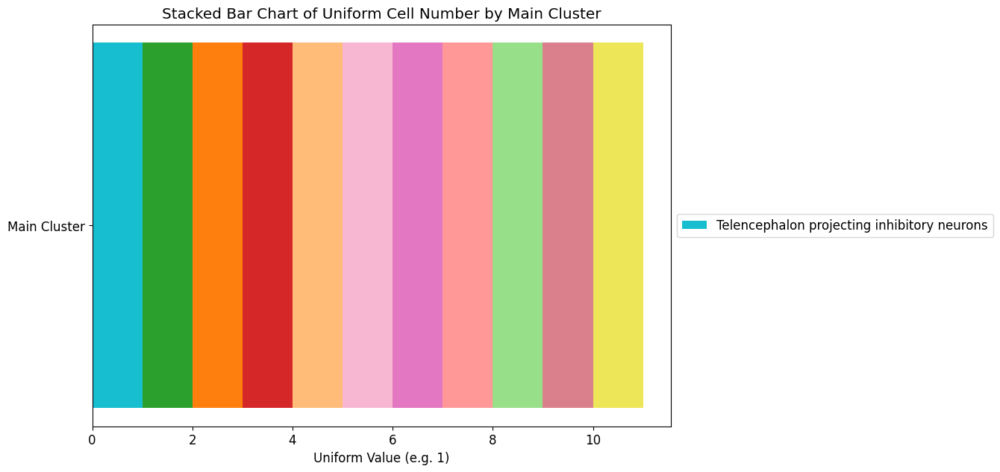

In [515]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 仮のデータフレーム（実際はCSVファイルを読み込む）
# color_annotation_csv = pd.read_csv('color_annotation_csv.csv')

# Main cluster descriptionのユニークな値の順番を指定
Main_cell_type_list = ['Telencephalon projecting inhibitory neurons',
                       'Telencephalon projecting excitatory neurons',
                       'Telencephalon inhibitory interneurons', 
                       'Peptidergic neurons',
                       'Olfactory inhibitory neurons',
                       'Hindbrain neurons/Spinal cord neurons',
                       'Di- and mesencephalon inhibitory neurons',
                       'Di- and mesencephalon excitatory neurons',
                       'Dentate gyrus granule neurons',
                       'Cholinergic and monoaminergic neurons', 
                       'Cerebellum neurons']

# numpyの配列をリストに変換してからreplaceを使用
main_cluster_types = list(np.unique(Main_cell_type_list)[::-1])
main_cluster_types = [t.replace("Hindbrain neurons/Spinal cord neurons", "Hindbrain/spinal cord neurons") for t in main_cluster_types]

# Main cluster description に対応する Main cluster color code を取得
main_cluster_colors = []
for cluster in main_cluster_types:
    # Main cluster description に対応する Main cluster color code を探す
    color = color_annotation_csv.loc[color_annotation_csv['Main cluster description'] == cluster, 'Main cluster color code']
    # 見つからない場合はデフォルトの色を設定
    if not color.empty:
        main_cluster_colors.append(color.iloc[0])
    else:
        main_cluster_colors.append('#FFFFFF')  # デフォルトは白

# 積み上げの高さをすべて同じ値にする（例えば1）
main_cluster_values = [1 for _ in main_cluster_types]

# 積み上げ棒グラフの描画（1本の棒グラフにすべて積み上げ）
fig, ax = plt.subplots(figsize=(10, 7))
ax.barh(['Main Cluster'], main_cluster_values, color=main_cluster_colors, left=np.cumsum([0] + main_cluster_values[:-1]))

# 凡例とラベルの設定
ax.set_xlabel('Uniform Value (e.g. 1)')
ax.set_title('Stacked Bar Chart of Uniform Cell Number by Main Cluster')
ax.legend(main_cluster_types, loc='center left', bbox_to_anchor=(1, 0.5))

# グラフの表示
plt.show()


/tmp/ipykernel_12671/1405738340.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Main cluster description'] = pd.Categorical(filtered_data['Main cluster description'], categories=Main_cell_type_list, ordered=True)


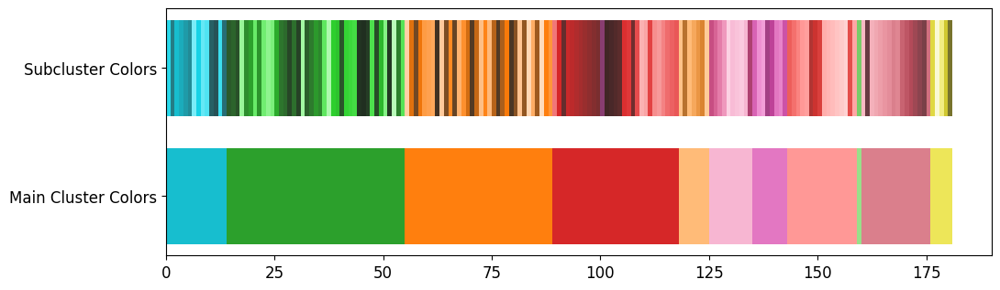

In [532]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 仮のデータフレーム（実際はcolor_annotation_csvを読み込む）
# Main_cell_type_listの定義
Main_cell_type_list = ['Telencephalon projecting inhibitory neurons',
                       'Telencephalon projecting excitatory neurons',
                       'Telencephalon inhibitory interneurons', 
                       'Peptidergic neurons',
                       'Olfactory inhibitory neurons',
                       'Hindbrain/spinal cord neurons',
                       'Di- and mesencephalon inhibitory neurons',
                       'Di- and mesencephalon excitatory neurons',
                       'Dentate gyrus granule neurons',
                       'Cholinergic and monoaminergic neurons', 
                       'Cerebellum neurons']

# Main_cell_type_listに含まれるサブクラスターをフィルタリング
filtered_data = color_annotation_csv[color_annotation_csv['Main cluster description'].isin(Main_cell_type_list)]

# Main_cell_type_listの順番にデータをソート
filtered_data['Main cluster description'] = pd.Categorical(filtered_data['Main cluster description'], categories=Main_cell_type_list, ordered=True)
filtered_data = filtered_data.sort_values('Main cluster description')

# 色コードの前に#がない場合は追加する関数
def fix_color_code(color_code):
    if not color_code.startswith('#'):
        return '#' + color_code
    return color_code

# Subcluster color codeとMain cluster color codeの前に#を追加
filtered_data['Subcluster color code'] = filtered_data['Subcluster color code'].apply(fix_color_code)
filtered_data['Main cluster color code'] = filtered_data['Main cluster color code'].apply(fix_color_code)

# 積み上げのためのSubcluster color code
subcluster_colors = filtered_data['Subcluster color code'].tolist()

# 積み上げのためのMain cluster color code
main_cluster_colors = filtered_data['Main cluster color code'].tolist()

# 積み上げの高さをすべて同じ値にする（例えば1）
subcluster_values = [1 for _ in subcluster_colors]
main_cluster_values = [1 for _ in main_cluster_colors]

# 積み上げ棒グラフの描画
fig, ax = plt.subplots(figsize=(10, 3))

# 1本目：Subcluster color codeを使った積み上げ棒グラフ
ax.barh([0.4], subcluster_values, color=subcluster_colors, left=np.cumsum([0] + subcluster_values[:-1]), height=0.3, label='Subcluster Colors')

# 2本目：Main cluster color codeを使った積み上げ棒グラフ（少し下に配置）
ax.barh([0], main_cluster_values, color=main_cluster_colors, left=np.cumsum([0] + main_cluster_values[:-1]), height=0.3, label='Main Cluster Colors')

# 軸の設定
ax.set_yticks([0, 0.4])
ax.set_yticklabels(['Main Cluster Colors', 'Subcluster Colors'])

# タイトルとラベル
#ax.set_title('Stacked Bar Chart of Subclusters and Main Clusters')
#ax.set_xlabel('Uniform Value (e.g. 1)')

# 凡例を追加
#ax.legend(loc='upper right')

# グラフの表示
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/Main_and_Sub_cell_type_color_annotation_bar.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [534]:
np.sum(subcluster_values) 

181

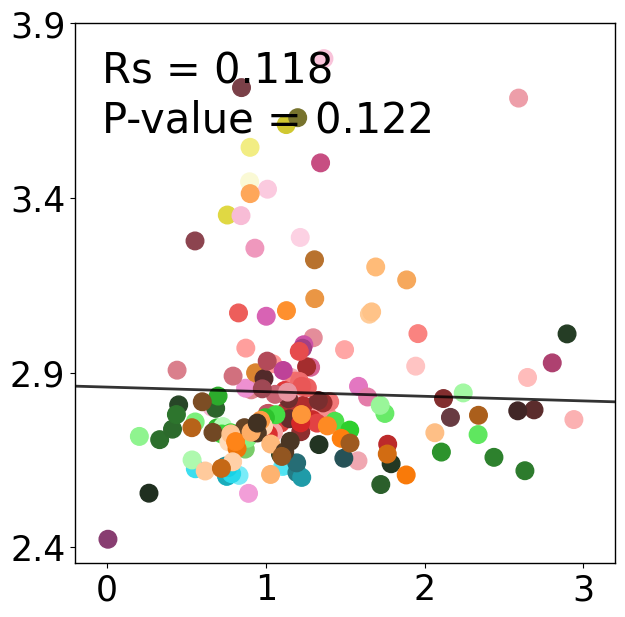

In [391]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase:
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]    
    if log_odds_wt > 0:
        ratio = log_odds_app / log_odds_wt
        log_odds_ratios.append(ratio)
        hc_dam_diff_values.append(hc_score)

        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"
        if color == '000000':
            print("No color!")
        colors.append(color)

# Convert lists to numpy arrays for processing
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# Calculate z-scores
z_scores = np.abs(stats.zscore(log_odds_ratios_array))

# Remove outliers with z-score greater than 3
outlier_threshold = 3
valid_indices = z_scores < outlier_threshold

log_odds_ratios_filtered = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_filtered = hc_dam_diff_values_array[valid_indices]
colors_filtered = np.array(colors)[valid_indices]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios_filtered, hc_dam_diff_values_filtered)

xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_filtered, hc_dam_diff_values_filtered, c=colors_filtered, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Set axis labels and ticks
plt.xlim(xlim_low, xlim_high)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0, 1, 2, 3])
plt.yticks([2.4, 2.9, 3.4, 3.9])

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation on filtered data
correlation, p_value_spearman = spearmanr(log_odds_ratios_filtered, hc_dam_diff_values_filtered)
plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
         transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_WT_ratio_Microglia_increase_vs_HC_score_Sub_cell_type_filtered.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


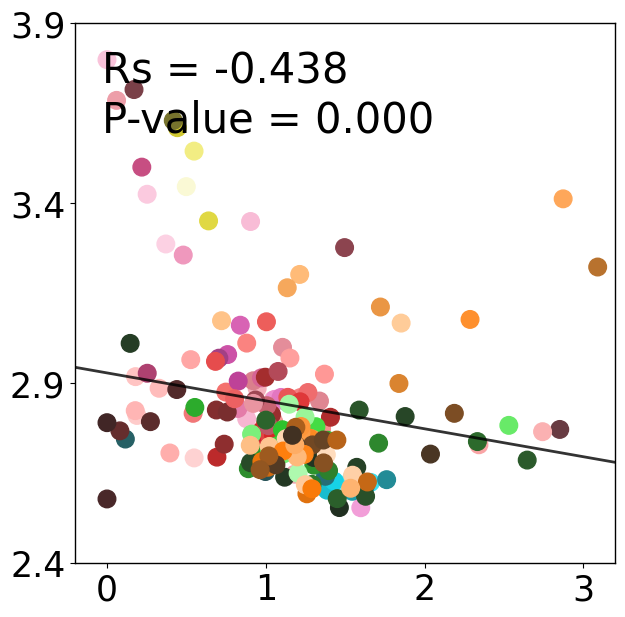

In [390]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease:
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]    
    if log_odds_wt > 0:
        ratio = log_odds_app / log_odds_wt
        log_odds_ratios.append(ratio)
        hc_dam_diff_values.append(hc_score)

        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"
        if color == '000000':
            print("No color!")
        colors.append(color)

# Convert lists to numpy arrays for processing
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# Calculate z-scores
z_scores = np.abs(stats.zscore(log_odds_ratios_array))

# Remove outliers with z-score greater than 3
outlier_threshold = 3
valid_indices = z_scores < outlier_threshold

log_odds_ratios_filtered = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_filtered = hc_dam_diff_values_array[valid_indices]
colors_filtered = np.array(colors)[valid_indices]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios_filtered, hc_dam_diff_values_filtered)

xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_filtered, hc_dam_diff_values_filtered, c=colors_filtered, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Set axis labels and ticks
plt.xlim(xlim_low, xlim_high)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0, 1, 2, 3])
plt.yticks([2.4, 2.9, 3.4, 3.9])

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation on filtered data
correlation, p_value_spearman = spearmanr(log_odds_ratios_filtered, hc_dam_diff_values_filtered)
plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
         transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_WT_ratio_Microglia_decrease_vs_HC_score_Sub_cell_type_filtered.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


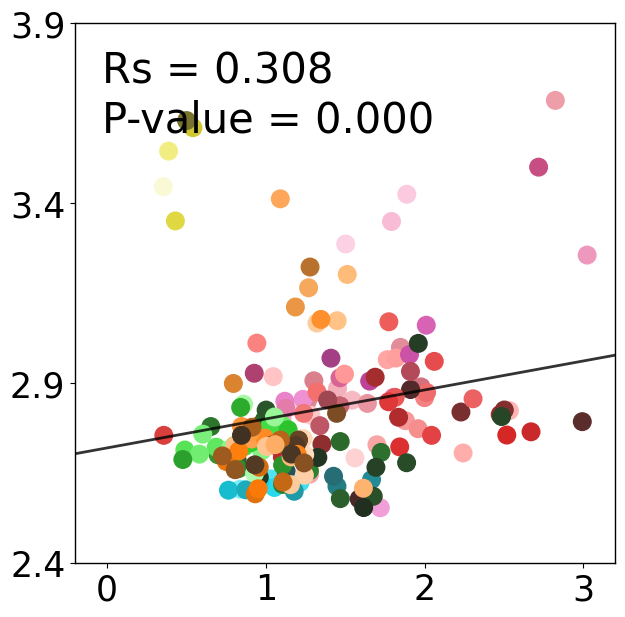

In [389]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_neuron_decrease:
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]    
    if log_odds_wt > 0:
        ratio = log_odds_app / log_odds_wt
        log_odds_ratios.append(ratio)
        hc_dam_diff_values.append(hc_score)

        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"
        if color == '000000':
            print("No color!")
        colors.append(color)

# Convert lists to numpy arrays for processing
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# Calculate z-scores
z_scores = np.abs(stats.zscore(log_odds_ratios_array))

# Remove outliers with z-score greater than 3
outlier_threshold = 3
valid_indices = z_scores < outlier_threshold

log_odds_ratios_filtered = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_filtered = hc_dam_diff_values_array[valid_indices]
colors_filtered = np.array(colors)[valid_indices]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios_filtered, hc_dam_diff_values_filtered)

xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_filtered, hc_dam_diff_values_filtered, c=colors_filtered, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Set axis labels and ticks
plt.xlim(xlim_low, xlim_high)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0, 1, 2, 3])
plt.yticks([2.4, 2.9, 3.4, 3.9])

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation on filtered data
correlation, p_value_spearman = spearmanr(log_odds_ratios_filtered, hc_dam_diff_values_filtered)
plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
         transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_WT_ratio_Neuron_decrease_vs_HC_score_Sub_cell_type_filtered.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


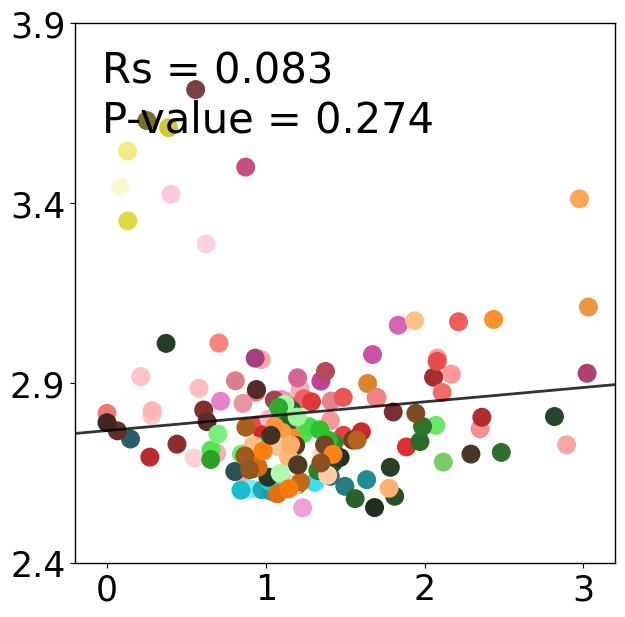

In [388]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease_and_neuron_decrease:
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]    
    if log_odds_wt > 0:
        ratio = log_odds_app / log_odds_wt
        log_odds_ratios.append(ratio)
        hc_dam_diff_values.append(hc_score)

        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"
        if color == '000000':
            print("No color!")
        colors.append(color)

# Convert lists to numpy arrays for processing
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# Calculate z-scores
z_scores = np.abs(stats.zscore(log_odds_ratios_array))

# Remove outliers with z-score greater than 3
outlier_threshold = 3
valid_indices = z_scores < outlier_threshold

log_odds_ratios_filtered = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_filtered = hc_dam_diff_values_array[valid_indices]
colors_filtered = np.array(colors)[valid_indices]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios_filtered, hc_dam_diff_values_filtered)

xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_filtered, hc_dam_diff_values_filtered, c=colors_filtered, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Set axis labels and ticks
plt.xlim(xlim_low, xlim_high)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0, 1, 2, 3])
plt.yticks([2.4, 2.9, 3.4, 3.9])

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation on filtered data
correlation, p_value_spearman = spearmanr(log_odds_ratios_filtered, hc_dam_diff_values_filtered)
plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
         transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_WT_ratio_Neuron_decrease_with_Neuron_decrease_vs_HC_score_Sub_cell_type_filtered.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


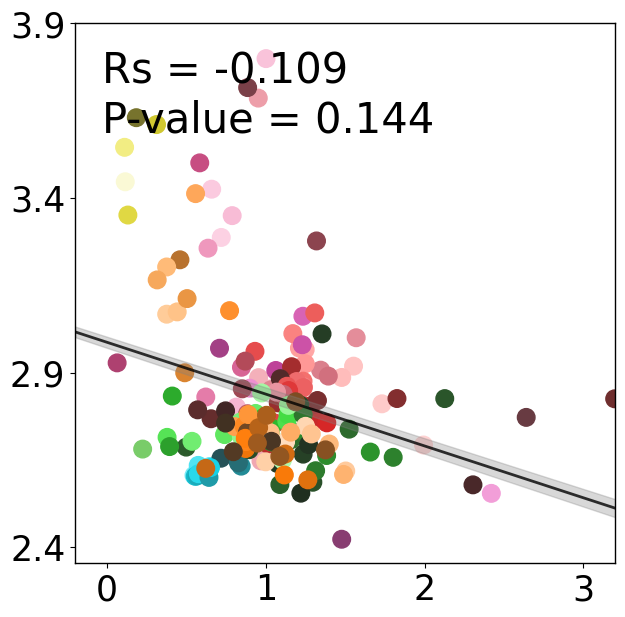

In [385]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_Neuron_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


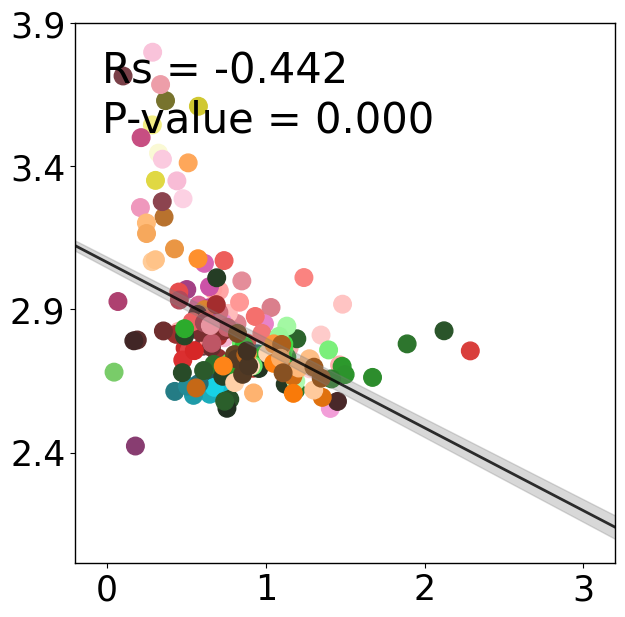

In [386]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WT_Neuron_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


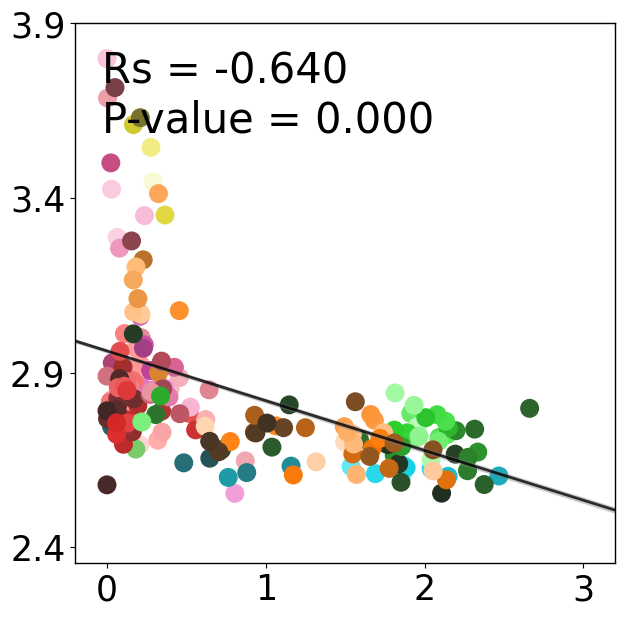

In [339]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_Microglia_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


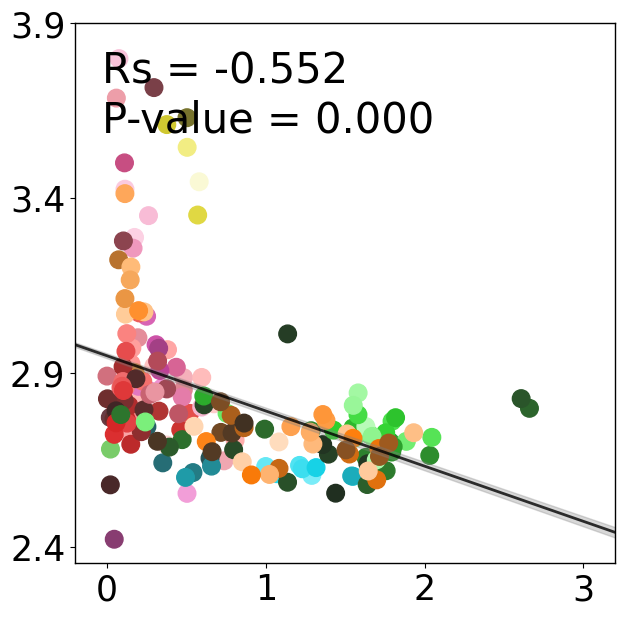

In [340]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WT_Microglia_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


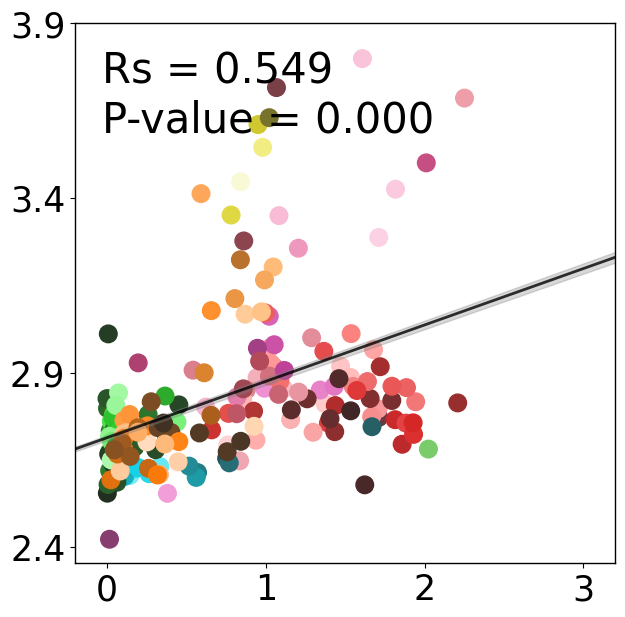

In [341]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_Microglia_increase_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


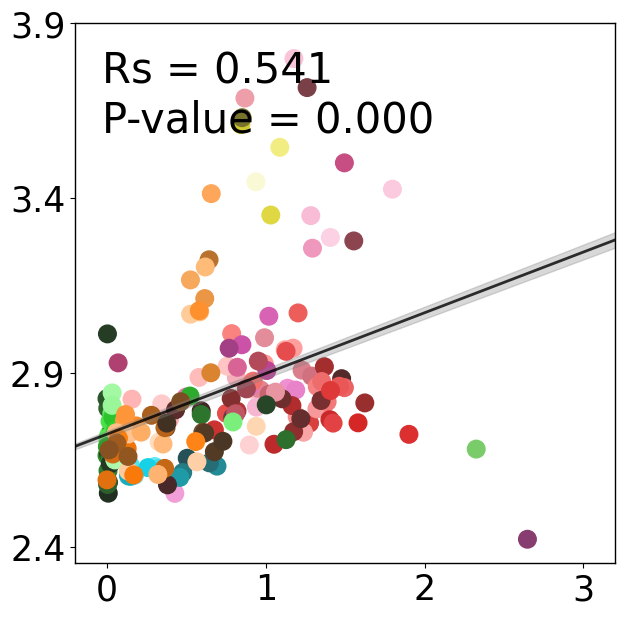

In [342]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WT_Microglia_increase_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


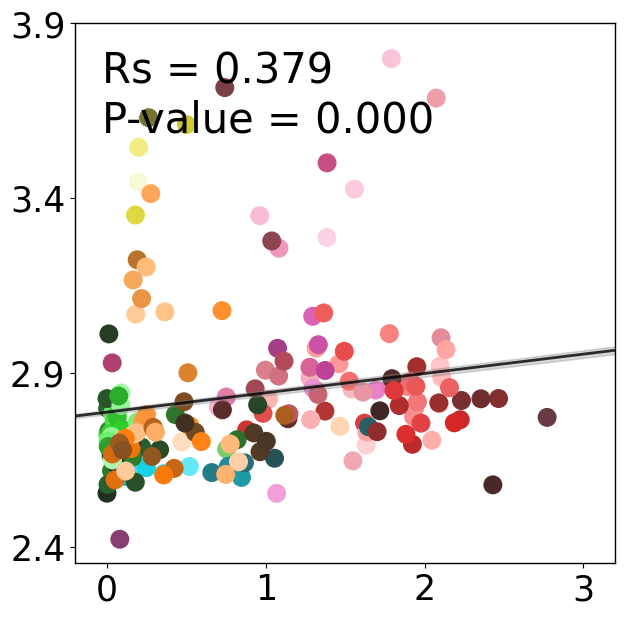

In [343]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_Microglia_increase_with_Neuron_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


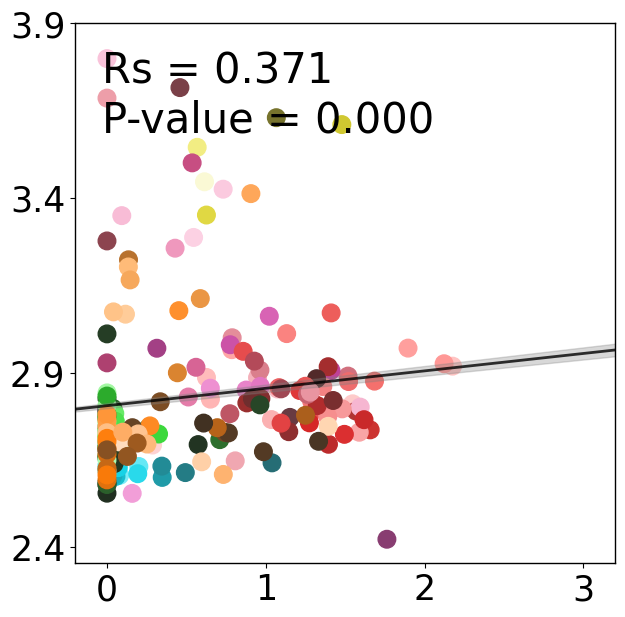

In [344]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WT_Microglia_increase_with_Neuron_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


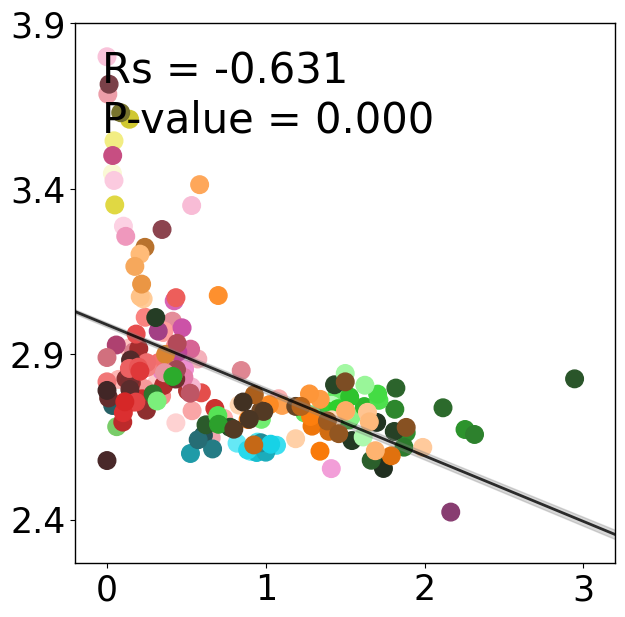

In [345]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_Microglia_decrease_with_Neuron_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


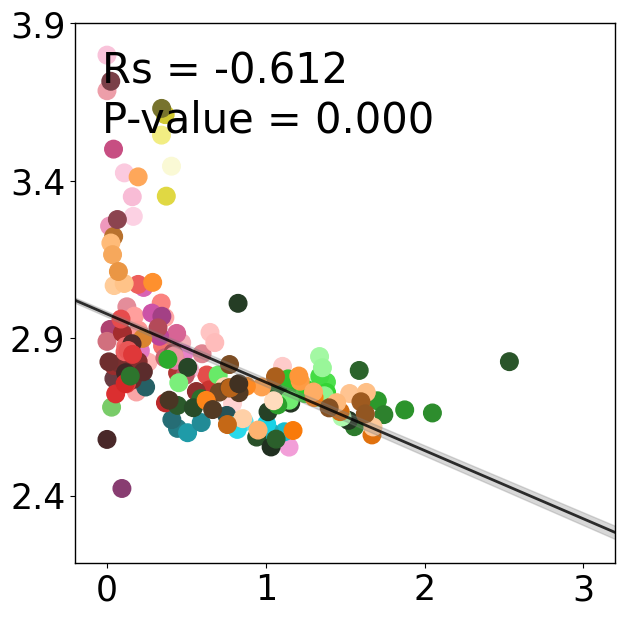

In [346]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# 指定範囲に従うために、x軸の範囲を設定
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Set axis labels
#plt.xlabel('Ln(1 + Odds ratio\nof APP_Microglia_decrease)', fontsize=30)
#plt.ylabel('Homeostatic microglial\ngenes score', fontsize=30)
plt.xlim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0,1,2,3])  # Set x-axis to 4 ticks, rounded to 1 decimal place
plt.yticks([2.4, 2.9, 3.4, 3.9])  # Set y-axis to 4 ticks, rounded to 1 decimal place

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WT_Microglia_decrease_with_Neuron_decrease_vs_HC_score_Sub_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [ ]:
# APP/WTで上位10%の直線を引く

Threshold: 2.65


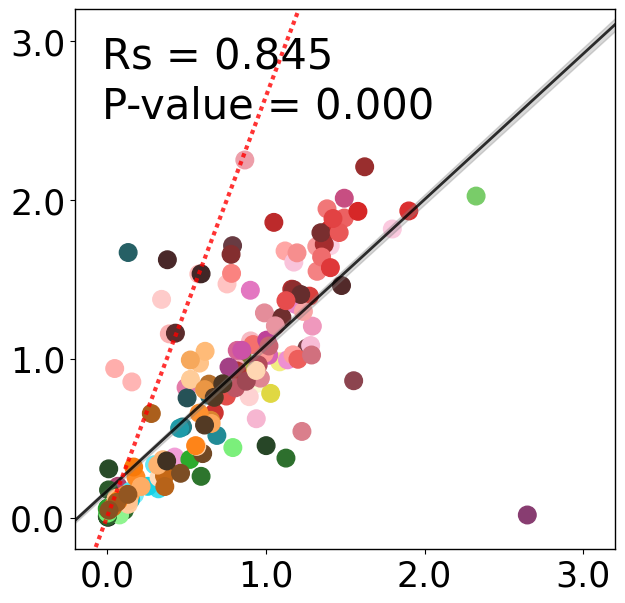

In [372]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
from matplotlib.ticker import FormatStrFormatter

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []
ratios = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase:
    if log_odds_wt > 0 and log_odds_app > 0:
        ratio = log_odds_app / log_odds_wt
        ratios.append(ratio)
        log_odds_ratios.append(log_odds_wt)
        hc_dam_diff_values.append(log_odds_app)
        
        # Subcluster Symbol に対応する色を取得し、colors に追加
        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
        if color == '000000':
            print("No color!")
        colors.append(color)

# Calculate threshold
threshold = np.sort(ratios)[::-1][int((len(ratios) * 0.1))]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# Set x-axis range
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Plot the threshold line in red with a finer dashed pattern
plt.plot(x_values, threshold * x_values, color='red', linewidth=3, alpha = 0.8, linestyle=(0, (1, 1)), )
print(f'Threshold: {threshold:.2f}')
# Set axis labels
plt.xlim(xlim_low, xlim_high)
plt.ylim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0.0, 1.0, 2.0, 3.0])  # Set x-axis to 4 ticks
plt.yticks([0.0, 1.0, 2.0, 3.0])  # Set y-axis to 4 ticks
# Set the tick formatter to show one decimal place
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
#plt.legend()
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTvsAPP_Microglia_increase_Sub_cell_type_with_threshold.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


Threshold: 1.85


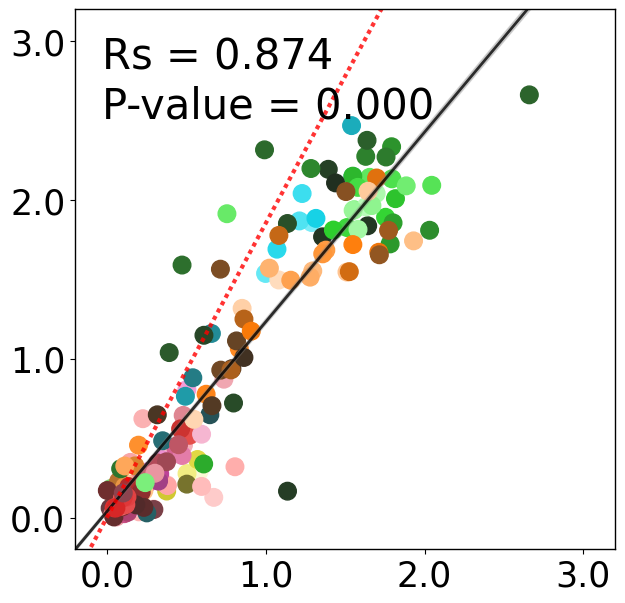

In [371]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
from matplotlib.ticker import FormatStrFormatter

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []
ratios = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease:
    if log_odds_wt > 0 and log_odds_app > 0:
        ratio = log_odds_app / log_odds_wt
        ratios.append(ratio)
        log_odds_ratios.append(log_odds_wt)
        hc_dam_diff_values.append(log_odds_app)
        
        # Subcluster Symbol に対応する色を取得し、colors に追加
        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
        if color == '000000':
            print("No color!")
        colors.append(color)

# Calculate threshold
threshold = np.sort(ratios)[::-1][int((len(ratios) * 0.1))]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# Set x-axis range
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Plot the threshold line in red with a finer dashed pattern
plt.plot(x_values, threshold * x_values, color='red', linewidth=3,alpha = 0.8, linestyle=(0, (1, 1)), )
print(f'Threshold: {threshold:.2f}')
# Set axis labels
plt.xlim(xlim_low, xlim_high)
plt.ylim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0.0, 1.0, 2.0, 3.0])  # Set x-axis to 4 ticks
plt.yticks([0.0, 1.0, 2.0, 3.0])  # Set y-axis to 4 ticks
# Set the tick formatter to show one decimal place
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
#plt.legend()
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTvsAPP_Microglia_decrease_Sub_cell_type_with_threshold.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


Threshold: 2.30


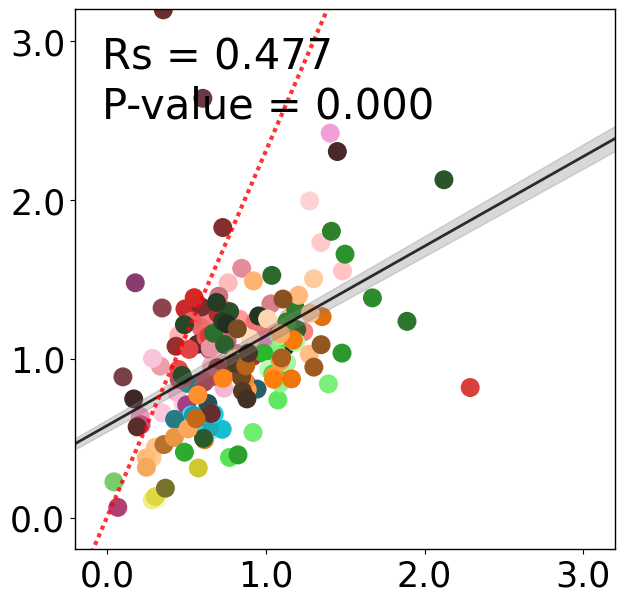

In [370]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
from matplotlib.ticker import FormatStrFormatter

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []
ratios = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_neuron_decrease:
    if log_odds_wt > 0 and log_odds_app > 0:
        ratio = log_odds_app / log_odds_wt
        ratios.append(ratio)
        log_odds_ratios.append(log_odds_wt)
        hc_dam_diff_values.append(log_odds_app)
        
        # Subcluster Symbol に対応する色を取得し、colors に追加
        color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
        if color == '000000':
            print("No color!")
        colors.append(color)

# Calculate threshold
threshold = np.sort(ratios)[::-1][int((len(ratios) * 0.1))]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# Set x-axis range
xlim_low = -0.2
xlim_high = 3.2
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Plot the threshold line in red with a finer dashed pattern
plt.plot(x_values, threshold * x_values, color='red', linewidth=3, alpha = 0.8,linestyle=(0, (1, 1)), )
print(f'Threshold: {threshold:.2f}')
# Set axis labels
plt.xlim(xlim_low, xlim_high)
plt.ylim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0.0, 1.0, 2.0, 3.0])  # Set x-axis to 4 ticks
plt.yticks([0.0, 1.0, 2.0, 3.0])  # Set y-axis to 4 ticks
# Set the tick formatter to show one decimal place
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
#plt.legend()
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTvsAPP_Neuron_decrease_Sub_cell_type_with_threshold.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [373]:

a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_decrease)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_decrease
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_decrease))
print(len(significant_results_Microglia_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]

a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_decrease)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Neuron_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Neuron_decrease))
print(len(significant_results_Neuron_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Neuron_decrease

import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_decrease])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


19
19
0.06023876949836626
2.645777063655272
19
19
0.35461405437483273
2.9926785234573066
Cross tabulation:
in_microglia    0   1
in_neuron            
0             148  14
1              14   5
Fisher's Exact Test Results:
Odds Ratio: 3.7755102040816326
P-value: 0.03323459588180673


In [374]:

a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_increase)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Microglia_increase = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_microglia_increase
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Microglia_increase))
print(len(significant_results_Microglia_increase))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]

a = [
    log_odds_app / log_odds_wt
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0
]

# log_odds_app / log_odds_wtの上位10個の閾値を取得
threshold = np.sort(a)[::-1][int((len(results_microglia_decrease)*0.1))]#[9]

# significant_results_Microglia_increaseをフィルタリング
significant_results_Neuron_decrease = [
    (log_odds_app, log_odds_wt, neurotransmitter_type)
    for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results_neuron_decrease
    if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) >= threshold
]

print(len(significant_results_Neuron_decrease))
print(len(significant_results_Neuron_decrease))
print(np.min(a))
print(np.sort(a)[::-1][9])
#np.sort(a)[::-1]
significant_results_Neuron_decrease

import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

# "microglia decrease のオッズ比が増大している細胞タイプでは、neuron decrease のオッズ比も増大しているという背景がある"
# ことを調べている

# クロス集計表を作成し、オッズ比を計算する関数
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    # データフレームの作成
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })

    # クロス集計表の作成
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])

    print("Cross tabulation:")
    print(cross_tab)

    # オッズ比とp値の計算
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        print("Insufficient data for Fisher's exact test.")
        return None, None

# 必要なデータの抽出
neuron_cell_types = set([result[2] for result in significant_results_Neuron_decrease])
microglia_cell_types = set([result[2] for result in significant_results_Microglia_increase])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# オッズ比とp値の計算
odds_ratio, p_value = calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types)

# 結果の表示
if odds_ratio is not None and p_value is not None:
    print("Fisher's Exact Test Results:")
    print(f"Odds Ratio: {odds_ratio}")
    print(f"P-value: {p_value}")


19
19
0.005991320098621487
4.543070668723421
19
19
0.35461405437483273
2.9926785234573066
Cross tabulation:
in_microglia    0   1
in_neuron            
0             145  17
1              17   2
Fisher's Exact Test Results:
Odds Ratio: 1.0034602076124568
P-value: 0.6216274118389049


[(4.437869822485207, (4.3378698224852075, 4.537869822485207), 0.02068955738454477, 'Decrease Microglia'), (1.2333333333333334, (1.1333333333333333, 1.3333333333333335), 0.5247661646465785, 'Increase Microglia')]


/tmp/ipykernel_47572/2768890744.py:99: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


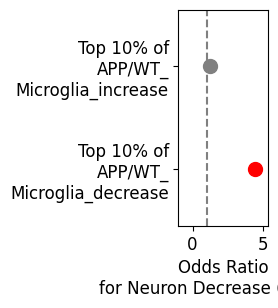

In [50]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import statsmodels.stats.multitest as multitest
import matplotlib

# Font settings
matplotlib.rcParams['pdf.use14corefonts'] = True
plt.rcParams.update({'font.size': 12})

# Threshold calculation function
def calculate_threshold(results, top_percent):
    a = [
        log_odds_app / log_odds_wt
        for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results
        if log_odds_wt > 0 #and log_odds_app > 0
    ]
    return np.sort(a)[::-1][int(len(a) * top_percent)]

# Filter significant results based on threshold
def filter_significant_results(results, threshold):
    return [
        (log_odds_app, log_odds_wt, neurotransmitter_type)
        for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results
        if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) > threshold
    ]

# Function to calculate odds ratio using Fisher's exact test
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        return None, None


# Threshold calculations
threshold_microglia_decrease = calculate_threshold(results_microglia_decrease, 0.10)
threshold_neuron_decrease = calculate_threshold(results_neuron_decrease, 0.10)
threshold_microglia_increase = calculate_threshold(results_microglia_increase, 0.10)

# Filtering significant results based on threshold
significant_results_microglia_decrease = filter_significant_results(results_microglia_decrease, threshold_microglia_decrease)
significant_results_neuron_decrease = filter_significant_results(results_neuron_decrease, threshold_neuron_decrease)
significant_results_microglia_increase = filter_significant_results(results_microglia_increase, threshold_microglia_increase)

# Extract cell types
neuron_cell_types_decrease = set([result[2] for result in significant_results_neuron_decrease])
microglia_cell_types_decrease = set([result[2] for result in significant_results_microglia_decrease])
microglia_cell_types_increase = set([result[2] for result in significant_results_microglia_increase])
all_cell_types = set(cell_joined_neuron['Sub_molecular_cell_type'].dropna().unique())

# Calculate odds ratios
odds_ratio_decrease, p_value_decrease = calculate_enrichment_fisher_exact(neuron_cell_types_decrease, microglia_cell_types_decrease, all_cell_types)
odds_ratio_increase, p_value_increase = calculate_enrichment_fisher_exact(neuron_cell_types_decrease, microglia_cell_types_increase, all_cell_types)

# Gather results
results = [
    (odds_ratio_decrease, (odds_ratio_decrease - 0.1, odds_ratio_decrease + 0.1), p_value_decrease, "Decrease Microglia"),
    (odds_ratio_increase, (odds_ratio_increase - 0.1, odds_ratio_increase + 0.1), p_value_increase, "Increase Microglia"),
]

# Extract p-values
p_values = [result[2] for result in results if result[2] is not None]

# Adjust p-values using BH method
reject, pvals_corrected, _, _ = multitest.multipletests(p_values, method='fdr_bh')

# Visualization
y_labels = [
    "Top 10% of\nAPP/WT_\nMicroglia_decrease",
    "Top 10% of\nAPP/WT_\nMicroglia_increase",
]

fig, ax = plt.subplots(figsize=(1, len(results) * 1.2))

print(results)
for i, (odds_ratio, conf_interval, _, condition) in enumerate(results):
    fdr_corrected_p_value = pvals_corrected[i]
    color = 'blue' if odds_ratio < 1.0 else 'red'
    color = 'gray' if fdr_corrected_p_value >= 0.05 else color
    ax.errorbar(odds_ratio, i, xerr=[[odds_ratio - conf_interval[0]], [conf_interval[1] - odds_ratio]], fmt='o', color=color,
               markersize=10)
ax.axvline(1, color='grey', linestyle='--')
ax.set_xlim(-1, 5.4)
ax.set_ylim(-0.55, len(results) - 0.45)
ax.set_yticks(range(len(results)))
ax.set_yticklabels(y_labels)
ax.set_xlabel('Odds Ratio\nfor Neuron Decrease (95% CI)')

plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

#plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/Neuron_decrease_risk_based_on_top10%_Microglial_change_sub_cell_type.pdf', 
#            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [51]:
results_microglia_decrease

[(0.2898524826413733,
  0.5805104144405633,
  'CBGRC_1',
  0.3362303563129747,
  0.786950283248074),
 (0.27670556788681205,
  0.5047309882390353,
  'CBGRC_2',
  0.3187780232665212,
  0.6565398318185297),
 (0.1667273310881298,
  0.3765299866186724,
  'CBINH_1',
  0.18143208158548063,
  0.4572192358465999),
 (0.3651696603713688,
  0.5709550458008457,
  'CBINH_2',
  0.4407584270243139,
  0.7699566341419919),
 (0.2101614218107933,
  0.5035956153315355,
  'CBPC',
  0.23387721857695756,
  0.6546601086685824),
 (0.39766887131620504,
  0.38037202937731845,
  'CHO_1',
  0.48835111255731906,
  0.46282870346642063),
 (0.4562010324940598,
  0.48244225258242396,
  'CHO_2',
  0.5780675557370779,
  0.620026087617821),
 (0.8708988698178819,
  0.7369725654539875,
  'CHO_3',
  1.3890573402100084,
  1.0895998022277544),
 (0.0035527713625964664,
  0.0589781529765946,
  'CHO_4',
  0.003559089935372803,
  0.06075206621179481),
 (0.21544158490476017,
  0.19492379543816907,
  'CHO_5',
  0.24040952216636163,
 

In [54]:
pvals_corrected

array([0.04137911, 0.52476616])

[(2.5428005937654627, (2.4428005937654627, 2.642800593765463), 0.02211021445588999, 'Decrease Microglia'), (0.7209876543209877, (0.6209876543209877, 0.8209876543209876), 0.7673686784429568, 'Increase Microglia')]


/tmp/ipykernel_47572/3956142358.py:98: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


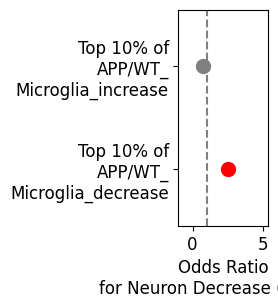

In [68]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import statsmodels.stats.multitest as multitest
import matplotlib

# Font settings
matplotlib.rcParams['pdf.use14corefonts'] = True
plt.rcParams.update({'font.size': 12})

# Threshold calculation function
def calculate_threshold(results, top_percent):
    a = [
        log_odds_app / log_odds_wt
        for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results
        if log_odds_wt > 0 #and log_odds_app > 0
    ]
    return np.sort(a)[::-1][int(len(a) * top_percent)]

# Filter significant results based on threshold
def filter_significant_results(results, threshold):
    return [
        (log_odds_app, log_odds_wt, neurotransmitter_type)
        for log_odds_app, log_odds_wt, neurotransmitter_type, odds_ratio_app, odds_ratio_wt in results
        if log_odds_wt > 0 and log_odds_app > 0 and (log_odds_app / log_odds_wt) > threshold
    ]

# Function to calculate odds ratio using Fisher's exact test
def calculate_enrichment_fisher_exact(neuron_cell_types, microglia_cell_types, all_cell_types):
    df = pd.DataFrame({
        'cell_type': list(all_cell_types),
        'in_neuron': [1 if cell in neuron_cell_types else 0 for cell in all_cell_types],
        'in_microglia': [1 if cell in microglia_cell_types else 0 for cell in all_cell_types]
    })
    cross_tab = pd.crosstab(df['in_neuron'], df['in_microglia'])
    if cross_tab.shape == (2, 2):
        odds_ratio, p_value = fisher_exact(cross_tab, alternative='greater')
        return odds_ratio, p_value
    else:
        return None, None


# Threshold calculations
threshold_microglia_decrease = calculate_threshold(results_microglia_decrease_atlasID, 0.1)
threshold_neuron_decrease = calculate_threshold(results_neuron_decrease_atlasID, 0.1)
threshold_microglia_increase = calculate_threshold(results_microglia_increase_atlasID, 0.1)

# Filtering significant results based on threshold
significant_results_microglia_decrease = filter_significant_results(results_microglia_decrease_atlasID, threshold_microglia_decrease)
significant_results_neuron_decrease = filter_significant_results(results_neuron_decrease_atlasID, threshold_neuron_decrease)
significant_results_microglia_increase = filter_significant_results(results_microglia_increase_atlasID, threshold_microglia_increase)

# Extract cell types
neuron_cell_types_decrease = set([result[2] for result in significant_results_neuron_decrease])
microglia_cell_types_decrease = set([result[2] for result in significant_results_microglia_decrease])
microglia_cell_types_increase = set([result[2] for result in significant_results_microglia_increase])
all_cell_types = set(df_neuron['atlasID'].dropna().unique())

# Calculate odds ratios
odds_ratio_decrease, p_value_decrease = calculate_enrichment_fisher_exact(neuron_cell_types_decrease, microglia_cell_types_decrease, all_cell_types)
odds_ratio_increase, p_value_increase = calculate_enrichment_fisher_exact(neuron_cell_types_decrease, microglia_cell_types_increase, all_cell_types)

# Gather results
results = [
    (odds_ratio_decrease, (odds_ratio_decrease - 0.1, odds_ratio_decrease + 0.1), p_value_decrease, "Decrease Microglia"),
    (odds_ratio_increase, (odds_ratio_increase - 0.1, odds_ratio_increase + 0.1), p_value_increase, "Increase Microglia"),
]

# Extract p-values
p_values = [result[2] for result in results if result[2] is not None]

# Adjust p-values using BH method
reject, pvals_corrected, _, _ = multitest.multipletests(p_values, method='fdr_bh')

# Visualization
y_labels = [
    "Top 10% of\nAPP/WT_\nMicroglia_decrease",
    "Top 10% of\nAPP/WT_\nMicroglia_increase",
]

fig, ax = plt.subplots(figsize=(1, len(results) * 1.2))
print(results)
for i, (odds_ratio, conf_interval, _, condition) in enumerate(results):
    fdr_corrected_p_value = pvals_corrected[i]
    color = 'blue' if odds_ratio < 1.0 else 'red'
    color = 'gray' if fdr_corrected_p_value >= 0.05 else color
    ax.errorbar(odds_ratio, i, xerr=[[odds_ratio - conf_interval[0]], [conf_interval[1] - odds_ratio]], fmt='o', color=color,
               markersize=10)
ax.axvline(1, color='grey', linestyle='--')
ax.set_xlim(-1, 5.4)
ax.set_ylim(-0.55, len(results) - 0.45)
ax.set_yticks(range(len(results)))
ax.set_yticklabels(y_labels)
ax.set_xlabel('Odds Ratio\nfor Neuron Decrease (95% CI)')

plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

#plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/Neuron_decrease_risk_based_on_top10%_Microglial_change_anatomical_region.pdf', 
#            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [69]:
results_microglia_decrease_atlasID

[(0.0398213947628773, 0.0, 1, 0.04062489653711918, 0.0),
 (0.5797153808138037,
  2.589974660364323,
  2,
  0.7855301622803081,
  12.32943383591916),
 (0.9916366960278663,
  0.6703465407262049,
  6,
  1.69564281169188,
  0.9549146608124092),
 (0.0003588733024027929,
  0.004518648536442998,
  7,
  0.000358937705130364,
  0.004528873023227663),
 (1.4550552927088527,
  0.11971086891319296,
  9,
  3.2847203728485255,
  0.1271709043123215),
 (0.14301460424529241,
  0.41458092994505497,
  10,
  0.15374665114207164,
  0.5137362462206416),
 (0.04444048562916573,
  0.10735732796304553,
  12,
  0.045442755991094326,
  0.11333200806949015),
 (0.02274363136646036, 0.0, 15, 0.02300423972688672, 0.0),
 (0.006194158390276898,
  0.054006170033934535,
  17,
  0.006213381859934529,
  0.05549111455098365),
 (0.058772094906683156,
  0.7450619494777032,
  19,
  0.06053351220655827,
  1.106571931969505),
 (0.21513032908643875,
  0.023767609196297716,
  20,
  0.24002349756480404,
  0.024052309896928123),
 (0.

In [70]:
pvals_corrected

array([0.04422043, 0.76736868])

In [494]:
pvals_corrected

array([0.04422043, 0.78250027])

In [453]:
# 下記は一部のidだけが対象
dir= "/export3/Imaging/cubic-atlas_v1-1/cubic-atlas/"
dir_ana=dir+"summary_CUBIC-Atlas-1-1.csv"


data_id = pd.read_csv(filepath_or_buffer=dir_ana, encoding="ms932", sep=",")
data_id

,id,acronym,node_name,graph_order,rgb_triplet,cell_count,volume(mm3),density(cells/mm3)
0,997,root,root,0,"[255, 255, 255]",78620375,506.05289,155359.99590
1,8,grey,Basic cell groups and regions,1,"[191, 218, 227]",70525778,449.60086,156863.08540
2,567,CH,Cerebrum,2,"[176, 240, 255]",39291452,275.87673,142423.94190
3,688,CTX,Cerebral cortex,3,"[176, 255, 184]",31750427,221.54964,143310.66800
4,695,CTXpl,Cortical plate,4,"[112, 255, 112]",30687805,212.64380,144315.54300
...,...,...,...,...,...,...,...,...
834,129,V3,third ventricle,1299,"[170, 170, 170]",144614,0.90005,160673.85380
835,140,AQ,cerebral aqueduct,1300,"[170, 170, 170]",26972,0.40620,66400.27696
836,145,V4,fourth ventricle,1301,"[170, 170, 170]",118275,0.96495,122570.72070
837,153,V4r,lateral recess,1302,"[170, 170, 170]",71934,0.46333,155254.98260


Threshold: 10.60


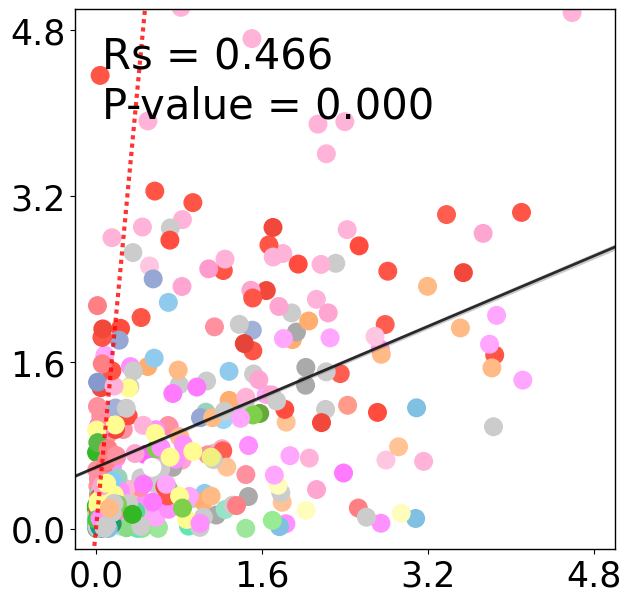

In [467]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
from matplotlib.ticker import FormatStrFormatter

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = data_id.set_index('id')['rgb_triplet'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []
ratios = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase_atlasID:
    if log_odds_wt > 0 and log_odds_app > 0:
        ratio = log_odds_app / log_odds_wt
        ratios.append(ratio)
        log_odds_ratios.append(log_odds_wt)
        hc_dam_diff_values.append(log_odds_app)
        
        # Subcluster Symbol に対応する色を取得し、colors に追加
        color = color_dict.get(neurotransmitter_type, '[0, 0, 0]')  # デフォルト色は黒 ('[0, 0, 0]')
        if isinstance(color, str):
            color = eval(color)  # '[R, G, B]' -> [R, G, B]
        color = tuple([c/255 for c in color])  # [R, G, B] -> (R/255, G/255, B/255)
        colors.append(color)

# Calculate threshold
threshold = np.sort(ratios)[::-1][int((len(ratios) * 0.1))]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# Set x-axis range
xlim_low = -0.2
xlim_high = 5.0
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Plot the threshold line in red with a finer dashed pattern
plt.plot(x_values, threshold * x_values, color='red', linewidth=3, alpha = 0.8, linestyle=(0, (1, 1)), )
print(f'Threshold: {threshold:.2f}')
# Set axis labels
plt.xlim(xlim_low, xlim_high)
plt.ylim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0.0, 1.6, 3.2 , 4.8])  # Set x-axis to 4 ticks
plt.yticks([0.0, 1.6, 3.2 , 4.8])  # Set y-axis to 4 ticks
# Set the tick formatter to show one decimal place
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
#plt.legend()
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTvsAPP_Microglia_increase_Anatomical_region_with_threshold.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


Threshold: 8.85


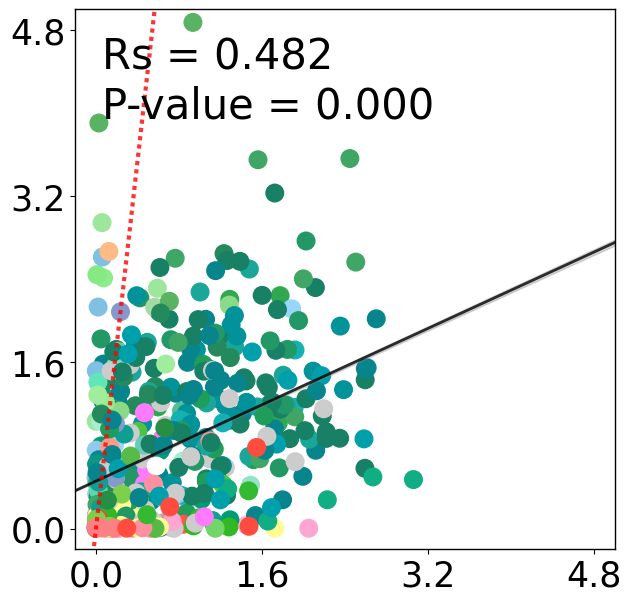

In [468]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
from matplotlib.ticker import FormatStrFormatter

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = data_id.set_index('id')['rgb_triplet'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []
ratios = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease_atlasID:
    if log_odds_wt > 0 and log_odds_app > 0:
        ratio = log_odds_app / log_odds_wt
        ratios.append(ratio)
        log_odds_ratios.append(log_odds_wt)
        hc_dam_diff_values.append(log_odds_app)
        
        # Subcluster Symbol に対応する色を取得し、colors に追加
        color = color_dict.get(neurotransmitter_type, '[0, 0, 0]')  # デフォルト色は黒 ('[0, 0, 0]')
        if isinstance(color, str):
            color = eval(color)  # '[R, G, B]' -> [R, G, B]
        color = tuple([c/255 for c in color])  # [R, G, B] -> (R/255, G/255, B/255)
        colors.append(color)

# Calculate threshold
threshold = np.sort(ratios)[::-1][int((len(ratios) * 0.1))]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# Set x-axis range
xlim_low = -0.2
xlim_high = 5.0
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Plot the threshold line in red with a finer dashed pattern
plt.plot(x_values, threshold * x_values, color='red', linewidth=3, alpha = 0.8, linestyle=(0, (1, 1)), )
print(f'Threshold: {threshold:.2f}')
# Set axis labels
plt.xlim(xlim_low, xlim_high)
plt.ylim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0.0, 1.6, 3.2 , 4.8])  # Set x-axis to 4 ticks
plt.yticks([0.0, 1.6, 3.2 , 4.8])  # Set y-axis to 4 ticks
# Set the tick formatter to show one decimal place
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
#plt.legend()
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTvsAPP_Microglia_decrease_Anatomical_region_with_threshold.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


Threshold: 10.32


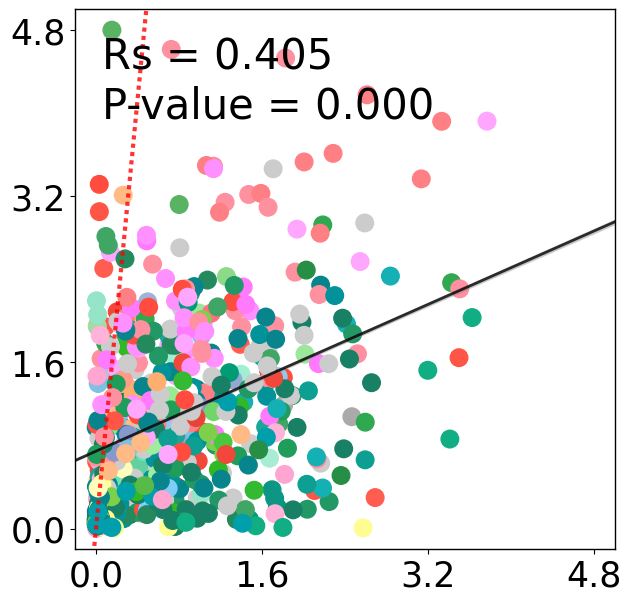

In [469]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr
from matplotlib.ticker import FormatStrFormatter

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# Subcluster Symbol に対する color_dict を使用
color_dict = data_id.set_index('id')['rgb_triplet'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []
ratios = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_neuron_decrease_atlasID:
    if log_odds_wt > 0 and log_odds_app > 0:
        ratio = log_odds_app / log_odds_wt
        ratios.append(ratio)
        log_odds_ratios.append(log_odds_wt)
        hc_dam_diff_values.append(log_odds_app)
        
        # Subcluster Symbol に対応する色を取得し、colors に追加
        color = color_dict.get(neurotransmitter_type, '[0, 0, 0]')  # デフォルト色は黒 ('[0, 0, 0]')
        if isinstance(color, str):
            color = eval(color)  # '[R, G, B]' -> [R, G, B]
        color = tuple([c/255 for c in color])  # [R, G, B] -> (R/255, G/255, B/255)
        colors.append(color)

# Calculate threshold
threshold = np.sort(ratios)[::-1][int((len(ratios) * 0.1))]

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)

# Set x-axis range
xlim_low = -0.2
xlim_high = 5.0
x_values = np.array([xlim_low, xlim_high])
regression_line = slope * x_values + intercept

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (x_values - np.mean(log_odds_ratios))**2 / np.sum((log_odds_ratios - np.mean(log_odds_ratios))**2))
ci = t * se

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios, hc_dam_diff_values, c=colors, alpha=1.0, s=160)

# Plot the regression line
plt.plot(x_values, regression_line, color='black', linewidth=2, alpha=0.8)

# Plot the confidence interval (error band)
plt.fill_between(x_values, regression_line - ci, regression_line + ci, color='gray', alpha=0.3)

# Plot the threshold line in red with a finer dashed pattern
plt.plot(x_values, threshold * x_values, color='red', linewidth=3, alpha = 0.8, linestyle=(0, (1, 1)), )
print(f'Threshold: {threshold:.2f}')
# Set axis labels
plt.xlim(xlim_low, xlim_high)
plt.ylim(xlim_low, xlim_high)

# Increase tick label font size and set the number of ticks to 4 with specific format
plt.tick_params(axis='both', which='major', labelsize=25)
plt.xticks([0.0, 1.6, 3.2 , 4.8])  # Set x-axis to 4 ticks
plt.yticks([0.0, 1.6, 3.2 , 4.8])  # Set y-axis to 4 ticks
# Set the tick formatter to show one decimal place
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Make the border of the plot thicker
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')
else:
    correlation, p_value_spearman = None, None

# Display the plot
#plt.legend()
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTvsAPP_Neuron_decrease_Anatomical_region_with_threshold.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [454]:
results_microglia_increase_atlasID

[(0.5542350664146003, 0.0, 59, 0.7406090251063263, 0.0),
 (0.046074502382777306,
  1.8286890946248215,
  35,
  0.04715242340151913,
  5.225719977038651),
 (1.8191172320968065,
  1.8913315750264228,
  7,
  5.16641253543384,
  5.628188738050029),
 (1.7250273279032764, 0.0, 66, 4.612674410220768, 0.0),
 (0.0, 0.0, 2, 0.0, 0.0),
 (0.5918409441225402,
  0.15837426444701674,
  17,
  0.8073125160713108,
  0.17160460261102464),
 (0.40854866314349964,
  0.01843752256099765,
  15,
  0.5046324711222494,
  0.01860854312837943),
 (0.7321632822740207,
  0.005389429736540536,
  20,
  1.0795744517439572,
  0.005403978838360877),
 (0.8780884188735205,
  0.07178628766976163,
  10,
  1.406295478120587,
  0.07442570150562784),
 (0.012678615392419237, 0.0, 36, 0.01275932979145064, 0.0),
 (0.090561719921982, 0.0, 27, 0.09478907585282119, 0.0),
 (0.13263286952479011,
  0.5342418887326319,
  50,
  0.14183072051573953,
  0.7061542970425057),
 (0.048179623975101275,
  0.5039550195020832,
  42,
  0.0493591284547

In [447]:
pvals_corrected

array([0.04137911, 0.52476616])

In [426]:
results

[(2.4572649572649574,
  (2.3572649572649573, 2.5572649572649575),
  0.033888398554374366,
  'Decrease Microglia'),
 (0.7471264367816092,
  (0.6471264367816092, 0.8471264367816091),
  0.7513545194074367,
  'Increase Microglia')]

In [404]:
results_microglia_decrease_atlasID

[(0.6449667483502693,
  0.07414057652210321,
  28,
  0.9059236531125209,
  0.07695818989221019),
 (0.766001004769233, 0.0, 36, 1.1511466052901569, 0.0),
 (0.21513032908643875,
  0.023767609196297716,
  20,
  0.24002349756480404,
  0.024052309896928123),
 (0.4656788372740194,
  0.04665290406373734,
  52,
  0.5930952743583272,
  0.04775827331885068),
 (0.0, 0.0, 58, 0.0, 0.0),
 (0.04444048562916573,
  0.07414057652210321,
  12,
  0.045442755991094326,
  0.07695818989221019),
 (0.0003775574744586475,
  0.009485815579285335,
  23,
  0.00037762875825290916,
  0.009530948522600205),
 (0.0, 0.14441771247112783, 59, 0.0, 0.15536661878801322),
 (0.6181944701915784,
  0.25119756222185,
  56,
  0.8555747200272968,
  0.28556403813223463),
 (0.03483116356939943,
  0.050212896763536165,
  50,
  0.035444873224252396,
  0.051494932416180465),
 (0.0, 0.0, 35, 0.0, 0.0),
 (0.9916366960278663,
  0.6703465407262049,
  6,
  1.69564281169188,
  0.9549146608124092),
 (0.0, 0.020033159704230516, 27, 0.0, 0.02

In [400]:
p_values

[0.026288575153125215, 0.5898177614091379]

In [401]:
pvals_corrected

array([0.05257715, 0.58981776])

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

# データフレームを使用して、Main cluster descriptionとMain cluster color codeの辞書を作成します
color_dict = color_annotation_csv.set_index('Main cluster description')['Main cluster color code'].to_dict()

# サイドカラー用のデータフレームを作成
row_colors = pd.Series([color_dict.get(neurotransmitter_type.replace("Hindbrain neurons/Spinal cord neurons","Hindbrain/spinal cord neurons"), '#FFFFFF') for neurotransmitter_type in neurotransmitter_types])

# プロットを作成
fig, ax = plt.subplots(figsize=(3, 5))

# 結果のループ処理
for i, (log_odds, neurotransmitter_type, outcome) in enumerate(results):
    # オッズ比に比例した円のサイズ
    size = log_odds * 100
    print(neurotransmitter_type)
    print(log_odds)
    # p値に基づく淵の太さ設定
    edge_width = 1 if p_values_corrected[i] < 0.05 else 0.0
    
    # 色の設定: log_oddsがnp.log(1 + 1)以下なら青、より大きいなら赤
    color = 'blue' if log_odds <= np.log(1 + 1) else 'red'
    
    # x軸の位置をカテゴリに応じて設定
    x_pos = ['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'].index(outcome)
    
    # 円の描画
    ax.scatter(x_pos, neurotransmitter_types.index(neurotransmitter_type), s=size, color=color, edgecolor='black', linewidth=edge_width)

# 右側にサイドカラーアノテーションを追加
for i, color in enumerate(row_colors):
    ax.add_patch(plt.Rectangle((5.5, i - 0.5), 0.1, 1, color=color, transform=ax.transData, clip_on=False))

# 軸の設定
ax.set_yticks(range(len(neurotransmitter_types)))
ax.set_yticklabels(neurotransmitter_types)
ax.set_xticks(range(6))
ax.set_xticklabels(['WT_Microglia_increase', 'APP_Microglia_increase','WT_Microglia_decrease', 'APP_Microglia_decrease', 'WT_Neuron_decrease', 'APP_Neuron_decrease'], rotation=45, ha='right')
ax.set_xlim(-0.5, 5.5)  # x軸の範囲を調整してスペースを確保
ax.set_ylim(-0.5, 10.5)  # x軸の範囲を調整してスペースを確保
#ax.set_title('Adjusted Odds Ratios with BH Corrected Significance')

# レイアウトの調整
plt.tight_layout()
plt.subplots_adjust(left=0.2, right=0.95, top=0.95, bottom=0.05)

# 透明な背景で保存
plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/WTandAPP_Main_cell_type.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


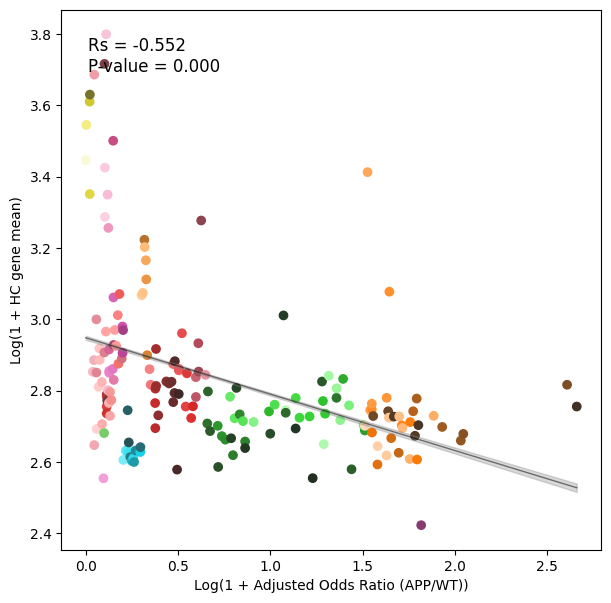

In [303]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Log(1 + Adjusted Odds Ratio (APP/WT))')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


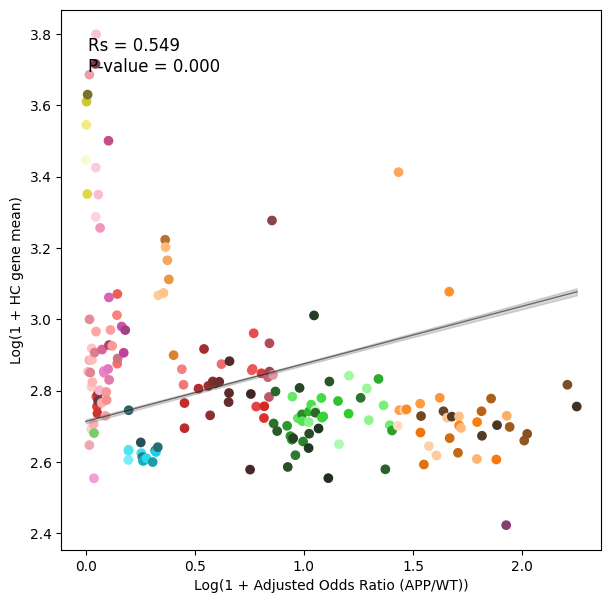

In [304]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Log(1 + Adjusted Odds Ratio (APP/WT))')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


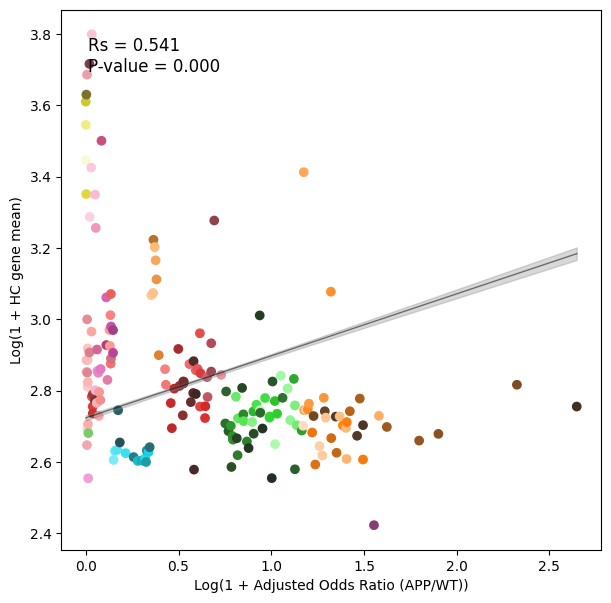

In [305]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Log(1 + Adjusted Odds Ratio (APP/WT))')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


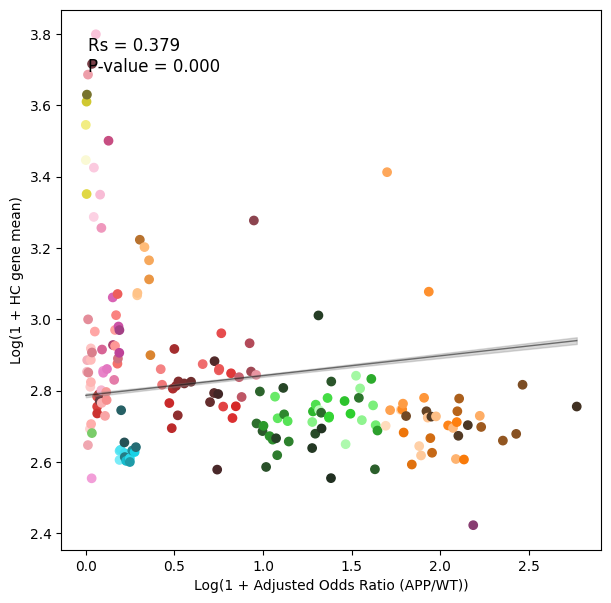

In [306]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Log(1 + Adjusted Odds Ratio (APP/WT))')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


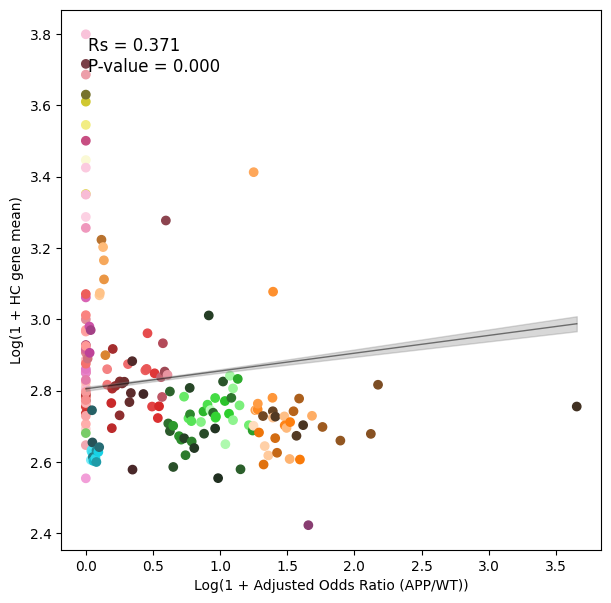

In [307]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_increase_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Log(1 + Adjusted Odds Ratio (APP/WT))')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


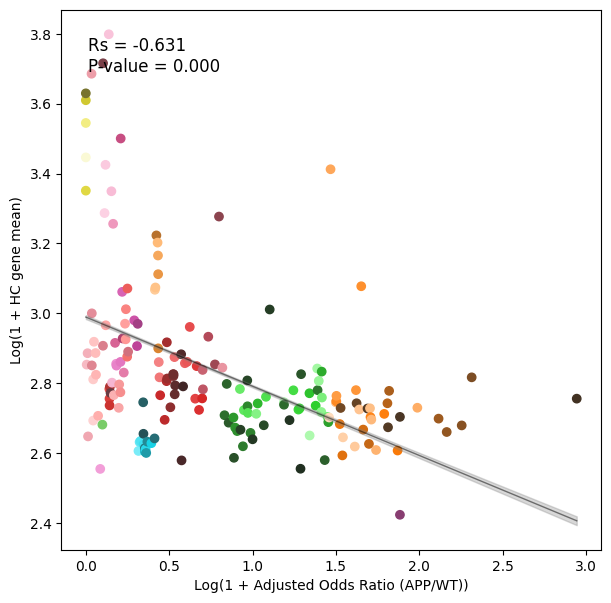

In [308]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_app)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Log(1 + Adjusted Odds Ratio (APP/WT))')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()


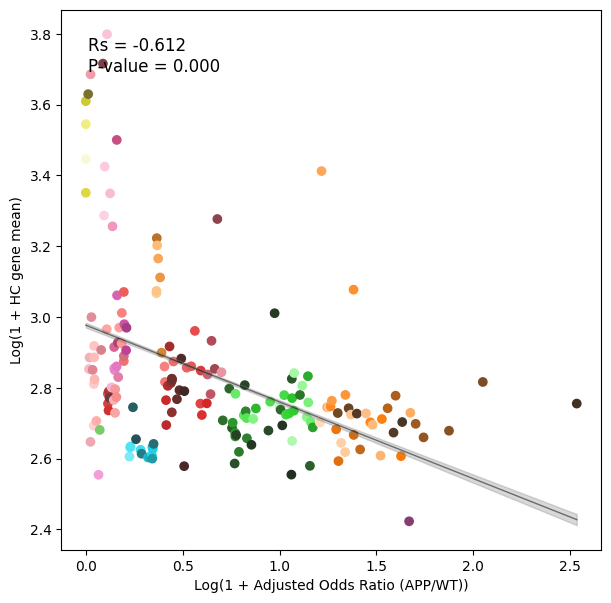

In [309]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr

# Subcluster Symbol に対する color_dict を使用
color_dict = color_annotation_csv.set_index('Subcluster Symbol')['Subcluster color code'].to_dict()

log_odds_ratios = []
hc_dam_diff_values = []
colors = []

for log_odds_app, log_odds_wt, neurotransmitter_type, _, _ in results_microglia_decrease_and_neuron_decrease:
    # score の取得 (Sub_molecular_cell_typeごとの最初の値を使用)
    hc_score = cell_joined_neuron.loc[cell_joined_neuron['Sub_molecular_cell_type'] == neurotransmitter_type, 
                                       'HC_score_near'].iloc[0]  # 最初の値を取得    
    
    log_odds_ratios.append(log_odds_wt)  # log1p for x-axis
    hc_dam_diff_values.append(hc_score)  # log1p for y-axis
    
    # Subcluster Symbol に対応する色を取得し、colors に追加
    color = f"#{color_dict.get(neurotransmitter_type, '000000')}"  # デフォルト色は黒 ('000000')
    if color == '000000':
        print("No color!")
    colors.append(color)

# Linear regression
slope, intercept, r_value, p_value_linreg, std_err = stats.linregress(log_odds_ratios, hc_dam_diff_values)
regression_line = np.array([slope * x + intercept for x in log_odds_ratios])

# Calculate error margins (95% confidence interval)
n = len(log_odds_ratios)
t = stats.t.ppf(1 - 0.025, df=n-2)  # 95% confidence interval, two-tailed t-distribution
se = std_err * np.sqrt(1/n + (np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2 / np.sum((np.array(log_odds_ratios) - np.mean(log_odds_ratios))**2))
ci = t * se

# ソートを行う
sorted_indices = np.argsort(log_odds_ratios)
log_odds_ratios_sorted = np.array(log_odds_ratios)[sorted_indices]
regression_line_sorted = regression_line[sorted_indices]
ci_sorted = ci[sorted_indices]

# Spearman correlation
log_odds_ratios_array = np.array(log_odds_ratios)
hc_dam_diff_values_array = np.array(hc_dam_diff_values)

# NaNを取り除く
valid_indices = ~(np.isnan(log_odds_ratios_array) | np.isnan(hc_dam_diff_values_array))
log_odds_ratios_array = log_odds_ratios_array[valid_indices]
hc_dam_diff_values_array = hc_dam_diff_values_array[valid_indices]

if len(log_odds_ratios_array) > 1:
    correlation, p_value_spearman = spearmanr(log_odds_ratios_array, hc_dam_diff_values_array)
else:
    correlation, p_value_spearman = None, None

# Create the scatter plot
plt.figure(figsize=(6, 6))
plt.scatter(log_odds_ratios_sorted, hc_dam_diff_values, c=colors, alpha=1.0)

# Plot the regression line
plt.plot(log_odds_ratios_sorted, regression_line_sorted, color='black', linewidth=1, alpha=0.5)

# Plot the confidence interval (error band)
plt.fill_between(log_odds_ratios_sorted, regression_line_sorted - ci_sorted, regression_line_sorted + ci_sorted, color='gray', alpha=0.3)

# Add labels and title
plt.xlabel('Ln(1 + Odds ratio of APP_Neuron_decrease)')
plt.ylabel('Log(1 + HC gene mean)')

# Add Spearman correlation to the plot
if correlation is not None:
    plt.text(0.05, 0.95, f'Rs = {correlation:.3f}\nP-value = {p_value_spearman:.3f}', 
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Display the plot
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('/export3/Imaging/ds4_Data5/mitani/Neurology/Fig.7/APP_neuron_decrease_vs_HC_score_Sub_cell_type_with_regression_and_spearman.pdf',
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()
